In [1]:
import sys
import os

# Get the root directory
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Add the root directory to the Python path
sys.path.append(root_dir)

In [2]:
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import OneCycleLR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from TINTOlib.igtd import IGTD
from kan import *
from tqdm import tqdm


import traceback
import time
import gc
import copy
import traceback
import cv2
import math
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch.nn as nn
import torch.optim as optim


if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")

print(device)

cuda


In [3]:
SEED = 381
# SET RANDOM SEED FOR REPRODUCIBILITY
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

# BEST 3.23

In [4]:
folder="data/treasury"
x_col=["1Y-CMaturityRate", "30Y-CMortgageRate", "3M-Rate-AuctionAverage", "3M-Rate-SecondaryMarket", "3Y-CMaturityRate", 
       "5Y-CMaturityRate", "bankCredit", "currency", "demandDeposits", "federalFunds", "moneyStock", "checkableDeposits", 
       "loansLeases", "savingsDeposits", "tradeCurrencies"]

target_col=["target"]

# Functions

### Load Dataset and Images

In [5]:
def load_and_clean(npy_filename, y_filename, x_col, target_col):
    """
    Load the feature array (npy_filename) and label array (y_filename),
    drop rows in the feature array that contain any NaNs, and apply
    the same mask to the label array.
    """
    # Load numpy arrays
    X = np.load(os.path.join(folder, npy_filename))
    y = np.load(os.path.join(folder, y_filename))
    
    # Ensure the number of rows matches between X and y
    if X.shape[0] != y.shape[0]:
        raise ValueError("The number of rows in {} and {} do not match.".format(npy_filename, y_filename))
    
    # Create a boolean mask for rows that do NOT have any NaN values in X
    valid_rows = ~np.isnan(X).any(axis=1)
    #print(valid_rows)
    # Filter both arrays using the valid_rows mask
    X_clean = X[valid_rows]
    y_clean = y[valid_rows]
    
    # Convert arrays to DataFrames
    df_X = pd.DataFrame(X_clean)
    df_y = pd.DataFrame(y_clean)
    df_X.columns = x_col
    df_y.columns = target_col
    return df_X, df_y

In [6]:
def load_and_preprocess_data(X_train, y_train, X_test, y_test, X_val, y_val, image_model, problem_type, batch_size=32):
    # Add target column to input for IGTD
    X_train_full = X_train.copy()
    X_train_full["target"] = y_train.values

    X_val_full = X_val.copy()
    X_val_full["target"] = y_val.values

    X_test_full = X_test.copy()
    X_test_full["target"] = y_test.values

    # Generate the images if the folder does not exist
    if not os.path.exists(f'{images_folder}/train'):
        image_model.fit_transform(X_train_full, f'{images_folder}/train')
        image_model.saveHyperparameters(f'{images_folder}/model.pkl')
    else:
        print("The images are already generated")

    # Load image paths
    imgs_train = pd.read_csv(os.path.join(f'{images_folder}/train', f'{problem_type}.csv'))
    imgs_train["images"] = images_folder + "/train/" + imgs_train["images"]

    if not os.path.exists(f'{images_folder}/val'):
        image_model.transform(X_val_full, f'{images_folder}/val')
    else:
        print("The images are already generated")

    imgs_val = pd.read_csv(os.path.join(f'{images_folder}/val', f'{problem_type}.csv'))
    imgs_val["images"] = images_folder + "/val/" + imgs_val["images"]

    if not os.path.exists(f'{images_folder}/test'):
        image_model.transform(X_test_full, f'{images_folder}/test')
    else:
        print("The images are already generated")

    imgs_test = pd.read_csv(os.path.join(f'{images_folder}/test', f'{problem_type}.csv'))
    imgs_test["images"] = images_folder + "/test/" + imgs_test["images"]

    # Image data
    X_train_img = np.array([cv2.imread(img) for img in imgs_train["images"]])
    X_val_img = np.array([cv2.imread(img) for img in imgs_val["images"]])
    X_test_img = np.array([cv2.imread(img) for img in imgs_test["images"]])

    # Create a MinMaxScaler object
    scaler = MinMaxScaler()

    # Scale numerical data
    X_train_num = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
    X_val_num = pd.DataFrame(scaler.transform(X_val), columns=X_val.columns)
    X_test_num = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

    attributes = len(X_train_num.columns)
    height, width, channels = X_train_img[0].shape
    imgs_shape = (channels, height, width)

    print("Images shape: ", imgs_shape)
    print("Attributes: ", attributes)

    # Convert data to PyTorch tensors
    X_train_num_tensor = torch.as_tensor(X_train_num.values, dtype=torch.float32)
    X_val_num_tensor = torch.as_tensor(X_val_num.values, dtype=torch.float32)
    X_test_num_tensor = torch.as_tensor(X_test_num.values, dtype=torch.float32)
    X_train_img_tensor = torch.as_tensor(X_train_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_val_img_tensor = torch.as_tensor(X_val_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    X_test_img_tensor = torch.as_tensor(X_test_img, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0
    y_train_tensor = torch.as_tensor(y_train.values, dtype=torch.float32).reshape(-1, 1)
    y_val_tensor = torch.as_tensor(y_val.values, dtype=torch.float32).reshape(-1, 1)
    y_test_tensor = torch.as_tensor(y_test.values, dtype=torch.float32).reshape(-1, 1)

    # Create DataLoaders
    train_dataset = TensorDataset(X_train_num_tensor, X_train_img_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_num_tensor, X_val_img_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_num_tensor, X_test_img_tensor, y_test_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

    return train_loader, val_loader, test_loader, attributes, imgs_shape

In [7]:
def complete_coordinate_and_xcol(coordinate, x_col):
    """
    Given a coordinate (tuple of row, col arrays) and x_col feature list,
    return completed coordinate and x_col including empty positions.

    Empty positions are filled with labels: 'Ex1', 'Ex2', ...
    """

    row_coords, col_coords = coordinate
    max_row = row_coords.max()
    max_col = col_coords.max()
    
    # All possible coordinate slots
    full_coords = set((r, c) for r in range(max_row + 1) for c in range(max_col + 1))
    current_coords = set(zip(row_coords, col_coords))
    missing_coords = sorted(full_coords - current_coords)

    # Create updated coordinate arrays
    new_row_coords = list(row_coords)
    new_col_coords = list(col_coords)
    new_x_col = list(x_col)

    for idx, (r, c) in enumerate(missing_coords):
        new_row_coords.append(r)
        new_col_coords.append(c)
        new_x_col.append(f"Ex{idx+1}")

    completed_coordinate = (np.array(new_row_coords), np.array(new_col_coords))
    return completed_coordinate, new_x_col

In [8]:
def plot_feature_mapping(x_col, coordinate, scale=(4,4)):
    grid = np.full(scale, "", dtype=object)
    rows, cols = coordinate
    for i, (r, c) in enumerate(zip(rows, cols)):
        if i < len(x_col):
            grid[r, c] = x_col[i]
        else:
            grid[r, c] = "?"
    
    plt.figure(figsize=(scale[1] * 2, scale[0] * 2))
    for i in range(scale[0]):
        for j in range(scale[1]):
            plt.text(j, i, grid[i, j], ha='center', va='center', fontsize=10,
                     bbox=dict(facecolor='white', edgecolor='gray'))
    
    plt.xticks(np.arange(scale[1]))
    plt.yticks(np.arange(scale[0]))
    plt.grid(True)
    plt.title("Feature → Pixel Mapping")
    plt.gca().invert_yaxis()  # So row 0 is at the top
    plt.show()

In [9]:
def combine_loader(loader):
    """
    Combines all batches from a DataLoader into three tensors.
    Assumes each batch is a tuple: (mlp_tensor, img_tensor, target_tensor)
    """
    mlp_list, img_list, target_list = [], [], []
    for mlp, img, target in loader:
        mlp_list.append(mlp)
        img_list.append(img)
        target_list.append(target)
    return torch.cat(mlp_list, dim=0), torch.cat(img_list, dim=0), torch.cat(target_list, dim=0)

### Functions for KAN

In [10]:
def average_rmse(output, val_target):
    """
    Computes the root mean squared error (RMSE) between output and val_target.

    Args:
        output (torch.Tensor): The predicted output tensor.
        val_target (torch.Tensor): The ground truth tensor.
    
    Returns:
        float: The RMSE value.
    """
    mse = torch.mean((output - val_target) ** 2)
    rmse = torch.sqrt(mse)
    return rmse.item()

In [11]:
def plot_training_RMSE(model, model_state, avg_rmse, train_loss, val_loss):
    model.load_state_dict(model_state)
    print(avg_rmse)
    plt.figure(figsize=(5, 4))
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.legend(['train', 'val'])
    plt.ylabel('RMSE')
    plt.xlabel('step')
    plt.yscale('log')

In [12]:
def plot_sorted_feature_importance(columns, importances):
    # Move to CPU and numpy if it's a GPU tensor
    if isinstance(importances, torch.Tensor):
        importances = importances.detach().cpu().numpy()

    # Pair columns and importances and sort by importance descending
    sorted_pairs = sorted(zip(columns, importances), key=lambda x: x[1], reverse=True)
    print(sorted_pairs)
    sorted_columns, sorted_importances = zip(*sorted_pairs)
    
    # Create the bar plot
    plt.figure(figsize=(6, 3))
    plt.barh(sorted_columns, sorted_importances, color='royalblue')
    plt.xlabel('Importance')
    plt.title('KAN Feature Importances')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [13]:
def custom_fit(model, dataset, opt="LBFGS", steps=100, log=1, lamb=0., lamb_l1=1., lamb_entropy=2., lamb_coef=0., lamb_coefdiff=0., update_grid=True, 
               grid_update_num=10, loss_fn=None, lr=1.,start_grid_update_step=-1, stop_grid_update_step=50, batch=-1,
            metrics=None, save_fig=False, in_vars=None, out_vars=None, beta=3, save_fig_freq=1, img_folder='./video', 
               singularity_avoiding=False, y_th=1000., reg_metric='edge_forward_spline_n', display_metrics=None):
    '''
    training

    Args:
    -----
        dataset : dic
            contains dataset['train_input'], dataset['train_label'], dataset['val_input'], dataset['val_label']
        opt : str
            "LBFGS" or "Adam"
        steps : int
            training steps
        log : int
            logging frequency
        lamb : float
            overall penalty strength
        lamb_l1 : float
            l1 penalty strength
        lamb_entropy : float
            entropy penalty strength
        lamb_coef : float
            coefficient magnitude penalty strength
        lamb_coefdiff : float
            difference of nearby coefficits (smoothness) penalty strength
        update_grid : bool
            If True, update grid regularly before stop_grid_update_step
        grid_update_num : int
            the number of grid updates before stop_grid_update_step
        start_grid_update_step : int
            no grid updates before this training step
        stop_grid_update_step : int
            no grid updates after this training step
        loss_fn : function
            loss function
        lr : float
            learning rate
        batch : int
            batch size, if -1 then full.
        save_fig_freq : int
            save figure every (save_fig_freq) steps
        singularity_avoiding : bool
            indicate whether to avoid singularity for the symbolic part
        y_th : float
            singularity threshold (anything above the threshold is considered singular and is softened in some ways)
        reg_metric : str
            regularization metric. Choose from {'edge_forward_spline_n', 'edge_forward_spline_u', 'edge_forward_sum', 'edge_backward', 'node_backward'}
        metrics : a list of metrics (as functions)
            the metrics to be computed in training
        display_metrics : a list of functions
            the metric to be displayed in tqdm progress bar

    Returns:
    --------
        results : dic
            results['train_loss'], 1D array of training losses (RMSE)
            results['val_loss'], 1D array of val losses (RMSE)
            results['reg'], 1D array of regularization
            other metrics specified in metrics
        best_model:
    '''

    if lamb > 0. and not model.save_act:
        print('setting lamb=0. If you want to set lamb > 0, set model.save_act=True')
        
    old_save_act, old_symbolic_enabled = model.disable_symbolic_in_fit(lamb)

    pbar = tqdm(range(steps), desc='description', ncols=100)

    if loss_fn == None:
        loss_fn = loss_fn_eval = lambda x, y: torch.mean((x - y) ** 2)
    else:
        loss_fn = loss_fn_eval = loss_fn

    grid_update_freq = int(stop_grid_update_step / grid_update_num)

    if opt == "Adam":
        optimizer = torch.optim.Adam(model.get_params(), lr=lr)
    elif opt == "LBFGS":
        optimizer = LBFGS(model.get_params(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32,
                          tolerance_change=1e-32,
                          tolerance_ys=1e-32)

    results = {}
    results['train_loss'] = []
    results['val_loss'] = []
    results['reg'] = []
    if metrics != None:
        for i in range(len(metrics)):
            results[metrics[i].__name__] = []

    if batch == -1 or batch > dataset['train_input'].shape[0]:
        batch_size = dataset['train_input'].shape[0]
        batch_size_val = dataset['val_input'].shape[0]
    else:
        batch_size = batch
        batch_size_val = batch

    global train_loss, reg_

    def closure():
        global train_loss, reg_
        optimizer.zero_grad()
        pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
        train_loss = loss_fn(pred, dataset['train_label'][train_id])
        if model.save_act:
            if reg_metric == 'edge_backward':
                model.attribute()
            if reg_metric == 'node_backward':
                model.node_attribute()
            reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
        else:
            reg_ = torch.tensor(0.)
        objective = train_loss + lamb * reg_
        objective.backward()
        return objective

    if save_fig:
        if not os.path.exists(img_folder):
            os.makedirs(img_folder)
    
    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')
    
    for epoch in pbar:
        
        if epoch == steps-1 and old_save_act:
            model.save_act = True
            
        if save_fig and epoch % save_fig_freq == 0:
            save_act = model.save_act
            model.save_act = True
        
        train_id = np.random.choice(dataset['train_input'].shape[0], batch_size, replace=False)
        val_id = np.random.choice(dataset['val_input'].shape[0], batch_size_val, replace=False)

        if epoch % grid_update_freq == 0 and epoch < stop_grid_update_step and update_grid and epoch >= start_grid_update_step:
            model.update_grid(dataset['train_input'][train_id])

        if opt == "LBFGS":
            optimizer.step(closure)

        if opt == "Adam":
            pred = model.forward(dataset['train_input'][train_id], singularity_avoiding=singularity_avoiding, y_th=y_th)
            train_loss = loss_fn(pred, dataset['train_label'][train_id])
            if model.save_act:
                if reg_metric == 'edge_backward':
                    model.attribute()
                if reg_metric == 'node_backward':
                    model.node_attribute()
                reg_ = model.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_ = torch.tensor(0.)
            loss = train_loss + lamb * reg_
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        val_loss = loss_fn_eval(model.forward(dataset['val_input'][val_id]), dataset['val_label'][val_id])
        
        
        if metrics != None:
            for i in range(len(metrics)):
                results[metrics[i].__name__].append(metrics[i]().item())

        if val_loss < best_loss:
            best_epoch = epoch
            best_loss = val_loss
            best_model_state = copy.deepcopy(model.state_dict())
        
        results['train_loss'].append(torch.sqrt(train_loss).cpu().detach().numpy())
        results['val_loss'].append(torch.sqrt(val_loss).cpu().detach().numpy())
        results['reg'].append(reg_.cpu().detach().numpy())

        if epoch % log == 0:
            if display_metrics == None:
                pbar.set_description("| train_loss: %.2e | val_loss: %.2e | reg: %.2e | " % (torch.sqrt(train_loss).cpu().detach().numpy(), torch.sqrt(val_loss).cpu().detach().numpy(), reg_.cpu().detach().numpy()))
            else:
                string = ''
                data = ()
                for metric in display_metrics:
                    string += f' {metric}: %.2e |'
                    try:
                        results[metric]
                    except:
                        raise Exception(f'{metric} not recognized')
                    data += (results[metric][-1],)
                pbar.set_description(string % data)
                
        
        if save_fig and epoch % save_fig_freq == 0:
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title="Step {}".format(_), beta=beta)
            plt.savefig(img_folder + '/' + str(_) + '.jpg', bbox_inches='tight', dpi=200)
            plt.close()
            model.save_act = save_act

    model.log_history('fit')
    # revert back to original state
    model.symbolic_enabled = old_symbolic_enabled
    print(f"Best epoch: {best_epoch} ")
    return best_model_state, results, best_epoch

### Grad CAM Functions

In [14]:
def grad_cam_side_by_side(model, model_state, num_input, img_input, x_col, coordinate,
                          zoom=1, target_index=None, save_path=None, show=True):
    model.load_state_dict(model_state)
    model.eval()
    model.zero_grad()

    if num_input.dim() == 1:
        num_input = num_input.unsqueeze(0)
    if img_input.dim() == 3:
        img_input = img_input.unsqueeze(0)

    num_input = num_input.to(model.device)
    img_input = img_input.to(model.device)

    # Store activations and gradients
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations["value"] = output.detach()

    def backward_hook(module, grad_input, grad_output):
        gradients["value"] = grad_output[0].detach()

    conv_layer = model.cnn_branch[0]
    h_fwd = conv_layer.register_forward_hook(forward_hook)
    h_bwd = conv_layer.register_full_backward_hook(backward_hook)

    output = model(num_input, img_input)
    target = output if target_index is None else output[:, target_index]
    target.backward()

    act = activations["value"].squeeze(0)
    grad = gradients["value"].squeeze(0)
    weights = grad.mean(dim=(1, 2))
    cam = torch.zeros_like(act[0])
    for i, w in enumerate(weights):
        cam += w * act[i]

    cam = torch.relu(cam)
    if cam.max() > 0:
        cam -= cam.min()
        cam /= cam.max()
    else:
        cam[:] = 0.0


    cam_resized = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=img_input.shape[-2:], mode='bilinear', align_corners=False)
    #print(cam_resized)
    heatmap = cam_resized.squeeze().cpu()

    img_disp = img_input.squeeze().detach().cpu()
    if img_disp.shape[0] == 1:
        img_disp = img_disp[0]
        cmap = 'gray'
    else:
        img_disp = img_disp.permute(1, 2, 0)
        cmap = None

    h, w = img_disp.shape[:2]

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(img_disp, cmap=cmap)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    im = axs[1].imshow(img_disp, cmap=cmap)
    heatmap_img = axs[1].imshow(heatmap, cmap='jet', alpha=0.5)
    axs[1].set_title("Grad-CAM")
    axs[1].axis('off')

    # Add colorbar (legend)
    cbar = fig.colorbar(heatmap_img, ax=axs[1], fraction=0.046, pad=0.04)
    cbar.set_label("Grad-CAM Intensity", fontsize=10)

    # Overlay abbreviated features
    for i, col in enumerate(x_col):
        abbrev = col.split("-")[0][:8]
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < h and cx < w:
                axs[1].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))
                axs[0].text(cx, ry, abbrev,
                            color='white', fontsize=9, ha='center', va='center',
                            bbox=dict(facecolor='black', edgecolor='none', pad=1.0, alpha=0.4))

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    if show:
        plt.show()
    else:
        plt.close()

    h_fwd.remove()
    h_bwd.remove()

    return heatmap

In [15]:
def heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom=1):
    """
    Map heatmap pixel intensities to their corresponding features using coordinate and zoom.
    Returns a dictionary of {feature_name: relevance_score}.
    """
    feature_scores = {}

    for i, col in enumerate(x_col):
        if i < len(coordinate[0]):
            r, c = coordinate[0][i], coordinate[1][i]
            ry = r * zoom + zoom // 2
            cx = c * zoom + zoom // 2
            if ry < heatmap.shape[0] and cx < heatmap.shape[1]:
                feature_scores[col] = heatmap[ry, cx].item()

    return feature_scores

def plot_feature_relevance_bar(feature_scores):
    """
    Plots a horizontal bar chart of feature relevance from Grad-CAM heatmap.
    """
    sorted_scores = sorted(feature_scores.items(), key=lambda item: item[1], reverse=True)
    print(sorted_scores)
    features, scores = zip(*sorted_scores)

    plt.figure(figsize=(6, 3))
    plt.barh(features, scores, color='royalblue')
    plt.xlabel("Grad-CAM Relevance")
    plt.title("Feature Relevance for Test")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [16]:
def compute_avg_feature_relevance_from_val(model, model_state, val_inputs, val_imgs, coordinate, x_col, zoom=1):
    """
    Computes average Grad-CAM feature relevance over all validation instances with a tqdm progress bar.

    Args:
        model: Trained model
        model_state: Trained weights to be loaded
        val_inputs: List or tensor of numerical inputs
        val_imgs: List or tensor of image inputs
        coordinate: IGTD-style coordinate tuple (row array, col array)
        x_col: List of feature names (including extras)
        zoom: Zoom level used when generating the images

    Returns:
        Dictionary of average feature relevance
    """
    accumulated_scores = {feature: [] for feature in x_col}

    for num_input, img_input in tqdm(zip(val_inputs, val_imgs), total=len(val_inputs), desc="Computing Grad-CAM"):
        heatmap = grad_cam_side_by_side(
            model=model,
            model_state=model_state,
            num_input=num_input,
            img_input=img_input,
            coordinate=coordinate,
            x_col=x_col,
            zoom=zoom,
            show=False
        )
        scores = heatmap_to_feature_relevance(heatmap, coordinate, x_col, zoom)
        for feature, value in scores.items():
            accumulated_scores[feature].append(value)

    # Compute average
    avg_scores = {feature: float(np.mean(values)) if values else 0.0
                  for feature, values in accumulated_scores.items()}

    return avg_scores


def plot_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom=1):
    """
    Combines all steps: compute average relevance and plot.
    """
    avg_scores = compute_avg_feature_relevance_from_val(model, val_inputs, val_imgs, coordinate, x_col, zoom)
    plot_feature_relevance_bar(avg_scores)
    return avg_scores

### CNN Functions

In [17]:
def fit_cnn_only_model(model, dataset, steps=100, lr=1.0, loss_fn=None, batch=-1, opt="LBFGS"):
    """
    Trains a CNN-only model using LBFGS.

    Args:
        model: CNN-only PyTorch model.
        dataset: Dictionary with keys: 'train_img', 'train_label', 'val_img', 'val_label'.
        steps: Number of training iterations.
        lr: Learning rate.
        loss_fn: Loss function. Defaults to MSE.

    Returns:
        results: Dict with lists of train/val losses.
        best_model_state: Best weights based on val loss.
    """
    device = model.device
    if loss_fn is None:
        loss_fn = nn.MSELoss()

    # Optimizer selection
    if opt == "LBFGS":
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    elif opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    else:
        raise ValueError(f"Unsupported optimizer '{opt}'")

    n_train = dataset["train_img"].shape[0]
    n_val = dataset["val_img"].shape[0]
    batch_size = n_train if batch == -1 or batch > n_train else batch

    results = {'train_loss': [], 'val_loss': []}
    best_model_state = None
    best_loss = float("inf")
    best_epoch = -1

    pbar = tqdm(range(steps), desc="Training CNN Only ({opt})", ncols=100)

    for step in pbar:
        train_idx = np.random.choice(n_train, batch_size, replace=False)
        #train_idx = torch.randperm(n_train)[:min(32, n_train)]  # small batch
        x_train = dataset["train_img"][train_idx].to(device)
        y_train = dataset["train_label"][train_idx].to(device)
        if opt == "LBFGS":
            def closure():
                optimizer.zero_grad()
                output = model(0, x_train)
                loss = loss_fn(output, y_train)
                loss.backward()
                return loss
            optimizer.step(closure)
            train_loss = closure().item()

        else:  # AdamW
            optimizer.zero_grad()
            output = model(0, x_train)
            loss = loss_fn(output, y_train)
            loss.backward()
            optimizer.step()
            train_loss = loss.item()

        with torch.no_grad():
            val_output = model(0, dataset["val_img"].to(device))
            val_loss = loss_fn(val_output, dataset["val_label"].to(device)).item()

        results["train_loss"].append(train_loss)
        results["val_loss"].append(val_loss)

        if val_loss < best_loss:
            best_loss = val_loss
            best_epoch = step
            best_model_state = copy.deepcopy(model.state_dict())

        pbar.set_description(f"| Train: {train_loss:.4e} | Val: {val_loss:.4e} |")

    print(f"✅ Best validation loss: {best_loss:.4e} at {best_epoch} epoch")
    return best_model_state, results, best_epoch

In [18]:
def build_custom_cnn_model(cnn_blocks, dense_layers, imgs_shape, device='cuda'):
    class CustomCNNModel(nn.Module):
        def __init__(self):
            super(CustomCNNModel, self).__init__()
            self.device = device

            cnn_layers = []
            in_channels = imgs_shape[0]
            out_channels = 16
            cnn_blocks_list = [8, 6, 5]
            size_layer_norm = cnn_blocks_list[cnn_blocks-1]
            
            f_layer_size = 10 - cnn_blocks*2
            for i in range(cnn_blocks):
                cnn_layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2))
                
                if i < cnn_blocks - 1:
                    cnn_layers.append(nn.BatchNorm2d(out_channels))
                    cnn_layers.append(nn.ReLU())
                    cnn_layers.append(nn.MaxPool2d(2))
                else:
                    # Last block: LayerNorm + Sigmoid + Flatten
                    cnn_layers.append(nn.LayerNorm([out_channels, size_layer_norm, size_layer_norm]))
                    cnn_layers.append(nn.Sigmoid())
                    cnn_layers.append(nn.Flatten())
                in_channels = out_channels
                out_channels *= 2

            self.cnn_branch = nn.Sequential(*cnn_layers).to(device)
            self.flat_size = self._get_flat_size(imgs_shape)

            # Dense (FC) layers
            fc_layers = []
            input_dim = self.flat_size
            for i in range(dense_layers - 1):
                fc_layers.append(nn.Linear(int(input_dim), int(input_dim // 2)))
                fc_layers.append(nn.ReLU())
                input_dim = input_dim // 2
            fc_layers.append(nn.Linear(int(input_dim), 1))

            self.fc = nn.Sequential(*fc_layers).to(device)

        def _get_flat_size(self, imgs_shape):
            dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
            x = self.cnn_branch(dummy_input)
            return x.shape[1]

        def forward(self, num_input, img_input):
            img_input = img_input.to(self.device)
            features = self.cnn_branch(img_input)
            output = self.fc(features)
            return output

    return CustomCNNModel()

### Hybrid Functions

In [17]:
def print_mkan_vs_cnn_relevance(feature_scores, mkan_len):
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()
    m_kan_relevance_perct = float(mkan_relevance/(mkan_relevance+cnn_relevance))
    cnn_relevance_perct = float(cnn_relevance/(mkan_relevance+cnn_relevance))
    print(f"M_KAN Relevance: {m_kan_relevance_perct}")
    print(f"CNN Relevance: {cnn_relevance_perct}")

In [18]:
def plot_mkan_vs_cnn_relevance(feature_scores, mkan_len=6, title="Feature Relevance Split"):
    """
    Plots a pie chart comparing the total feature relevance from m_kan output vs CNN output.

    Args:
        feature_scores (torch.Tensor or list): 1D tensor of relevance values from final_kan.
        mkan_len (int): Number of dimensions from m_kan (default: 6).
        title (str): Title for the pie chart.
    """
    if isinstance(feature_scores, torch.Tensor):
        feature_scores = feature_scores.detach().cpu().numpy()

    mkan_relevance = feature_scores[:mkan_len].sum()
    cnn_relevance = feature_scores[mkan_len:].sum()

    sizes = [mkan_relevance, cnn_relevance]
    labels = ['m_kan Output', 'CNN Output']
    explode = (0.05, 0)  # Slightly explode m_kan slice for emphasis

    plt.figure(figsize=(3, 3))
    plt.pie(sizes, labels=labels, explode=explode, autopct='%1.1f%%',
            shadow=True, startangle=140, colors=["#66c2a5", "#fc8d62"])
    plt.title(title)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

In [95]:
def fit_hybrid_dataloaders(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.m_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.m_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.m_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.m_kan.disable_symbolic_in_fit(lamb)
        f_old_save_act, f_old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}

    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val_inner = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val_inner += model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()

            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            
            model.m_kan.update_grid(mlp_batch)
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)
            #concatenated = torch.cat((mlp_batch, cnn_output), dim=1)
            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.m_kan, "save_act") and model.m_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.m_kan.attribute()
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.m_kan.node_attribute()
                    model.final_kan.node_attribute()
                reg_val = model.m_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
                if sum_f_reg:
                    reg_val += model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()

        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['train_loss'].append(torch.sqrt(loss_val.detach()).item())
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())

        if eval_loss < best_loss:
            best_epoch = step
            best_loss = eval_loss
            best_model_state = copy.deepcopy(model.state_dict())

        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            desc = ""
            data = []
            for metric in display_metrics:
                desc += f" {metric}: %.2e |"
                data.append(results[metric.__name__][-1])
            pbar.set_description(desc % tuple(data))

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.m_kan, "save_act", False)
            model.m_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.m_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.m_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.m_kan, "log_history"):
        model.m_kan.log_history('fit')
    print(f"Best epoch {best_epoch}")
    return best_model_state, results, best_epoch

In [55]:
import traceback

def try_create_model(model_class, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha):
    try:
        model = model_class(attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha)
        
        # Test the model with a sample input
        num_input = torch.randn(4, attributes)
        img_input = torch.randn(4, *imgs_shape)
        output = model(num_input, img_input)
        
        print(f"Successfully created and tested {model_class.__name__}")
        
        return model
    except Exception as e:
        print(f"Error creating or testing {model_class.__name__}:")
        traceback.print_exc()
        return None

In [21]:
def cnn_branch_relevance(model, best_model_state):
    avg_scores = compute_avg_feature_relevance_from_val(
        model=model,
        model_state=best_model_state,
        val_inputs=dataset["test_input"],
        val_imgs=dataset["test_img"],
        coordinate=completed_coordinate,
        x_col=completed_x_col,
        zoom=2
    )
    plot_feature_relevance_bar(avg_scores)

In [97]:
def train_and_plot_relevance(model_class, kan_neurons, kan_grid, cnn_bottleneck_dim, lamb, steps, alpha=1.0, n_kan_len=None, cnn_fit_epochs=10):
    torch.cuda.empty_cache()
    gc.collect()
    model = try_create_model(model_class, attributes, imgs_shape, kan_neurons=kan_neurons, kan_grid=kan_grid, cnn_bottleneck_dim=cnn_bottleneck_dim, alpha=alpha)
    best_model_state, metrics3, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", lamb=lamb, steps=steps)
    plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['eval_loss'])
    if not n_kan_len:
        n_kan_len = kan_neurons
    print_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=n_kan_len)
    #plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=kan_neurons)
    plot_sorted_feature_importance(x_col, model.m_kan.feature_score)
    
    cnn_branch_relevance(model, best_model_state)

### Models Class

In [22]:
class Model3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model3, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [23]:
class Model4(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, device=device):
        super(Model4, self).__init__()

        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 6, 6]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Middle KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )
        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)
        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            device=device
        )
        
        self.device = device

    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

### Models Class Hybrids

In [26]:
class Model3_0(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha=1.0, device=device):
        super(Model3_0, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, 1).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[2, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [27]:
class Model3_1(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha=1.0, device=device):
        super(Model3_1, self).__init__()

        self.device = device

        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Dummy pass to get flattened size
        self.flat_size = self._get_flat_size(imgs_shape)

        # Bottleneck layer
        self.cnn_bottleneck = nn.Linear(self.flat_size, cnn_bottleneck_dim).to(device)

        # KAN branch
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Final KAN layer
        self.final_kan = KAN(
            width=[cnn_bottleneck_dim + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

    def _get_flat_size(self, imgs_shape):
        dummy_input = torch.zeros(1, *imgs_shape, device=self.device)
        x = self.cnn_branch(dummy_input)
        return x.shape[1]

    def get_concat_output(self, mlp_input, cnn_input):
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)

        conv_out = self.cnn_branch(cnn_input)
        cnn_output = self.cnn_bottleneck(conv_out)

        kan_output = self.m_kan(kan_input)

        return torch.cat((kan_output, cnn_output), dim=1)

    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [28]:
class Model3_2(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha=1.0, device=device):
        super(Model3_2, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)
        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device
        self.alpha = alpha


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input)  # Process image input
        cnn_output = cnn_output * self.alpha
        kan_output = self.m_kan(kan_input)  # Process numerical input
        
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [51]:
class Model3_3(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, cnn_bottleneck_dim, alpha=1.0, device=device):
        super(Model3_3, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),                                            # out: 16 x 4 x 4
            
            nn.Conv2d(16, 32, kernel_size=3, padding=2),                # out: 32 x 5 x 5
            nn.LayerNorm([32, 7, 7]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Final KAN layers
        self.m_kan = KAN(
            width=[attributes, kan_neurons],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        # Final MLP layers
        self.final_kan = KAN(
            width=[self.flat_size + kan_neurons, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input, alpha, betha):
        # Ensure inputs are moved to the correct device
        kan_input = mlp_input.to(self.device)
        cnn_input = cnn_input.to(self.device)
        
        cnn_output = self.cnn_branch(cnn_input) * alpha
        kan_output = self.m_kan(kan_input)  * betha
        return torch.cat((kan_output, cnn_output), dim=1)

    
    def forward(self, mlp_input, cnn_input, alpha=1.0, betha=1.0):
        concat_output = self.get_concat_output(mlp_input, cnn_input, alpha, betha)
        return self.final_kan(concat_output)

# Load Dataset and Images

In [29]:
X_train, y_train = load_and_clean('N_train.npy', 'y_train.npy',x_col, target_col)
X_test, y_test   = load_and_clean('N_test.npy',  'y_test.npy', x_col, target_col)
X_val, y_val     = load_and_clean('N_val.npy',   'y_val.npy', x_col, target_col)

In [30]:
# Get the shape of the dataframe
num_columns = X_train.shape[1]

# Calculate number of columns - 1
columns_minus_one = num_columns - 1

# Calculate the square root for image size
image_size = math.ceil(math.sqrt(columns_minus_one))
print(image_size)

4


In [31]:
dataset_name = 'treasury'
#Select the model and the parameters
problem_type = "regression"
image_model = IGTD(problem=problem_type, 
                   scale=[image_size,image_size],
                   fea_dist_method='Euclidean',
                   image_dist_method='Euclidean',
                   error='abs',
                   max_step=30000,
                   val_step=300,
                   zoom=2,
                   random_seed=SEED)

name = f"IGTD_{image_size}x{image_size}_fEuclidean_iEuclidean_abs"

#Define the dataset path and the folder where the images will be saved
images_folder = f"HyNNImages/Regression2/{dataset_name}/images_{dataset_name}_{name}"

In [32]:
train_loader, val_loader, test_loader, attributes, imgs_shape = load_and_preprocess_data(
    X_train, y_train, X_test, y_test, X_val, y_val,
    image_model=image_model,
    problem_type=problem_type,
    batch_size=16
)

The images are already generated
The images are already generated
The images are already generated
Images shape:  (3, 8, 8)
Attributes:  15


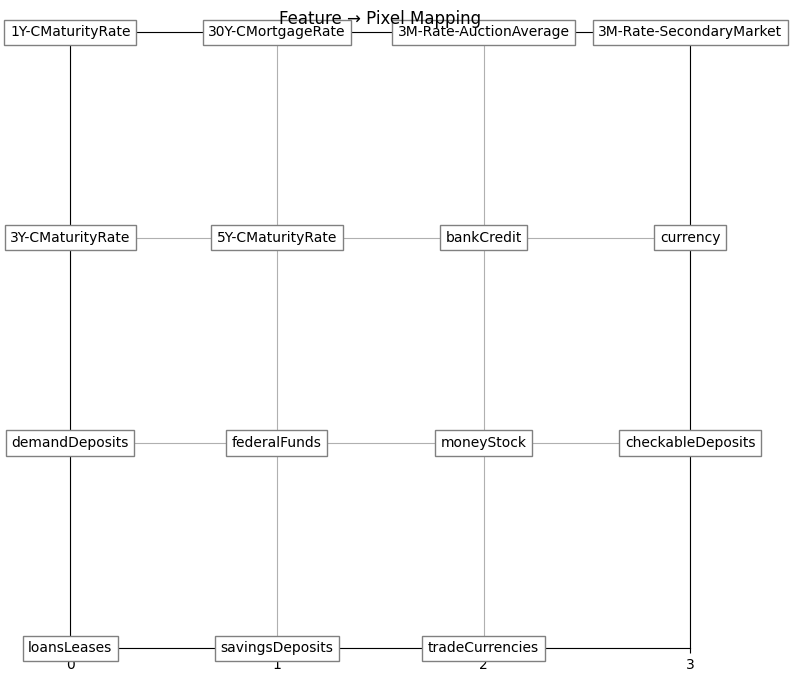

In [33]:
if hasattr(image_model, 'coordinate'):
    coordinates = image_model.coordinate
else:
    coordinates = (np.array([0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3]),
                 np.array([0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2]))

plot_feature_mapping(x_col, coordinates, scale=[4, 4])

In [34]:
# Combine dataloaders into tensors.
train_mlp, train_img, train_target = combine_loader(train_loader)
val_mlp, val_img, val_target = combine_loader(val_loader)
test_mlp, test_img, test_target = combine_loader(test_loader)

dataset = {
    "train_input": train_mlp.to(device),
    "train_img": train_img.to(device),
    "train_label": train_target.to(device),
    "val_input": val_mlp.to(device),
    "val_img": val_img.to(device),
    "val_label": val_target.to(device),
    "test_input": test_mlp.to(device),
    "test_img": test_img.to(device),
    "test_label": test_target.to(device),
}

In [35]:
# Print the shapes of the tensors
print("Train data shape:", dataset['train_input'].shape)
print("Train target shape:", dataset['train_label'].shape)
print("Test data shape:", dataset['test_input'].shape)
print("Test target shape:", dataset['test_label'].shape)
print("Validation data shape:", dataset['val_input'].shape)
print("Validation target shape:", dataset['val_label'].shape)

Train data shape: torch.Size([671, 15])
Train target shape: torch.Size([671, 1])
Test data shape: torch.Size([210, 15])
Test target shape: torch.Size([210, 1])
Validation data shape: torch.Size([168, 15])
Validation target shape: torch.Size([168, 1])


In [36]:
completed_coordinate, completed_x_col = complete_coordinate_and_xcol(coordinates, x_col)

# KAN training ✅ Top 2 Configurations

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.09e+00 | val_loss: 3.12e+00 | reg: 3.06e+01 | : 100%|█| 40/40 [00:11<00:00,  3.51it/

saving model version 0.1
Best epoch: 32 
3.232741117477417


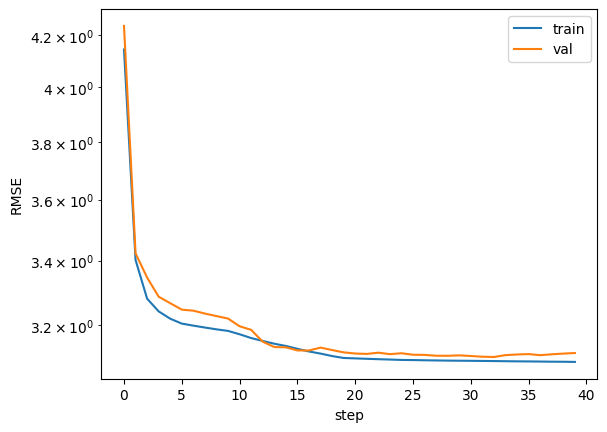

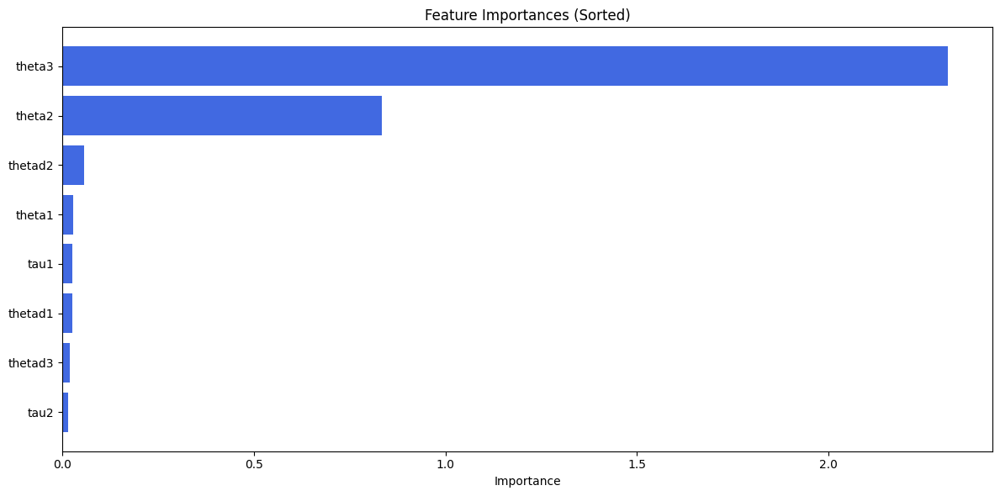

In [33]:
model = KAN(width=[attributes, 2, 1], grid=4, k=3, seed=381, device=device)
best_model_state, results, _  = custom_fit(model, dataset, opt="LBFGS", steps=40, lamb=1e-05)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input']), dataset['test_label']), results['train_loss'], results['val_loss'])
plot_sorted_feature_importance(x_col, model.feature_score)

### 1. width=[8, 2, 1], grid=4, lamb=1e-05 | best_epoch=32 | loss=3.22794

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.09e+00 | val_loss: 3.11e+00 | reg: 3.18e+01 | : 100%|█| 40/40 [00:12<00:00,  3.29it/


saving model version 0.1
Best epoch: 31 
3.2312042713165283


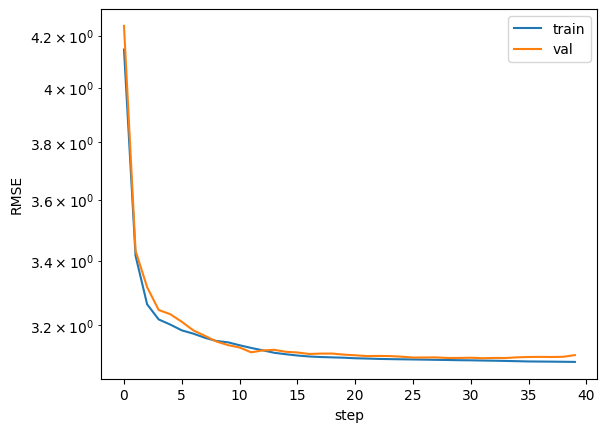

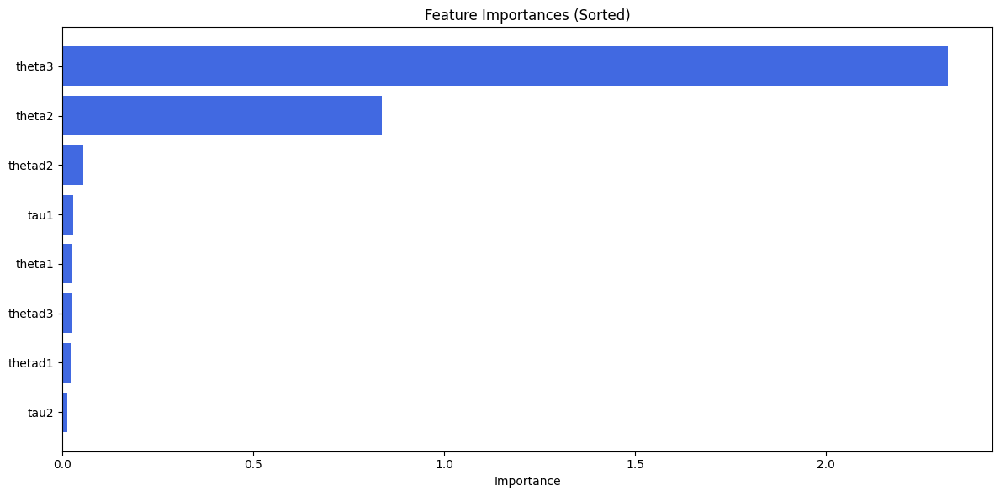

In [32]:
model = KAN(width=[attributes, 2, 1], grid=4, k=3, seed=381, device=device)
best_model_state, results, _  = custom_fit(model, dataset, opt="LBFGS", steps=40, lamb=1e-05)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input']), dataset['test_label']), results['train_loss'], results['val_loss'])
plot_sorted_feature_importance(x_col, model.feature_score)

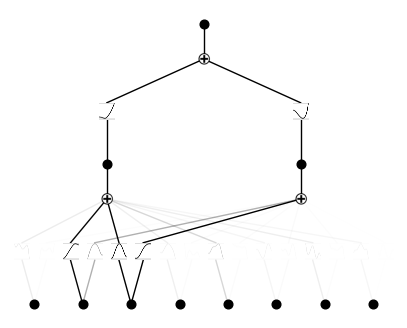

In [43]:
model.plot()

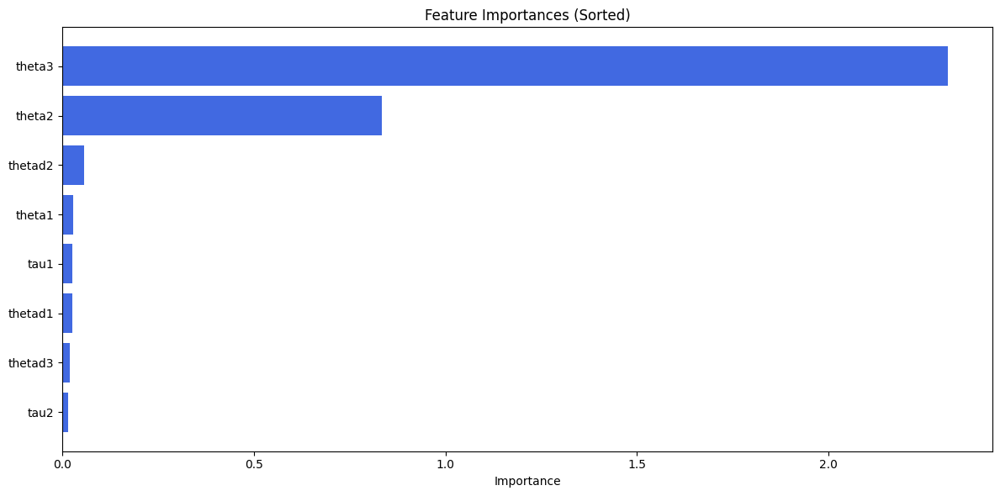

In [44]:
plot_sorted_feature_importance(x_col, model.feature_score)

### 2. width=[8, 3, 1], grid=5, lamb=0.0001 | best_epoch=19 | loss=3.23315

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.08e+00 | val_loss: 3.10e+00 | reg: 4.68e+01 | : 100%|█| 40/40 [00:56<00:00,  1.40s/i


saving model version 0.1
Best epoch: 28 
3.254410982131958


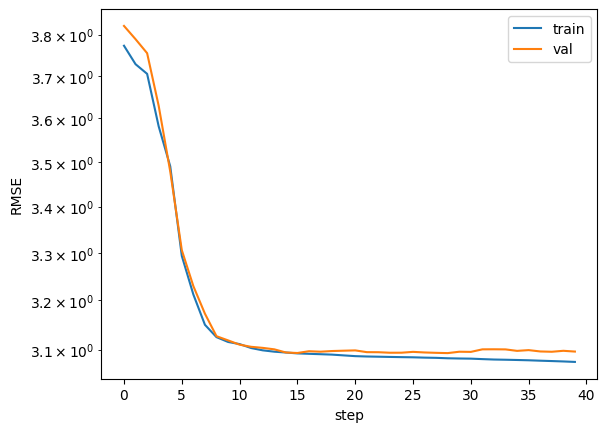

In [35]:
model = KAN(width=[attributes, 3, 1], grid=5, k=3, seed=381, device=device)
best_model_state, results, best_epoch  = custom_fit(model, dataset, opt="LBFGS", steps=40, lamb=0.0001)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input']), dataset['test_label']), results['train_loss'], results['val_loss'])

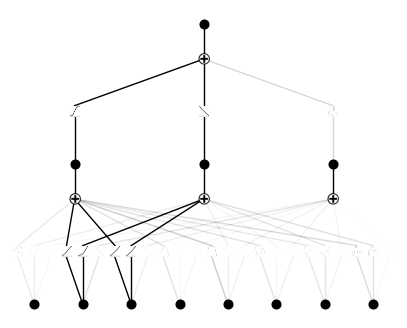

In [36]:
model.plot()

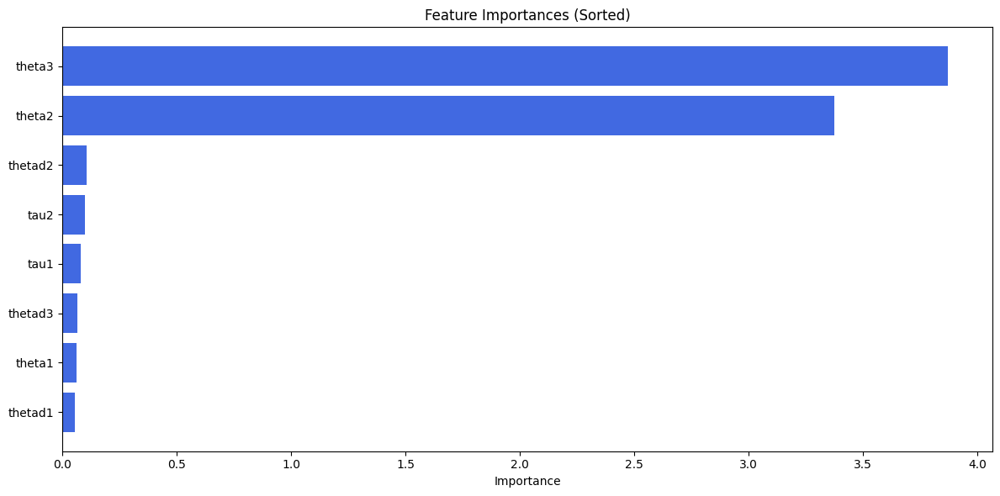

In [37]:
plot_sorted_feature_importance(x_col, model.feature_score)

# CNN training ✅ Top 2 Configurations

### 1. cnn_blocks=1, dense_layers=1 | best_epoch=18 | loss=3.22069

In [47]:
build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)

CustomCNNModel(
  (cnn_branch): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
    (1): LayerNorm((16, 8, 8), eps=1e-05, elementwise_affine=True)
    (2): Sigmoid()
    (3): Flatten(start_dim=1, end_dim=-1)
  )
  (fc): Sequential(
    (0): Linear(in_features=1024, out_features=1, bias=True)
  )
)

| Train: 8.9853e+00 | Val: 1.0173e+01 |: 100%|████████████████████| 100/100 [00:37<00:00,  2.68it/s]


✅ Best validation loss: 9.5183e+00 at 22 epoch
3.311112880706787


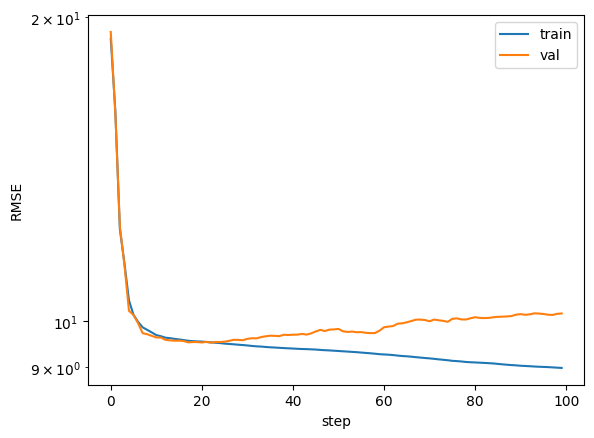

In [38]:
model = build_custom_cnn_model(cnn_blocks=1, dense_layers=1, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=100)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

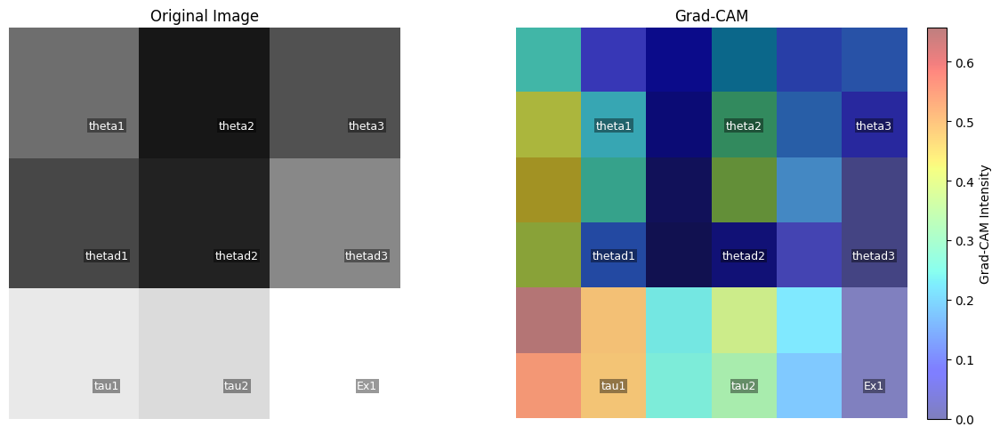

In [39]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:11<00:00,  4.41it/s]


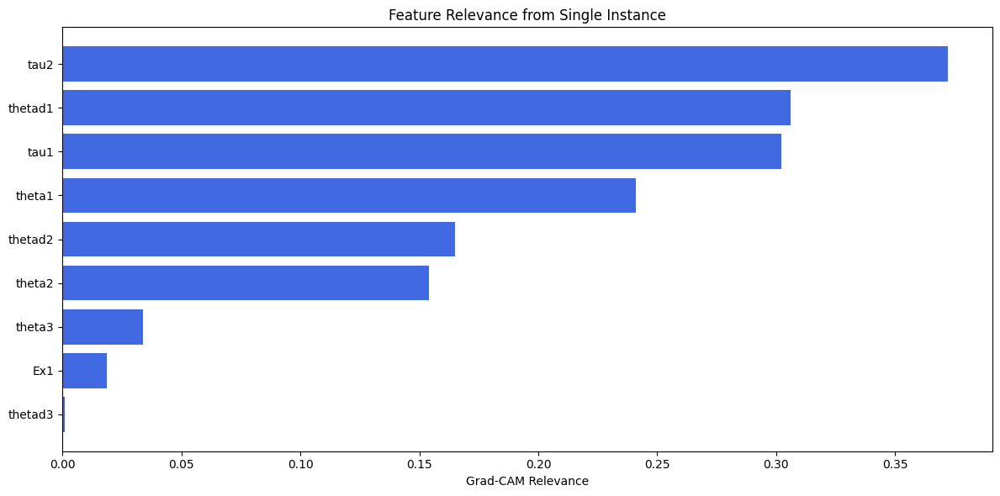

In [40]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. cnn_blocks=3, dense_layers=2 | best_epoch=4 | loss=3.24624

| Train: 2.5414e+00 | Val: 1.7249e+01 |: 100%|████████████████████| 110/110 [01:03<00:00,  1.73it/s]


✅ Best validation loss: 9.8724e+00 at 3 epoch
4.303581714630127


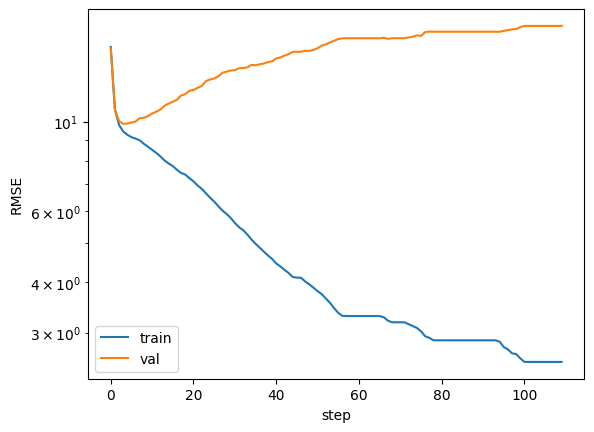

In [41]:
model = build_custom_cnn_model(cnn_blocks=3, dense_layers=2, imgs_shape=imgs_shape)
model_state, results, _ = fit_cnn_only_model(model, dataset, steps=110)
plot_training_RMSE(model, model_state, average_rmse(model(0, dataset['test_img']), dataset['test_label']), results['train_loss'], results['val_loss'])

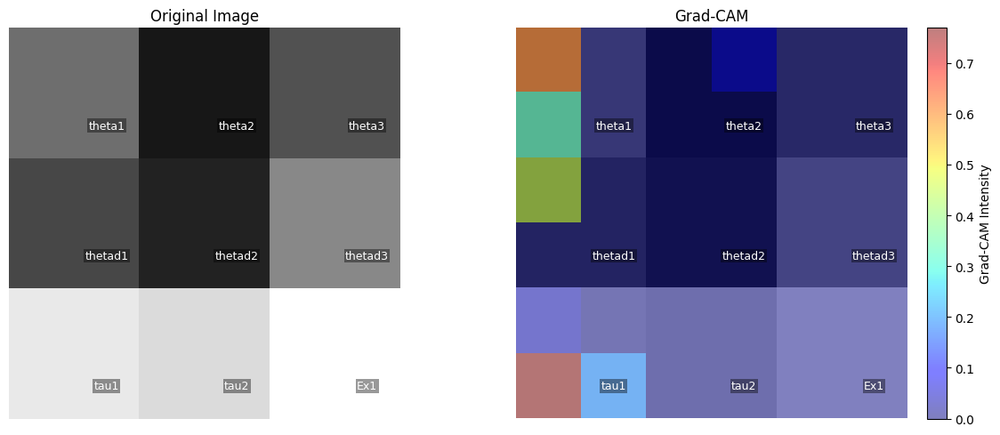

In [42]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [06:16<00:00,  4.35it/s] 


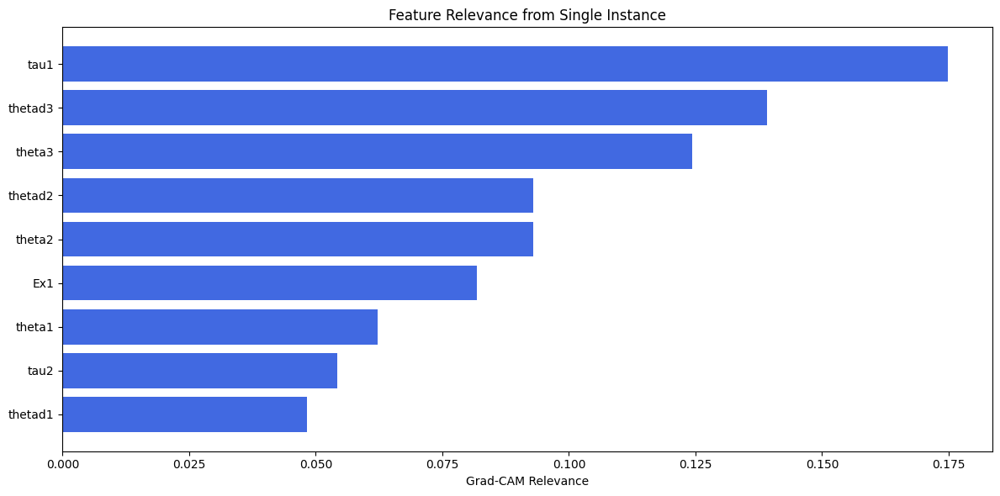

In [43]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Option 0: Concat full best KAN with full best CNN

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 4.60e-01 | eval_loss: 9.68e-01 | reg: 4.16e+01 |: 100%|█| 40/40 [00:16<00:00,  2.42it/

saving model version 0.1
Best epoch 39
0.8031208515167236
M_KAN Relevance: 0.9952961206436157
CNN Relevance: 0.00470389798283577
[('savingsDeposits', 0.76901585), ('checkableDeposits', 0.71801805), ('tradeCurrencies', 0.64482474), ('federalFunds', 0.5680285), ('demandDeposits', 0.5315344), ('3M-Rate-AuctionAverage', 0.4499076), ('loansLeases', 0.44902423), ('currency', 0.3811653), ('3Y-CMaturityRate', 0.35286272), ('5Y-CMaturityRate', 0.33838603), ('30Y-CMortgageRate', 0.3152477), ('3M-Rate-SecondaryMarket', 0.28345445), ('1Y-CMaturityRate', 0.2701585), ('moneyStock', 0.26409417), ('bankCredit', 0.25135314)]


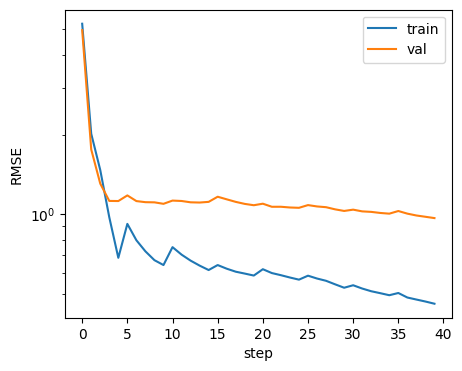

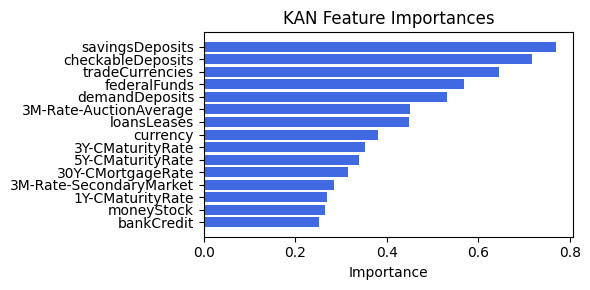

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.25it/s]

[('tradeCurrencies', 0.45060811330386924), ('moneyStock', 0.45018470576143865), ('federalFunds', 0.38578706874478874), ('bankCredit', 0.3593373299271445), ('savingsDeposits', 0.34129269721133393), ('5Y-CMaturityRate', 0.3372714397688209), ('demandDeposits', 0.32241896049956614), ('3Y-CMaturityRate', 0.2715754079432892), ('Ex1', 0.25696747798827435), ('loansLeases', 0.22996663123014427), ('3M-Rate-AuctionAverage', 0.21384204845415383), ('30Y-CMortgageRate', 0.2083559208444231), ('1Y-CMaturityRate', 0.19634623955713496), ('3M-Rate-SecondaryMarket', 0.14245097280516), ('checkableDeposits', 0.13638991555926622), ('currency', 0.09120616362696247)]


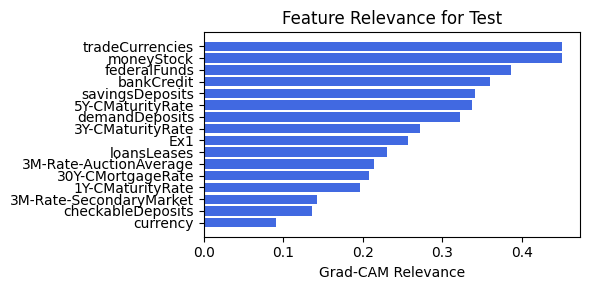

In [99]:
train_and_plot_relevance(Model3_0, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=1e-6, steps=40, n_kan_len=1)

### 0.1.1 width=[15, 5, 1], grid=4, lamb=0.0001

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 7.19e-01 | eval_loss: 9.01e-01 | reg: 4.23e+01 |: 100%|█| 40/40 [00:20<00:00,  1.92it/


saving model version 0.1
Best epoch 18
1.1233084201812744
M_KAN Relevance: 0.8724404573440552
CNN Relevance: 0.12755954265594482
[('30Y-CMortgageRate', 0.8075777), ('3Y-CMaturityRate', 0.68548894), ('checkableDeposits', 0.59768707), ('bankCredit', 0.47121155), ('demandDeposits', 0.38232347), ('federalFunds', 0.37503967), ('loansLeases', 0.3481684), ('3M-Rate-SecondaryMarket', 0.33276537), ('savingsDeposits', 0.3025007), ('tradeCurrencies', 0.29551667), ('moneyStock', 0.28608763), ('1Y-CMaturityRate', 0.247551), ('5Y-CMaturityRate', 0.18167971), ('currency', 0.16588877), ('3M-Rate-AuctionAverage', 0.16494463)]


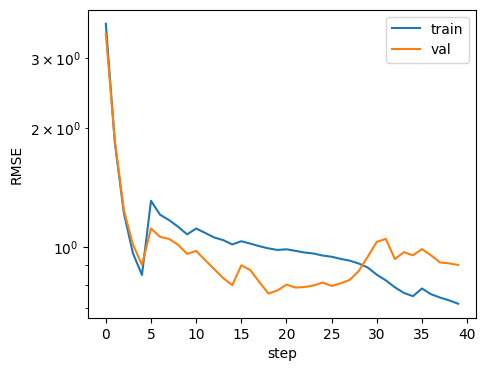

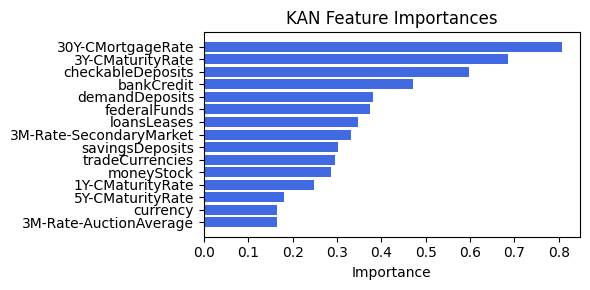

Computing Grad-CAM:   0%|          | 0/210 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('bankCredit', 0.4424293678963468), ('5Y-CMaturityRate', 0.441561032725232), ('1Y-CMaturityRate', 0.3941346054697143), ('3M-Rate-AuctionAverage', 0.3918688690733342), ('30Y-CMortgageRate', 0.38885836317203937), ('3Y-CMaturityRate', 0.3430253655178517), ('moneyStock', 0.29602926061266943), ('3M-Rate-SecondaryMarket', 0.2942313004285097), ('currency', 0.2537356433296823), ('federalFunds', 0.15748595524401893), ('checkableDeposits', 0.14592364450051848), ('demandDeposits', 0.1020950059384285), ('tradeCurrencies', 0.09234360108772914), ('Ex1', 0.07062250329625039), ('savingsDeposits', 0.026141448332262892), ('loansLeases', 0.013510883665488412)]


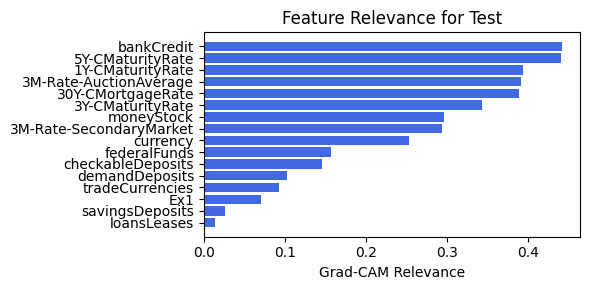

In [35]:
train_and_plot_relevance(Model3_0, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, n_kan_len=1)

### 0.1.2 width=[15, 5, 1], grid=4, lamb=0.0001 

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 5.23e-01 | eval_loss: 4.37e-01 | reg: 4.11e+01 |: 100%|█| 40/40 [00:19<00:00,  2.06it/

saving model version 0.1
Best epoch 39
0.6831257939338684
M_KAN Relevance: 0.990297794342041
CNN Relevance: 0.009702262468636036
[('savingsDeposits', 0.9123457), ('checkableDeposits', 0.6194537), ('3Y-CMaturityRate', 0.5706098), ('tradeCurrencies', 0.535959), ('loansLeases', 0.4926489), ('federalFunds', 0.45752496), ('currency', 0.43206438), ('1Y-CMaturityRate', 0.41413018), ('bankCredit', 0.40632552), ('30Y-CMortgageRate', 0.4031454), ('demandDeposits', 0.38869888), ('3M-Rate-AuctionAverage', 0.36879003), ('moneyStock', 0.3548789), ('3M-Rate-SecondaryMarket', 0.26930118), ('5Y-CMaturityRate', 0.21021532)]


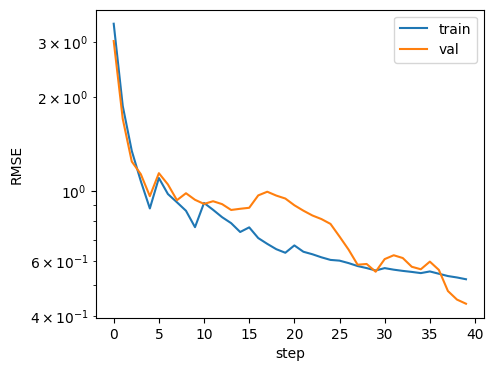

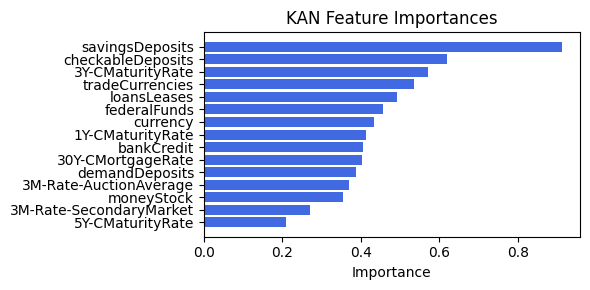

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.61it/s]

[('moneyStock', 0.35950877810163157), ('3M-Rate-SecondaryMarket', 0.2803368886979851), ('federalFunds', 0.2701681751059368), ('savingsDeposits', 0.2613189745128607), ('tradeCurrencies', 0.2534831772769047), ('demandDeposits', 0.24710310205728525), ('3M-Rate-AuctionAverage', 0.24211317558462422), ('checkableDeposits', 0.2412226379671622), ('30Y-CMortgageRate', 0.239452886875231), ('loansLeases', 0.22463762831785494), ('1Y-CMaturityRate', 0.20033502580433074), ('bankCredit', 0.12746528620870473), ('5Y-CMaturityRate', 0.11986759804013196), ('3Y-CMaturityRate', 0.1179574184419055), ('Ex1', 0.09760793899435417), ('currency', 0.06211384570009874)]


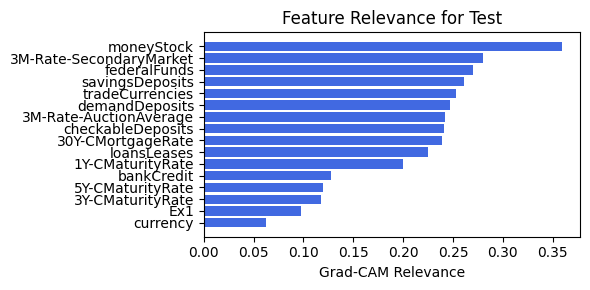

In [36]:
train_and_plot_relevance(Model3_0, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, n_kan_len=1)

### 0.2.1 width=[15, 6, 1], grid=5, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.05e-01 | eval_loss: 2.23e-01 | reg: 2.70e+01 |: 100%|█| 40/40 [00:15<00:00,  2.56it/

saving model version 0.1
Best epoch 10
0.2914855480194092
M_KAN Relevance: 0.07098248600959778
CNN Relevance: 0.9290174841880798
[('checkableDeposits', 0.82758296), ('loansLeases', 0.7588966), ('federalFunds', 0.72199637), ('moneyStock', 0.6481629), ('tradeCurrencies', 0.6074126), ('currency', 0.5483984), ('1Y-CMaturityRate', 0.5355927), ('3Y-CMaturityRate', 0.4332046), ('5Y-CMaturityRate', 0.43247837), ('bankCredit', 0.42895132), ('30Y-CMortgageRate', 0.41387963), ('savingsDeposits', 0.40499288), ('3M-Rate-AuctionAverage', 0.38357246), ('3M-Rate-SecondaryMarket', 0.33781576), ('demandDeposits', 0.3150837)]


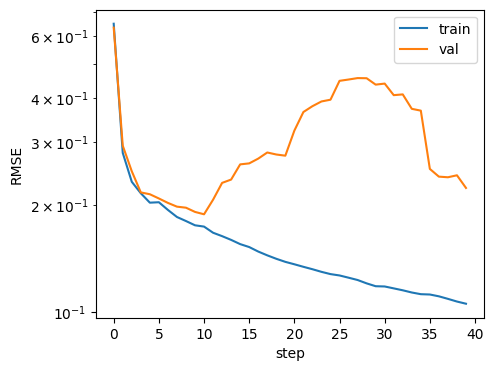

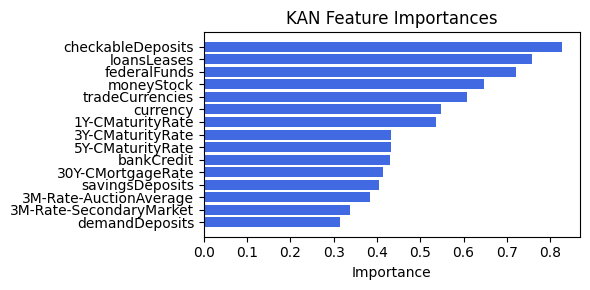

Computing Grad-CAM: 100%|██████████| 210/210 [00:28<00:00,  7.41it/s]


[('loansLeases', 0.12536160548528036), ('Ex1', 0.015582512390045893), ('tradeCurrencies', 0.00721887680036681), ('demandDeposits', 0.006784230763358729), ('checkableDeposits', 0.0062554295573915755), ('3M-Rate-SecondaryMarket', 0.003148262699445089), ('currency', 0.002800067052954719), ('savingsDeposits', 0.0012736803452883447), ('3M-Rate-AuctionAverage', 0.00020489880726450965), ('30Y-CMortgageRate', 0.0001334593586978458), ('5Y-CMaturityRate', 0.00010939861115600381), ('1Y-CMaturityRate', 0.0), ('3Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0)]


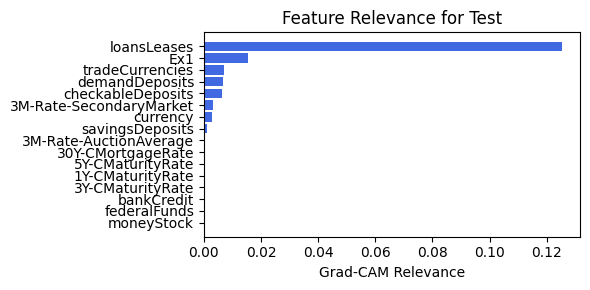

In [39]:
train_and_plot_relevance(Model3_0, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

### 0.2.2 width=[15, 6, 1], grid=5, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.11e-01 | eval_loss: 2.09e-01 | reg: 2.62e+01 |: 100%|█| 40/40 [00:16<00:00,  2.47it/

saving model version 0.1
Best epoch 25
0.29095929861068726
M_KAN Relevance: 0.08772400766611099
CNN Relevance: 0.912276029586792
[('checkableDeposits', 0.5249132), ('loansLeases', 0.44630176), ('federalFunds', 0.3923486), ('moneyStock', 0.35649362), ('tradeCurrencies', 0.34305266), ('currency', 0.33183333), ('1Y-CMaturityRate', 0.31976417), ('3Y-CMaturityRate', 0.28853494), ('3M-Rate-SecondaryMarket', 0.25391883), ('bankCredit', 0.23856242), ('3M-Rate-AuctionAverage', 0.22486426), ('30Y-CMortgageRate', 0.21939142), ('savingsDeposits', 0.21726197), ('demandDeposits', 0.18357116), ('5Y-CMaturityRate', 0.16644526)]


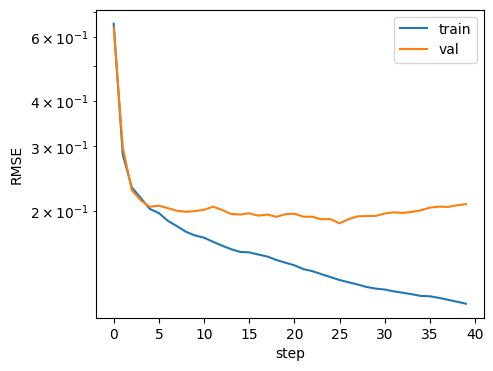

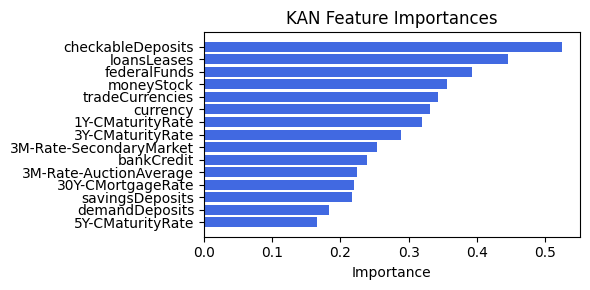

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.78it/s]


[('loansLeases', 0.08477865389071494), ('demandDeposits', 0.026087111784588723), ('3Y-CMaturityRate', 0.010906567247140975), ('Ex1', 0.010259104342687697), ('checkableDeposits', 0.005289242239225478), ('tradeCurrencies', 0.0016669013725948475), ('5Y-CMaturityRate', 0.0006985430650058247), ('3M-Rate-SecondaryMarket', 0.0003444299545316469), ('savingsDeposits', 0.00029187841074807306), ('30Y-CMortgageRate', 0.0001580746400923956), ('moneyStock', 9.730569131317593e-05), ('currency', 7.470373862556049e-05), ('1Y-CMaturityRate', 2.8164409810588473e-05), ('3M-Rate-AuctionAverage', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0)]


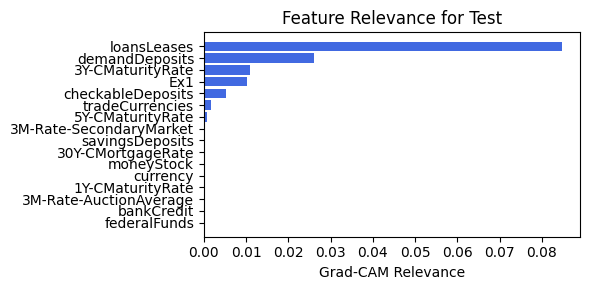

In [40]:
train_and_plot_relevance(Model3_0, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

### 3.1 width=[15, 1, 1], grid=5, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.44e-01 | eval_loss: 1.79e-01 | reg: 1.53e+01 |: 100%|█| 40/40 [00:16<00:00,  2.39it/

saving model version 0.1
Best epoch 38
0.3378720283508301
M_KAN Relevance: 0.0683499202132225
CNN Relevance: 0.9316501617431641
[('federalFunds', 0.6078161), ('loansLeases', 0.30973879), ('3M-Rate-AuctionAverage', 0.2822816), ('demandDeposits', 0.2777205), ('savingsDeposits', 0.20466098), ('checkableDeposits', 0.17661923), ('currency', 0.1652414), ('tradeCurrencies', 0.15605658), ('3M-Rate-SecondaryMarket', 0.124352016), ('moneyStock', 0.123837605), ('30Y-CMortgageRate', 0.106536046), ('3Y-CMaturityRate', 0.07194428), ('1Y-CMaturityRate', 0.061408788), ('5Y-CMaturityRate', 0.039305445), ('bankCredit', 0.024005089)]


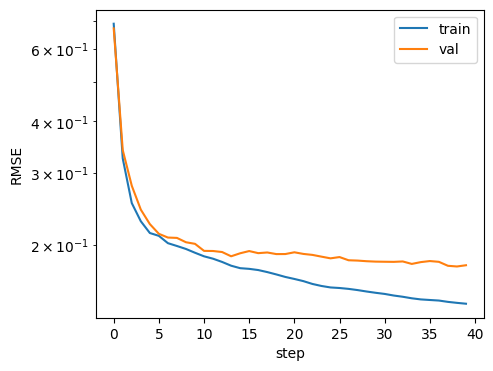

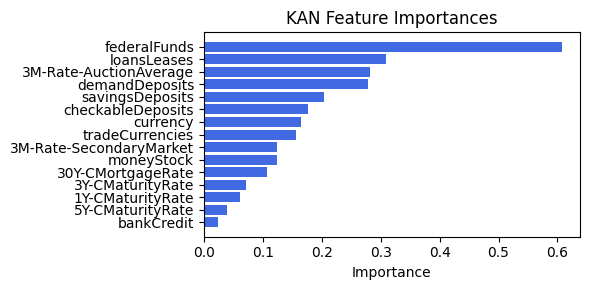

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 11.91it/s]


[('Ex1', 0.018773881820518347), ('3M-Rate-SecondaryMarket', 0.014292120649701073), ('1Y-CMaturityRate', 0.004534807091667538), ('3M-Rate-AuctionAverage', 0.004461504093238286), ('currency', 0.0016268501324313027), ('30Y-CMortgageRate', 0.001544436989795594), ('bankCredit', 0.0007020101660773867), ('5Y-CMaturityRate', 0.0005871595726126717), ('3Y-CMaturityRate', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('loansLeases', 0.0), ('savingsDeposits', 0.0), ('tradeCurrencies', 0.0)]


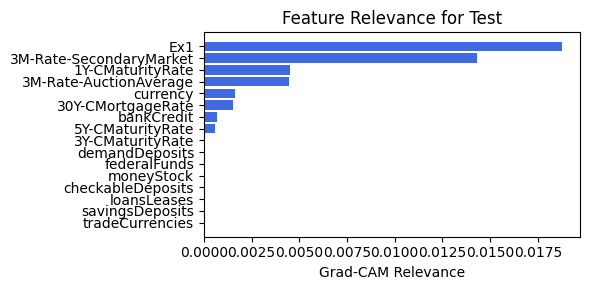

In [41]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

### 3.2 width=[15, 1, 1], grid=5, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.46e-01 | eval_loss: 2.06e-01 | reg: 1.51e+01 |: 100%|█| 40/40 [00:17<00:00,  2.34it/

saving model version 0.1
Best epoch 25
0.2642425298690796
M_KAN Relevance: 0.051798466593027115
CNN Relevance: 0.9482015371322632
[('3M-Rate-AuctionAverage', 0.4943842), ('loansLeases', 0.3821696), ('tradeCurrencies', 0.3587566), ('currency', 0.3270315), ('federalFunds', 0.22604012), ('bankCredit', 0.1931489), ('savingsDeposits', 0.17888364), ('moneyStock', 0.16042513), ('3Y-CMaturityRate', 0.15739286), ('demandDeposits', 0.12913813), ('30Y-CMortgageRate', 0.109884724), ('3M-Rate-SecondaryMarket', 0.106376424), ('5Y-CMaturityRate', 0.06708271), ('checkableDeposits', 0.045699913), ('1Y-CMaturityRate', 0.024569817)]


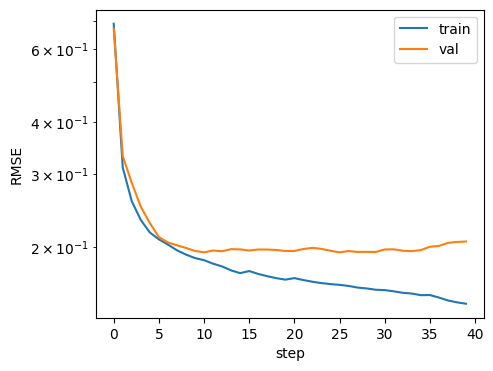

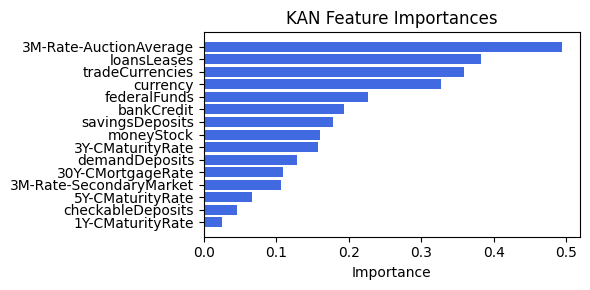

Computing Grad-CAM: 100%|██████████| 210/210 [00:16<00:00, 12.46it/s]


[('loansLeases', 0.13409401799241702), ('demandDeposits', 0.048723476098911346), ('3Y-CMaturityRate', 0.04447129175421737), ('Ex1', 0.012173168432144891), ('checkableDeposits', 0.008914099420819964), ('tradeCurrencies', 0.006876922613896785), ('3M-Rate-SecondaryMarket', 0.005533005084864618), ('currency', 0.004702910503172981), ('savingsDeposits', 0.002013824609180336), ('1Y-CMaturityRate', 0.0018644097216782116), ('3M-Rate-AuctionAverage', 0.001445112909589495), ('5Y-CMaturityRate', 0.001085683313154039), ('30Y-CMortgageRate', 0.0008359870208161218), ('bankCredit', 0.0005344622768461704), ('federalFunds', 0.0), ('moneyStock', 0.0)]


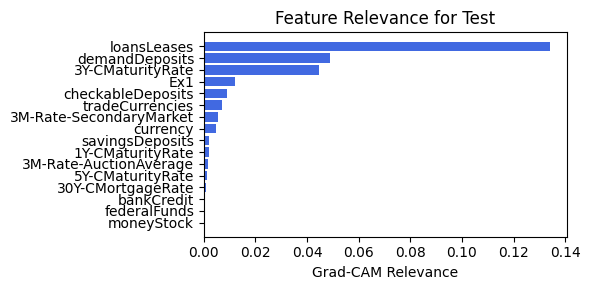

In [42]:
train_and_plot_relevance(Model3_0, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

### 4.1 width=[15, 6, 1], grid=7, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.84e-01 | eval_loss: 2.00e-01 | reg: 4.31e+01 |: 100%|█| 40/40 [00:18<00:00,  2.22it/

saving model version 0.1
Best epoch 39
0.2695586681365967
M_KAN Relevance: 0.1516919732093811
CNN Relevance: 0.8483080267906189
[('loansLeases', 0.58215463), ('checkableDeposits', 0.53749573), ('federalFunds', 0.49040014), ('3M-Rate-AuctionAverage', 0.36593258), ('3M-Rate-SecondaryMarket', 0.33932066), ('3Y-CMaturityRate', 0.31592873), ('tradeCurrencies', 0.3076649), ('30Y-CMortgageRate', 0.29388216), ('savingsDeposits', 0.2897429), ('5Y-CMaturityRate', 0.2725367), ('moneyStock', 0.25210097), ('bankCredit', 0.21849847), ('demandDeposits', 0.21771541), ('currency', 0.19223744), ('1Y-CMaturityRate', 0.1223367)]


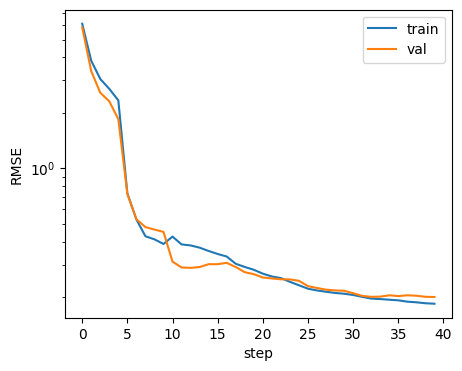

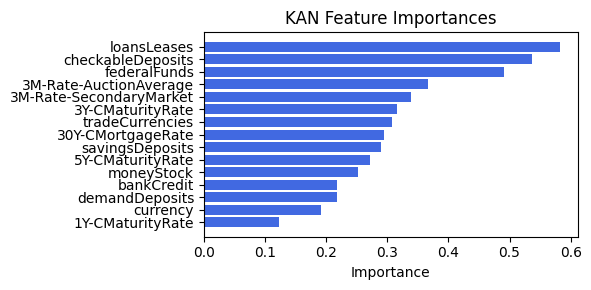

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.54it/s]

[('Ex1', 0.049166958034038546), ('loansLeases', 0.005208333333333333), ('currency', 0.00309280776640489), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('savingsDeposits', 0.0), ('tradeCurrencies', 0.0)]


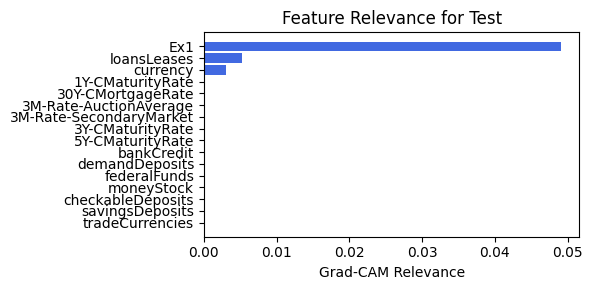

In [44]:
train_and_plot_relevance(Model3_0, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

### 4.2 width=[15, 6, 1], grid=7, lamb=1e-05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_0


| train_loss: 1.84e-01 | eval_loss: 2.28e-01 | reg: 4.39e+01 |: 100%|█| 40/40 [00:18<00:00,  2.20it/

saving model version 0.1
Best epoch 39
0.3937208354473114
M_KAN Relevance: 0.15256430208683014
CNN Relevance: 0.847435712814331
[('federalFunds', 0.6855254), ('loansLeases', 0.6068797), ('checkableDeposits', 0.4710338), ('3M-Rate-AuctionAverage', 0.3172125), ('30Y-CMortgageRate', 0.29677168), ('bankCredit', 0.26329044), ('3Y-CMaturityRate', 0.25668398), ('3M-Rate-SecondaryMarket', 0.243098), ('moneyStock', 0.21536076), ('tradeCurrencies', 0.21142082), ('savingsDeposits', 0.21110368), ('demandDeposits', 0.21069871), ('5Y-CMaturityRate', 0.19589016), ('currency', 0.16724476), ('1Y-CMaturityRate', 0.12602954)]


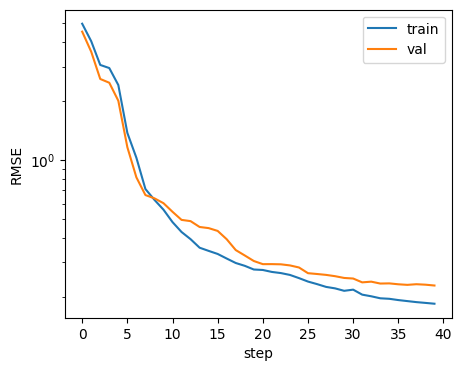

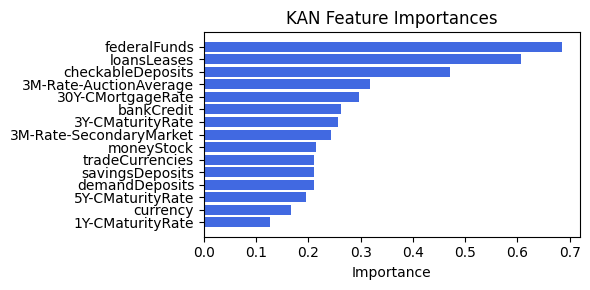

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.64it/s]


[('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('loansLeases', 0.0), ('savingsDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


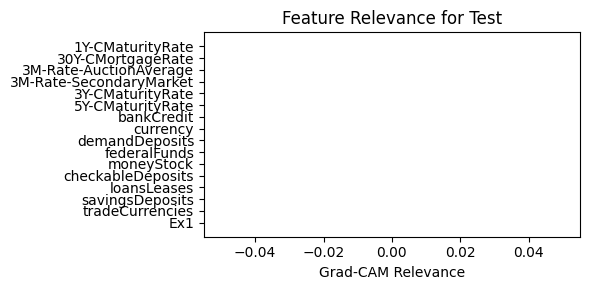

In [45]:
train_and_plot_relevance(Model3_0, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, n_kan_len=1)

# Option 1: Concat KAN with (CNN with dense layer to reduce output_size)

## 1.0 width=[15, 5, 1], grid=4, lamb=0.0001

### 1.0.0a width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.58e-01 | eval_loss: 1.98e-01 | reg: 1.93e+01 |: 100%|█| 40/40 [00:12<00:00,  3.28it/

saving model version 0.1
Best epoch 22
0.2483792006969452
M_KAN Relevance: 0.11146758496761322
CNN Relevance: 0.8885324597358704
[('30Y-CMortgageRate', 0.3619361), ('savingsDeposits', 0.3148194), ('bankCredit', 0.27725533), ('3M-Rate-AuctionAverage', 0.27273807), ('tradeCurrencies', 0.258468), ('federalFunds', 0.25696334), ('loansLeases', 0.256453), ('5Y-CMaturityRate', 0.25068775), ('checkableDeposits', 0.21890293), ('3Y-CMaturityRate', 0.1983763), ('3M-Rate-SecondaryMarket', 0.19689827), ('moneyStock', 0.16276483), ('1Y-CMaturityRate', 0.15031339), ('demandDeposits', 0.14076829), ('currency', 0.09386384)]


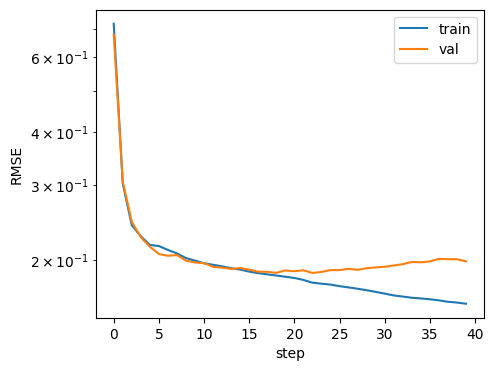

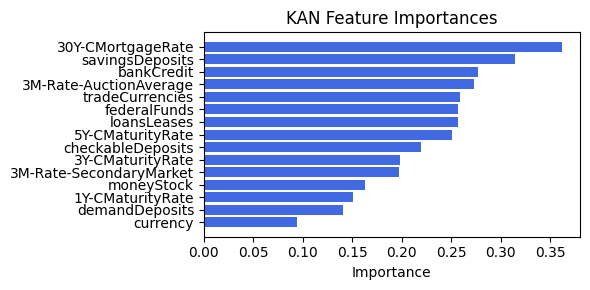

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  9.02it/s]

[('tradeCurrencies', 0.16765127623719828), ('loansLeases', 0.039491707210739455), ('savingsDeposits', 0.027358345963459995), ('demandDeposits', 0.014533807968975798), ('3Y-CMaturityRate', 0.010762763839115256), ('1Y-CMaturityRate', 0.004933592907729603), ('3M-Rate-AuctionAverage', 0.0018076595805940174), ('moneyStock', 0.00032667987203846376), ('30Y-CMortgageRate', 0.00028912523495299477), ('3M-Rate-SecondaryMarket', 0.00020859748723783662), ('bankCredit', 0.00010521136046875091), ('5Y-CMaturityRate', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


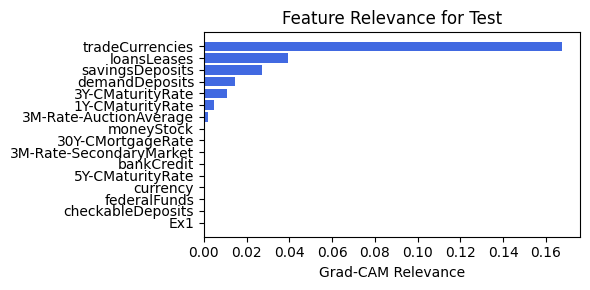

In [135]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=1, lamb=0.0001, steps=40)

### 1.0.0b width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.64e-01 | eval_loss: 2.05e-01 | reg: 1.92e+01 |: 100%|█| 40/40 [00:12<00:00,  3.18it/

saving model version 0.1
Best epoch 21
0.23207838833332062
M_KAN Relevance: 0.10857264697551727
CNN Relevance: 0.8914273977279663
[('loansLeases', 0.25195453), ('30Y-CMortgageRate', 0.21896215), ('checkableDeposits', 0.2044661), ('bankCredit', 0.20436262), ('tradeCurrencies', 0.18974689), ('currency', 0.17953011), ('5Y-CMaturityRate', 0.17284958), ('3M-Rate-AuctionAverage', 0.16631995), ('moneyStock', 0.15123622), ('savingsDeposits', 0.1494379), ('federalFunds', 0.11949467), ('demandDeposits', 0.11737528), ('1Y-CMaturityRate', 0.10672855), ('3M-Rate-SecondaryMarket', 0.0876377), ('3Y-CMaturityRate', 0.04712304)]


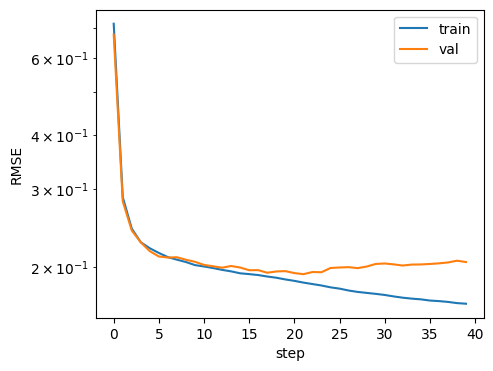

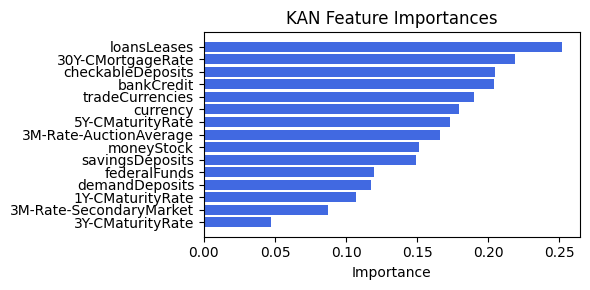

Computing Grad-CAM: 100%|██████████| 210/210 [00:22<00:00,  9.34it/s]

[('loansLeases', 0.057056750884346134), ('tradeCurrencies', 0.03427369006080664), ('savingsDeposits', 0.026707872380488662), ('demandDeposits', 0.024672531391981813), ('3Y-CMaturityRate', 0.013970558205896634), ('1Y-CMaturityRate', 0.0025593786921706938), ('moneyStock', 0.0010864499207985188), ('3M-Rate-AuctionAverage', 0.0003982997721149808), ('30Y-CMortgageRate', 0.00010078017089870714), ('bankCredit', 4.879403415889967e-05), ('5Y-CMaturityRate', 6.040351443170082e-06), ('3M-Rate-SecondaryMarket', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


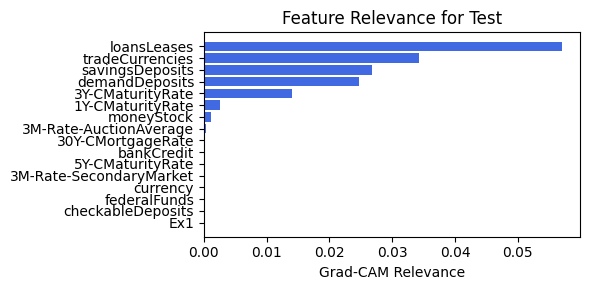

In [136]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=1, lamb=0.0001, steps=40)

### 1.0.0c width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.31e-01 | eval_loss: 1.76e-01 | reg: 3.74e+01 |: 100%|█| 40/40 [00:12<00:00,  3.09it/

saving model version 0.1
Best epoch 27
0.24337618052959442
M_KAN Relevance: 0.9165032505989075
CNN Relevance: 0.08349674195051193
[('30Y-CMortgageRate', 0.3038597), ('bankCredit', 0.3011157), ('tradeCurrencies', 0.28963748), ('moneyStock', 0.23237042), ('3Y-CMaturityRate', 0.22568305), ('3M-Rate-AuctionAverage', 0.22558406), ('3M-Rate-SecondaryMarket', 0.21786563), ('5Y-CMaturityRate', 0.19174038), ('federalFunds', 0.17989074), ('checkableDeposits', 0.1715748), ('loansLeases', 0.16911529), ('savingsDeposits', 0.14908095), ('1Y-CMaturityRate', 0.1485485), ('demandDeposits', 0.09756005), ('currency', 0.096802615)]


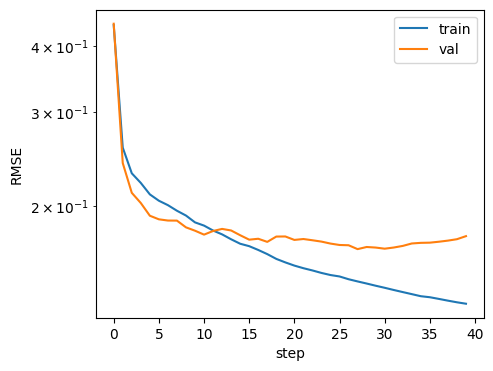

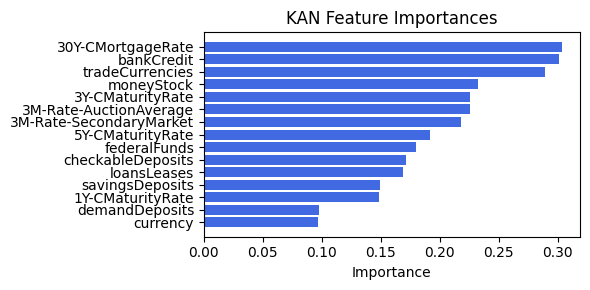

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.42it/s]

[('checkableDeposits', 0.44030107057520323), ('bankCredit', 0.4295639852860144), ('5Y-CMaturityRate', 0.41637817726337484), ('moneyStock', 0.3965607319381975), ('tradeCurrencies', 0.37395600739511703), ('currency', 0.3657712628832087), ('federalFunds', 0.34706196568288195), ('3M-Rate-SecondaryMarket', 0.31604170417052785), ('3M-Rate-AuctionAverage', 0.30984988527655205), ('30Y-CMortgageRate', 0.3021295639287148), ('3Y-CMaturityRate', 0.23446292670587787), ('Ex1', 0.20500841518154456), ('demandDeposits', 0.185092462989546), ('savingsDeposits', 0.18370339515441586), ('1Y-CMaturityRate', 0.17259344411126915), ('loansLeases', 0.13282644521178943)]


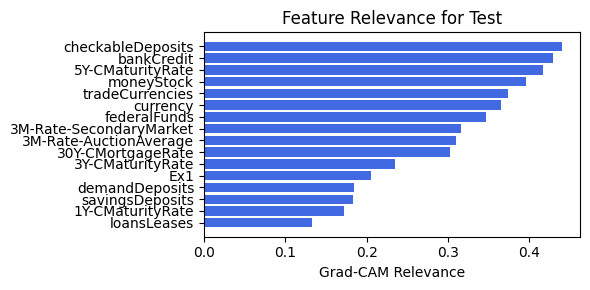

In [133]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=2, lamb=0.0001, steps=40)

### 1.0.0d width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.39e-01 | eval_loss: 1.83e-01 | reg: 3.60e+01 |: 100%|█| 40/40 [00:12<00:00,  3.15it/

saving model version 0.1
Best epoch 13
0.23793035745620728
M_KAN Relevance: 0.9307801723480225
CNN Relevance: 0.06921981275081635
[('bankCredit', 0.37406224), ('30Y-CMortgageRate', 0.30033705), ('moneyStock', 0.29980454), ('tradeCurrencies', 0.2965975), ('3M-Rate-SecondaryMarket', 0.21740094), ('3Y-CMaturityRate', 0.21427889), ('3M-Rate-AuctionAverage', 0.20175476), ('savingsDeposits', 0.18611579), ('loansLeases', 0.18258409), ('5Y-CMaturityRate', 0.1648496), ('checkableDeposits', 0.14928512), ('federalFunds', 0.14204039), ('1Y-CMaturityRate', 0.13088931), ('demandDeposits', 0.07531166), ('currency', 0.07260119)]


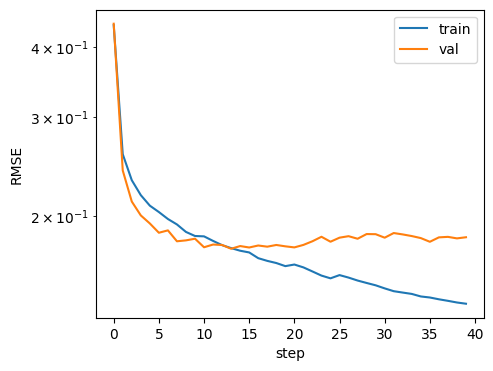

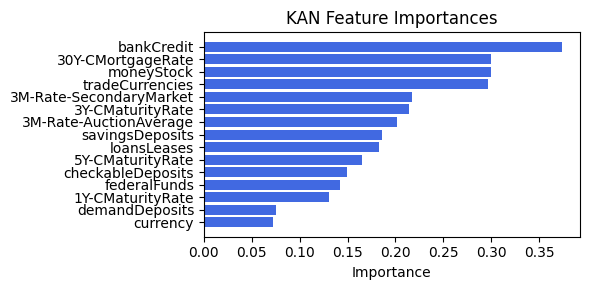

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.48it/s]

[('tradeCurrencies', 0.3819147281354249), ('moneyStock', 0.29902153620052907), ('federalFunds', 0.2501141117092976), ('bankCredit', 0.24262563032070397), ('5Y-CMaturityRate', 0.2320464851284799), ('checkableDeposits', 0.1996810506790921), ('3M-Rate-AuctionAverage', 0.18226280553222057), ('30Y-CMortgageRate', 0.17472262470030164), ('currency', 0.17414285419065328), ('savingsDeposits', 0.15848180435239642), ('3Y-CMaturityRate', 0.15507824220412225), ('demandDeposits', 0.15280195415238962), ('Ex1', 0.14194901457632936), ('1Y-CMaturityRate', 0.12513421005846578), ('3M-Rate-SecondaryMarket', 0.12414735394552173), ('loansLeases', 0.11700182335362548)]


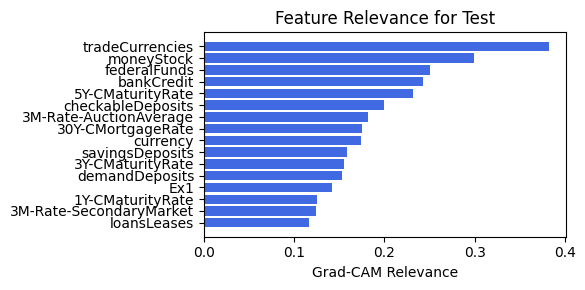

In [134]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=2, lamb=0.0001, steps=40)

### 1.0.1 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.59e-01 | eval_loss: 1.94e-01 | reg: 2.09e+01 |: 100%|█| 40/40 [00:12<00:00,  3.22it/

saving model version 0.1
Best epoch 25
0.23940826952457428
M_KAN Relevance: 0.08534260839223862
CNN Relevance: 0.9146574139595032
[('federalFunds', 0.35408807), ('tradeCurrencies', 0.3412678), ('checkableDeposits', 0.31441274), ('savingsDeposits', 0.31272355), ('3M-Rate-AuctionAverage', 0.2914225), ('loansLeases', 0.28834984), ('30Y-CMortgageRate', 0.23154564), ('3M-Rate-SecondaryMarket', 0.1709466), ('5Y-CMaturityRate', 0.16117726), ('3Y-CMaturityRate', 0.15902166), ('1Y-CMaturityRate', 0.14825617), ('bankCredit', 0.13752851), ('moneyStock', 0.1334245), ('currency', 0.07841303), ('demandDeposits', 0.063122876)]


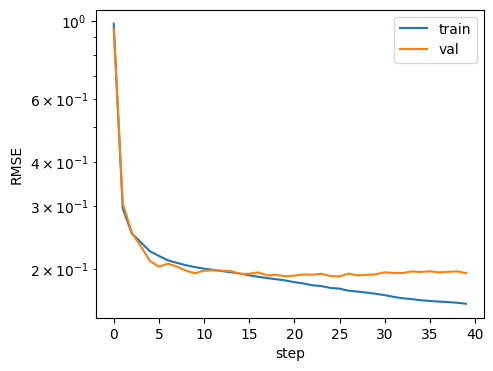

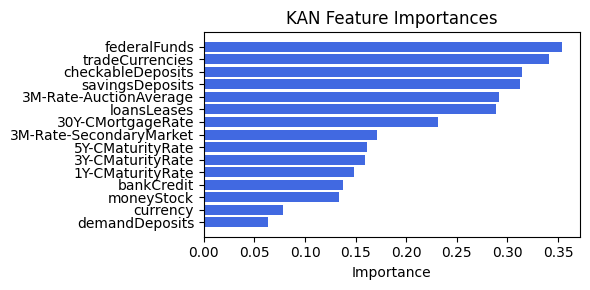

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.77it/s]

[('tradeCurrencies', 0.0626582816667256), ('savingsDeposits', 0.019787421625434426), ('moneyStock', 0.01953411806108696), ('loansLeases', 0.008038383751686308), ('3Y-CMaturityRate', 0.003967444054848913), ('demandDeposits', 0.0025188450812060007), ('1Y-CMaturityRate', 0.0007702628239279702), ('3M-Rate-AuctionAverage', 0.0003315744139919324), ('3M-Rate-SecondaryMarket', 0.00013268515467643738), ('30Y-CMortgageRate', 3.609391860663891e-05), ('Ex1', 6.642967664880589e-06), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('checkableDeposits', 0.0)]


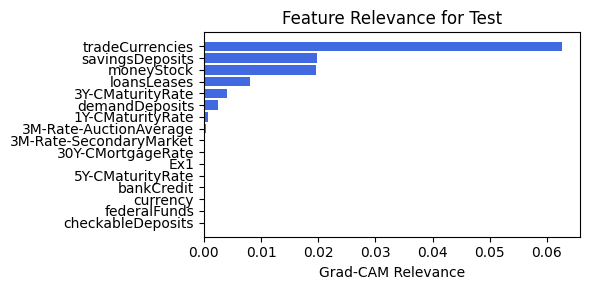

In [55]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=3, lamb=0.0001, steps=40)

### 1.0.2 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.62e-01 | eval_loss: 1.97e-01 | reg: 2.33e+01 |: 100%|█| 40/40 [00:13<00:00,  2.98it/

saving model version 0.1
Best epoch 21
0.2121581882238388
M_KAN Relevance: 0.14510411024093628
CNN Relevance: 0.8548958897590637
[('checkableDeposits', 0.27041546), ('tradeCurrencies', 0.2518736), ('30Y-CMortgageRate', 0.18702869), ('loansLeases', 0.18303059), ('savingsDeposits', 0.17680854), ('1Y-CMaturityRate', 0.16144536), ('federalFunds', 0.13482665), ('bankCredit', 0.12669085), ('5Y-CMaturityRate', 0.123990715), ('3M-Rate-SecondaryMarket', 0.1140301), ('3Y-CMaturityRate', 0.09715556), ('3M-Rate-AuctionAverage', 0.088960364), ('currency', 0.08742601), ('moneyStock', 0.087081976), ('demandDeposits', 0.0565645)]


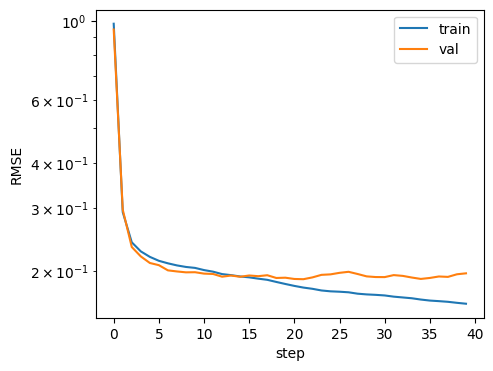

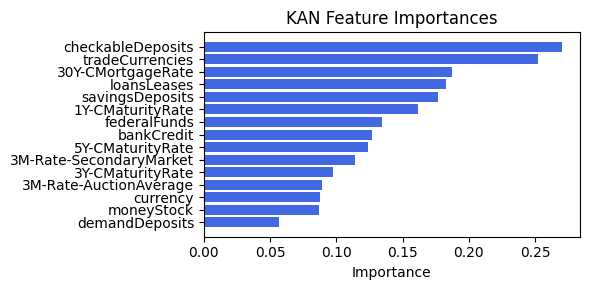

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.47it/s]

[('3Y-CMaturityRate', 0.21571335405266534), ('loansLeases', 0.21055281175123083), ('demandDeposits', 0.06413441200552153), ('tradeCurrencies', 0.050658421991171224), ('1Y-CMaturityRate', 0.022457634348012064), ('savingsDeposits', 0.006423048141767226), ('3M-Rate-SecondaryMarket', 0.0007949925604320708), ('federalFunds', 0.00022886672231834382), ('3M-Rate-AuctionAverage', 0.0002201591984928763), ('bankCredit', 0.00011252936507974351), ('30Y-CMortgageRate', 9.002634989363807e-05), ('5Y-CMaturityRate', 0.0), ('currency', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


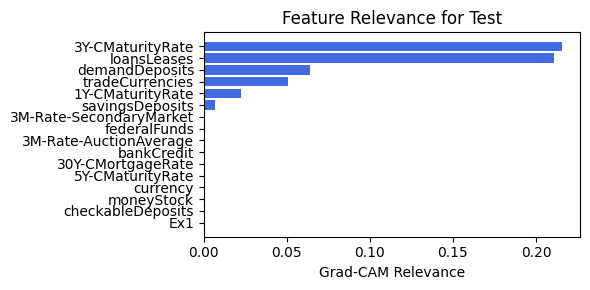

In [56]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=3, lamb=0.0001, steps=40)

### 1.0.3 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.54e-01 | eval_loss: 1.85e-01 | reg: 2.20e+01 |: 100%|█| 40/40 [00:13<00:00,  2.93it/

saving model version 0.1
Best epoch 34
0.23954564332962036
M_KAN Relevance: 0.12289975583553314
CNN Relevance: 0.8771002292633057
[('federalFunds', 0.4303995), ('30Y-CMortgageRate', 0.28744498), ('3M-Rate-SecondaryMarket', 0.25853798), ('tradeCurrencies', 0.22885875), ('3Y-CMaturityRate', 0.21629174), ('3M-Rate-AuctionAverage', 0.21571398), ('checkableDeposits', 0.20006405), ('5Y-CMaturityRate', 0.19221403), ('moneyStock', 0.1760857), ('savingsDeposits', 0.17239444), ('loansLeases', 0.17134707), ('1Y-CMaturityRate', 0.16174017), ('demandDeposits', 0.14622548), ('bankCredit', 0.13862804), ('currency', 0.11992923)]


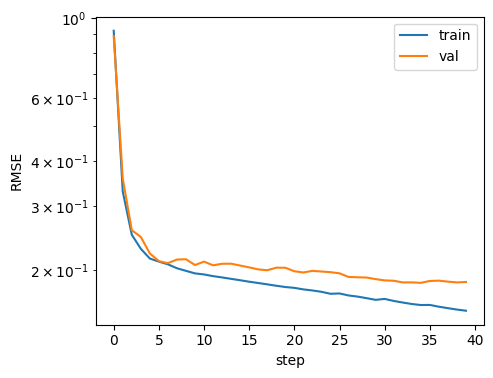

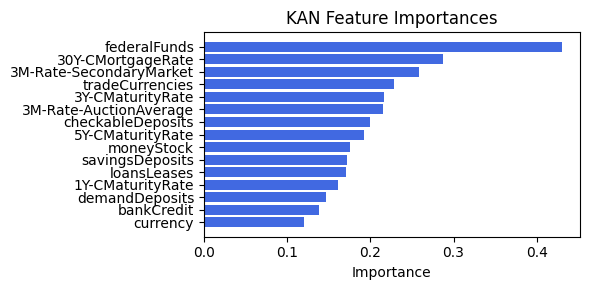

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.40it/s]


[('1Y-CMaturityRate', 0.2882379109184036), ('30Y-CMortgageRate', 0.10534101302937848), ('moneyStock', 0.09767182458142218), ('3Y-CMaturityRate', 0.09744786332871411), ('3M-Rate-AuctionAverage', 0.08913004468721782), ('3M-Rate-SecondaryMarket', 0.05463321659314845), ('demandDeposits', 0.047389990379590366), ('currency', 0.039294978947284454), ('tradeCurrencies', 0.03602580305721079), ('checkableDeposits', 0.033742111460084004), ('loansLeases', 0.03152024571539923), ('savingsDeposits', 0.02457814661724158), ('Ex1', 0.01604848925212753), ('federalFunds', 0.0016455683973617852), ('5Y-CMaturityRate', 0.00033742475726674975), ('bankCredit', 0.00031366040486665)]


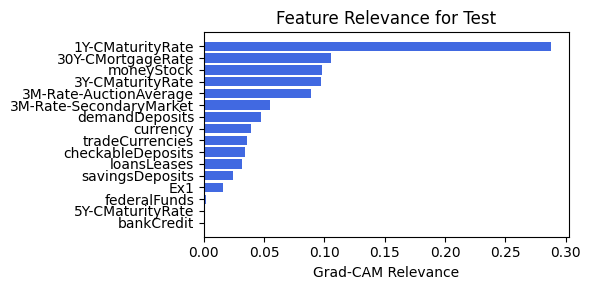

In [57]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=5, lamb=0.0001, steps=40)

### 1.0.4 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.54e-01 | eval_loss: 1.85e-01 | reg: 2.20e+01 |: 100%|█| 40/40 [00:12<00:00,  3.13it/

saving model version 0.1
Best epoch 34
0.23954564332962036
M_KAN Relevance: 0.12289975583553314
CNN Relevance: 0.8771002292633057
[('federalFunds', 0.4303995), ('30Y-CMortgageRate', 0.28744498), ('3M-Rate-SecondaryMarket', 0.25853798), ('tradeCurrencies', 0.22885875), ('3Y-CMaturityRate', 0.21629174), ('3M-Rate-AuctionAverage', 0.21571398), ('checkableDeposits', 0.20006405), ('5Y-CMaturityRate', 0.19221403), ('moneyStock', 0.1760857), ('savingsDeposits', 0.17239444), ('loansLeases', 0.17134707), ('1Y-CMaturityRate', 0.16174017), ('demandDeposits', 0.14622548), ('bankCredit', 0.13862804), ('currency', 0.11992923)]


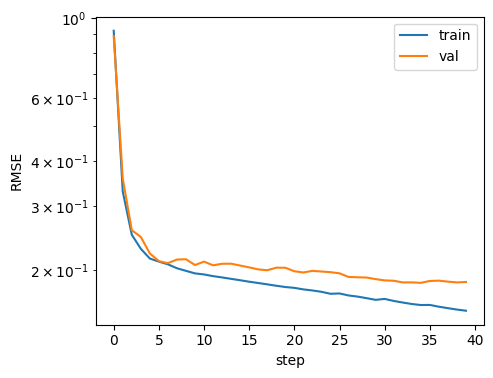

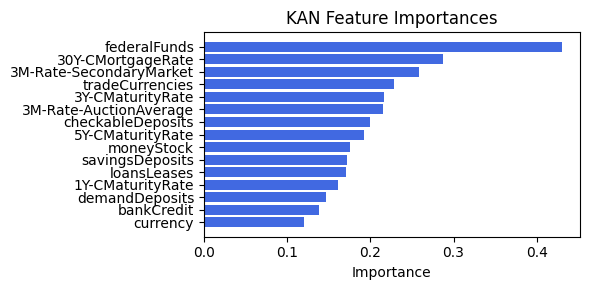

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.51it/s]

[('1Y-CMaturityRate', 0.2882379109184036), ('30Y-CMortgageRate', 0.10534101302937848), ('moneyStock', 0.09767182458142218), ('3Y-CMaturityRate', 0.09744786332871411), ('3M-Rate-AuctionAverage', 0.08913004468721782), ('3M-Rate-SecondaryMarket', 0.05463321659314845), ('demandDeposits', 0.047389990379590366), ('currency', 0.039294978947284454), ('tradeCurrencies', 0.03602580305721079), ('checkableDeposits', 0.033742111460084004), ('loansLeases', 0.03152024571539923), ('savingsDeposits', 0.02457814661724158), ('Ex1', 0.01604848925212753), ('federalFunds', 0.0016455683973617852), ('5Y-CMaturityRate', 0.00033742475726674975), ('bankCredit', 0.00031366040486665)]


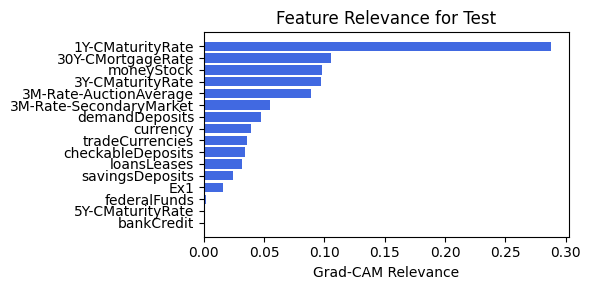

In [58]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=5, lamb=0.0001, steps=40)

### 1.0.5 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.63e-01 | eval_loss: 1.94e-01 | reg: 2.06e+01 |: 100%|█| 40/40 [00:13<00:00,  3.04it/

saving model version 0.1
Best epoch 37
0.2567010223865509
M_KAN Relevance: 0.08227717131376266
CNN Relevance: 0.917722761631012
[('tradeCurrencies', 0.23442101), ('1Y-CMaturityRate', 0.22916642), ('3M-Rate-AuctionAverage', 0.20357528), ('loansLeases', 0.17317441), ('30Y-CMortgageRate', 0.17300414), ('currency', 0.17009024), ('savingsDeposits', 0.1682177), ('3Y-CMaturityRate', 0.16820852), ('3M-Rate-SecondaryMarket', 0.14331895), ('federalFunds', 0.14061467), ('demandDeposits', 0.12616268), ('bankCredit', 0.12032361), ('moneyStock', 0.11915689), ('5Y-CMaturityRate', 0.09016879), ('checkableDeposits', 0.05901916)]


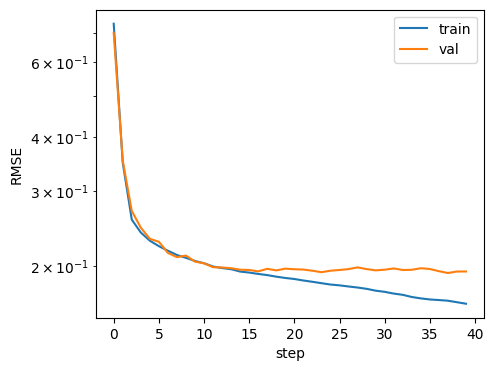

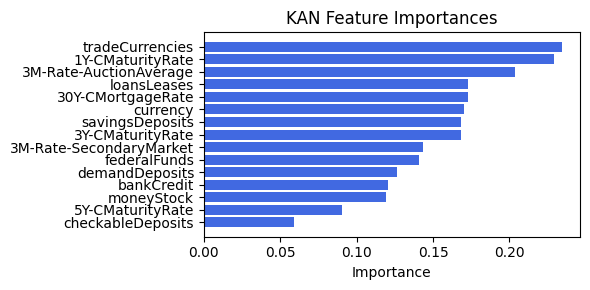

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.18it/s]


[('3M-Rate-SecondaryMarket', 0.26475013351910526), ('tradeCurrencies', 0.036088662647775244), ('loansLeases', 0.026524202118577835), ('checkableDeposits', 0.017309519173466556), ('30Y-CMortgageRate', 0.017198138445660118), ('demandDeposits', 0.01181412245108125), ('moneyStock', 0.010425473264573763), ('savingsDeposits', 0.009316337654863241), ('3Y-CMaturityRate', 0.006303298772711839), ('3M-Rate-AuctionAverage', 0.006262024621745305), ('1Y-CMaturityRate', 0.003961915887304626), ('currency', 0.0007122505184573431), ('bankCredit', 1.852241943457297e-05), ('5Y-CMaturityRate', 5.030600420598473e-06), ('federalFunds', 4.13249373585651e-06), ('Ex1', 0.0)]


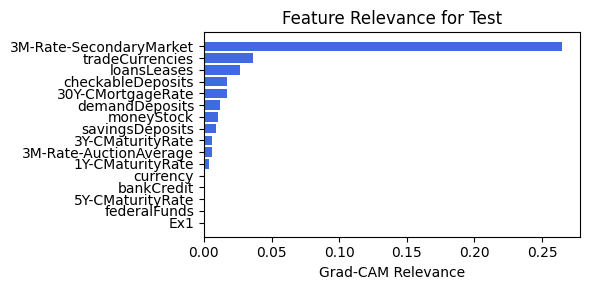

In [59]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=8, lamb=0.0001, steps=40)

### 1.0.6 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=8

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.63e-01 | eval_loss: 1.94e-01 | reg: 2.06e+01 |: 100%|█| 40/40 [00:13<00:00,  3.06it/

saving model version 0.1
Best epoch 37
0.2567010223865509
M_KAN Relevance: 0.08227717131376266
CNN Relevance: 0.917722761631012
[('tradeCurrencies', 0.23442101), ('1Y-CMaturityRate', 0.22916642), ('3M-Rate-AuctionAverage', 0.20357528), ('loansLeases', 0.17317441), ('30Y-CMortgageRate', 0.17300414), ('currency', 0.17009024), ('savingsDeposits', 0.1682177), ('3Y-CMaturityRate', 0.16820852), ('3M-Rate-SecondaryMarket', 0.14331895), ('federalFunds', 0.14061467), ('demandDeposits', 0.12616268), ('bankCredit', 0.12032361), ('moneyStock', 0.11915689), ('5Y-CMaturityRate', 0.09016879), ('checkableDeposits', 0.05901916)]


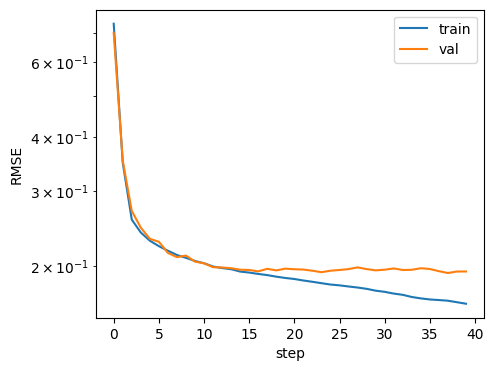

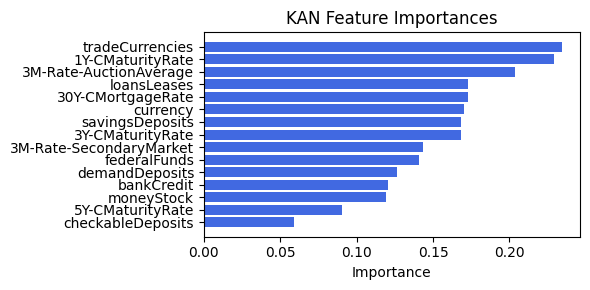

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.56it/s]

[('3M-Rate-SecondaryMarket', 0.26475013351910526), ('tradeCurrencies', 0.036088662647775244), ('loansLeases', 0.026524202118577835), ('checkableDeposits', 0.017309519173466556), ('30Y-CMortgageRate', 0.017198138445660118), ('demandDeposits', 0.01181412245108125), ('moneyStock', 0.010425473264573763), ('savingsDeposits', 0.009316337654863241), ('3Y-CMaturityRate', 0.006303298772711839), ('3M-Rate-AuctionAverage', 0.006262024621745305), ('1Y-CMaturityRate', 0.003961915887304626), ('currency', 0.0007122505184573431), ('bankCredit', 1.852241943457297e-05), ('5Y-CMaturityRate', 5.030600420598473e-06), ('federalFunds', 4.13249373585651e-06), ('Ex1', 0.0)]


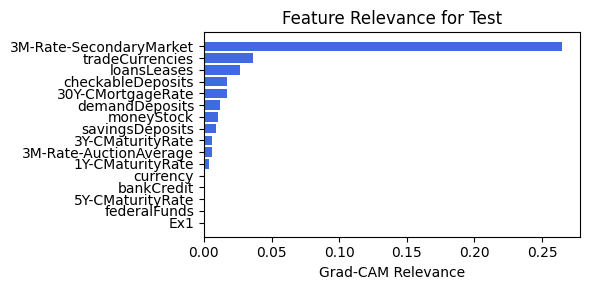

In [60]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=8, lamb=0.0001, steps=40)

### 1.0.7 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.63e-01 | eval_loss: 1.94e-01 | reg: 2.20e+01 |: 100%|█| 40/40 [00:12<00:00,  3.17it/

saving model version 0.1
Best epoch 22
0.24943451583385468
M_KAN Relevance: 0.0757826715707779
CNN Relevance: 0.9242172837257385
[('federalFunds', 0.41419736), ('tradeCurrencies', 0.33540797), ('loansLeases', 0.32784444), ('savingsDeposits', 0.32145548), ('checkableDeposits', 0.28595176), ('bankCredit', 0.26569268), ('30Y-CMortgageRate', 0.22987156), ('5Y-CMaturityRate', 0.21653214), ('1Y-CMaturityRate', 0.20078163), ('3M-Rate-AuctionAverage', 0.16862896), ('currency', 0.15903136), ('3M-Rate-SecondaryMarket', 0.15594956), ('moneyStock', 0.15062812), ('3Y-CMaturityRate', 0.11861674), ('demandDeposits', 0.095279574)]


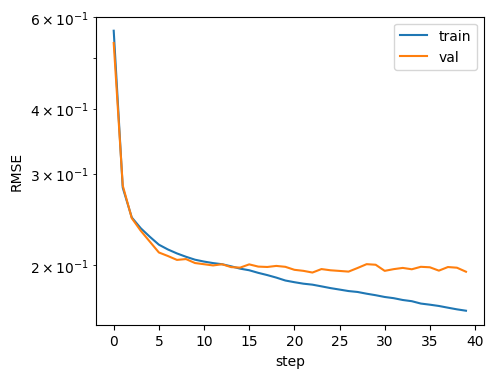

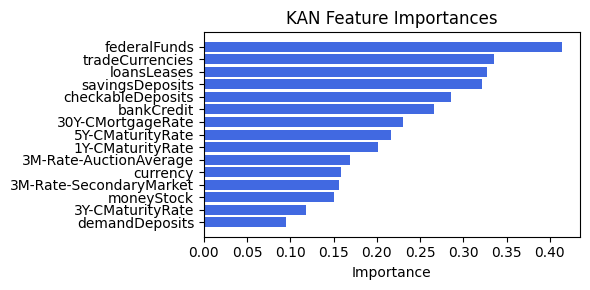

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.47it/s]


[('loansLeases', 0.08543336054288028), ('3M-Rate-SecondaryMarket', 0.024745970928952806), ('Ex1', 0.007028511556841078), ('checkableDeposits', 0.004015654298876013), ('demandDeposits', 0.003945498984484446), ('savingsDeposits', 0.0035705909576444397), ('1Y-CMaturityRate', 0.0023481418334302447), ('currency', 0.0009444301160761998), ('3M-Rate-AuctionAverage', 0.0008426549888792492), ('30Y-CMortgageRate', 0.00057382910911526), ('bankCredit', 3.6018148862889836e-05), ('5Y-CMaturityRate', 5.892336013771239e-06), ('3Y-CMaturityRate', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('tradeCurrencies', 0.0)]


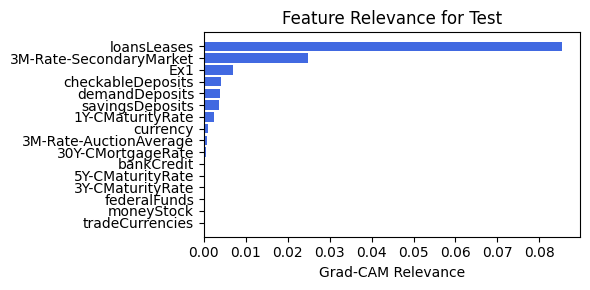

In [61]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=10, lamb=0.0001, steps=40)

### 1.0.8 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=10

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.64e-01 | eval_loss: 2.00e-01 | reg: 2.07e+01 |: 100%|█| 40/40 [00:12<00:00,  3.12it/

saving model version 0.1
Best epoch 17
0.2429293394088745
M_KAN Relevance: 0.06997823715209961
CNN Relevance: 0.9300217628479004
[('tradeCurrencies', 0.36502895), ('federalFunds', 0.3171614), ('savingsDeposits', 0.28958064), ('checkableDeposits', 0.2661999), ('30Y-CMortgageRate', 0.23530944), ('1Y-CMaturityRate', 0.2246611), ('loansLeases', 0.20707564), ('3M-Rate-SecondaryMarket', 0.19755358), ('bankCredit', 0.18688592), ('currency', 0.17738904), ('5Y-CMaturityRate', 0.1703046), ('moneyStock', 0.14800014), ('3M-Rate-AuctionAverage', 0.14444824), ('demandDeposits', 0.11319109), ('3Y-CMaturityRate', 0.10955703)]


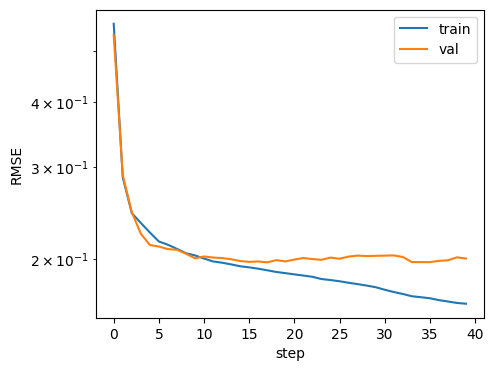

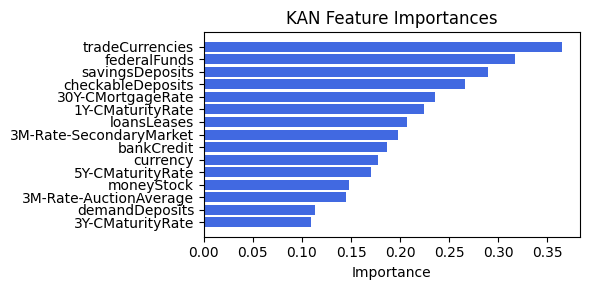

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.81it/s]

[('3M-Rate-SecondaryMarket', 0.44455203087556927), ('30Y-CMortgageRate', 0.28661400760313316), ('3M-Rate-AuctionAverage', 0.2694369715208831), ('1Y-CMaturityRate', 0.14497029715369406), ('loansLeases', 0.05169096990887608), ('checkableDeposits', 0.01916886411130517), ('savingsDeposits', 0.013725213606570226), ('demandDeposits', 0.011955955260921093), ('currency', 0.008215952267692912), ('moneyStock', 0.0023067913195561796), ('tradeCurrencies', 0.00022448192882750716), ('federalFunds', 1.619515186619191e-05), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('Ex1', 0.0)]


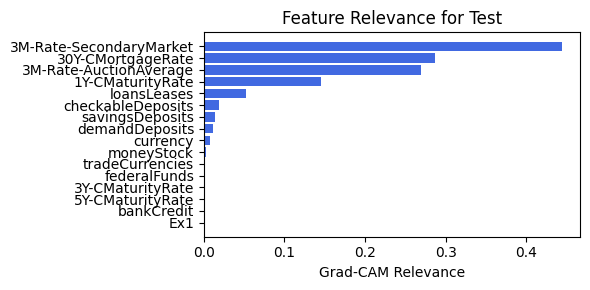

In [62]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=10, lamb=0.0001, steps=40)

### 1.0.9 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.65e-01 | eval_loss: 1.89e-01 | reg: 2.10e+01 |: 100%|█| 40/40 [00:11<00:00,  3.36it/

saving model version 0.1
Best epoch 32
0.22721236944198608
M_KAN Relevance: 0.05072132125496864
CNN Relevance: 0.9492786526679993
[('tradeCurrencies', 0.3541663), ('savingsDeposits', 0.30918846), ('checkableDeposits', 0.30525577), ('30Y-CMortgageRate', 0.23183136), ('1Y-CMaturityRate', 0.21053393), ('3M-Rate-AuctionAverage', 0.2014515), ('3Y-CMaturityRate', 0.14987098), ('moneyStock', 0.14966145), ('3M-Rate-SecondaryMarket', 0.14958708), ('bankCredit', 0.14950429), ('loansLeases', 0.14833434), ('5Y-CMaturityRate', 0.14278609), ('demandDeposits', 0.13694969), ('currency', 0.13232224), ('federalFunds', 0.12343061)]


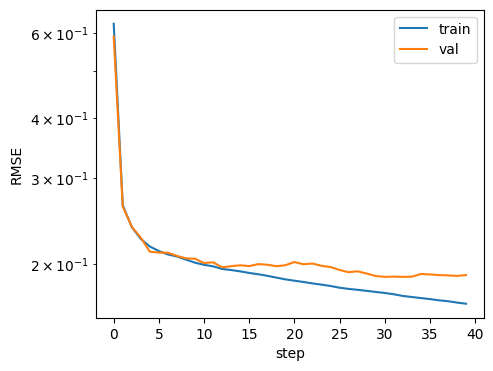

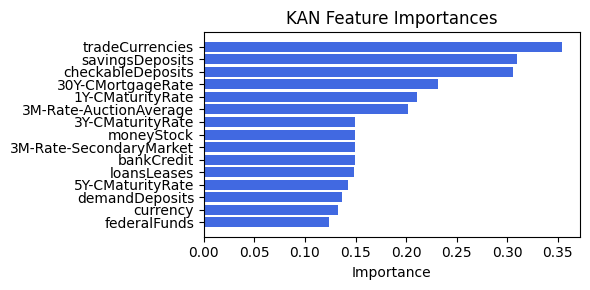

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  9.02it/s]

[('tradeCurrencies', 0.3539644060678603), ('loansLeases', 0.22535278563875527), ('savingsDeposits', 0.14819715821317264), ('3Y-CMaturityRate', 0.11484165107387873), ('demandDeposits', 0.05409982805639239), ('3M-Rate-SecondaryMarket', 0.03300566062264677), ('currency', 0.02812068765772329), ('Ex1', 0.01319897824765316), ('checkableDeposits', 0.004106588023049491), ('1Y-CMaturityRate', 0.0031983796965851935), ('federalFunds', 0.0018503884431473644), ('5Y-CMaturityRate', 0.00011065986805728504), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('bankCredit', 0.0), ('moneyStock', 0.0)]


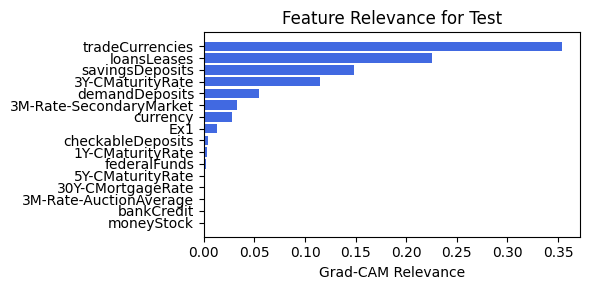

In [63]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=15, lamb=0.0001, steps=40)

### 1.0.10 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.70e-01 | eval_loss: 1.94e-01 | reg: 2.29e+01 |: 100%|█| 40/40 [00:12<00:00,  3.32it/

saving model version 0.1
Best epoch 39
0.23096813261508942
M_KAN Relevance: 0.0753370001912117
CNN Relevance: 0.9246630072593689
[('savingsDeposits', 0.38244188), ('checkableDeposits', 0.36607832), ('tradeCurrencies', 0.3426808), ('30Y-CMortgageRate', 0.24323924), ('1Y-CMaturityRate', 0.20285068), ('3M-Rate-AuctionAverage', 0.20027502), ('5Y-CMaturityRate', 0.19149274), ('demandDeposits', 0.17397788), ('loansLeases', 0.17096637), ('3M-Rate-SecondaryMarket', 0.16478461), ('3Y-CMaturityRate', 0.16327986), ('currency', 0.14622511), ('bankCredit', 0.14600086), ('moneyStock', 0.13960634), ('federalFunds', 0.085471086)]


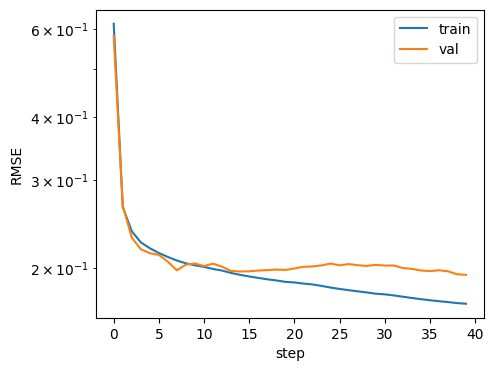

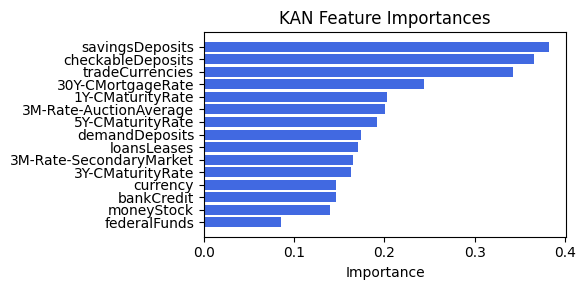

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.61it/s]

[('3M-Rate-SecondaryMarket', 0.512768847105049), ('checkableDeposits', 0.4325067773416993), ('currency', 0.1648367496143605), ('loansLeases', 0.06136685795583097), ('tradeCurrencies', 0.05896348752014871), ('Ex1', 0.052364476775498284), ('savingsDeposits', 0.04556741559977776), ('demandDeposits', 0.0018829074768637794), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0)]


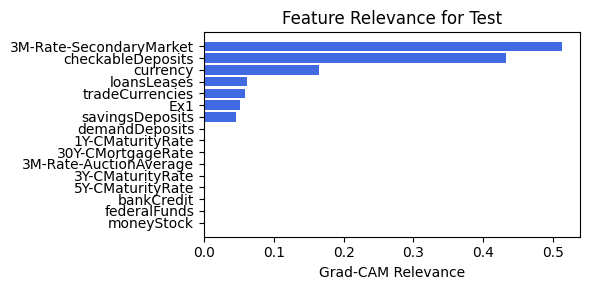

In [64]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=15, lamb=0.0001, steps=40)

### 1.0.11 width=[15, 5, 1], grid=4, lamb=0.0001 | cnn_bottleneck_dim=18

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.75e-01 | eval_loss: 1.93e-01 | reg: 2.25e+01 |: 100%|█| 40/40 [00:12<00:00,  3.09it/

saving model version 0.1
Best epoch 37
0.23197579383850098
M_KAN Relevance: 0.040437258780002594
CNN Relevance: 0.9595627188682556
[('loansLeases', 0.37398836), ('savingsDeposits', 0.3168596), ('tradeCurrencies', 0.3123254), ('federalFunds', 0.3081664), ('checkableDeposits', 0.27281067), ('bankCredit', 0.22070141), ('30Y-CMortgageRate', 0.21907385), ('5Y-CMaturityRate', 0.2058589), ('currency', 0.19287007), ('3M-Rate-SecondaryMarket', 0.18784475), ('moneyStock', 0.16338491), ('3M-Rate-AuctionAverage', 0.15468633), ('1Y-CMaturityRate', 0.14298952), ('3Y-CMaturityRate', 0.122777104), ('demandDeposits', 0.122507714)]


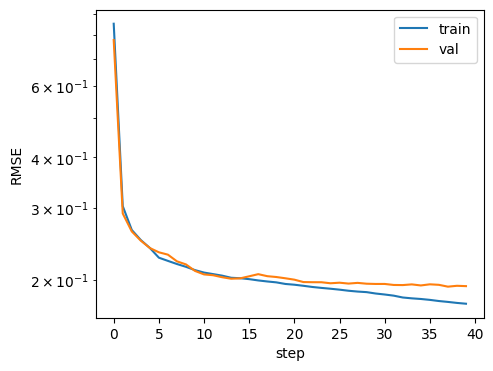

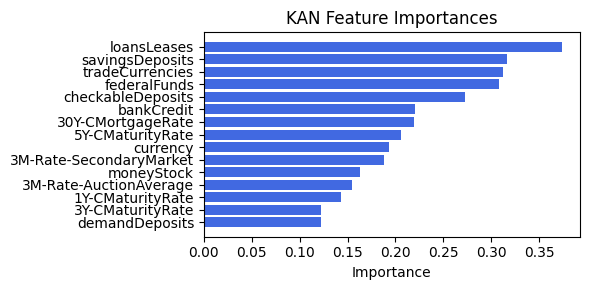

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.73it/s]

[('loansLeases', 0.29633502004047235), ('savingsDeposits', 0.06056709054059216), ('currency', 0.0005208333333333333), ('1Y-CMaturityRate', 0.0004207362376508259), ('3M-Rate-SecondaryMarket', 5.471489525267056e-05), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


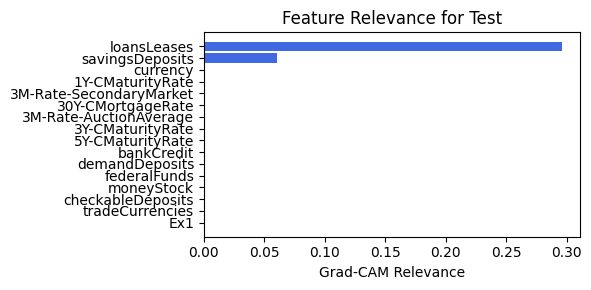

In [38]:
train_and_plot_relevance(Model3_1, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=18, lamb=0.0001, steps=40)

## 1.1 width=[15, 6, 1], grid=5, lamb=1e-05

### 1.1.1 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.80e-01 | eval_loss: 2.07e-01 | reg: 4.34e+01 |: 100%|█| 40/40 [00:12<00:00,  3.08it/

saving model version 0.1
Best epoch 25
0.26131337881088257
M_KAN Relevance: 0.0777084082365036
CNN Relevance: 0.92229163646698
[('loansLeases', 0.21980238), ('currency', 0.1579804), ('savingsDeposits', 0.11786264), ('bankCredit', 0.112715885), ('federalFunds', 0.10820383), ('demandDeposits', 0.09504216), ('5Y-CMaturityRate', 0.09469123), ('30Y-CMortgageRate', 0.092935935), ('moneyStock', 0.0891019), ('1Y-CMaturityRate', 0.082850516), ('checkableDeposits', 0.07900116), ('3Y-CMaturityRate', 0.07462017), ('3M-Rate-AuctionAverage', 0.07155155), ('tradeCurrencies', 0.06264834), ('3M-Rate-SecondaryMarket', 0.057644065)]


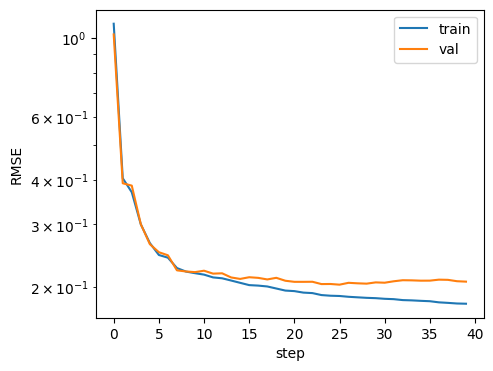

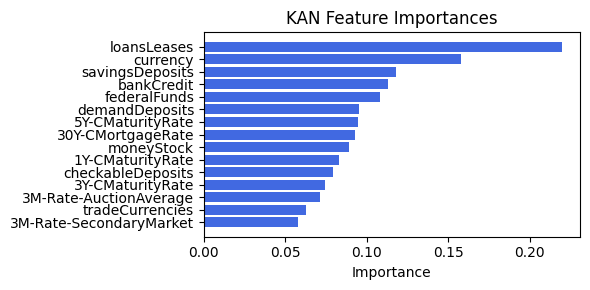

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.81it/s]


[('loansLeases', 0.20338857487908432), ('savingsDeposits', 0.030621610808053187), ('1Y-CMaturityRate', 0.0036087741809231895), ('3M-Rate-AuctionAverage', 0.0017855254312356312), ('3M-Rate-SecondaryMarket', 0.0013634195906065758), ('30Y-CMortgageRate', 0.0003082840215592157), ('demandDeposits', 0.00024006613308475132), ('bankCredit', 0.00010628873548869575), ('3Y-CMaturityRate', 5.73800921085335e-05), ('currency', 1.725085700551669e-05), ('5Y-CMaturityRate', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


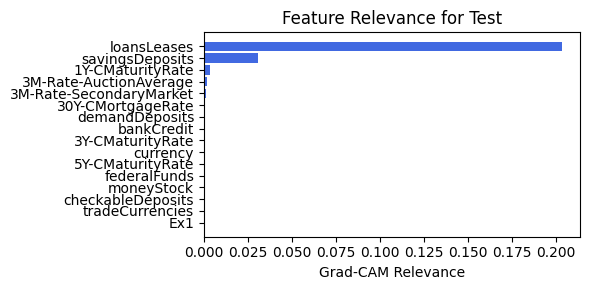

In [65]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=3, lamb=1e-05, steps=40)

### 1.1.2 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.80e-01 | eval_loss: 2.07e-01 | reg: 4.34e+01 |: 100%|█| 40/40 [00:14<00:00,  2.83it/


saving model version 0.1
Best epoch 25
0.26131337881088257
M_KAN Relevance: 0.0777084082365036
CNN Relevance: 0.92229163646698
[('loansLeases', 0.21980238), ('currency', 0.1579804), ('savingsDeposits', 0.11786264), ('bankCredit', 0.112715885), ('federalFunds', 0.10820383), ('demandDeposits', 0.09504216), ('5Y-CMaturityRate', 0.09469123), ('30Y-CMortgageRate', 0.092935935), ('moneyStock', 0.0891019), ('1Y-CMaturityRate', 0.082850516), ('checkableDeposits', 0.07900116), ('3Y-CMaturityRate', 0.07462017), ('3M-Rate-AuctionAverage', 0.07155155), ('tradeCurrencies', 0.06264834), ('3M-Rate-SecondaryMarket', 0.057644065)]


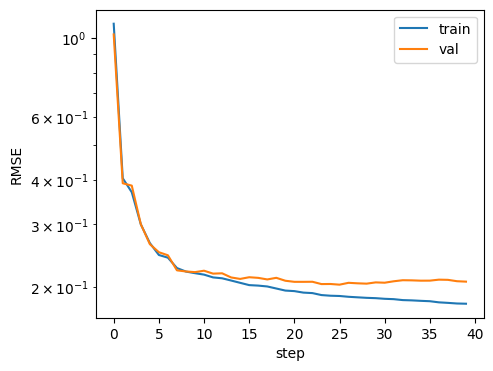

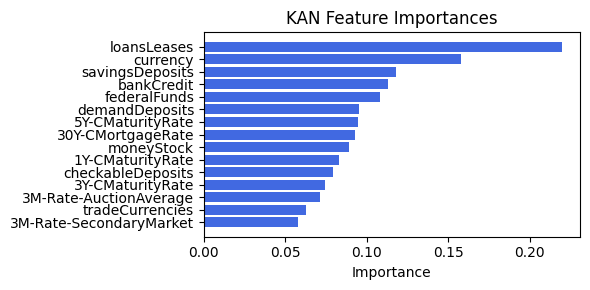

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.74it/s]


[('loansLeases', 0.20338857487908432), ('savingsDeposits', 0.030621610808053187), ('1Y-CMaturityRate', 0.0036087741809231895), ('3M-Rate-AuctionAverage', 0.0017855254312356312), ('3M-Rate-SecondaryMarket', 0.0013634195906065758), ('30Y-CMortgageRate', 0.0003082840215592157), ('demandDeposits', 0.00024006613308475132), ('bankCredit', 0.00010628873548869575), ('3Y-CMaturityRate', 5.73800921085335e-05), ('currency', 1.725085700551669e-05), ('5Y-CMaturityRate', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


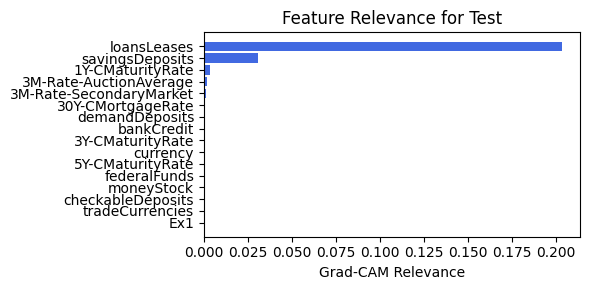

In [66]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=3, lamb=1e-05, steps=40)

### 1.1.3 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.82e-01 | eval_loss: 1.87e-01 | reg: 3.10e+01 |: 100%|█| 40/40 [00:16<00:00,  2.45it/

saving model version 0.1
Best epoch 39
0.23060919344425201
M_KAN Relevance: 0.07431341707706451
CNN Relevance: 0.9256865978240967
[('checkableDeposits', 0.2393876), ('1Y-CMaturityRate', 0.1983386), ('tradeCurrencies', 0.18257138), ('3M-Rate-AuctionAverage', 0.16156885), ('5Y-CMaturityRate', 0.15008482), ('loansLeases', 0.14395557), ('30Y-CMortgageRate', 0.14256862), ('bankCredit', 0.13669863), ('3Y-CMaturityRate', 0.13571587), ('3M-Rate-SecondaryMarket', 0.12040019), ('currency', 0.10609623), ('demandDeposits', 0.10126986), ('moneyStock', 0.0921749), ('federalFunds', 0.086420685), ('savingsDeposits', 0.058221646)]


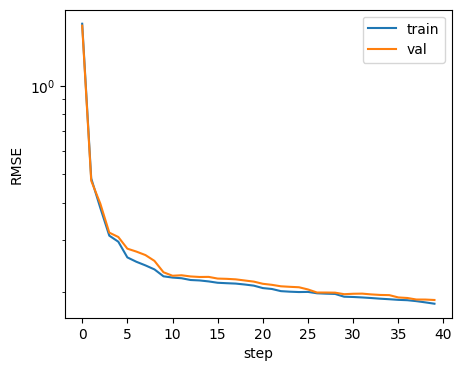

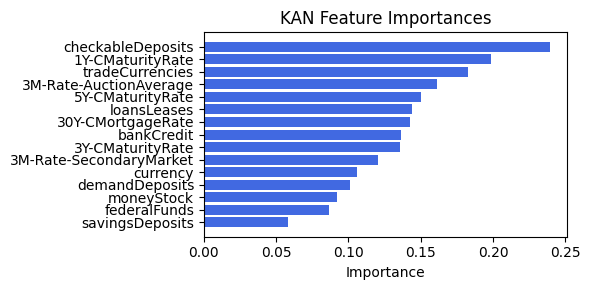

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.67it/s]


[('loansLeases', 0.2991961573117546), ('tradeCurrencies', 0.19403625816284192), ('savingsDeposits', 0.10142923384638769), ('demandDeposits', 0.048351961627070394), ('3M-Rate-SecondaryMarket', 0.005640234478882381), ('1Y-CMaturityRate', 0.0020842540831792922), ('3Y-CMaturityRate', 0.0009609750915496123), ('currency', 0.00014648158990201497), ('30Y-CMortgageRate', 3.196011031312602e-05), ('3M-Rate-AuctionAverage', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


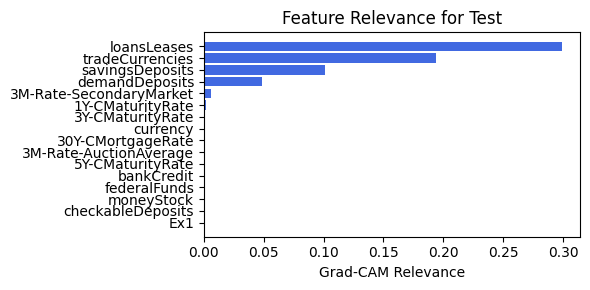

In [67]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=6, lamb=1e-05, steps=40)

### 1.1.4 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.83e-01 | eval_loss: 1.99e-01 | reg: 2.86e+01 |: 100%|█| 40/40 [00:12<00:00,  3.11it/

saving model version 0.1
Best epoch 39
0.20552930235862732
M_KAN Relevance: 0.05347231775522232
CNN Relevance: 0.9465277194976807
[('checkableDeposits', 0.2382767), ('30Y-CMortgageRate', 0.19948344), ('federalFunds', 0.16867733), ('loansLeases', 0.16479878), ('tradeCurrencies', 0.14933455), ('3M-Rate-SecondaryMarket', 0.14722192), ('currency', 0.1411733), ('demandDeposits', 0.121403776), ('3M-Rate-AuctionAverage', 0.112124875), ('5Y-CMaturityRate', 0.10929932), ('bankCredit', 0.100297324), ('3Y-CMaturityRate', 0.09804725), ('1Y-CMaturityRate', 0.095774524), ('moneyStock', 0.0951218), ('savingsDeposits', 0.08210476)]


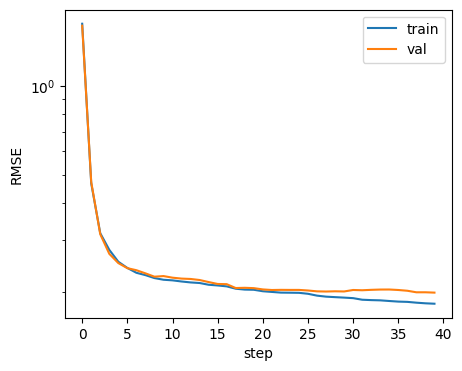

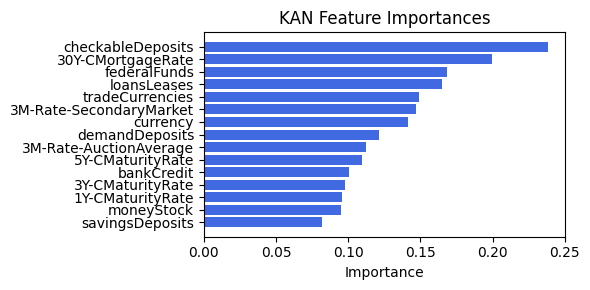

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.68it/s]


[('loansLeases', 0.20088431831626666), ('savingsDeposits', 0.040403679394651025), ('demandDeposits', 0.008595858070821989), ('3M-Rate-SecondaryMarket', 0.008272990477936608), ('1Y-CMaturityRate', 0.0019337736424945649), ('currency', 0.00024117580836727505), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


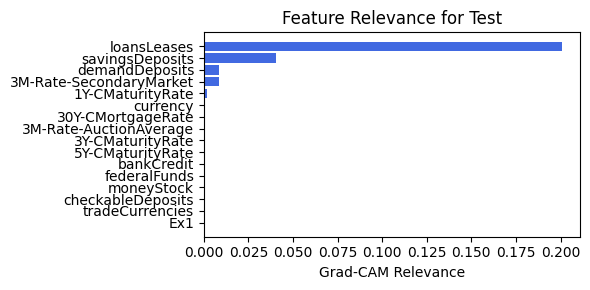

In [68]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=6, lamb=1e-05, steps=40)

### 1.1.5 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.35e-01 | eval_loss: 1.90e-01 | reg: 2.74e+01 |: 100%|█| 40/40 [00:12<00:00,  3.10it/

saving model version 0.1
Best epoch 23
0.23892615735530853
M_KAN Relevance: 0.1742265224456787
CNN Relevance: 0.8257734775543213
[('tradeCurrencies', 0.4359926), ('checkableDeposits', 0.4292454), ('federalFunds', 0.39199919), ('3Y-CMaturityRate', 0.3643583), ('currency', 0.33974868), ('30Y-CMortgageRate', 0.312225), ('demandDeposits', 0.2892254), ('3M-Rate-SecondaryMarket', 0.28522208), ('5Y-CMaturityRate', 0.2643122), ('moneyStock', 0.25232992), ('loansLeases', 0.22223543), ('1Y-CMaturityRate', 0.21772927), ('3M-Rate-AuctionAverage', 0.21750101), ('savingsDeposits', 0.2171651), ('bankCredit', 0.20355062)]


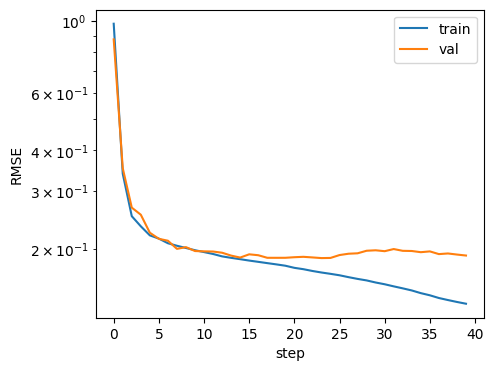

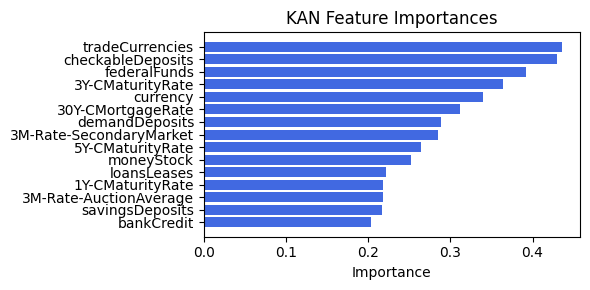

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.24it/s]

[('loansLeases', 0.2872906831580968), ('tradeCurrencies', 0.20939656379438626), ('savingsDeposits', 0.10767286101444846), ('demandDeposits', 0.1040088496747471), ('3Y-CMaturityRate', 0.05697399971651889), ('Ex1', 0.007291666666666667), ('1Y-CMaturityRate', 0.0010219749240648179), ('currency', 0.0007192734096731459), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


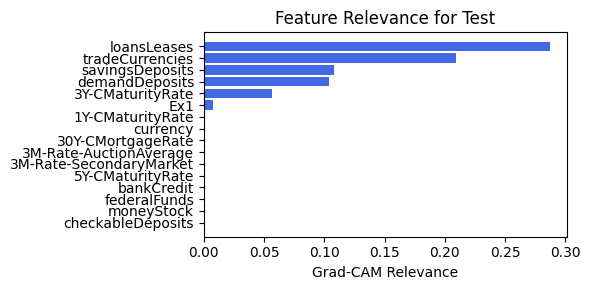

In [69]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=9, lamb=1e-05, steps=40)

### 1.1.6 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.28e-01 | eval_loss: 1.99e-01 | reg: 2.77e+01 |: 100%|█| 40/40 [00:12<00:00,  3.17it/

saving model version 0.1
Best epoch 19
0.24192340672016144
M_KAN Relevance: 0.19954080879688263
CNN Relevance: 0.8004591464996338
[('30Y-CMortgageRate', 0.60090154), ('tradeCurrencies', 0.5018097), ('3Y-CMaturityRate', 0.46397763), ('bankCredit', 0.41178483), ('checkableDeposits', 0.38704547), ('demandDeposits', 0.35431033), ('moneyStock', 0.32915294), ('loansLeases', 0.32264572), ('1Y-CMaturityRate', 0.30627415), ('currency', 0.3020508), ('3M-Rate-SecondaryMarket', 0.2732179), ('5Y-CMaturityRate', 0.24498896), ('federalFunds', 0.23939745), ('3M-Rate-AuctionAverage', 0.23030978), ('savingsDeposits', 0.2052716)]


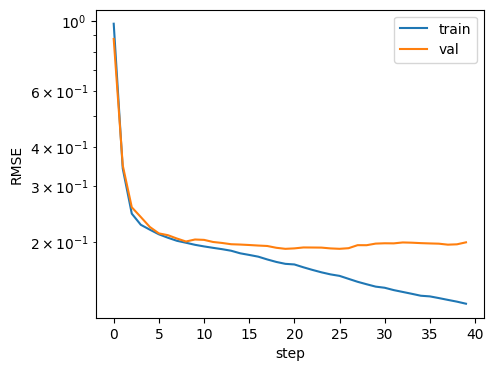

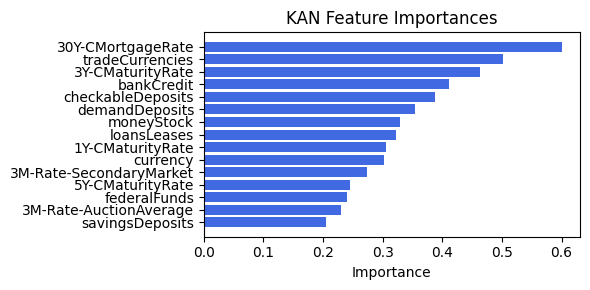

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.78it/s]


[('loansLeases', 0.2756927332619116), ('tradeCurrencies', 0.1344015293178104), ('savingsDeposits', 0.13305736420429423), ('Ex1', 0.014827201479957218), ('demandDeposits', 0.01057784380862445), ('3M-Rate-SecondaryMarket', 0.0028455815144947595), ('currency', 0.0008907463933740343), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


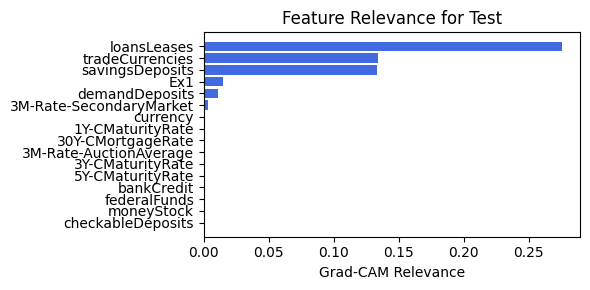

In [70]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=9, lamb=1e-05, steps=40)

### 1.1.7 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.60e-01 | eval_loss: 2.01e-01 | reg: 3.39e+01 |: 100%|█| 40/40 [00:13<00:00,  3.05it/

saving model version 0.1
Best epoch 32
0.22786277532577515
M_KAN Relevance: 0.1758221983909607
CNN Relevance: 0.8241777420043945
[('tradeCurrencies', 0.20932376), ('checkableDeposits', 0.20363447), ('bankCredit', 0.18427186), ('moneyStock', 0.18391368), ('30Y-CMortgageRate', 0.18352881), ('federalFunds', 0.18124264), ('3M-Rate-SecondaryMarket', 0.16996352), ('3Y-CMaturityRate', 0.16025594), ('5Y-CMaturityRate', 0.15808296), ('3M-Rate-AuctionAverage', 0.15432933), ('1Y-CMaturityRate', 0.14169395), ('loansLeases', 0.14030218), ('currency', 0.13602321), ('demandDeposits', 0.09666332), ('savingsDeposits', 0.077816084)]


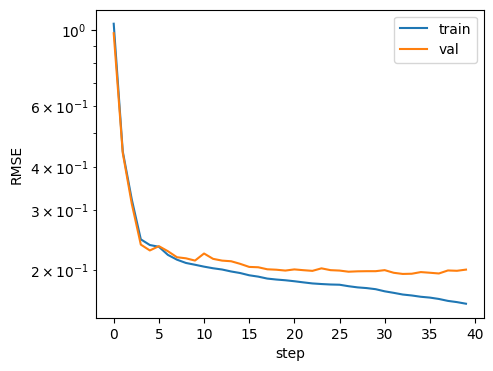

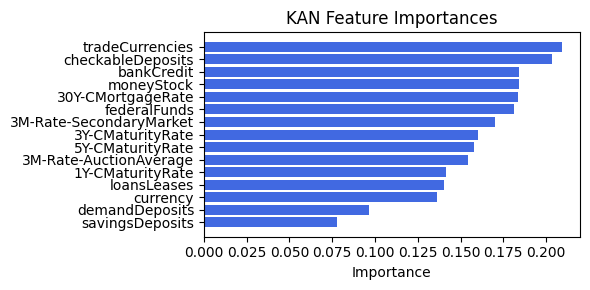

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.69it/s]


[('loansLeases', 0.29916833951359706), ('savingsDeposits', 0.09338958710764668), ('tradeCurrencies', 0.021555174784069615), ('demandDeposits', 0.014606060426948326), ('1Y-CMaturityRate', 0.0017849811485835484), ('3M-Rate-SecondaryMarket', 1.2571366858624276e-05), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


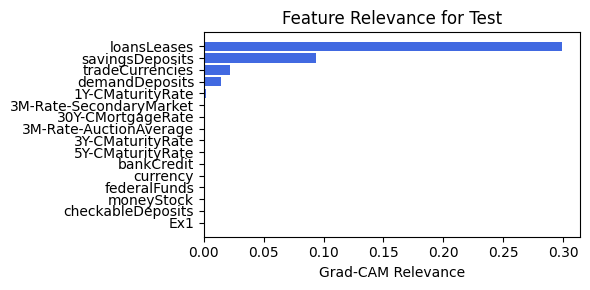

In [71]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=12, lamb=1e-05, steps=40)

### 1.1.8 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.61e-01 | eval_loss: 1.86e-01 | reg: 3.16e+01 |: 100%|█| 40/40 [00:12<00:00,  3.14it/

saving model version 0.1
Best epoch 37
0.19213134050369263
M_KAN Relevance: 0.20740750432014465
CNN Relevance: 0.7925925254821777
[('loansLeases', 0.21194707), ('federalFunds', 0.18579972), ('3M-Rate-SecondaryMarket', 0.1787158), ('savingsDeposits', 0.14111762), ('30Y-CMortgageRate', 0.14012109), ('1Y-CMaturityRate', 0.137045), ('tradeCurrencies', 0.13035858), ('currency', 0.12703617), ('checkableDeposits', 0.1229388), ('moneyStock', 0.11723062), ('bankCredit', 0.11311903), ('3M-Rate-AuctionAverage', 0.11109139), ('5Y-CMaturityRate', 0.099436045), ('3Y-CMaturityRate', 0.0824108), ('demandDeposits', 0.07670202)]


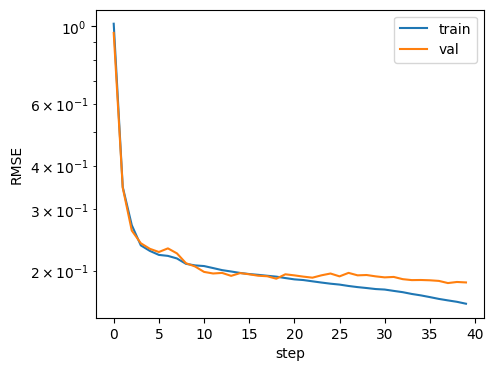

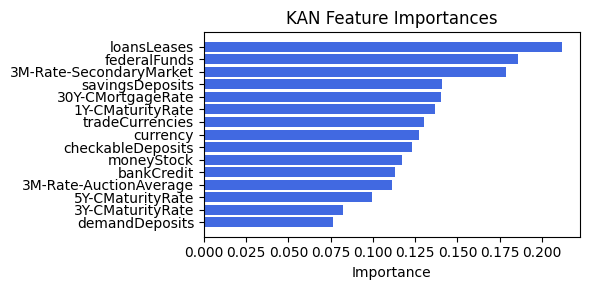

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  8.03it/s]

[('loansLeases', 0.06207287965697192), ('savingsDeposits', 0.01661003026224318), ('1Y-CMaturityRate', 0.0015290771211896625), ('3M-Rate-SecondaryMarket', 0.00025428049266338346), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


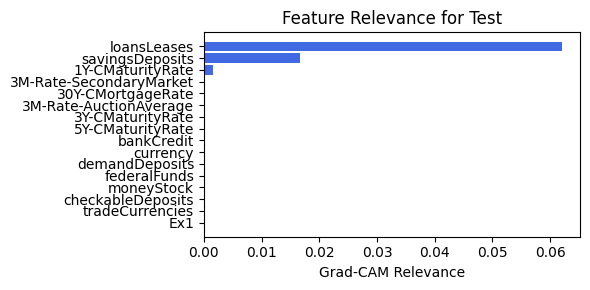

In [73]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=12, lamb=1e-05, steps=40)

### 1.1.8a width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.62e-01 | eval_loss: 1.84e-01 | reg: 3.51e+01 |: 100%|█| 40/40 [00:12<00:00,  3.21it/

saving model version 0.1
Best epoch 37
0.2093443125486374
M_KAN Relevance: 0.2012813538312912
CNN Relevance: 0.7987186312675476
[('checkableDeposits', 0.19596504), ('loansLeases', 0.16501708), ('tradeCurrencies', 0.14622878), ('30Y-CMortgageRate', 0.14094904), ('bankCredit', 0.13629113), ('moneyStock', 0.12946343), ('5Y-CMaturityRate', 0.11469629), ('currency', 0.113015085), ('3M-Rate-SecondaryMarket', 0.11264485), ('federalFunds', 0.101770245), ('3Y-CMaturityRate', 0.099745445), ('demandDeposits', 0.09377741), ('1Y-CMaturityRate', 0.09210953), ('3M-Rate-AuctionAverage', 0.09091293), ('savingsDeposits', 0.08708644)]


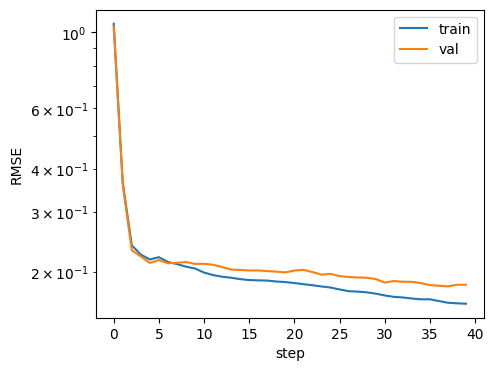

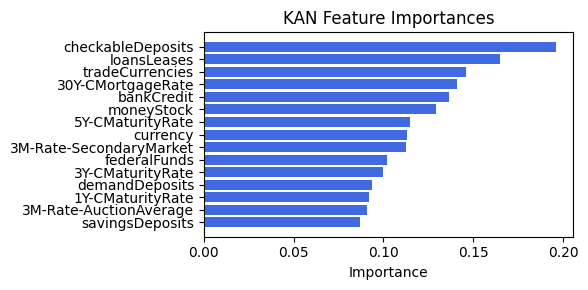

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.37it/s]


[('loansLeases', 0.3807181613076301), ('tradeCurrencies', 0.07947038324727189), ('demandDeposits', 0.029479320656641255), ('3Y-CMaturityRate', 0.012077707619894119), ('savingsDeposits', 0.007958023466995829), ('1Y-CMaturityRate', 0.0008914350044159662), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


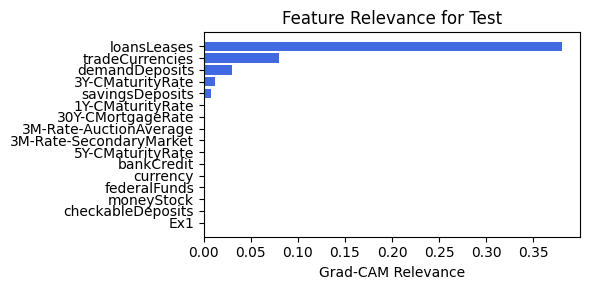

In [100]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=12, lamb=1e-06, steps=40)

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.43e-01 | eval_loss: 1.95e-01 | reg: 3.13e+01 |: 100%|█| 50/50 [00:17<00:00,  2.78it/

saving model version 0.1
Best epoch 24
0.22078965604305267
M_KAN Relevance: 0.16170795261859894
CNN Relevance: 0.8382920622825623
[('checkableDeposits', 0.31123313), ('moneyStock', 0.2967087), ('tradeCurrencies', 0.28379905), ('loansLeases', 0.27746785), ('federalFunds', 0.27732775), ('3Y-CMaturityRate', 0.24150777), ('30Y-CMortgageRate', 0.23684339), ('currency', 0.23427133), ('5Y-CMaturityRate', 0.21122226), ('1Y-CMaturityRate', 0.16692063), ('3M-Rate-SecondaryMarket', 0.16522239), ('3M-Rate-AuctionAverage', 0.15278316), ('savingsDeposits', 0.15238951), ('demandDeposits', 0.14578009), ('bankCredit', 0.13901943)]


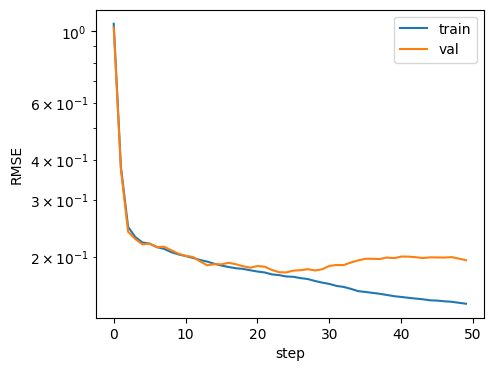

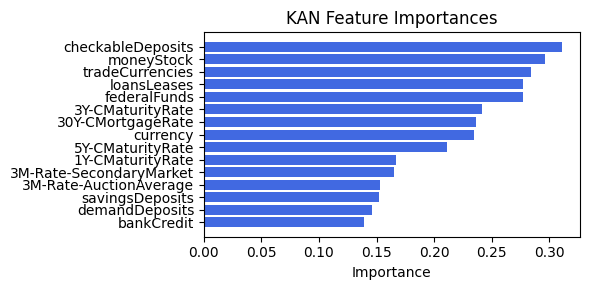

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  8.06it/s]


[('loansLeases', 0.396561888986755), ('tradeCurrencies', 0.0736896228932199), ('savingsDeposits', 0.06243460221726092), ('demandDeposits', 0.053608785763138996), ('3M-Rate-SecondaryMarket', 0.004826912177460534), ('1Y-CMaturityRate', 0.0025792962028866723), ('30Y-CMortgageRate', 1.952845292786757e-05), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


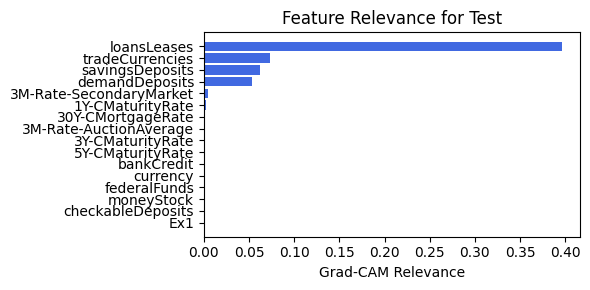

In [102]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=12, lamb=1e-07, steps=50)

### 1.1.9 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.67e-01 | eval_loss: 1.97e-01 | reg: 2.88e+01 |: 100%|█| 40/40 [00:12<00:00,  3.16it/

saving model version 0.1
Best epoch 34
0.20946604013442993
M_KAN Relevance: 0.14573349058628082
CNN Relevance: 0.8542664647102356
[('checkableDeposits', 0.26677242), ('tradeCurrencies', 0.22562069), ('moneyStock', 0.19207546), ('federalFunds', 0.18679047), ('1Y-CMaturityRate', 0.18595394), ('loansLeases', 0.181501), ('5Y-CMaturityRate', 0.17950174), ('3Y-CMaturityRate', 0.16535702), ('3M-Rate-SecondaryMarket', 0.1629813), ('30Y-CMortgageRate', 0.15527093), ('bankCredit', 0.15220171), ('savingsDeposits', 0.1496288), ('demandDeposits', 0.1289206), ('3M-Rate-AuctionAverage', 0.11043045), ('currency', 0.10565153)]


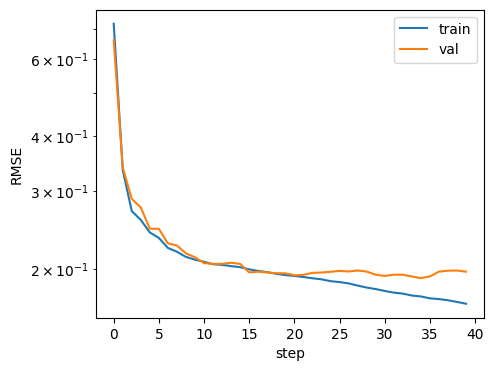

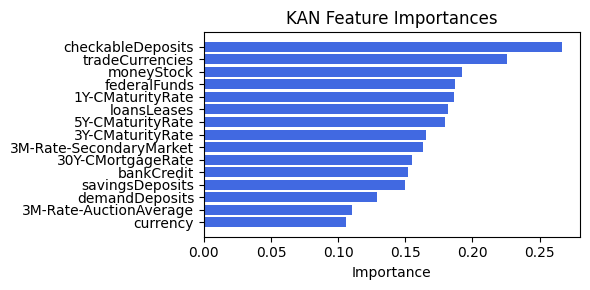

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  8.02it/s]

[('loansLeases', 0.19042292452927323), ('savingsDeposits', 0.01002833945454941), ('demandDeposits', 0.006254889221773261), ('1Y-CMaturityRate', 0.0036782440330301014), ('3M-Rate-SecondaryMarket', 0.0027269847868453888), ('3M-Rate-AuctionAverage', 0.0012440834726606096), ('currency', 0.00044237345989261355), ('30Y-CMortgageRate', 0.0003601843402499244), ('bankCredit', 0.000309930413606621), ('5Y-CMaturityRate', 5.444953151579414e-05), ('3Y-CMaturityRate', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


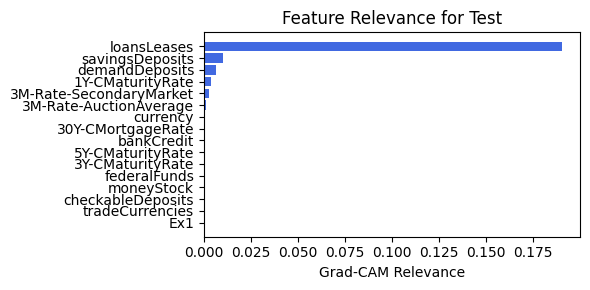

In [138]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=15, lamb=1e-05, steps=40)

### 1.1.10 width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.67e-01 | eval_loss: 1.97e-01 | reg: 2.88e+01 |: 100%|█| 40/40 [00:12<00:00,  3.22it/

saving model version 0.1
Best epoch 34
0.20946604013442993
M_KAN Relevance: 0.14573349058628082
CNN Relevance: 0.8542664647102356
[('checkableDeposits', 0.26677242), ('tradeCurrencies', 0.22562069), ('moneyStock', 0.19207546), ('federalFunds', 0.18679047), ('1Y-CMaturityRate', 0.18595394), ('loansLeases', 0.181501), ('5Y-CMaturityRate', 0.17950174), ('3Y-CMaturityRate', 0.16535702), ('3M-Rate-SecondaryMarket', 0.1629813), ('30Y-CMortgageRate', 0.15527093), ('bankCredit', 0.15220171), ('savingsDeposits', 0.1496288), ('demandDeposits', 0.1289206), ('3M-Rate-AuctionAverage', 0.11043045), ('currency', 0.10565153)]


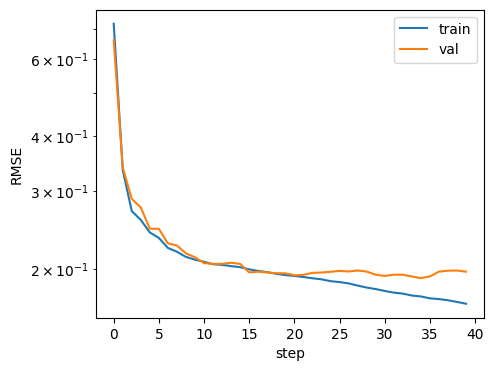

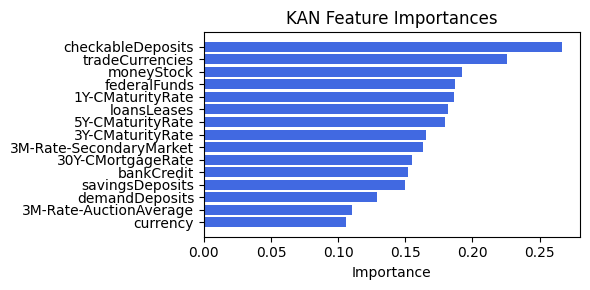

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.23it/s]


[('loansLeases', 0.1904229243163995), ('savingsDeposits', 0.010028339436809931), ('demandDeposits', 0.006254889221773261), ('1Y-CMaturityRate', 0.0036782440330301014), ('3M-Rate-SecondaryMarket', 0.0027269847868453888), ('3M-Rate-AuctionAverage', 0.0012440834726606096), ('currency', 0.00044237345989261355), ('30Y-CMortgageRate', 0.0003601843402499244), ('bankCredit', 0.000309930413606621), ('5Y-CMaturityRate', 5.444953151579414e-05), ('3Y-CMaturityRate', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0), ('Ex1', 0.0)]


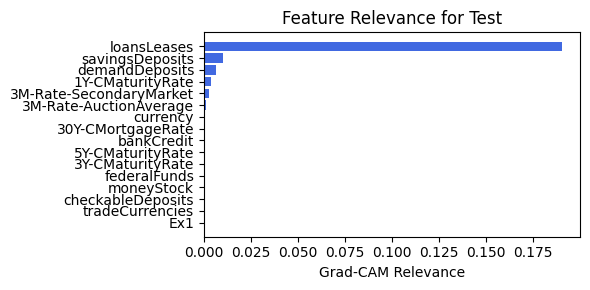

In [139]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=15, lamb=1e-05, steps=40)

### 1.1.10a width=[15, 6, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=15

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.56e-01 | eval_loss: 1.86e-01 | reg: 2.88e+01 |: 100%|█| 40/40 [00:12<00:00,  3.15it/

saving model version 0.1
Best epoch 35
0.21357138454914093
M_KAN Relevance: 0.16606003046035767
CNN Relevance: 0.8339399695396423
[('tradeCurrencies', 0.1943267), ('checkableDeposits', 0.19378969), ('bankCredit', 0.15351897), ('savingsDeposits', 0.15121236), ('moneyStock', 0.14548035), ('currency', 0.14467984), ('3M-Rate-SecondaryMarket', 0.14127818), ('3Y-CMaturityRate', 0.14044413), ('5Y-CMaturityRate', 0.13793191), ('30Y-CMortgageRate', 0.12969221), ('1Y-CMaturityRate', 0.124027416), ('federalFunds', 0.1130709), ('demandDeposits', 0.11049055), ('loansLeases', 0.10953191), ('3M-Rate-AuctionAverage', 0.07917672)]


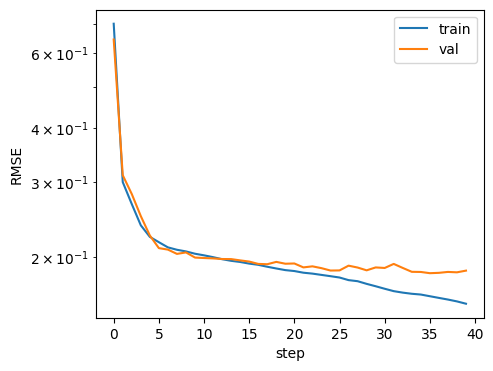

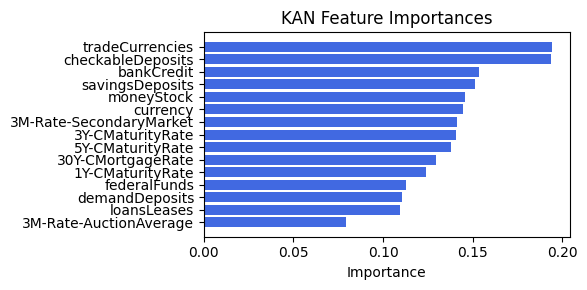

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.61it/s]

[('1Y-CMaturityRate', 0.03844042244544696), ('3M-Rate-SecondaryMarket', 0.01746594611377943), ('3Y-CMaturityRate', 0.013266124923358717), ('loansLeases', 0.012343215578307752), ('demandDeposits', 0.010962881829168292), ('tradeCurrencies', 0.005620230560279673), ('3M-Rate-AuctionAverage', 0.0025636412025917144), ('currency', 0.0011633393132970448), ('30Y-CMortgageRate', 0.0005776893258804367), ('bankCredit', 0.0003752197892892928), ('savingsDeposits', 8.522271860523947e-05), ('5Y-CMaturityRate', 8.396661529938379e-05), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


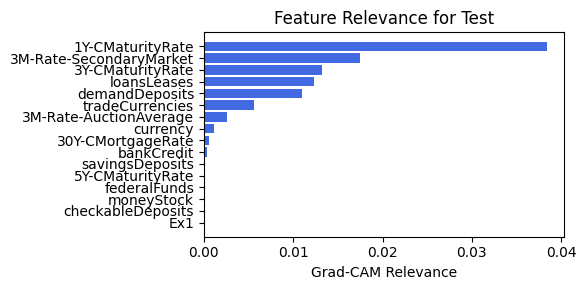

In [40]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=15, lamb=1e-05, steps=40)

## 1.2 width=[15, 1, 1], grid=5, lamb=1e-05

### 1.2.1 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.62e-01 | eval_loss: 1.83e-01 | reg: 1.36e+01 |: 100%|█| 40/40 [00:12<00:00,  3.26it/

saving model version 0.1
Best epoch 26
0.22963635623455048
M_KAN Relevance: 0.04269421845674515
CNN Relevance: 0.9573057889938354
[('5Y-CMaturityRate', 0.38898984), ('1Y-CMaturityRate', 0.34615964), ('currency', 0.3344817), ('savingsDeposits', 0.2933125), ('3M-Rate-AuctionAverage', 0.28355122), ('tradeCurrencies', 0.27947962), ('loansLeases', 0.23810695), ('moneyStock', 0.23120674), ('3M-Rate-SecondaryMarket', 0.23005304), ('demandDeposits', 0.16679187), ('30Y-CMortgageRate', 0.1370048), ('bankCredit', 0.101164594), ('checkableDeposits', 0.09035985), ('federalFunds', 0.0730505), ('3Y-CMaturityRate', 0.068599194)]


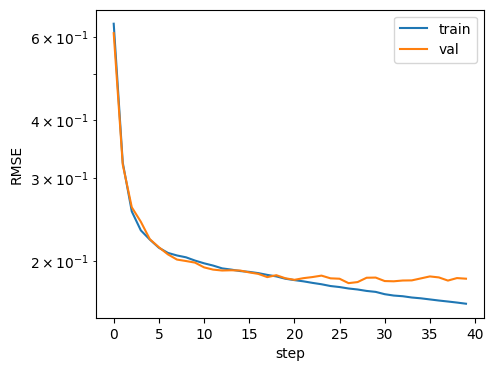

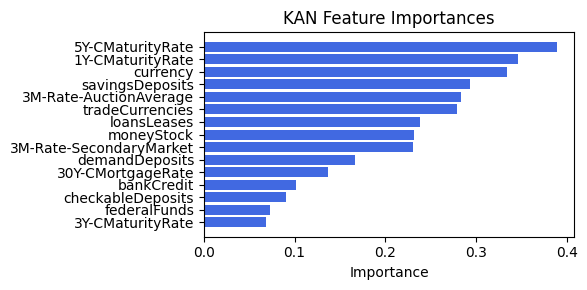

Computing Grad-CAM: 100%|██████████| 210/210 [00:16<00:00, 12.80it/s]


[('3Y-CMaturityRate', 0.24713656622472974), ('1Y-CMaturityRate', 0.0700560847563403), ('demandDeposits', 0.0576168893603608), ('tradeCurrencies', 0.04814633986485812), ('loansLeases', 0.026521527138815837), ('3M-Rate-SecondaryMarket', 0.022354770927839645), ('Ex1', 0.009961099278396952), ('currency', 0.0034806977536174515), ('checkableDeposits', 0.003316667905753656), ('3M-Rate-AuctionAverage', 0.001697169670036861), ('30Y-CMortgageRate', 0.0010361252086503166), ('savingsDeposits', 0.0010230154095119187), ('federalFunds', 0.0008374022567988417), ('5Y-CMaturityRate', 0.0004815614969716296), ('moneyStock', 0.0001714243378955871), ('bankCredit', 5.4211280907371216e-05)]


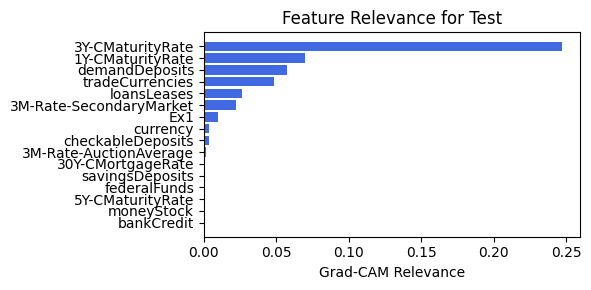

In [75]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=1, lamb=1e-05, steps=40)

### 1.2.2 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.52e-01 | eval_loss: 1.91e-01 | reg: 1.48e+01 |: 100%|█| 40/40 [00:13<00:00,  3.07it/

saving model version 0.1
Best epoch 29
0.23852047324180603
M_KAN Relevance: 0.049635905772447586
CNN Relevance: 0.9503640532493591
[('1Y-CMaturityRate', 0.42194584), ('30Y-CMortgageRate', 0.37712613), ('federalFunds', 0.35029912), ('3M-Rate-SecondaryMarket', 0.34440523), ('loansLeases', 0.2749212), ('5Y-CMaturityRate', 0.2748946), ('currency', 0.27154619), ('savingsDeposits', 0.24509743), ('3M-Rate-AuctionAverage', 0.21532787), ('checkableDeposits', 0.1409323), ('demandDeposits', 0.13711584), ('3Y-CMaturityRate', 0.13020484), ('moneyStock', 0.12616435), ('bankCredit', 0.109368086), ('tradeCurrencies', 0.10858253)]


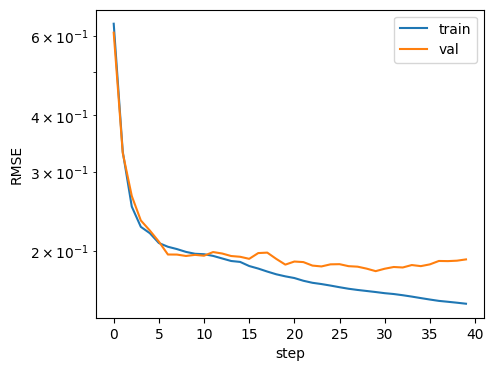

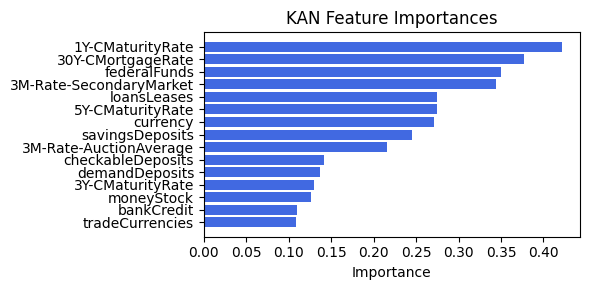

Computing Grad-CAM: 100%|██████████| 210/210 [00:20<00:00, 10.43it/s]


[('1Y-CMaturityRate', 0.17784779717524846), ('3M-Rate-SecondaryMarket', 0.022780627880932852), ('Ex1', 0.005123901225271679), ('currency', 0.0009663374118861698), ('3M-Rate-AuctionAverage', 0.000752950424239749), ('bankCredit', 0.00012937142025856745), ('federalFunds', 8.412428931998356e-06), ('5Y-CMaturityRate', 8.13857408329135e-06), ('30Y-CMortgageRate', 0.0), ('3Y-CMaturityRate', 0.0), ('demandDeposits', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('loansLeases', 0.0), ('savingsDeposits', 0.0), ('tradeCurrencies', 0.0)]


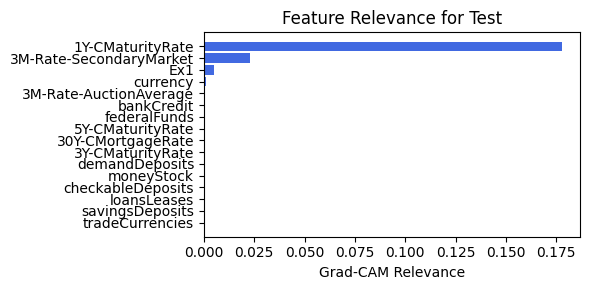

In [76]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=1, lamb=1e-05, steps=40)

### 1.2.3 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 2.02e-01 | eval_loss: 2.47e-01 | reg: 1.89e+01 |: 100%|█| 40/40 [00:12<00:00,  3.30it/

saving model version 0.1
Best epoch 39
0.32515907287597656
M_KAN Relevance: 0.24936717748641968
CNN Relevance: 0.7506328225135803
[('currency', 0.6909983), ('savingsDeposits', 0.5971516), ('demandDeposits', 0.5820751), ('checkableDeposits', 0.44285476), ('30Y-CMortgageRate', 0.35030457), ('tradeCurrencies', 0.26811853), ('bankCredit', 0.267215), ('loansLeases', 0.21068121), ('moneyStock', 0.19163848), ('3Y-CMaturityRate', 0.18034393), ('federalFunds', 0.13274208), ('1Y-CMaturityRate', 0.104458824), ('3M-Rate-AuctionAverage', 0.10393414), ('3M-Rate-SecondaryMarket', 0.055721395), ('5Y-CMaturityRate', 0.013922161)]


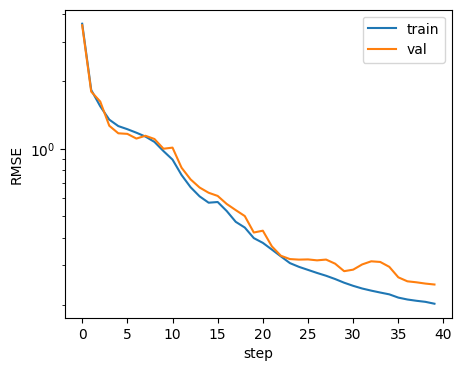

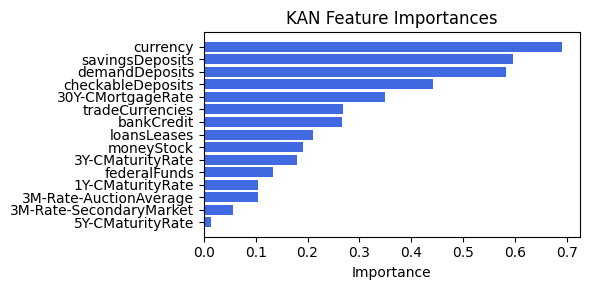

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.17it/s]


[('moneyStock', 0.4158754620878469), ('5Y-CMaturityRate', 0.3605732091835567), ('1Y-CMaturityRate', 0.35651799427841546), ('3M-Rate-AuctionAverage', 0.3542850594790209), ('bankCredit', 0.35385704676487617), ('30Y-CMortgageRate', 0.34575380910010567), ('3Y-CMaturityRate', 0.33329477087106735), ('federalFunds', 0.27632775986123653), ('demandDeposits', 0.25579698288680186), ('loansLeases', 0.1635650139789851), ('checkableDeposits', 0.1137599804394302), ('3M-Rate-SecondaryMarket', 0.09350015135659348), ('tradeCurrencies', 0.08779542771988504), ('savingsDeposits', 0.08660160725654957), ('currency', 0.05991455470038567), ('Ex1', 0.05112327908143578)]


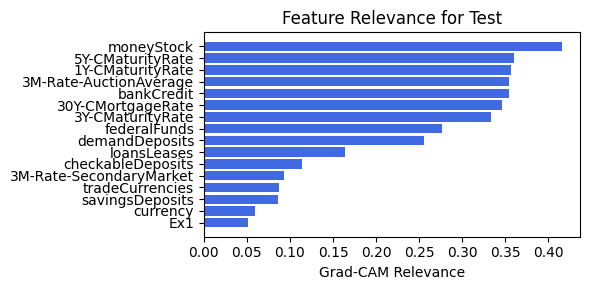

In [77]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=2, lamb=1e-05, steps=40)

### 1.2.4 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=2

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.71e-01 | eval_loss: 1.91e-01 | reg: 3.21e+01 |: 100%|█| 40/40 [00:11<00:00,  3.34it/

saving model version 0.1
Best epoch 13
0.22092799842357635
M_KAN Relevance: 0.9555740356445312
CNN Relevance: 0.04442596808075905
[('checkableDeposits', 0.90583825), ('demandDeposits', 0.7440655), ('30Y-CMortgageRate', 0.680265), ('bankCredit', 0.5688489), ('5Y-CMaturityRate', 0.43969718), ('loansLeases', 0.4046965), ('moneyStock', 0.32232544), ('tradeCurrencies', 0.3096814), ('currency', 0.28372502), ('savingsDeposits', 0.28234598), ('3Y-CMaturityRate', 0.21965958), ('federalFunds', 0.13707848), ('3M-Rate-AuctionAverage', 0.061457723), ('3M-Rate-SecondaryMarket', 0.057430394), ('1Y-CMaturityRate', 0.0247203)]


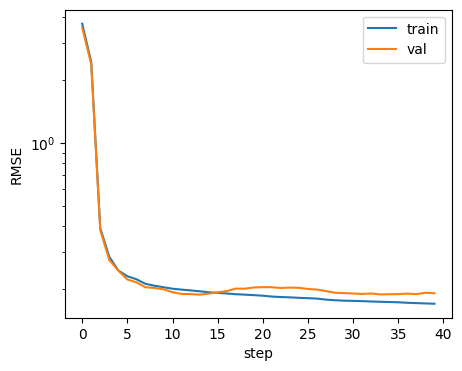

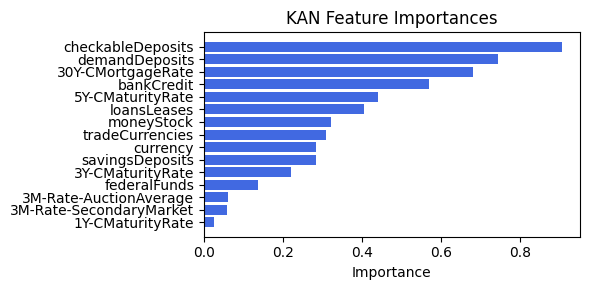

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.09it/s]

[('checkableDeposits', 0.27934467382729056), ('currency', 0.17307671145314263), ('3M-Rate-SecondaryMarket', 0.08621888876050002), ('Ex1', 0.02116436596344491), ('savingsDeposits', 0.01184742862269992), ('loansLeases', 0.010942312471923375), ('tradeCurrencies', 0.009439106392008918), ('5Y-CMaturityRate', 2.8007783527885166e-05), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0)]


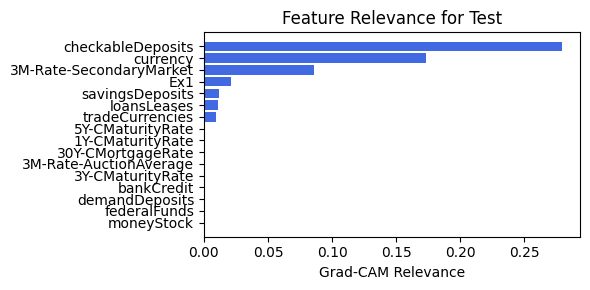

In [78]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=2, lamb=1e-05, steps=40)

### 1.2.5 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.65e-01 | eval_loss: 1.97e-01 | reg: 1.55e+01 |: 100%|█| 40/40 [00:12<00:00,  3.21it/

saving model version 0.1
Best epoch 32
0.23365166783332825
M_KAN Relevance: 0.09603453427553177
CNN Relevance: 0.9039655327796936
[('30Y-CMortgageRate', 0.14690427), ('3M-Rate-SecondaryMarket', 0.1454137), ('moneyStock', 0.14309612), ('3Y-CMaturityRate', 0.1389505), ('bankCredit', 0.13009848), ('1Y-CMaturityRate', 0.09860008), ('tradeCurrencies', 0.060251053), ('5Y-CMaturityRate', 0.058462694), ('currency', 0.053238235), ('federalFunds', 0.0498819), ('loansLeases', 0.049063835), ('3M-Rate-AuctionAverage', 0.040448803), ('checkableDeposits', 0.03230098), ('demandDeposits', 0.028648766), ('savingsDeposits', 0.020237835)]


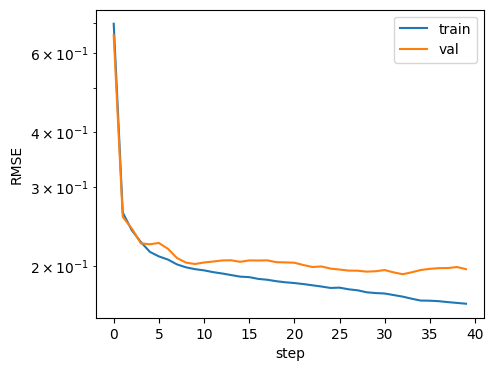

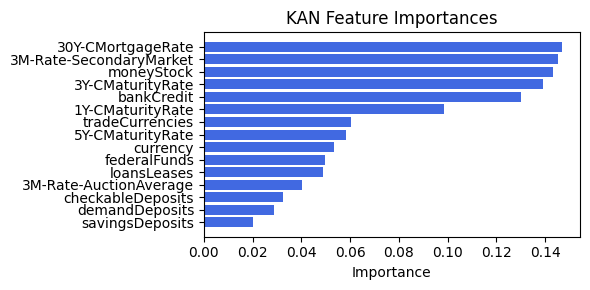

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.04it/s]

[('3M-Rate-SecondaryMarket', 0.01711047346748057), ('loansLeases', 0.008874866404082804), ('1Y-CMaturityRate', 0.008177007096154348), ('Ex1', 0.005818079802251998), ('currency', 0.004610210767991486), ('30Y-CMortgageRate', 0.0019233044236898421), ('3M-Rate-AuctionAverage', 0.0012732549304408686), ('3Y-CMaturityRate', 0.0006310543843678066), ('savingsDeposits', 3.1572026533207725e-06), ('bankCredit', 2.1527269079039494e-06), ('5Y-CMaturityRate', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('tradeCurrencies', 0.0)]


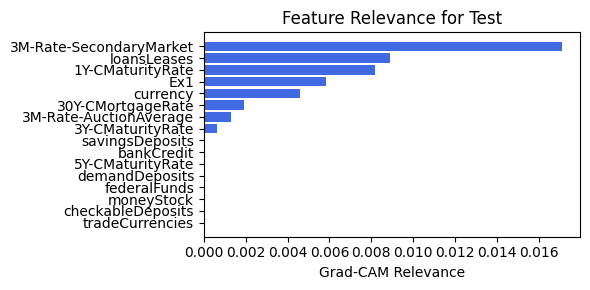

In [79]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=4, lamb=1e-05, steps=40)

### 1.2.6 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.61e-01 | eval_loss: 1.88e-01 | reg: 1.55e+01 |: 100%|█| 40/40 [00:12<00:00,  3.33it/

saving model version 0.1
Best epoch 39
0.2503899931907654
M_KAN Relevance: 0.048690419644117355
CNN Relevance: 0.9513096213340759
[('3M-Rate-SecondaryMarket', 0.17185317), ('moneyStock', 0.14578715), ('3Y-CMaturityRate', 0.14519064), ('30Y-CMortgageRate', 0.13685328), ('loansLeases', 0.101167), ('bankCredit', 0.09388483), ('federalFunds', 0.08527401), ('1Y-CMaturityRate', 0.07926651), ('currency', 0.076799676), ('tradeCurrencies', 0.076392114), ('demandDeposits', 0.04365755), ('savingsDeposits', 0.034711365), ('3M-Rate-AuctionAverage', 0.026383677), ('5Y-CMaturityRate', 0.021852376), ('checkableDeposits', 0.02132676)]


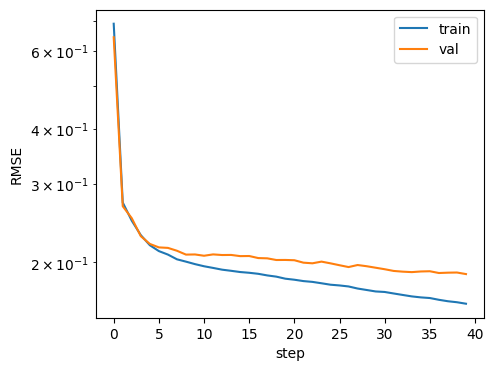

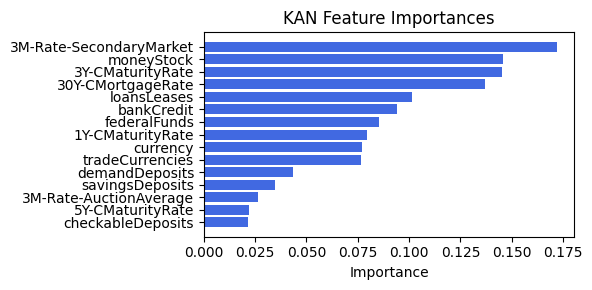

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.34it/s]

[('1Y-CMaturityRate', 0.23787165695490936), ('3Y-CMaturityRate', 0.10245328637483042), ('demandDeposits', 0.04675807609400224), ('loansLeases', 0.026490006810802567), ('tradeCurrencies', 0.02053129179735801), ('moneyStock', 0.016020844910027726), ('30Y-CMortgageRate', 0.007758465121012358), ('3M-Rate-SecondaryMarket', 0.005276720766865072), ('3M-Rate-AuctionAverage', 0.0033083318633933753), ('savingsDeposits', 0.0031883900813270537), ('federalFunds', 0.000326361428458421), ('bankCredit', 0.00023912624677731878), ('currency', 0.00011018355143538169), ('5Y-CMaturityRate', 8.694402474377837e-05), ('Ex1', 6.569865980141219e-06), ('checkableDeposits', 0.0)]


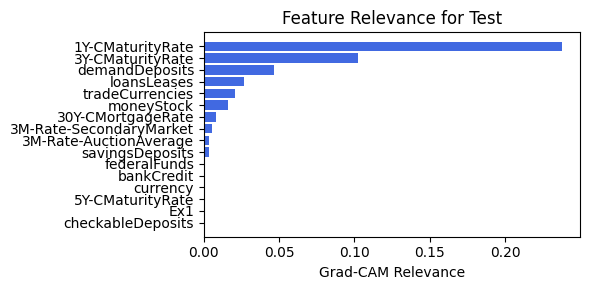

In [80]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=4, lamb=1e-05, steps=40)

### 1.2.7 width=[15, 1, 1], grid=5, lamb=1e-05 | cnn_bottleneck_dim=4

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.63e-01 | eval_loss: 1.93e-01 | reg: 1.51e+01 |: 100%|█| 40/40 [00:12<00:00,  3.28it/

saving model version 0.1
Best epoch 37
0.21003122627735138
M_KAN Relevance: 0.06692254543304443
CNN Relevance: 0.9330774545669556
[('3M-Rate-SecondaryMarket', 0.13338928), ('moneyStock', 0.13003169), ('30Y-CMortgageRate', 0.120945014), ('3Y-CMaturityRate', 0.12084999), ('bankCredit', 0.11863298), ('currency', 0.0882329), ('tradeCurrencies', 0.08265279), ('loansLeases', 0.07426688), ('1Y-CMaturityRate', 0.065512076), ('demandDeposits', 0.05385556), ('savingsDeposits', 0.05223131), ('federalFunds', 0.039952442), ('5Y-CMaturityRate', 0.032336768), ('3M-Rate-AuctionAverage', 0.01705538), ('checkableDeposits', 0.016126597)]


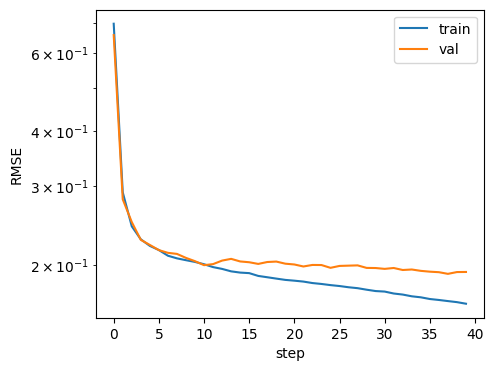

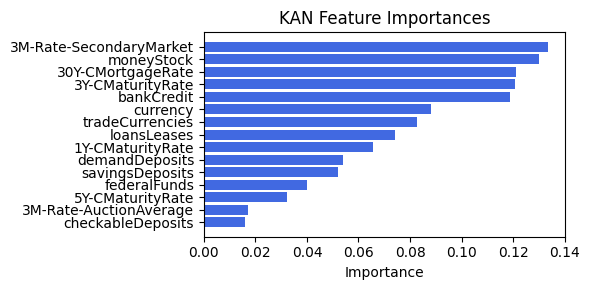

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.20it/s]


[('1Y-CMaturityRate', 0.13087323052542552), ('3Y-CMaturityRate', 0.026465080855857758), ('demandDeposits', 0.016940755179772775), ('3M-Rate-SecondaryMarket', 0.016528786364055817), ('currency', 0.011658160262214508), ('loansLeases', 0.010465800787122654), ('30Y-CMortgageRate', 0.0056147876993886065), ('tradeCurrencies', 0.0038851622126198243), ('moneyStock', 0.002166248935585221), ('3M-Rate-AuctionAverage', 0.0011050587253911154), ('Ex1', 0.0006712543112891061), ('federalFunds', 0.0005329974558359633), ('savingsDeposits', 0.0003799375490329805), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('checkableDeposits', 0.0)]


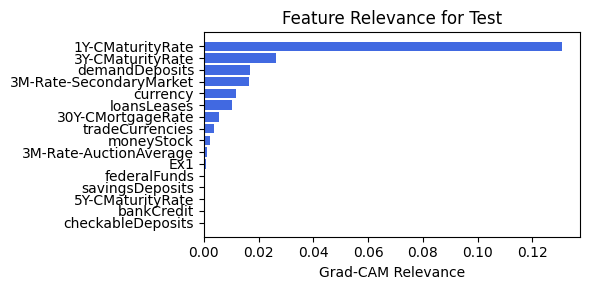

In [81]:
train_and_plot_relevance(Model3_1, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=4, lamb=1e-05, steps=40)

## 1.3 width=[15, 6, 1], grid=7, lamb=1e-05

### 1.3.0a width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.79e-01 | eval_loss: 2.09e-01 | reg: 4.43e+01 |: 100%|█| 50/50 [01:06<00:00,  1.32s/i


saving model version 0.1
Best epoch 49
0.2478141337633133
M_KAN Relevance: 0.7170547842979431
CNN Relevance: 0.2829451858997345
[('loansLeases', 0.13894305), ('checkableDeposits', 0.11481333), ('federalFunds', 0.11015346), ('savingsDeposits', 0.10829203), ('tradeCurrencies', 0.09561058), ('demandDeposits', 0.08351192), ('3Y-CMaturityRate', 0.08305082), ('3M-Rate-AuctionAverage', 0.081227735), ('currency', 0.08091155), ('3M-Rate-SecondaryMarket', 0.0722917), ('moneyStock', 0.06832599), ('30Y-CMortgageRate', 0.06794432), ('bankCredit', 0.067408785), ('5Y-CMaturityRate', 0.051807962), ('1Y-CMaturityRate', 0.043681376)]


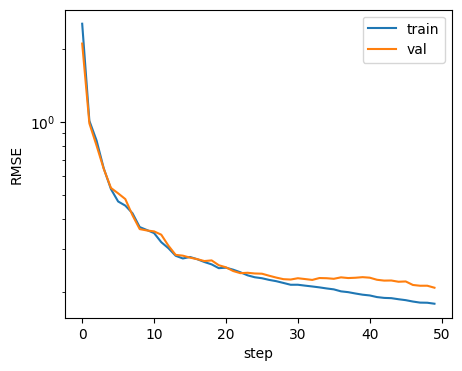

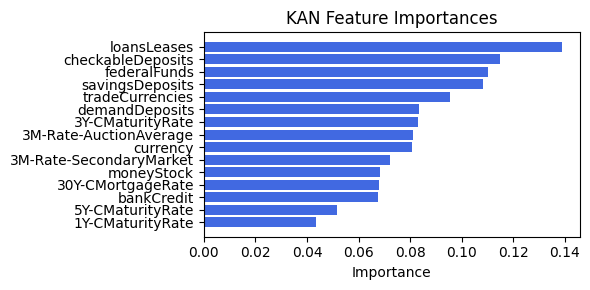

Computing Grad-CAM: 100%|██████████| 210/210 [01:27<00:00,  2.39it/s]


[('tradeCurrencies', 0.2511191003734157), ('moneyStock', 0.2226950461133605), ('5Y-CMaturityRate', 0.21581054051452417), ('federalFunds', 0.2112316144186826), ('bankCredit', 0.20988294770054164), ('loansLeases', 0.19169025895077668), ('3Y-CMaturityRate', 0.1704103992830607), ('Ex1', 0.16369289472405354), ('savingsDeposits', 0.12867412109404713), ('demandDeposits', 0.12475190763140008), ('3M-Rate-AuctionAverage', 0.09030538042120281), ('30Y-CMortgageRate', 0.08754294008526596), ('currency', 0.0826414266157718), ('1Y-CMaturityRate', 0.08153750366486964), ('checkableDeposits', 0.0802316726673217), ('3M-Rate-SecondaryMarket', 0.04672824987764692)]


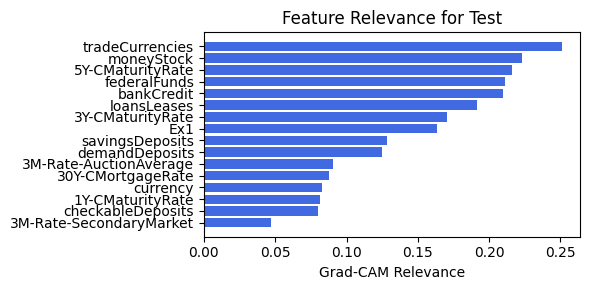

In [37]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=1, lamb=1e-05, steps=50)

### 1.3.0a width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 2.03e-01 | eval_loss: 2.12e-01 | reg: 4.77e+01 |: 100%|█| 40/40 [00:16<00:00,  2.39it/

saving model version 0.1
Best epoch 39
0.2614278793334961
M_KAN Relevance: 0.8024250268936157
CNN Relevance: 0.1975749284029007
[('loansLeases', 0.14430657), ('federalFunds', 0.12756647), ('checkableDeposits', 0.12250239), ('savingsDeposits', 0.10193674), ('tradeCurrencies', 0.09102055), ('moneyStock', 0.08279517), ('demandDeposits', 0.08242347), ('currency', 0.0810274), ('3M-Rate-AuctionAverage', 0.080148846), ('3Y-CMaturityRate', 0.07706705), ('bankCredit', 0.074201494), ('3M-Rate-SecondaryMarket', 0.06634675), ('30Y-CMortgageRate', 0.06588774), ('1Y-CMaturityRate', 0.050974287), ('5Y-CMaturityRate', 0.04658335)]


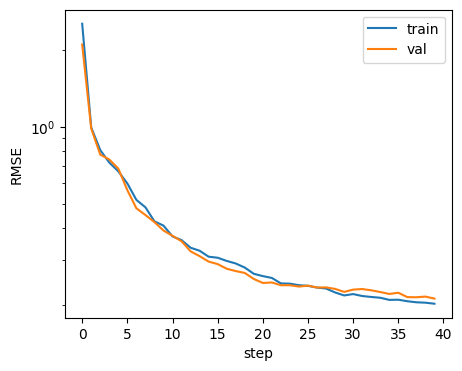

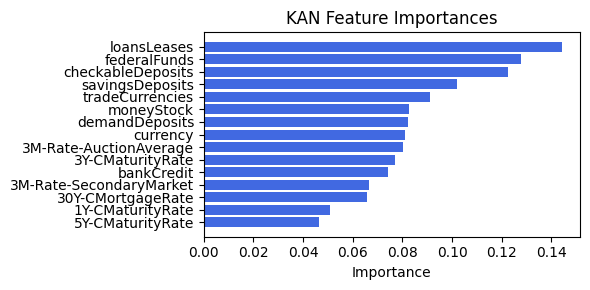

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.72it/s]

[('tradeCurrencies', 0.36266499020247944), ('loansLeases', 0.23391674083347122), ('savingsDeposits', 0.1137615514165234), ('Ex1', 0.10778743112016292), ('federalFunds', 0.07382437927853538), ('moneyStock', 0.0540413758761826), ('checkableDeposits', 0.04765493216968718), ('demandDeposits', 0.04758098758757114), ('5Y-CMaturityRate', 0.044642316310533454), ('bankCredit', 0.04149569808727219), ('3Y-CMaturityRate', 0.03940097152122429), ('currency', 0.028575825442870458), ('3M-Rate-SecondaryMarket', 0.014558930624099005), ('30Y-CMortgageRate', 0.012954780818628414), ('3M-Rate-AuctionAverage', 0.012827579322315397), ('1Y-CMaturityRate', 0.011774808140693321)]


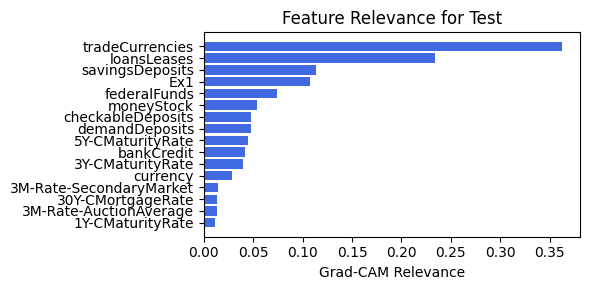

In [141]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=1, lamb=1e-05, steps=40)

### 1.3.0b width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.84e-01 | eval_loss: 2.14e-01 | reg: 4.29e+01 |: 100%|█| 40/40 [00:12<00:00,  3.28it/

saving model version 0.1
Best epoch 39
0.26105526089668274
M_KAN Relevance: 0.7012084722518921
CNN Relevance: 0.2987915575504303
[('loansLeases', 0.16467318), ('checkableDeposits', 0.12375538), ('federalFunds', 0.11719873), ('savingsDeposits', 0.106407106), ('tradeCurrencies', 0.09748738), ('demandDeposits', 0.08562036), ('3M-Rate-AuctionAverage', 0.08046289), ('currency', 0.07969147), ('3Y-CMaturityRate', 0.07421607), ('moneyStock', 0.06781727), ('bankCredit', 0.065696746), ('3M-Rate-SecondaryMarket', 0.06416802), ('30Y-CMortgageRate', 0.056376986), ('1Y-CMaturityRate', 0.053820454), ('5Y-CMaturityRate', 0.04053606)]


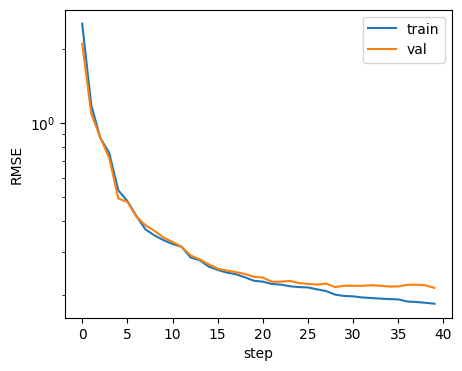

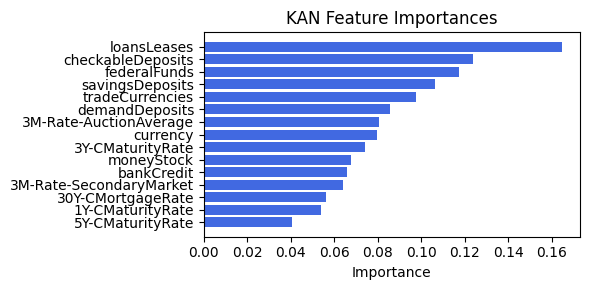

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.81it/s]

[('tradeCurrencies', 0.44621657840907575), ('5Y-CMaturityRate', 0.28771651445754937), ('bankCredit', 0.2835718705806704), ('moneyStock', 0.27288008200093394), ('federalFunds', 0.2481984881285046), ('3Y-CMaturityRate', 0.219322389993994), ('loansLeases', 0.19745595099049665), ('savingsDeposits', 0.18259411231805903), ('Ex1', 0.1711657071131326), ('demandDeposits', 0.15294938531172061), ('3M-Rate-AuctionAverage', 0.13269257520635921), ('30Y-CMortgageRate', 0.1285051414565671), ('currency', 0.12215170396846675), ('1Y-CMaturityRate', 0.11215106270586452), ('checkableDeposits', 0.10293405449150929), ('3M-Rate-SecondaryMarket', 0.07025225784718281)]


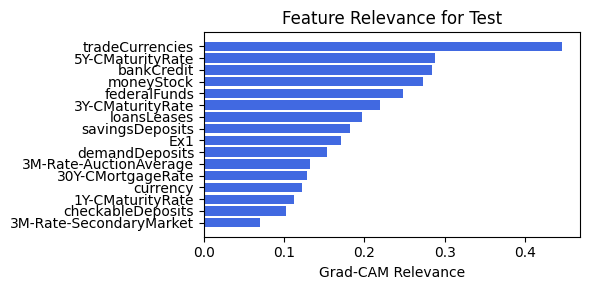

In [142]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=1, lamb=1e-05, steps=40)

### 1.3.0c width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.42e-01 | eval_loss: 1.85e-01 | reg: 3.62e+01 |: 100%|█| 40/40 [00:13<00:00,  2.90it/

saving model version 0.1
Best epoch 39
0.22907203435897827
M_KAN Relevance: 0.925416886806488
CNN Relevance: 0.07458313554525375
[('bankCredit', 0.35475504), ('checkableDeposits', 0.32594037), ('5Y-CMaturityRate', 0.2733299), ('30Y-CMortgageRate', 0.24052551), ('demandDeposits', 0.22133641), ('federalFunds', 0.1775007), ('3M-Rate-SecondaryMarket', 0.15719905), ('loansLeases', 0.15190618), ('3Y-CMaturityRate', 0.13805589), ('moneyStock', 0.12767428), ('savingsDeposits', 0.12571055), ('tradeCurrencies', 0.1196858), ('currency', 0.10542288), ('1Y-CMaturityRate', 0.07357117), ('3M-Rate-AuctionAverage', 0.055947848)]


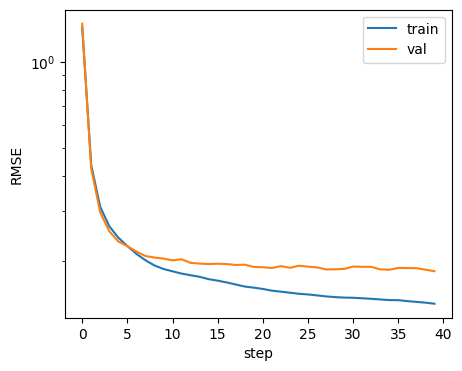

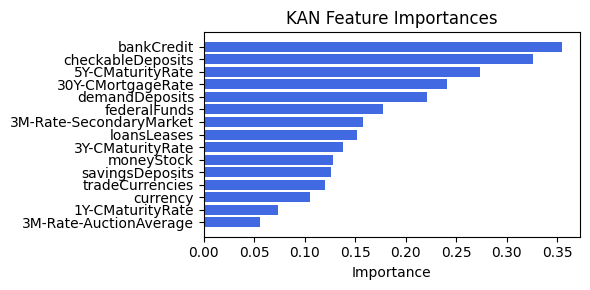

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.11it/s]

[('tradeCurrencies', 0.2623885574440161), ('loansLeases', 0.21180556028016975), ('demandDeposits', 0.050763511351708854), ('savingsDeposits', 0.04584605323727287), ('3Y-CMaturityRate', 0.04193660970527812), ('federalFunds', 0.004513083077922819), ('1Y-CMaturityRate', 0.0013167614028567359), ('Ex1', 0.0006211613000015772), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


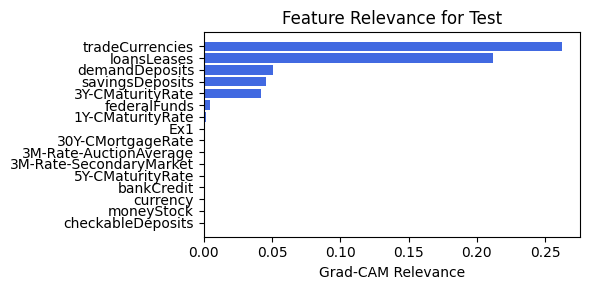

In [143]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=2, lamb=1e-05, steps=40)

### 1.3.0d width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.41e-01 | eval_loss: 1.80e-01 | reg: 3.59e+01 |: 100%|█| 40/40 [00:12<00:00,  3.21it/

saving model version 0.1
Best epoch 39
0.23055541515350342
M_KAN Relevance: 0.9134546518325806
CNN Relevance: 0.08654538542032242
[('bankCredit', 0.26091728), ('checkableDeposits', 0.2587033), ('5Y-CMaturityRate', 0.21449123), ('demandDeposits', 0.1776145), ('federalFunds', 0.17291105), ('30Y-CMortgageRate', 0.17029886), ('3Y-CMaturityRate', 0.12674281), ('3M-Rate-SecondaryMarket', 0.11902257), ('moneyStock', 0.110241994), ('tradeCurrencies', 0.108326316), ('savingsDeposits', 0.09699436), ('loansLeases', 0.0938371), ('currency', 0.09235725), ('3M-Rate-AuctionAverage', 0.066121094), ('1Y-CMaturityRate', 0.054916155)]


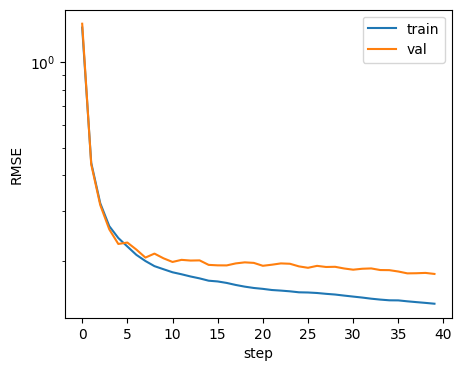

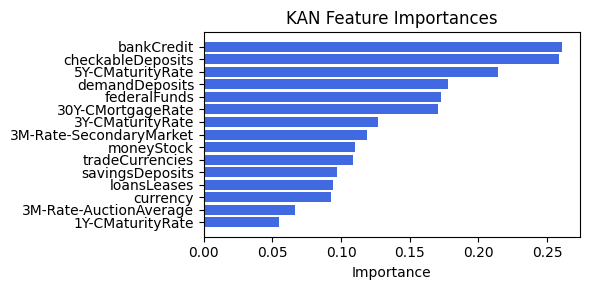

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.69it/s]

[('tradeCurrencies', 0.2678614083854925), ('loansLeases', 0.1842811897841048), ('demandDeposits', 0.04725616173596964), ('savingsDeposits', 0.04317807203070039), ('3Y-CMaturityRate', 0.028603306022428332), ('federalFunds', 0.002422327112539538), ('1Y-CMaturityRate', 0.0019704497995830716), ('Ex1', 0.0003553178112183343), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


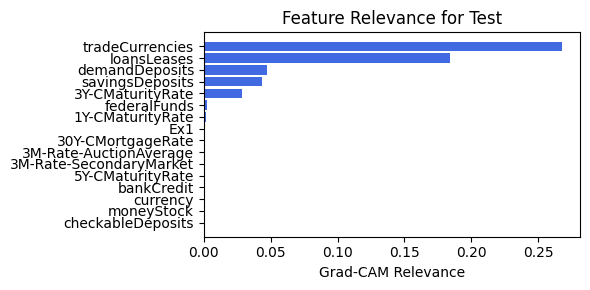

In [144]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=2, lamb=1e-05, steps=40)

### 1.3.1 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.12e-01 | eval_loss: 1.84e-01 | reg: 2.66e+01 |: 100%|█| 40/40 [00:13<00:00,  2.89it/

saving model version 0.1
Best epoch 28
0.21530014276504517
M_KAN Relevance: 0.16592766344547272
CNN Relevance: 0.8340722918510437
[('federalFunds', 0.38833842), ('3M-Rate-AuctionAverage', 0.3082189), ('checkableDeposits', 0.30640808), ('tradeCurrencies', 0.28365192), ('5Y-CMaturityRate', 0.2786257), ('30Y-CMortgageRate', 0.2701632), ('1Y-CMaturityRate', 0.26404274), ('moneyStock', 0.26013857), ('bankCredit', 0.25833923), ('3M-Rate-SecondaryMarket', 0.24812654), ('loansLeases', 0.22834155), ('3Y-CMaturityRate', 0.22465521), ('currency', 0.21339121), ('savingsDeposits', 0.19640508), ('demandDeposits', 0.19447699)]


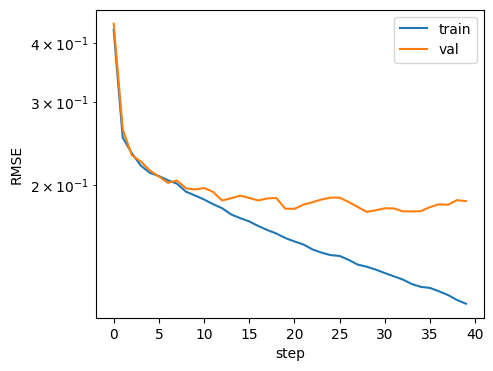

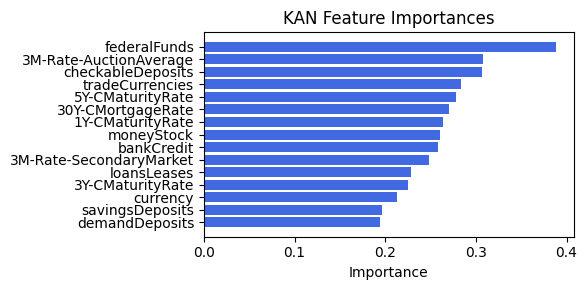

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.78it/s]

[('loansLeases', 0.25019362090111136), ('demandDeposits', 0.08797384432206551), ('savingsDeposits', 0.07344926096820495), ('3M-Rate-SecondaryMarket', 0.029831713107636288), ('tradeCurrencies', 0.01744544797859687), ('3Y-CMaturityRate', 0.01696290505296063), ('Ex1', 0.002552219231923421), ('currency', 0.0022754911954204243), ('1Y-CMaturityRate', 0.0017262667417526246), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


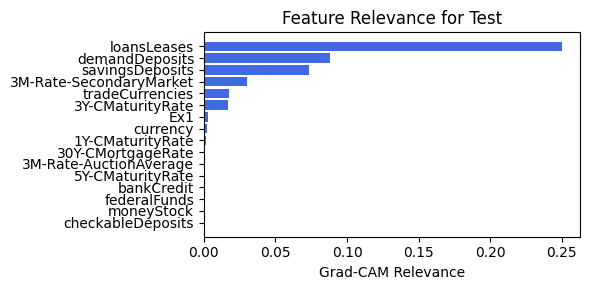

In [82]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=3, lamb=1e-05, steps=40)

### 1.3.2 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=3

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.03e-01 | eval_loss: 1.87e-01 | reg: 2.81e+01 |: 100%|█| 40/40 [00:12<00:00,  3.08it/

saving model version 0.1
Best epoch 27
0.24596962332725525
M_KAN Relevance: 0.1871059238910675
CNN Relevance: 0.8128940463066101
[('federalFunds', 0.5403225), ('checkableDeposits', 0.37402087), ('1Y-CMaturityRate', 0.3154952), ('bankCredit', 0.30559963), ('3Y-CMaturityRate', 0.29242358), ('5Y-CMaturityRate', 0.2646302), ('30Y-CMortgageRate', 0.25807703), ('tradeCurrencies', 0.25474772), ('3M-Rate-SecondaryMarket', 0.2517286), ('moneyStock', 0.24929044), ('loansLeases', 0.23170587), ('3M-Rate-AuctionAverage', 0.23139378), ('savingsDeposits', 0.17369525), ('demandDeposits', 0.15769786), ('currency', 0.1529769)]


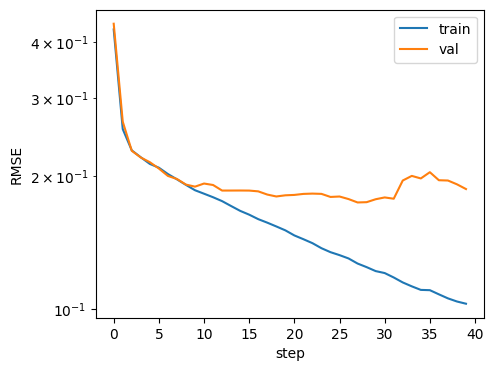

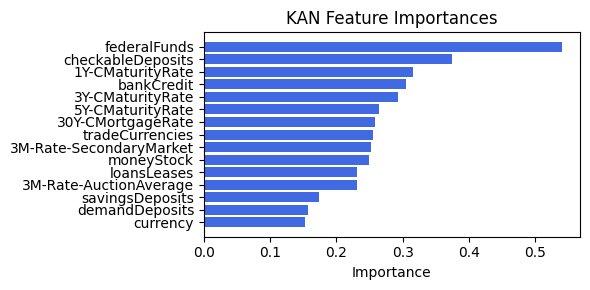

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.62it/s]


[('loansLeases', 0.25214940213731357), ('savingsDeposits', 0.09210008486684057), ('demandDeposits', 0.04375087817066482), ('tradeCurrencies', 0.02450992377208812), ('3M-Rate-SecondaryMarket', 0.007609740298773561), ('1Y-CMaturityRate', 0.001385957712218875), ('currency', 0.0005654569360471907), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


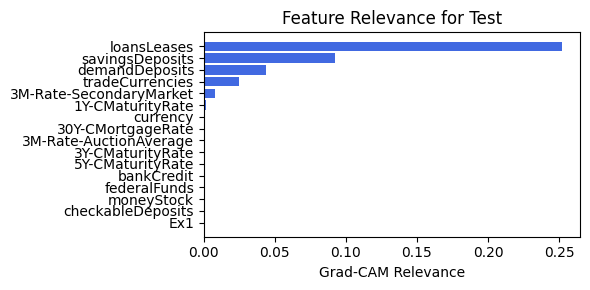

In [83]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=3, lamb=1e-05, steps=40)

### 1.3.2 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.40e-01 | eval_loss: 1.84e-01 | reg: 2.40e+01 |: 100%|█| 40/40 [00:12<00:00,  3.20it/

saving model version 0.1
Best epoch 29
0.2331712692975998
M_KAN Relevance: 0.13486802577972412
CNN Relevance: 0.8651319742202759
[('checkableDeposits', 0.23289095), ('3M-Rate-AuctionAverage', 0.19742505), ('3M-Rate-SecondaryMarket', 0.19343245), ('bankCredit', 0.19208638), ('tradeCurrencies', 0.18775652), ('moneyStock', 0.181424), ('30Y-CMortgageRate', 0.16715714), ('loansLeases', 0.1566897), ('3Y-CMaturityRate', 0.1442771), ('federalFunds', 0.13796484), ('5Y-CMaturityRate', 0.13344067), ('currency', 0.12282978), ('1Y-CMaturityRate', 0.11998506), ('demandDeposits', 0.11858122), ('savingsDeposits', 0.11120634)]


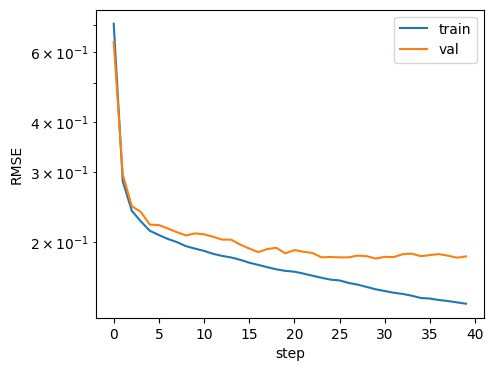

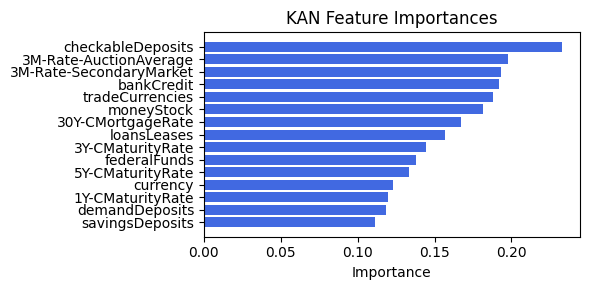

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.08it/s]


[('3M-Rate-SecondaryMarket', 0.36324274325022654), ('loansLeases', 0.24163072782491024), ('1Y-CMaturityRate', 0.13879465989607742), ('3M-Rate-AuctionAverage', 0.11746435313086424), ('30Y-CMortgageRate', 0.11596263042606768), ('savingsDeposits', 0.09384123052669956), ('demandDeposits', 0.08607677273407933), ('3Y-CMaturityRate', 0.01748365822381207), ('tradeCurrencies', 0.008166991724144845), ('currency', 0.0011720855409900347), ('checkableDeposits', 0.0009303792025006953), ('5Y-CMaturityRate', 4.4055203241961344e-05), ('bankCredit', 4.025598367055257e-05), ('federalFunds', 7.535676871027265e-06), ('moneyStock', 0.0), ('Ex1', 0.0)]


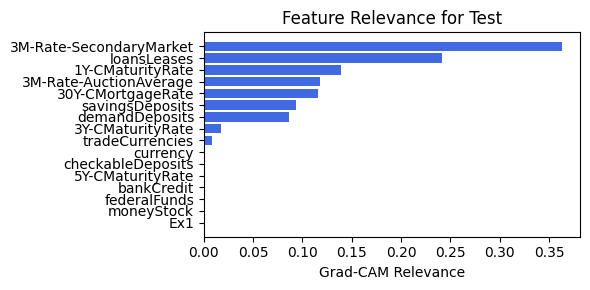

In [85]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=6, lamb=1e-05, steps=40)

### 1.3.3 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=6

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.40e-01 | eval_loss: 1.84e-01 | reg: 2.40e+01 |: 100%|█| 40/40 [00:12<00:00,  3.19it/

saving model version 0.1
Best epoch 29
0.2331712692975998
M_KAN Relevance: 0.13486802577972412
CNN Relevance: 0.8651319742202759
[('checkableDeposits', 0.23289095), ('3M-Rate-AuctionAverage', 0.19742505), ('3M-Rate-SecondaryMarket', 0.19343245), ('bankCredit', 0.19208638), ('tradeCurrencies', 0.18775652), ('moneyStock', 0.181424), ('30Y-CMortgageRate', 0.16715714), ('loansLeases', 0.1566897), ('3Y-CMaturityRate', 0.1442771), ('federalFunds', 0.13796484), ('5Y-CMaturityRate', 0.13344067), ('currency', 0.12282978), ('1Y-CMaturityRate', 0.11998506), ('demandDeposits', 0.11858122), ('savingsDeposits', 0.11120634)]


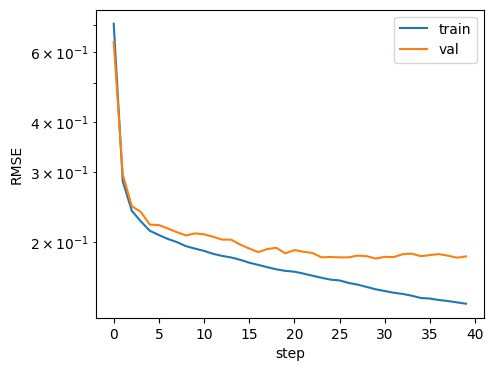

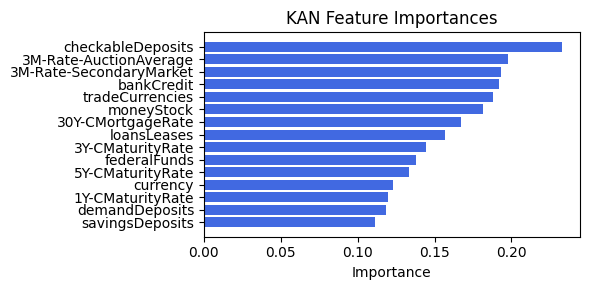

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.51it/s]

[('3M-Rate-SecondaryMarket', 0.36324274325022654), ('loansLeases', 0.24163072782491024), ('1Y-CMaturityRate', 0.13879465989607742), ('3M-Rate-AuctionAverage', 0.11746435313086424), ('30Y-CMortgageRate', 0.11596263042606768), ('savingsDeposits', 0.09384123052669956), ('demandDeposits', 0.08607677273407933), ('3Y-CMaturityRate', 0.01748365822381207), ('tradeCurrencies', 0.008166991724144845), ('currency', 0.0011720855409900347), ('checkableDeposits', 0.0009303792025006953), ('5Y-CMaturityRate', 4.4055203241961344e-05), ('bankCredit', 4.025598367055257e-05), ('federalFunds', 7.535676871027265e-06), ('moneyStock', 0.0), ('Ex1', 0.0)]


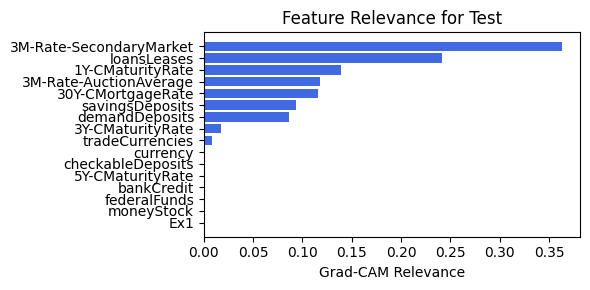

In [86]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=6, lamb=1e-05, steps=40)

### 1.3.4 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.22e-01 | eval_loss: 1.97e-01 | reg: 2.78e+01 |: 100%|█| 40/40 [00:11<00:00,  3.34it/

saving model version 0.1
Best epoch 24
0.2684694826602936
M_KAN Relevance: 0.17485323548316956
CNN Relevance: 0.8251467347145081
[('federalFunds', 0.35835445), ('tradeCurrencies', 0.25633416), ('3M-Rate-SecondaryMarket', 0.21792035), ('3M-Rate-AuctionAverage', 0.21302085), ('loansLeases', 0.20605609), ('30Y-CMortgageRate', 0.20501511), ('moneyStock', 0.20492327), ('currency', 0.19839248), ('3Y-CMaturityRate', 0.1674559), ('bankCredit', 0.15854529), ('5Y-CMaturityRate', 0.15415797), ('1Y-CMaturityRate', 0.14524148), ('demandDeposits', 0.11416834), ('savingsDeposits', 0.11215987), ('checkableDeposits', 0.108831644)]


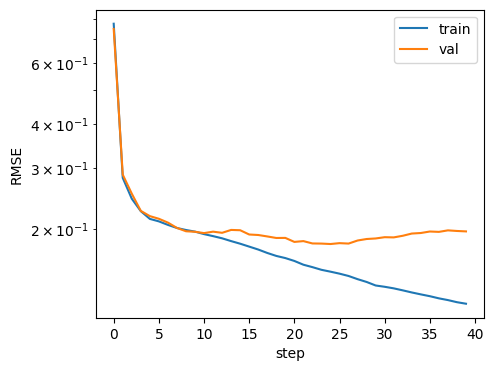

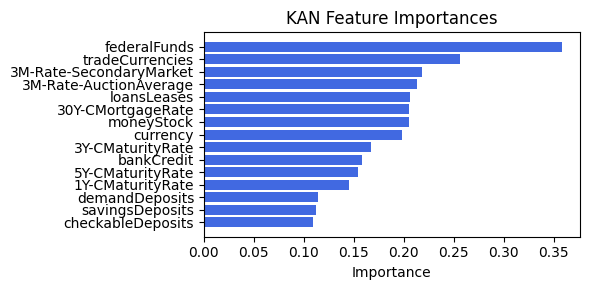

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.13it/s]


[('loansLeases', 0.3377295257789748), ('demandDeposits', 0.041120084800890515), ('savingsDeposits', 0.039896035170005194), ('tradeCurrencies', 0.017564171971961123), ('checkableDeposits', 0.011497548045147033), ('1Y-CMaturityRate', 0.001872304081916809), ('3M-Rate-SecondaryMarket', 0.00102320976910137), ('3Y-CMaturityRate', 0.00010496458659569423), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('Ex1', 0.0)]


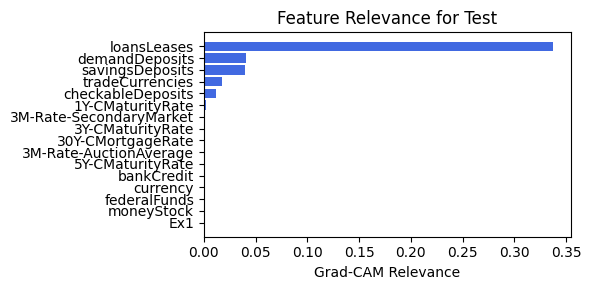

In [87]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=9, lamb=1e-05, steps=40)

### 1.3.5 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=9

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.22e-01 | eval_loss: 1.97e-01 | reg: 2.78e+01 |: 100%|█| 40/40 [00:12<00:00,  3.32it/

saving model version 0.1
Best epoch 24
0.2684694826602936
M_KAN Relevance: 0.17485323548316956
CNN Relevance: 0.8251467347145081
[('federalFunds', 0.35835445), ('tradeCurrencies', 0.25633416), ('3M-Rate-SecondaryMarket', 0.21792035), ('3M-Rate-AuctionAverage', 0.21302085), ('loansLeases', 0.20605609), ('30Y-CMortgageRate', 0.20501511), ('moneyStock', 0.20492327), ('currency', 0.19839248), ('3Y-CMaturityRate', 0.1674559), ('bankCredit', 0.15854529), ('5Y-CMaturityRate', 0.15415797), ('1Y-CMaturityRate', 0.14524148), ('demandDeposits', 0.11416834), ('savingsDeposits', 0.11215987), ('checkableDeposits', 0.108831644)]


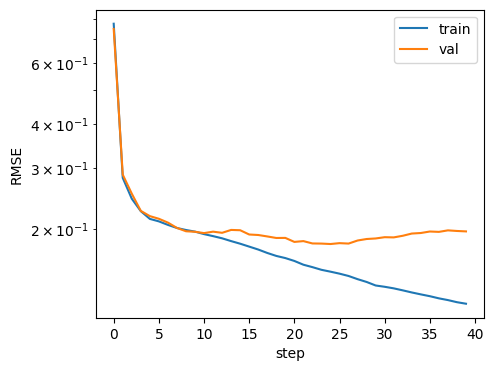

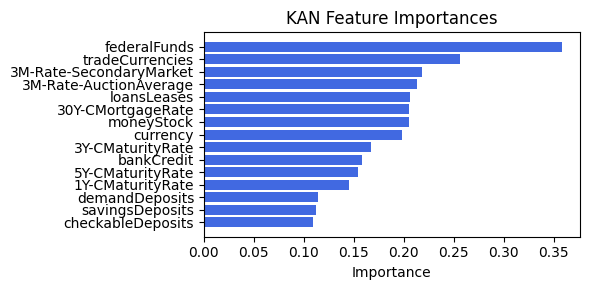

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.17it/s]


[('loansLeases', 0.3377295257789748), ('demandDeposits', 0.041120084800890515), ('savingsDeposits', 0.039896035170005194), ('tradeCurrencies', 0.017564171971961123), ('checkableDeposits', 0.011497548045147033), ('1Y-CMaturityRate', 0.001872304081916809), ('3M-Rate-SecondaryMarket', 0.00102320976910137), ('3Y-CMaturityRate', 0.00010496458659569423), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('Ex1', 0.0)]


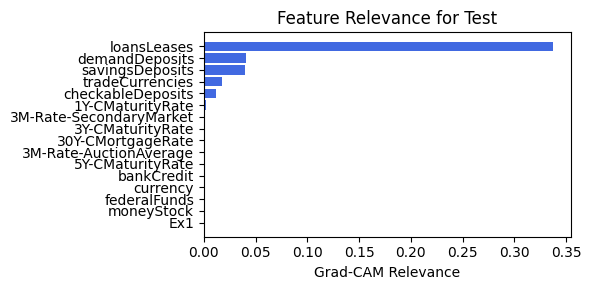

In [88]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=9, lamb=1e-05, steps=40)

### 1.3.6 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.41e-01 | eval_loss: 1.74e-01 | reg: 2.70e+01 |: 100%|█| 40/40 [00:12<00:00,  3.24it/

saving model version 0.1
Best epoch 39
0.22002828121185303
M_KAN Relevance: 0.11298706382513046
CNN Relevance: 0.8870128989219666
[('loansLeases', 0.34306931), ('checkableDeposits', 0.30100235), ('bankCredit', 0.2882163), ('3M-Rate-AuctionAverage', 0.28628516), ('5Y-CMaturityRate', 0.25598866), ('30Y-CMortgageRate', 0.22768065), ('federalFunds', 0.21949965), ('3M-Rate-SecondaryMarket', 0.20395403), ('1Y-CMaturityRate', 0.19624607), ('currency', 0.17949311), ('moneyStock', 0.14785606), ('tradeCurrencies', 0.14633602), ('3Y-CMaturityRate', 0.142984), ('savingsDeposits', 0.14242557), ('demandDeposits', 0.1318952)]


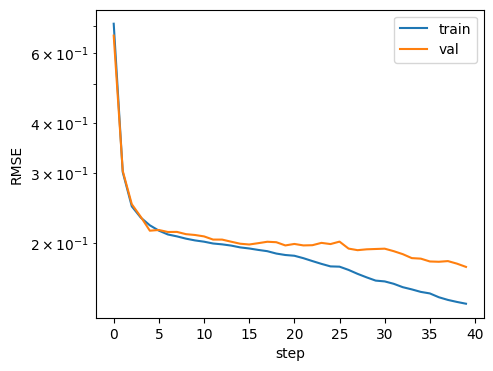

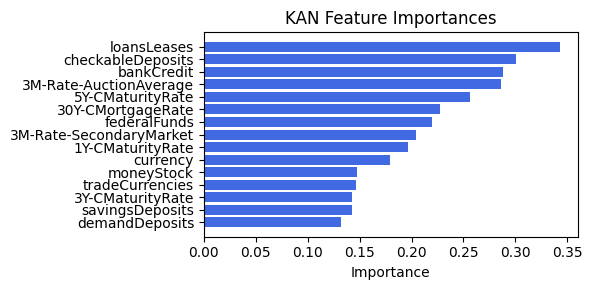

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.15it/s]


[('checkableDeposits', 0.24193644914554344), ('3M-Rate-SecondaryMarket', 0.19856436158131277), ('currency', 0.13063480996116553), ('loansLeases', 0.035304944469992605), ('Ex1', 0.006621616972344262), ('savingsDeposits', 0.0033152941901270034), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('tradeCurrencies', 0.0)]


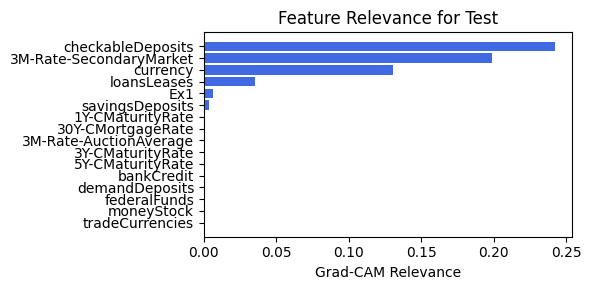

In [89]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=12, lamb=1e-05, steps=40)

### 1.3.7 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.41e-01 | eval_loss: 1.74e-01 | reg: 2.70e+01 |: 100%|█| 40/40 [00:13<00:00,  3.03it/

saving model version 0.1
Best epoch 39
0.22002828121185303
M_KAN Relevance: 0.11298706382513046
CNN Relevance: 0.8870128989219666
[('loansLeases', 0.34306931), ('checkableDeposits', 0.30100235), ('bankCredit', 0.2882163), ('3M-Rate-AuctionAverage', 0.28628516), ('5Y-CMaturityRate', 0.25598866), ('30Y-CMortgageRate', 0.22768065), ('federalFunds', 0.21949965), ('3M-Rate-SecondaryMarket', 0.20395403), ('1Y-CMaturityRate', 0.19624607), ('currency', 0.17949311), ('moneyStock', 0.14785606), ('tradeCurrencies', 0.14633602), ('3Y-CMaturityRate', 0.142984), ('savingsDeposits', 0.14242557), ('demandDeposits', 0.1318952)]


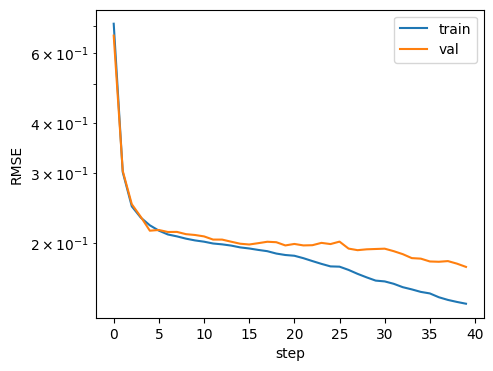

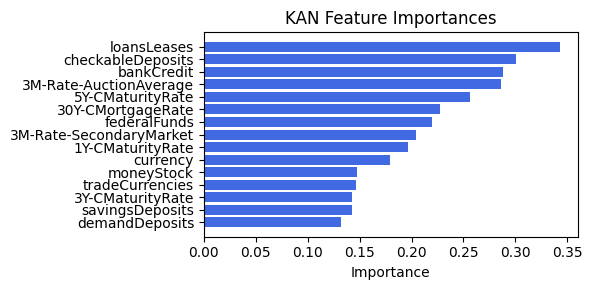

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.80it/s]

[('checkableDeposits', 0.24193644914554344), ('3M-Rate-SecondaryMarket', 0.19856436158131277), ('currency', 0.13063480996116553), ('loansLeases', 0.035304944469992605), ('Ex1', 0.006621616972344262), ('savingsDeposits', 0.0033152941901270034), ('1Y-CMaturityRate', 0.0), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3Y-CMaturityRate', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('demandDeposits', 0.0), ('federalFunds', 0.0), ('moneyStock', 0.0), ('tradeCurrencies', 0.0)]


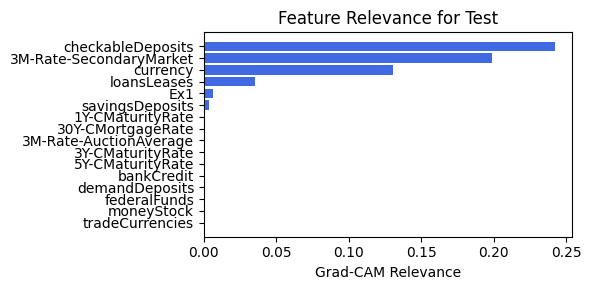

In [90]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=12, lamb=1e-05, steps=40)

### 1.3.8 width=[15, 6, 1], grid=7, lamb=1e-05 | cnn_bottleneck_dim=12

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_1


| train_loss: 1.26e-01 | eval_loss: 2.00e-01 | reg: 3.12e+01 |: 100%|█| 50/50 [01:07<00:00,  1.34s/i


saving model version 0.1
Best epoch 28
0.22030866146087646
M_KAN Relevance: 0.19205324351787567
CNN Relevance: 0.8079467415809631
[('federalFunds', 0.25127065), ('3M-Rate-AuctionAverage', 0.22149813), ('checkableDeposits', 0.20465349), ('30Y-CMortgageRate', 0.19760415), ('bankCredit', 0.1968824), ('1Y-CMaturityRate', 0.18745236), ('loansLeases', 0.17345159), ('3M-Rate-SecondaryMarket', 0.1616516), ('moneyStock', 0.1526742), ('3Y-CMaturityRate', 0.15138188), ('tradeCurrencies', 0.14910148), ('5Y-CMaturityRate', 0.14147829), ('savingsDeposits', 0.1173612), ('currency', 0.11620274), ('demandDeposits', 0.10094641)]


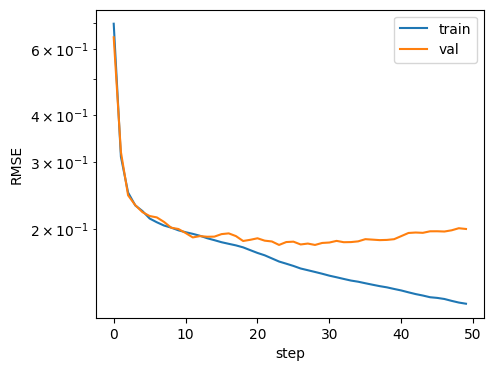

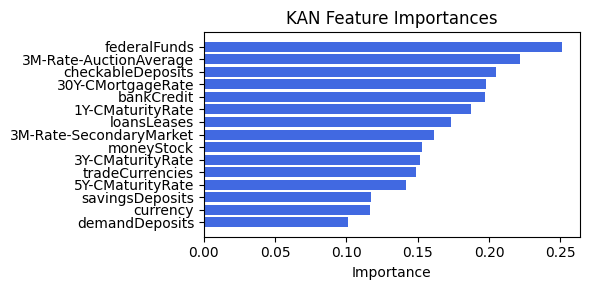

Computing Grad-CAM:   0%|          | 0/210 [00:00<?, ?it/s]C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strict

[('3Y-CMaturityRate', 0.18982430486718105), ('1Y-CMaturityRate', 0.1681677593583507), ('demandDeposits', 0.054549470604286485), ('loansLeases', 0.0296421799817056), ('tradeCurrencies', 0.01499727570584842), ('savingsDeposits', 0.0004603050942759659), ('federalFunds', 5.0833278025190035e-05), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('3M-Rate-SecondaryMarket', 0.0), ('5Y-CMaturityRate', 0.0), ('bankCredit', 0.0), ('currency', 0.0), ('moneyStock', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


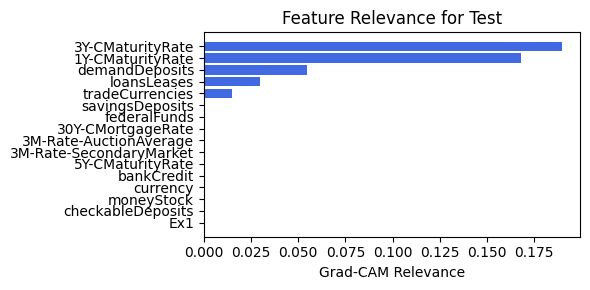

In [36]:
train_and_plot_relevance(Model3_1, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=12, lamb=1e-05, steps=50)

# Option 2: Multiply CNN output by factor

## 2.0. width=[15, 5, 1], grid=4, lamb=0.0001

### 2.0.1. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.61e-01 | eval_loss: 1.88e-01 | reg: 9.86e+01 |: 100%|█| 40/40 [00:37<00:00,  1.07it/

saving model version 0.1
Best epoch 38
0.25507092475891113
M_KAN Relevance: 0.016929099336266518
CNN Relevance: 0.9830709099769592
[('tradeCurrencies', 0.39819047), ('30Y-CMortgageRate', 0.28469792), ('bankCredit', 0.28035986), ('savingsDeposits', 0.2798463), ('checkableDeposits', 0.27754435), ('federalFunds', 0.21828108), ('1Y-CMaturityRate', 0.20318262), ('loansLeases', 0.18838452), ('moneyStock', 0.18180776), ('5Y-CMaturityRate', 0.1683668), ('3M-Rate-AuctionAverage', 0.16193628), ('3Y-CMaturityRate', 0.16114126), ('3M-Rate-SecondaryMarket', 0.15247288), ('demandDeposits', 0.14905098), ('currency', 0.13466232)]


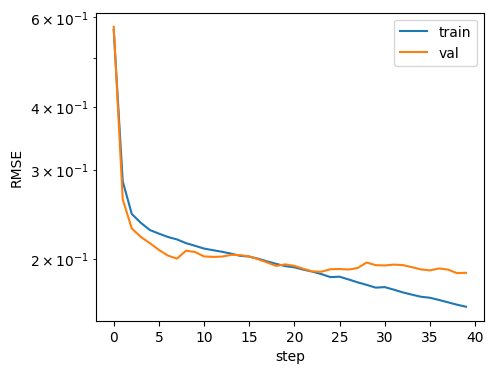

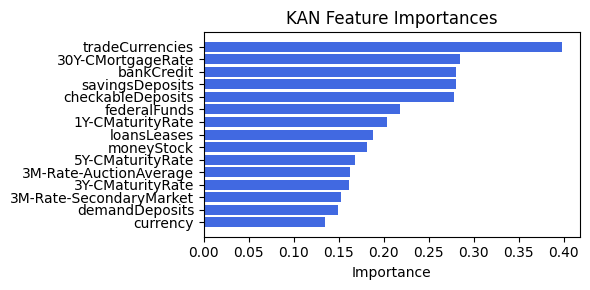

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.48it/s]

[('Ex1', 0.48464379097623306), ('tradeCurrencies', 0.1320186092828711), ('savingsDeposits', 0.10819583223326065), ('loansLeases', 0.08799421437073587), ('5Y-CMaturityRate', 0.03135870974538626), ('bankCredit', 0.029511932463425355), ('3Y-CMaturityRate', 0.02205049260172971), ('demandDeposits', 0.017950619291514158), ('currency', 0.015469242339687689), ('1Y-CMaturityRate', 0.008523134011331769), ('federalFunds', 0.006090632727275425), ('moneyStock', 0.003783431235656497), ('3M-Rate-SecondaryMarket', 0.0008631047970127492), ('30Y-CMortgageRate', 0.0002546146157242003), ('3M-Rate-AuctionAverage', 8.754714259079524e-05), ('checkableDeposits', 0.0)]


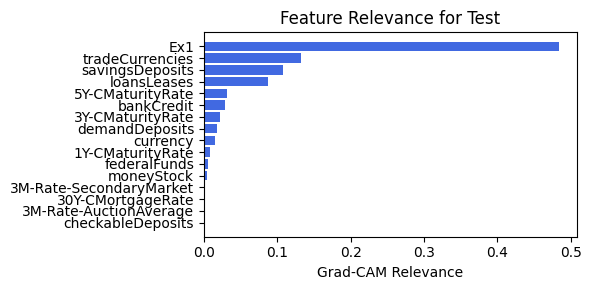

In [91]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.75)

### 2.0.2. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.57e-01 | eval_loss: 1.82e-01 | reg: 8.55e+01 |: 100%|█| 40/40 [00:37<00:00,  1.07it/

saving model version 0.1
Best epoch 31
0.25846928358078003
M_KAN Relevance: 0.010963289998471737
CNN Relevance: 0.9890367388725281
[('tradeCurrencies', 0.39338621), ('30Y-CMortgageRate', 0.3561301), ('bankCredit', 0.3308343), ('moneyStock', 0.27148977), ('savingsDeposits', 0.26313344), ('checkableDeposits', 0.22057183), ('federalFunds', 0.20593338), ('3Y-CMaturityRate', 0.20008357), ('3M-Rate-AuctionAverage', 0.19885372), ('1Y-CMaturityRate', 0.18446496), ('loansLeases', 0.15022096), ('demandDeposits', 0.13580555), ('5Y-CMaturityRate', 0.1244635), ('currency', 0.10453103), ('3M-Rate-SecondaryMarket', 0.0983572)]


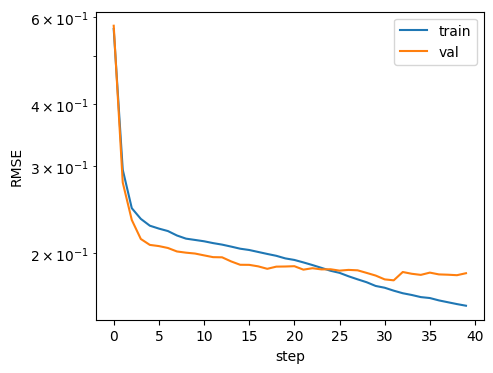

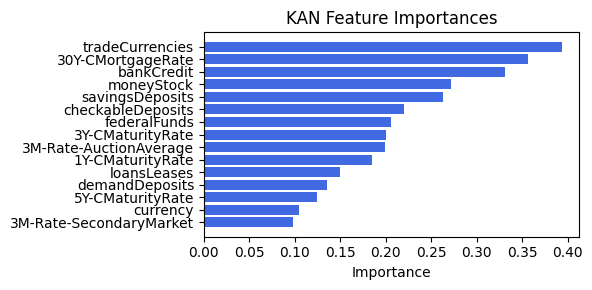

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.48it/s]


[('tradeCurrencies', 0.3250988699207526), ('loansLeases', 0.21876598290345145), ('savingsDeposits', 0.14335244770960084), ('3Y-CMaturityRate', 0.07020824654471307), ('demandDeposits', 0.03744540081935979), ('3M-Rate-SecondaryMarket', 0.005872254883537867), ('1Y-CMaturityRate', 0.00532779252777497), ('5Y-CMaturityRate', 0.004420231961246047), ('bankCredit', 0.0033884765121564714), ('Ex1', 0.0021793831450243792), ('3M-Rate-AuctionAverage', 0.0004532247426963988), ('30Y-CMortgageRate', 0.00033368122364793503), ('currency', 8.868935096654155e-05), ('federalFunds', 5.0478388688394005e-05), ('moneyStock', 0.0), ('checkableDeposits', 0.0)]


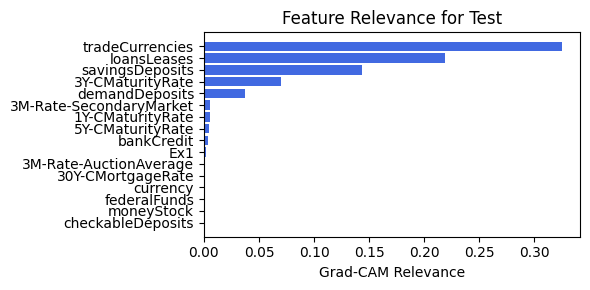

In [92]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.75)

### 2.0.3. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.48e-01 | eval_loss: 1.75e-01 | reg: 9.52e+01 |: 100%|█| 40/40 [00:38<00:00,  1.05it/

saving model version 0.1
Best epoch 38
0.23031648993492126
M_KAN Relevance: 0.14235994219779968
CNN Relevance: 0.8576400279998779
[('30Y-CMortgageRate', 0.67840767), ('tradeCurrencies', 0.6291317), ('federalFunds', 0.4361352), ('bankCredit', 0.43153164), ('moneyStock', 0.4198582), ('3Y-CMaturityRate', 0.26321164), ('savingsDeposits', 0.25762227), ('3M-Rate-SecondaryMarket', 0.24801107), ('3M-Rate-AuctionAverage', 0.24291006), ('demandDeposits', 0.20127387), ('1Y-CMaturityRate', 0.19022126), ('loansLeases', 0.16988735), ('5Y-CMaturityRate', 0.1573944), ('checkableDeposits', 0.1476994), ('currency', 0.04032972)]


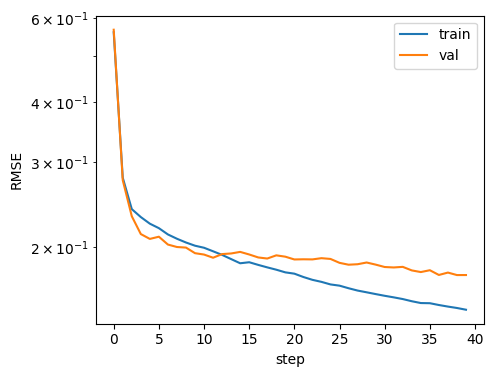

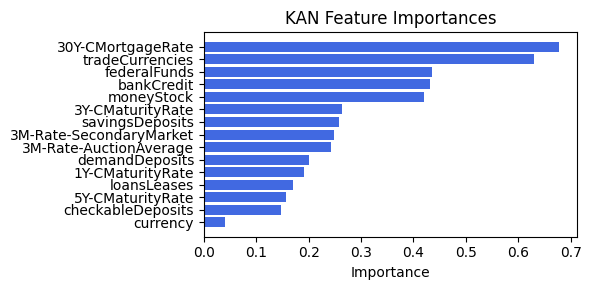

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.38it/s]

[('Ex1', 0.2638439764947786), ('checkableDeposits', 0.10597698233489479), ('loansLeases', 0.05767551470032361), ('savingsDeposits', 0.057081189600285145), ('moneyStock', 0.04138588831715641), ('tradeCurrencies', 0.040250590745182266), ('currency', 0.03620839259653751), ('1Y-CMaturityRate', 0.029036126411076457), ('5Y-CMaturityRate', 0.02882042931658881), ('bankCredit', 0.025427208949501314), ('federalFunds', 0.01713638331497177), ('3M-Rate-SecondaryMarket', 0.01697789926880172), ('3Y-CMaturityRate', 0.012553315166760946), ('30Y-CMortgageRate', 0.009402711653993243), ('3M-Rate-AuctionAverage', 0.009101682555462632), ('demandDeposits', 0.006447363724665982)]


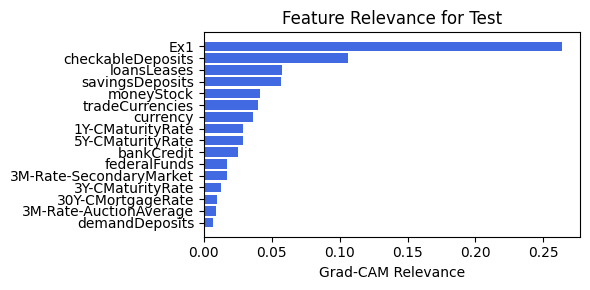

In [93]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.5)

### 2.0.4. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.47e-01 | eval_loss: 1.86e-01 | reg: 9.73e+01 |: 100%|█| 40/40 [00:36<00:00,  1.08it/

saving model version 0.1
Best epoch 27
0.24592897295951843
M_KAN Relevance: 0.16562773287296295
CNN Relevance: 0.8343722820281982
[('30Y-CMortgageRate', 0.5142643), ('tradeCurrencies', 0.49087372), ('federalFunds', 0.4642149), ('bankCredit', 0.26361734), ('moneyStock', 0.2542086), ('3M-Rate-SecondaryMarket', 0.25408703), ('3M-Rate-AuctionAverage', 0.24165705), ('3Y-CMaturityRate', 0.21166252), ('savingsDeposits', 0.18836336), ('5Y-CMaturityRate', 0.17992933), ('loansLeases', 0.17219463), ('1Y-CMaturityRate', 0.16712527), ('checkableDeposits', 0.11977102), ('demandDeposits', 0.09318393), ('currency', 0.053353835)]


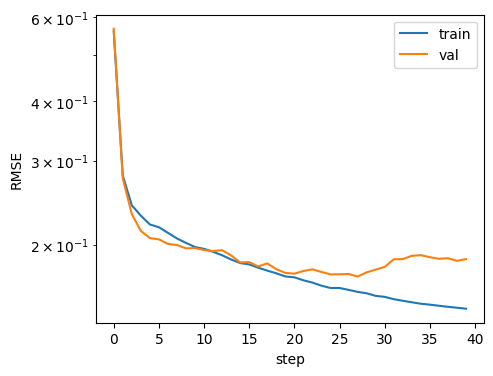

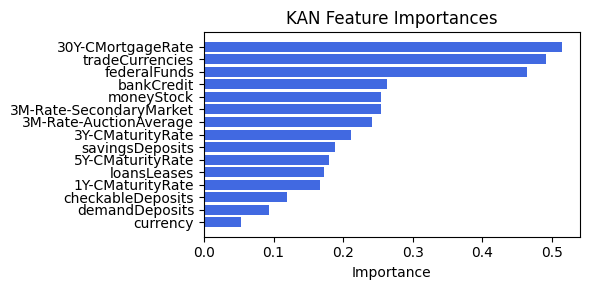

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.94it/s]

[('Ex1', 0.24582197821915283), ('loansLeases', 0.18377622873300598), ('currency', 0.145360385710817), ('3Y-CMaturityRate', 0.10381137371961294), ('checkableDeposits', 0.0981366853584491), ('tradeCurrencies', 0.07328175288248098), ('3M-Rate-SecondaryMarket', 0.07188953594526365), ('demandDeposits', 0.058607258089441096), ('moneyStock', 0.05423894227881517), ('savingsDeposits', 0.04365951166338553), ('1Y-CMaturityRate', 0.03550963114858383), ('30Y-CMortgageRate', 0.030474012154376222), ('3M-Rate-AuctionAverage', 0.029370868755947976), ('5Y-CMaturityRate', 0.017587683791948836), ('bankCredit', 0.01639861651208429), ('federalFunds', 0.01584465549766952)]


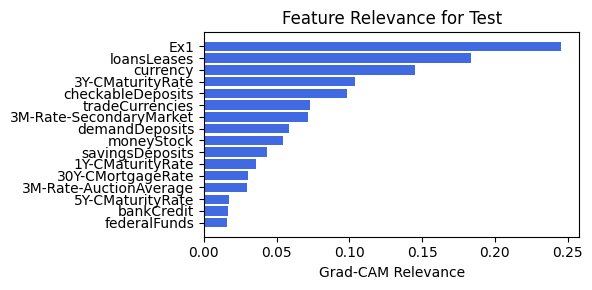

In [94]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.5)

### 2.0.5. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.38e-01 | eval_loss: 1.95e-01 | reg: 1.01e+02 |: 100%|█| 40/40 [00:34<00:00,  1.15it/

saving model version 0.1
Best epoch 13
0.22061511874198914
M_KAN Relevance: 0.23293496668338776
CNN Relevance: 0.7670650482177734
[('30Y-CMortgageRate', 0.42798978), ('moneyStock', 0.21033482), ('bankCredit', 0.16117786), ('tradeCurrencies', 0.15826051), ('3M-Rate-SecondaryMarket', 0.08936858), ('3Y-CMaturityRate', 0.083331786), ('3M-Rate-AuctionAverage', 0.07341381), ('5Y-CMaturityRate', 0.06485119), ('loansLeases', 0.06245295), ('checkableDeposits', 0.061271396), ('savingsDeposits', 0.058477145), ('currency', 0.04515486), ('federalFunds', 0.042403843), ('demandDeposits', 0.029994577), ('1Y-CMaturityRate', 0.028927049)]


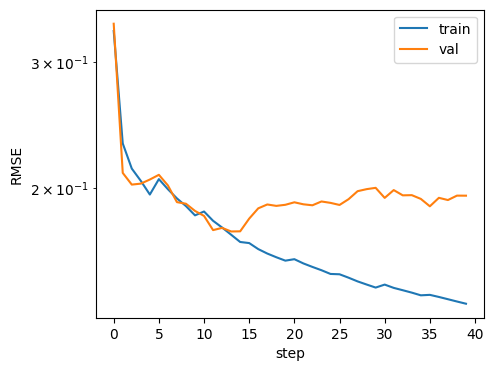

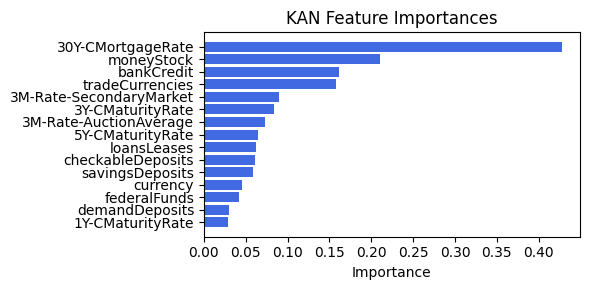

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.92it/s]


[('tradeCurrencies', 0.2625074824296115), ('loansLeases', 0.22095826955295966), ('savingsDeposits', 0.1743716739118099), ('3Y-CMaturityRate', 0.11292315650110443), ('1Y-CMaturityRate', 0.08614625661146073), ('bankCredit', 0.0787668969581968), ('demandDeposits', 0.07746482112533634), ('5Y-CMaturityRate', 0.0749922258613099), ('federalFunds', 0.06138231991679363), ('3M-Rate-AuctionAverage', 0.060702966153621675), ('moneyStock', 0.05940473612752699), ('30Y-CMortgageRate', 0.05846963260500204), ('checkableDeposits', 0.036016467076704084), ('3M-Rate-SecondaryMarket', 0.031158048030920326), ('currency', 0.029717513743699308), ('Ex1', 0.0193702319837203)]


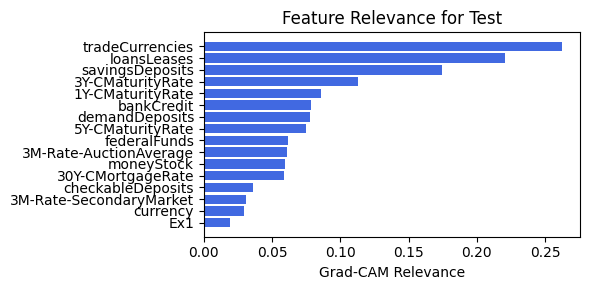

In [95]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.25)

### 2.0.6. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.38e-01 | eval_loss: 1.95e-01 | reg: 1.01e+02 |: 100%|█| 40/40 [00:35<00:00,  1.12it/

saving model version 0.1
Best epoch 13
0.22061511874198914
M_KAN Relevance: 0.23293496668338776
CNN Relevance: 0.7670650482177734
[('30Y-CMortgageRate', 0.42798978), ('moneyStock', 0.21033482), ('bankCredit', 0.16117786), ('tradeCurrencies', 0.15826051), ('3M-Rate-SecondaryMarket', 0.08936858), ('3Y-CMaturityRate', 0.083331786), ('3M-Rate-AuctionAverage', 0.07341381), ('5Y-CMaturityRate', 0.06485119), ('loansLeases', 0.06245295), ('checkableDeposits', 0.061271396), ('savingsDeposits', 0.058477145), ('currency', 0.04515486), ('federalFunds', 0.042403843), ('demandDeposits', 0.029994577), ('1Y-CMaturityRate', 0.028927049)]


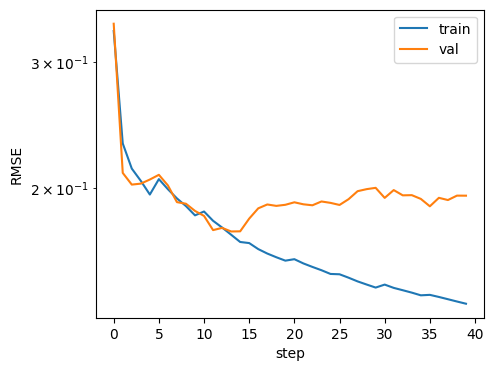

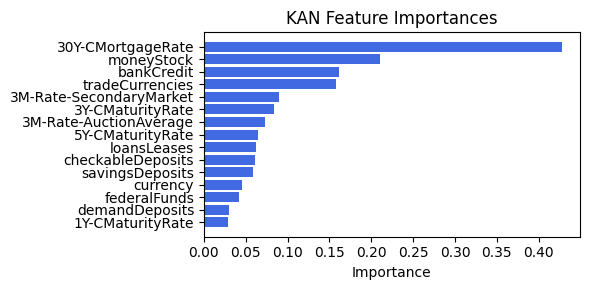

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.24it/s]


[('tradeCurrencies', 0.2625074824296115), ('loansLeases', 0.22095826983679132), ('savingsDeposits', 0.1743716739118099), ('3Y-CMaturityRate', 0.11292315650110443), ('1Y-CMaturityRate', 0.08614625661146073), ('bankCredit', 0.0787668969581968), ('demandDeposits', 0.07746482112533634), ('5Y-CMaturityRate', 0.0749922258613099), ('federalFunds', 0.06138231991679363), ('3M-Rate-AuctionAverage', 0.060702966153621675), ('moneyStock', 0.05940473612752699), ('30Y-CMortgageRate', 0.05846963260500204), ('checkableDeposits', 0.036016467076704084), ('3M-Rate-SecondaryMarket', 0.031158048030920326), ('currency', 0.029717513743699308), ('Ex1', 0.0193702319837203)]


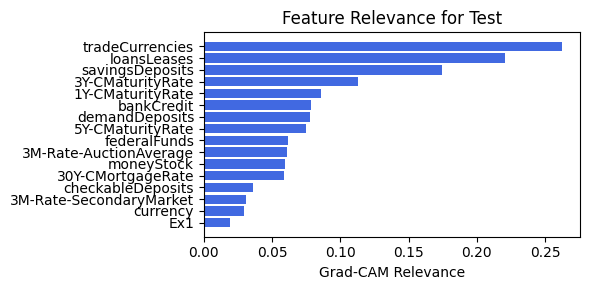

In [96]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.25)

### 2.0.7. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.29e-01 | eval_loss: 1.77e-01 | reg: 8.39e+01 |: 100%|█| 40/40 [00:37<00:00,  1.06it/

saving model version 0.1
Best epoch 33
0.2331593632698059
M_KAN Relevance: 0.41788819432258606
CNN Relevance: 0.5821118354797363
[('30Y-CMortgageRate', 0.21487658), ('moneyStock', 0.18878262), ('3Y-CMaturityRate', 0.14002019), ('3M-Rate-SecondaryMarket', 0.10971584), ('tradeCurrencies', 0.10498536), ('checkableDeposits', 0.09483341), ('loansLeases', 0.08195221), ('5Y-CMaturityRate', 0.06833967), ('currency', 0.06670816), ('federalFunds', 0.066370144), ('savingsDeposits', 0.05765906), ('bankCredit', 0.05418812), ('3M-Rate-AuctionAverage', 0.051802438), ('1Y-CMaturityRate', 0.04969646), ('demandDeposits', 0.030450553)]


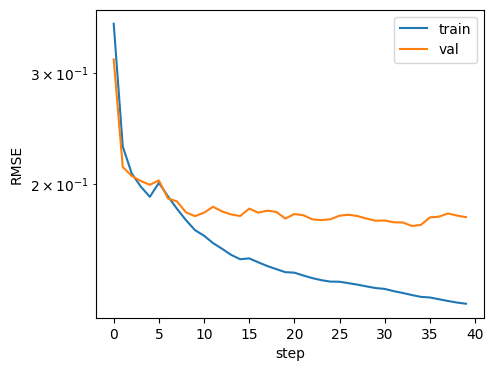

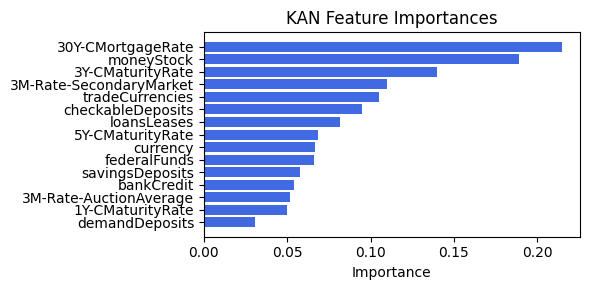

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.14it/s]


[('checkableDeposits', 0.31600090980563045), ('3M-Rate-SecondaryMarket', 0.21623270604759454), ('currency', 0.16775311220525985), ('tradeCurrencies', 0.16697511282039895), ('loansLeases', 0.11840083614195118), ('savingsDeposits', 0.09640135308949366), ('3Y-CMaturityRate', 0.0863194894721909), ('moneyStock', 0.08330704009027354), ('demandDeposits', 0.07887699822063692), ('bankCredit', 0.07510573195204848), ('5Y-CMaturityRate', 0.07380685365448396), ('1Y-CMaturityRate', 0.07167953680978999), ('federalFunds', 0.07059421220162351), ('Ex1', 0.0626505639182315), ('3M-Rate-AuctionAverage', 0.06030641748969044), ('30Y-CMortgageRate', 0.055006008917864946)]


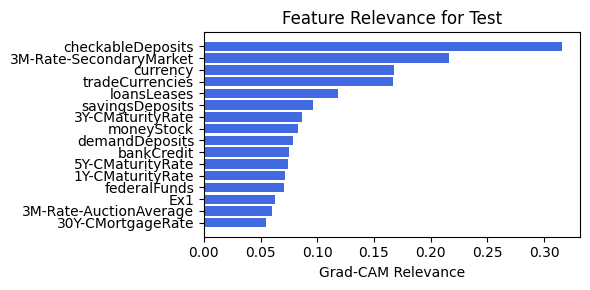

In [97]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.1)

### 2.0.8. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.36e-01 | eval_loss: 1.93e-01 | reg: 9.57e+01 |: 100%|█| 40/40 [00:36<00:00,  1.11it/

saving model version 0.1
Best epoch 11
0.2370930314064026
M_KAN Relevance: 0.3404315710067749
CNN Relevance: 0.6595684289932251
[('30Y-CMortgageRate', 0.21650131), ('moneyStock', 0.18524311), ('loansLeases', 0.14072476), ('3Y-CMaturityRate', 0.13821779), ('1Y-CMaturityRate', 0.1247849), ('3M-Rate-SecondaryMarket', 0.12267437), ('checkableDeposits', 0.10472485), ('tradeCurrencies', 0.09275492), ('savingsDeposits', 0.06113113), ('currency', 0.061043438), ('5Y-CMaturityRate', 0.05461177), ('3M-Rate-AuctionAverage', 0.054356854), ('bankCredit', 0.052732747), ('demandDeposits', 0.04302102), ('federalFunds', 0.033671193)]


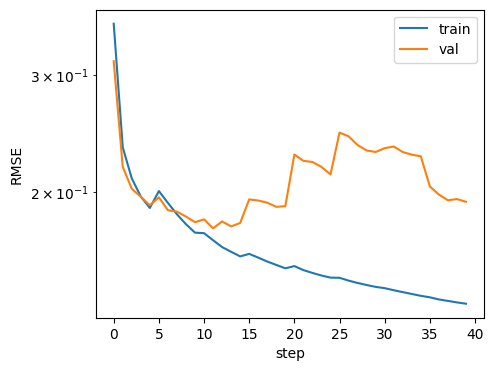

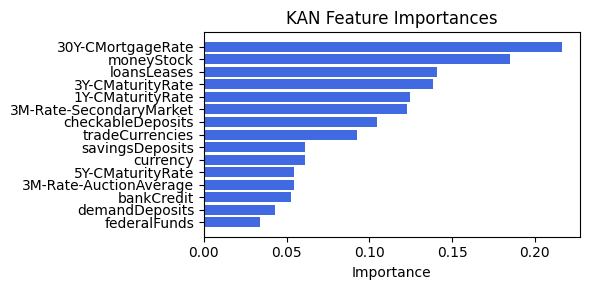

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.62it/s]

[('tradeCurrencies', 0.3461973775532984), ('loansLeases', 0.3086119265073822), ('savingsDeposits', 0.20499899629254026), ('3Y-CMaturityRate', 0.17071645452967157), ('1Y-CMaturityRate', 0.15367765676370862), ('demandDeposits', 0.11202632921271115), ('moneyStock', 0.09937919773191901), ('checkableDeposits', 0.06444865670942125), ('federalFunds', 0.060029438938138245), ('bankCredit', 0.04994679769623049), ('5Y-CMaturityRate', 0.0474306808075025), ('currency', 0.04436220674819889), ('Ex1', 0.0386271712582259), ('3M-Rate-AuctionAverage', 0.03781786229284037), ('30Y-CMortgageRate', 0.034448231004283854), ('3M-Rate-SecondaryMarket', 0.03358951141126454)]


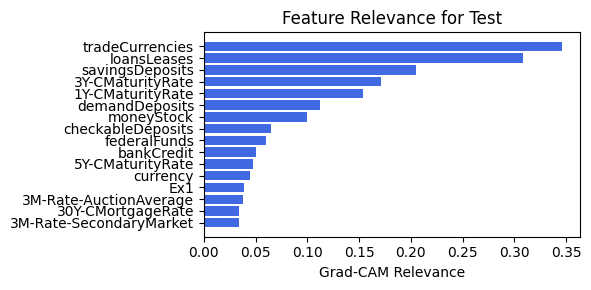

In [98]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.1)

### 2.0.9. width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.075

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.37e-01 | eval_loss: 1.94e-01 | reg: 1.08e+02 |: 100%|█| 40/40 [00:36<00:00,  1.10it/

saving model version 0.1
Best epoch 12
0.23409979045391083
M_KAN Relevance: 0.2874227464199066
CNN Relevance: 0.712577223777771
[('30Y-CMortgageRate', 0.301972), ('moneyStock', 0.24204369), ('1Y-CMaturityRate', 0.16029124), ('tradeCurrencies', 0.15788253), ('checkableDeposits', 0.12509339), ('3Y-CMaturityRate', 0.119022585), ('loansLeases', 0.11321755), ('currency', 0.1059652), ('3M-Rate-SecondaryMarket', 0.10158409), ('3M-Rate-AuctionAverage', 0.077349916), ('federalFunds', 0.075669825), ('savingsDeposits', 0.06770791), ('demandDeposits', 0.066088445), ('5Y-CMaturityRate', 0.061329525), ('bankCredit', 0.03252263)]


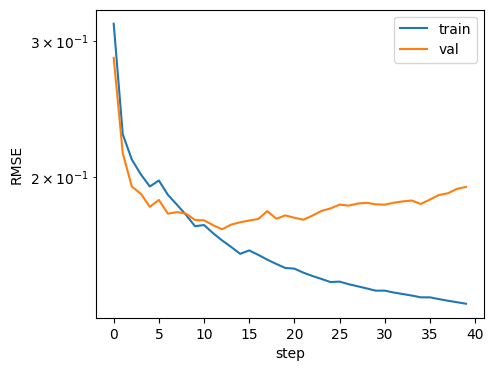

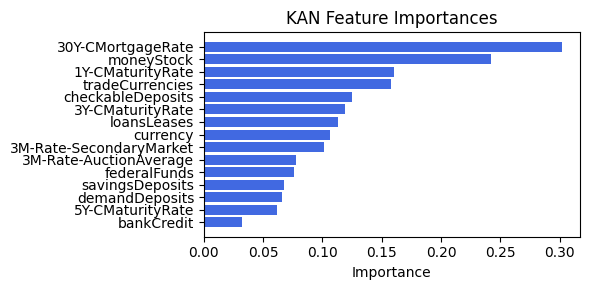

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.98it/s]

[('checkableDeposits', 0.18856071551064296), ('loansLeases', 0.13052375826103213), ('3M-Rate-SecondaryMarket', 0.1097395711467557), ('1Y-CMaturityRate', 0.10230730648230141), ('currency', 0.07885405257222287), ('demandDeposits', 0.05912825364974283), ('3Y-CMaturityRate', 0.05861212530262059), ('savingsDeposits', 0.05282384730332221), ('Ex1', 0.03363820128752628), ('tradeCurrencies', 0.030566938426567332), ('bankCredit', 0.024120762589986303), ('5Y-CMaturityRate', 0.02169943066740719), ('moneyStock', 0.01944490137199561), ('federalFunds', 0.018728178693951728), ('30Y-CMortgageRate', 0.014326420625660656), ('3M-Rate-AuctionAverage', 0.012622956490321528)]


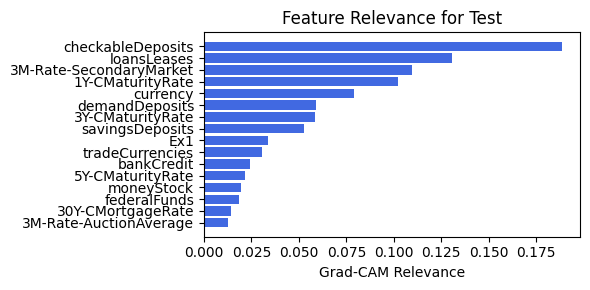

In [146]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.075)

### 2.0.10 width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.075

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.32e-01 | eval_loss: 1.95e-01 | reg: 9.98e+01 |: 100%|█| 40/40 [00:36<00:00,  1.11it/

saving model version 0.1
Best epoch 9
0.24250294268131256
M_KAN Relevance: 0.316324383020401
CNN Relevance: 0.6836755871772766
[('30Y-CMortgageRate', 0.3238281), ('moneyStock', 0.2561102), ('tradeCurrencies', 0.17474164), ('1Y-CMaturityRate', 0.16958089), ('loansLeases', 0.13376354), ('3Y-CMaturityRate', 0.12184459), ('checkableDeposits', 0.11912169), ('currency', 0.118396096), ('3M-Rate-SecondaryMarket', 0.10433666), ('federalFunds', 0.07872998), ('3M-Rate-AuctionAverage', 0.07524142), ('demandDeposits', 0.06287144), ('savingsDeposits', 0.058190342), ('5Y-CMaturityRate', 0.049720187), ('bankCredit', 0.03638272)]


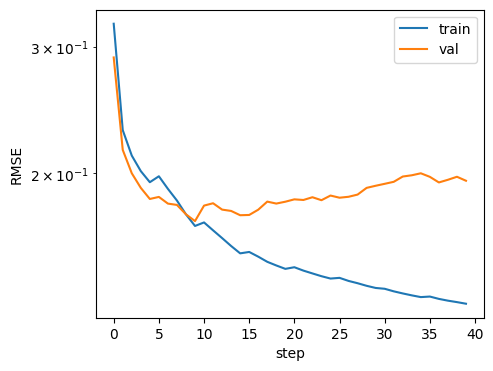

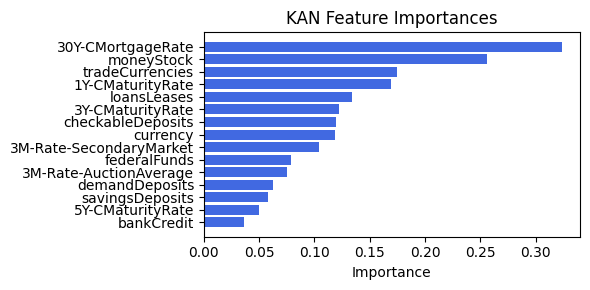

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  9.02it/s]

[('1Y-CMaturityRate', 0.15618461606236883), ('checkableDeposits', 0.0686040529692989), ('demandDeposits', 0.06507616771407249), ('3Y-CMaturityRate', 0.05942955070308276), ('moneyStock', 0.04949125310910555), ('3M-Rate-SecondaryMarket', 0.0460129152930763), ('currency', 0.02880245386733718), ('30Y-CMortgageRate', 0.026587926662926163), ('loansLeases', 0.025829205520442752), ('3M-Rate-AuctionAverage', 0.024479904948245913), ('tradeCurrencies', 0.01717940662887746), ('bankCredit', 0.014704646290712324), ('5Y-CMaturityRate', 0.01456749004400557), ('Ex1', 0.01255892273703856), ('federalFunds', 0.01239033532994134), ('savingsDeposits', 0.009067937651066348)]


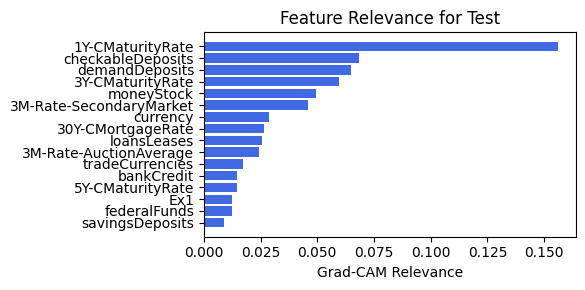

In [147]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.075)

### 2.0.11 width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.38e-01 | eval_loss: 1.95e-01 | reg: 1.11e+02 |: 100%|█| 40/40 [00:35<00:00,  1.14it/

saving model version 0.1
Best epoch 13
0.2232365757226944
M_KAN Relevance: 0.2625581920146942
CNN Relevance: 0.7374417781829834
[('30Y-CMortgageRate', 0.24300086), ('moneyStock', 0.19324774), ('savingsDeposits', 0.14351818), ('3Y-CMaturityRate', 0.13392228), ('tradeCurrencies', 0.11241452), ('1Y-CMaturityRate', 0.11023714), ('3M-Rate-SecondaryMarket', 0.10512944), ('currency', 0.09084724), ('checkableDeposits', 0.09075629), ('demandDeposits', 0.09023798), ('loansLeases', 0.073934905), ('3M-Rate-AuctionAverage', 0.070082895), ('5Y-CMaturityRate', 0.069769695), ('federalFunds', 0.05895647), ('bankCredit', 0.043764826)]


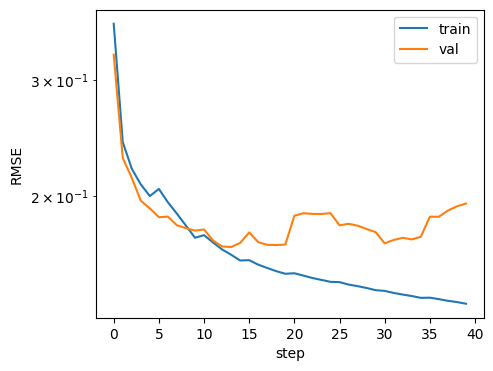

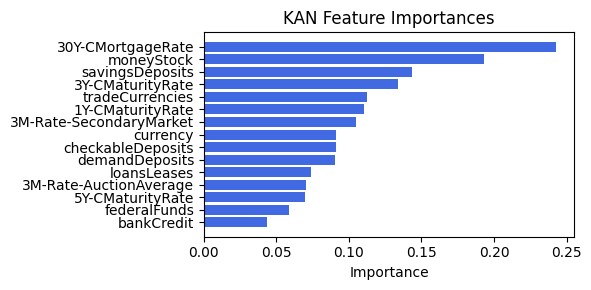

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  8.93it/s]


[('demandDeposits', 0.18019266087572933), ('tradeCurrencies', 0.13784338852620706), ('3Y-CMaturityRate', 0.13254710437530384), ('checkableDeposits', 0.12303202719638301), ('1Y-CMaturityRate', 0.11376524064911618), ('loansLeases', 0.11298380838845679), ('Ex1', 0.11221449504609197), ('savingsDeposits', 0.09435451614103624), ('3M-Rate-SecondaryMarket', 0.08895930982266907), ('moneyStock', 0.08430291606789632), ('federalFunds', 0.08169261814937705), ('5Y-CMaturityRate', 0.08004341325944378), ('bankCredit', 0.07700700794479677), ('currency', 0.06187624587217302), ('30Y-CMortgageRate', 0.05712336409570915), ('3M-Rate-AuctionAverage', 0.05173771518692818)]


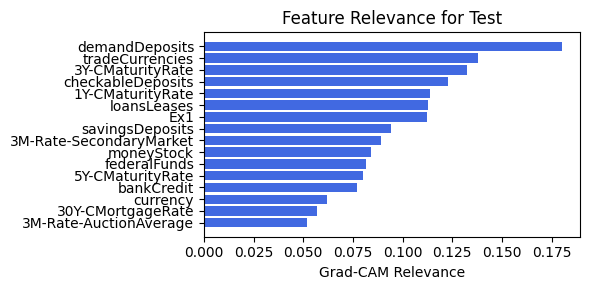

In [150]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.05)

### 2.0.12 width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.35e-01 | eval_loss: 6.04e-01 | reg: 1.11e+02 |: 100%|█| 40/40 [00:35<00:00,  1.14it/

saving model version 0.1
Best epoch 9
0.2374878078699112
M_KAN Relevance: 0.24566256999969482
CNN Relevance: 0.7543373703956604
[('30Y-CMortgageRate', 0.27485907), ('moneyStock', 0.19949532), ('savingsDeposits', 0.15488599), ('3Y-CMaturityRate', 0.13983205), ('1Y-CMaturityRate', 0.119638376), ('tradeCurrencies', 0.110347964), ('3M-Rate-SecondaryMarket', 0.105047286), ('demandDeposits', 0.08787173), ('currency', 0.087273456), ('checkableDeposits', 0.08338418), ('loansLeases', 0.0809001), ('5Y-CMaturityRate', 0.07432765), ('federalFunds', 0.0735328), ('3M-Rate-AuctionAverage', 0.06673242), ('bankCredit', 0.033931706)]


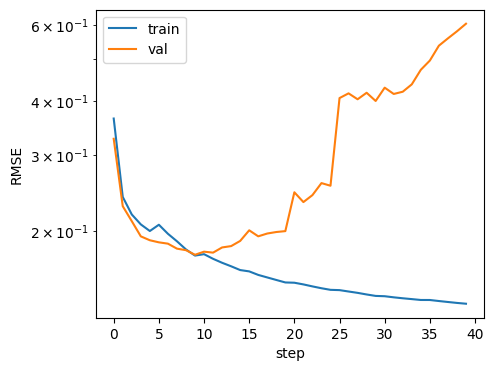

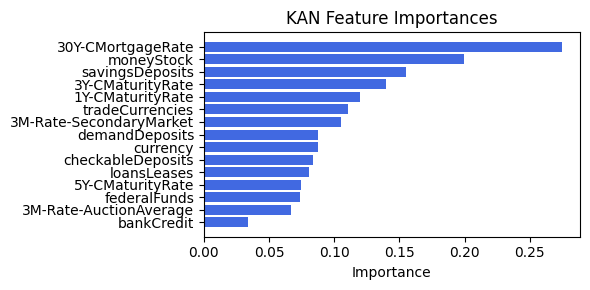

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.63it/s]


[('loansLeases', 0.29091541399247944), ('tradeCurrencies', 0.28763911369522766), ('checkableDeposits', 0.23507022072250644), ('savingsDeposits', 0.19875499839628383), ('currency', 0.1866360426479895), ('Ex1', 0.18034941937907467), ('demandDeposits', 0.16118483224972374), ('3M-Rate-SecondaryMarket', 0.15946587145306348), ('3Y-CMaturityRate', 0.11809769586793013), ('1Y-CMaturityRate', 0.07295160078044449), ('federalFunds', 0.04949302555427754), ('moneyStock', 0.04397584590173903), ('bankCredit', 0.03764131822224174), ('5Y-CMaturityRate', 0.03551110965643255), ('30Y-CMortgageRate', 0.012350792131785835), ('3M-Rate-AuctionAverage', 0.012060431048407086)]


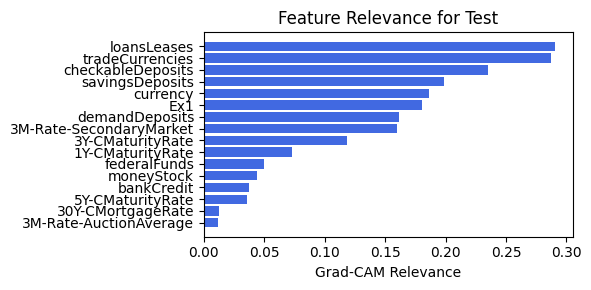

In [149]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.05)

### 2.0.13 width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.42e-01 | eval_loss: 1.74e-01 | reg: 1.16e+02 |: 100%|█| 40/40 [00:34<00:00,  1.14it/

saving model version 0.1
Best epoch 28
0.21558648347854614
M_KAN Relevance: 0.2294643521308899
CNN Relevance: 0.7705356478691101
[('30Y-CMortgageRate', 0.2639298), ('moneyStock', 0.23555617), ('savingsDeposits', 0.22393568), ('3Y-CMaturityRate', 0.16279742), ('tradeCurrencies', 0.1330627), ('3M-Rate-SecondaryMarket', 0.12471759), ('1Y-CMaturityRate', 0.114712715), ('federalFunds', 0.09604793), ('5Y-CMaturityRate', 0.09405522), ('demandDeposits', 0.09367323), ('3M-Rate-AuctionAverage', 0.09322695), ('checkableDeposits', 0.09036849), ('currency', 0.0883172), ('loansLeases', 0.08032584), ('bankCredit', 0.07224965)]


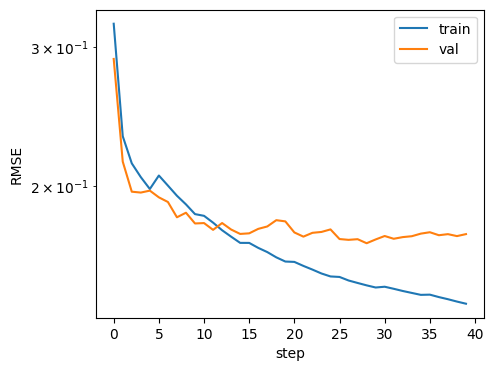

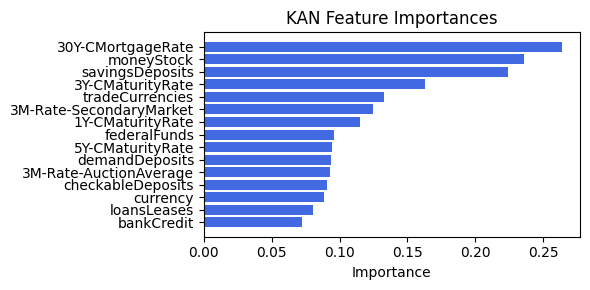

Computing Grad-CAM: 100%|██████████| 210/210 [00:22<00:00,  9.33it/s]

[('demandDeposits', 0.25636896178544877), ('1Y-CMaturityRate', 0.2489134692498261), ('moneyStock', 0.2389821718114988), ('3Y-CMaturityRate', 0.23211261207969594), ('tradeCurrencies', 0.14461160333760614), ('loansLeases', 0.13985372088583453), ('federalFunds', 0.1358328756928954), ('5Y-CMaturityRate', 0.13371027240867817), ('bankCredit', 0.12741106462434842), ('30Y-CMortgageRate', 0.12262270252408815), ('3M-Rate-AuctionAverage', 0.12009548351079935), ('savingsDeposits', 0.10365954715927642), ('Ex1', 0.09973488119721878), ('checkableDeposits', 0.08162721335732688), ('3M-Rate-SecondaryMarket', 0.04732400574451146), ('currency', 0.037739132365926964)]


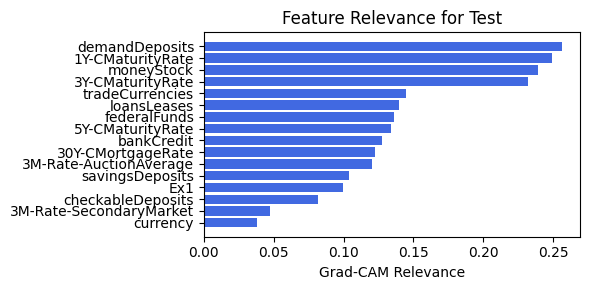

In [157]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.01)

### 2.0.14 width=[15, 5, 1], grid=4, lamb=0.0001 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.36e-01 | eval_loss: 1.91e-01 | reg: 1.09e+02 |: 100%|█| 40/40 [00:35<00:00,  1.14it/

saving model version 0.1
Best epoch 12
0.21748948097229004
M_KAN Relevance: 0.22590257227420807
CNN Relevance: 0.7740974426269531
[('30Y-CMortgageRate', 0.36973792), ('savingsDeposits', 0.27919608), ('moneyStock', 0.23450886), ('tradeCurrencies', 0.18602718), ('loansLeases', 0.17931579), ('3M-Rate-AuctionAverage', 0.17696132), ('3Y-CMaturityRate', 0.17650245), ('3M-Rate-SecondaryMarket', 0.14032163), ('currency', 0.12320415), ('5Y-CMaturityRate', 0.120630085), ('federalFunds', 0.11591659), ('1Y-CMaturityRate', 0.113439135), ('checkableDeposits', 0.09688593), ('demandDeposits', 0.088294946), ('bankCredit', 0.07577791)]


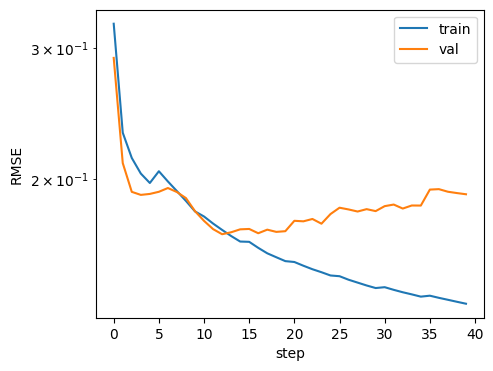

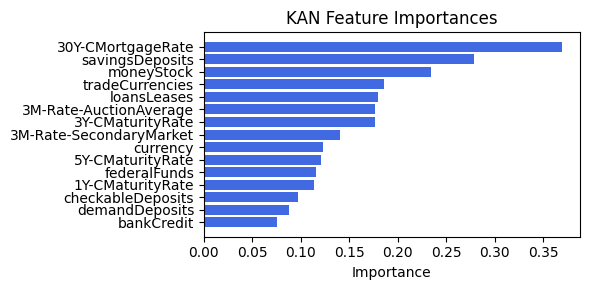

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.56it/s]


[('checkableDeposits', 0.5326075190112793), ('currency', 0.4618065586025339), ('Ex1', 0.44731167316259374), ('3M-Rate-SecondaryMarket', 0.383934074807136), ('moneyStock', 0.07481791669242306), ('demandDeposits', 0.07295705273420372), ('3Y-CMaturityRate', 0.07002387944209788), ('1Y-CMaturityRate', 0.06923688404217718), ('5Y-CMaturityRate', 0.06914362596747066), ('bankCredit', 0.06634676173063261), ('tradeCurrencies', 0.05813313463281485), ('savingsDeposits', 0.053876825668461), ('federalFunds', 0.05371930508796747), ('loansLeases', 0.052821024020557245), ('3M-Rate-AuctionAverage', 0.04952157203640257), ('30Y-CMortgageRate', 0.049420301133899815)]


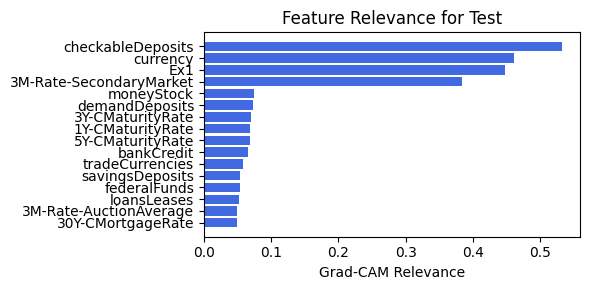

In [158]:
train_and_plot_relevance(Model3_2, kan_neurons=5, kan_grid=4, cnn_bottleneck_dim=-1, lamb=0.0001, steps=40, alpha=.01)

## 2.1 width=[15, 6, 1], grid=5, lamb=1e-05

### 2.1.1. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.09e-01 | eval_loss: 2.06e-01 | reg: 1.08e+02 |: 100%|█| 40/40 [00:39<00:00,  1.00it/

saving model version 0.1
Best epoch 16
0.23388807475566864
M_KAN Relevance: 0.018339935690164566
CNN Relevance: 0.9816600680351257
[('checkableDeposits', 0.37437496), ('tradeCurrencies', 0.27524698), ('loansLeases', 0.23176798), ('30Y-CMortgageRate', 0.21629784), ('3Y-CMaturityRate', 0.20070925), ('federalFunds', 0.19643193), ('currency', 0.18803376), ('5Y-CMaturityRate', 0.1792117), ('moneyStock', 0.16100335), ('3M-Rate-SecondaryMarket', 0.14962238), ('3M-Rate-AuctionAverage', 0.1340432), ('demandDeposits', 0.11374106), ('savingsDeposits', 0.1083697), ('bankCredit', 0.08777263), ('1Y-CMaturityRate', 0.08448951)]


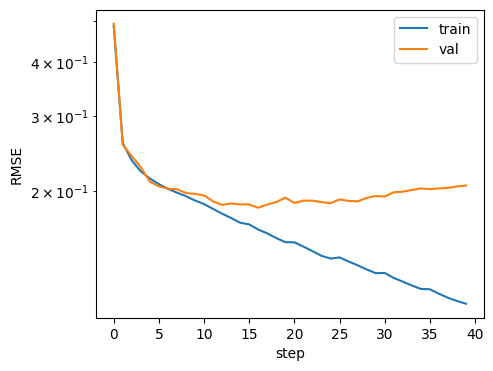

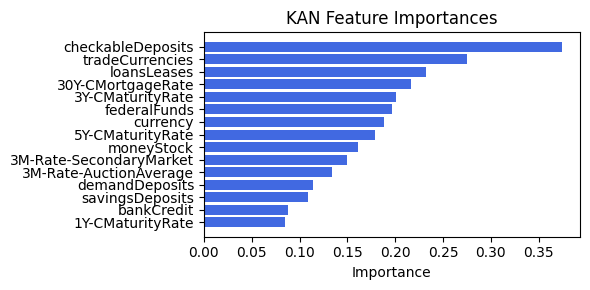

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.87it/s]


[('tradeCurrencies', 0.061516661395407506), ('3Y-CMaturityRate', 0.009716480025755508), ('moneyStock', 0.009352646611209605), ('savingsDeposits', 0.006607429388012471), ('5Y-CMaturityRate', 0.005760683509565535), ('loansLeases', 0.005450718929447855), ('bankCredit', 0.004493845928282965), ('1Y-CMaturityRate', 0.0013105425096693493), ('checkableDeposits', 0.0010309326152006784), ('demandDeposits', 0.0007114408911937581), ('3M-Rate-SecondaryMarket', 0.0004899098937000547), ('Ex1', 0.00015198567970877601), ('currency', 0.00012487310561395826), ('30Y-CMortgageRate', 0.0), ('3M-Rate-AuctionAverage', 0.0), ('federalFunds', 0.0)]


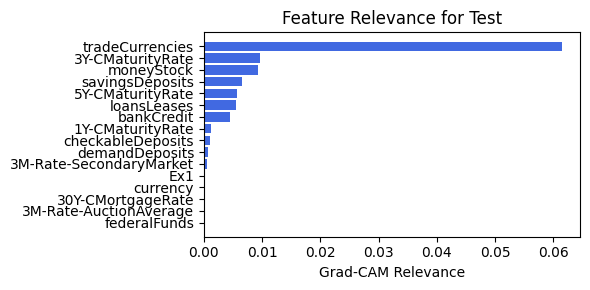

In [99]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.1.2. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.14e-01 | eval_loss: 2.40e-01 | reg: 1.28e+02 |: 100%|█| 40/40 [00:39<00:00,  1.00it/

saving model version 0.1
Best epoch 12
0.2499060481786728
M_KAN Relevance: 0.026872770860791206
CNN Relevance: 0.9731271862983704
[('30Y-CMortgageRate', 0.37334692), ('checkableDeposits', 0.32945192), ('tradeCurrencies', 0.28869918), ('savingsDeposits', 0.2846598), ('federalFunds', 0.2511925), ('loansLeases', 0.2405693), ('3Y-CMaturityRate', 0.22370774), ('currency', 0.20913702), ('moneyStock', 0.1930449), ('3M-Rate-SecondaryMarket', 0.17923239), ('demandDeposits', 0.16920903), ('5Y-CMaturityRate', 0.16223696), ('bankCredit', 0.13797566), ('1Y-CMaturityRate', 0.11901342), ('3M-Rate-AuctionAverage', 0.10979913)]


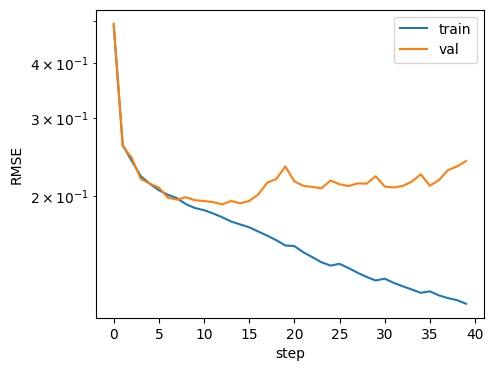

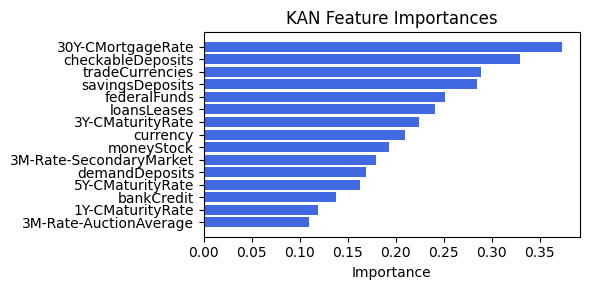

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.30it/s]


[('tradeCurrencies', 0.029613269444200254), ('currency', 0.010300891739981515), ('3Y-CMaturityRate', 0.006620557707113524), ('moneyStock', 0.00499634485514391), ('bankCredit', 0.004104403251161178), ('5Y-CMaturityRate', 0.0036631779168688114), ('1Y-CMaturityRate', 0.002884038542175577), ('savingsDeposits', 0.0025216109521438955), ('loansLeases', 0.0024402562902347807), ('demandDeposits', 0.0016336208122776866), ('3M-Rate-SecondaryMarket', 2.3285282354447103e-05), ('30Y-CMortgageRate', 2.18995569628619e-06), ('3M-Rate-AuctionAverage', 0.0), ('federalFunds', 0.0), ('checkableDeposits', 0.0), ('Ex1', 0.0)]


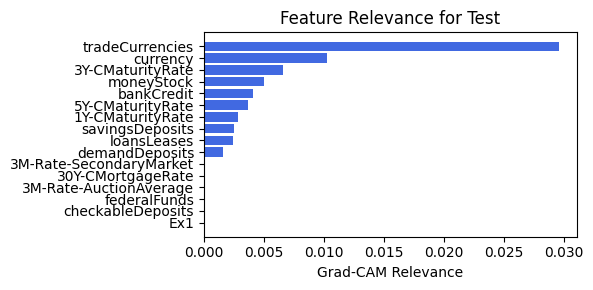

In [100]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.1.3. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.05e-01 | eval_loss: 2.34e-01 | reg: 1.49e+02 |: 100%|█| 40/40 [00:39<00:00,  1.01it/

saving model version 0.1
Best epoch 9
0.22548875212669373
M_KAN Relevance: 0.09161633253097534
CNN Relevance: 0.9083836674690247
[('30Y-CMortgageRate', 0.38916668), ('tradeCurrencies', 0.36380526), ('federalFunds', 0.254115), ('loansLeases', 0.2516168), ('3M-Rate-SecondaryMarket', 0.21826065), ('checkableDeposits', 0.19029753), ('currency', 0.1879447), ('moneyStock', 0.18565488), ('bankCredit', 0.16508077), ('5Y-CMaturityRate', 0.15818398), ('3Y-CMaturityRate', 0.14735839), ('1Y-CMaturityRate', 0.13545342), ('savingsDeposits', 0.12357882), ('3M-Rate-AuctionAverage', 0.102911495), ('demandDeposits', 0.10278838)]


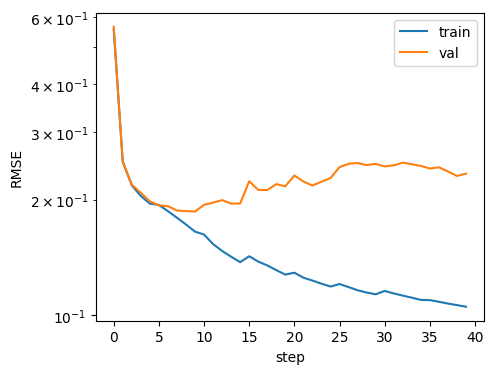

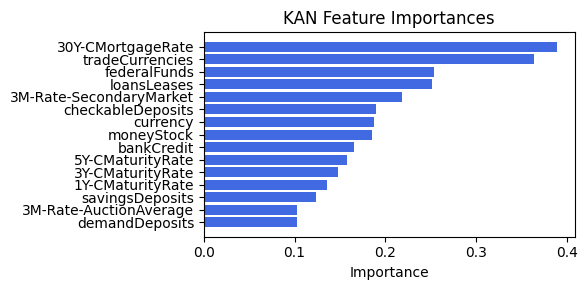

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.88it/s]

[('loansLeases', 0.11866518135093862), ('tradeCurrencies', 0.042057952688386045), ('savingsDeposits', 0.04031514094011592), ('checkableDeposits', 0.007710617213022141), ('1Y-CMaturityRate', 0.0056276237503403706), ('Ex1', 0.004860618745996839), ('bankCredit', 0.0024921052157878877), ('5Y-CMaturityRate', 0.002290822122068632), ('3M-Rate-SecondaryMarket', 0.0021362088110652706), ('moneyStock', 0.0020147107940699373), ('federalFunds', 0.0019393463685576406), ('currency', 0.001891586295373383), ('3Y-CMaturityRate', 0.0013711763612393821), ('30Y-CMortgageRate', 0.0011038689563671747), ('3M-Rate-AuctionAverage', 0.0008784660359933263), ('demandDeposits', 0.000851862332118409)]


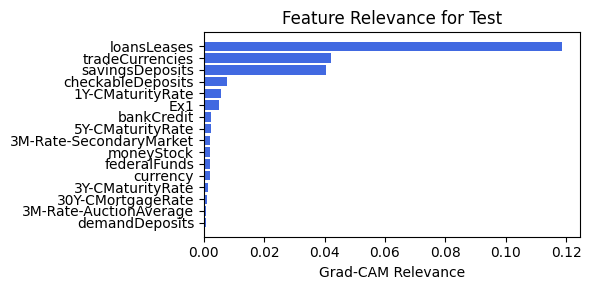

In [101]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.1.4. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.24e-01 | eval_loss: 1.78e-01 | reg: 1.31e+02 |: 100%|█| 40/40 [00:42<00:00,  1.07s/i

saving model version 0.1
Best epoch 39
0.2600853145122528
M_KAN Relevance: 0.05205858498811722
CNN Relevance: 0.9479414820671082
[('30Y-CMortgageRate', 0.333317), ('tradeCurrencies', 0.3152991), ('federalFunds', 0.24667971), ('checkableDeposits', 0.23912095), ('3M-Rate-SecondaryMarket', 0.22630733), ('loansLeases', 0.18962705), ('moneyStock', 0.18223223), ('currency', 0.15336153), ('5Y-CMaturityRate', 0.14068484), ('3Y-CMaturityRate', 0.13800555), ('1Y-CMaturityRate', 0.1125181), ('savingsDeposits', 0.10892089), ('demandDeposits', 0.10652803), ('bankCredit', 0.085386835), ('3M-Rate-AuctionAverage', 0.06849691)]


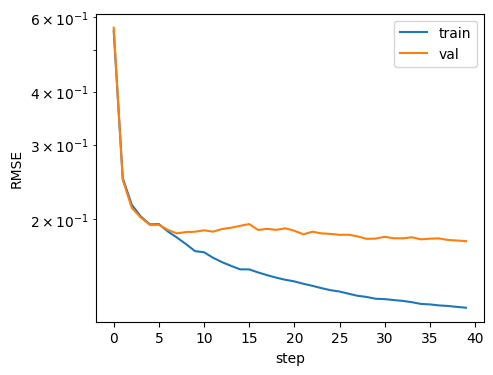

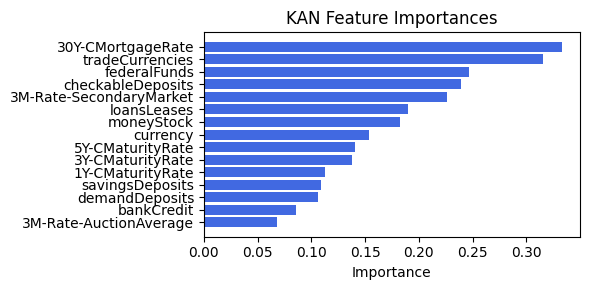

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.79it/s]


[('1Y-CMaturityRate', 0.22920227420205871), ('tradeCurrencies', 0.17418149204736222), ('loansLeases', 0.10775999688547537), ('savingsDeposits', 0.10126390477886335), ('Ex1', 0.10121047626515585), ('3M-Rate-AuctionAverage', 0.1007755898560087), ('30Y-CMortgageRate', 0.09842085766916474), ('demandDeposits', 0.05628069272497669), ('moneyStock', 0.05434300468325438), ('3Y-CMaturityRate', 0.05245893328537932), ('federalFunds', 0.034007012014487935), ('checkableDeposits', 0.02884953248749731), ('bankCredit', 0.02661024263306033), ('5Y-CMaturityRate', 0.026124930960525358), ('3M-Rate-SecondaryMarket', 0.021032432697635765), ('currency', 0.011884612422554277)]


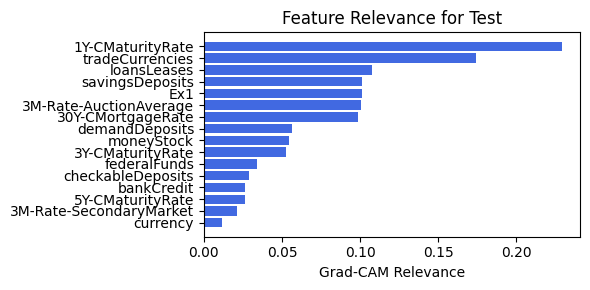

In [102]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.1.5. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.84e-02 | eval_loss: 1.76e-01 | reg: 1.46e+02 |: 100%|█| 40/40 [00:40<00:00,  1.00s/i

saving model version 0.1
Best epoch 26
0.23136435449123383
M_KAN Relevance: 0.2399240881204605
CNN Relevance: 0.7600759267807007
[('30Y-CMortgageRate', 0.22754225), ('moneyStock', 0.19141762), ('tradeCurrencies', 0.14261304), ('checkableDeposits', 0.13034013), ('3Y-CMaturityRate', 0.1262064), ('federalFunds', 0.11534712), ('3M-Rate-SecondaryMarket', 0.091877356), ('3M-Rate-AuctionAverage', 0.07359566), ('5Y-CMaturityRate', 0.06874641), ('loansLeases', 0.06743735), ('1Y-CMaturityRate', 0.06530081), ('currency', 0.06490971), ('savingsDeposits', 0.05936776), ('demandDeposits', 0.05025649), ('bankCredit', 0.04490755)]


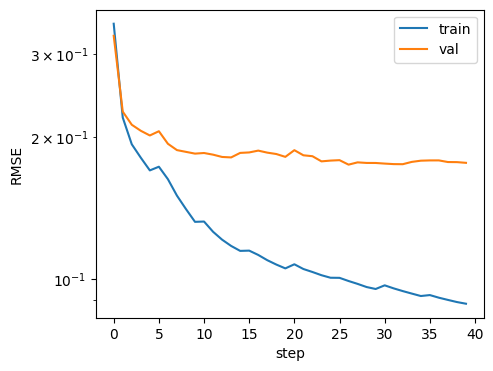

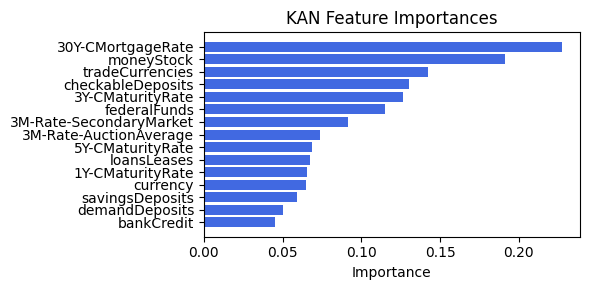

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.79it/s]

[('bankCredit', 0.324654925438344), ('5Y-CMaturityRate', 0.3157324610588451), ('moneyStock', 0.29718992476839395), ('3M-Rate-AuctionAverage', 0.28524018576967397), ('30Y-CMortgageRate', 0.2851838925937911), ('3M-Rate-SecondaryMarket', 0.2749795645902244), ('currency', 0.25770105664795706), ('checkableDeposits', 0.25308080279778333), ('3Y-CMaturityRate', 0.250535299054796), ('federalFunds', 0.2435889075077804), ('1Y-CMaturityRate', 0.23980880461278417), ('tradeCurrencies', 0.22684999076050838), ('Ex1', 0.2012679935009536), ('demandDeposits', 0.19699681750498713), ('savingsDeposits', 0.15367786077910014), ('loansLeases', 0.1419873870119946)]


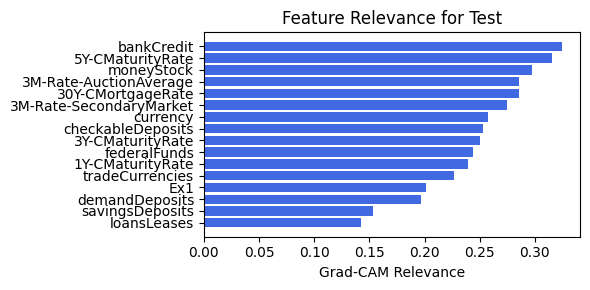

In [103]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.1.6. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.84e-02 | eval_loss: 1.76e-01 | reg: 1.46e+02 |: 100%|█| 40/40 [00:39<00:00,  1.02it/

saving model version 0.1
Best epoch 26
0.23136435449123383
M_KAN Relevance: 0.2399240881204605
CNN Relevance: 0.7600759267807007
[('30Y-CMortgageRate', 0.22754225), ('moneyStock', 0.19141762), ('tradeCurrencies', 0.14261304), ('checkableDeposits', 0.13034013), ('3Y-CMaturityRate', 0.1262064), ('federalFunds', 0.11534712), ('3M-Rate-SecondaryMarket', 0.091877356), ('3M-Rate-AuctionAverage', 0.07359566), ('5Y-CMaturityRate', 0.06874641), ('loansLeases', 0.06743735), ('1Y-CMaturityRate', 0.06530081), ('currency', 0.06490971), ('savingsDeposits', 0.05936776), ('demandDeposits', 0.05025649), ('bankCredit', 0.04490755)]


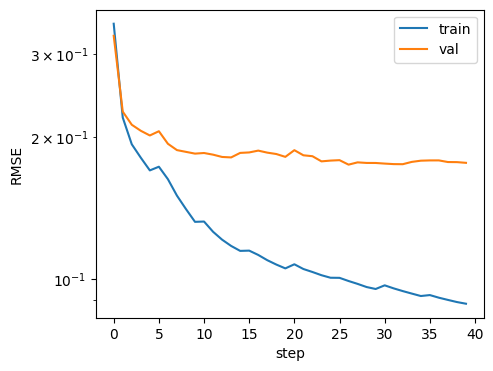

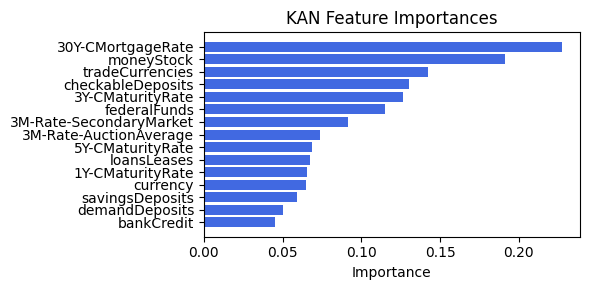

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.94it/s]

[('bankCredit', 0.3246549251545124), ('5Y-CMaturityRate', 0.31573246049118187), ('moneyStock', 0.29718992462647814), ('3M-Rate-AuctionAverage', 0.28524018548584235), ('30Y-CMortgageRate', 0.2851838925937911), ('3M-Rate-SecondaryMarket', 0.2749795645902244), ('currency', 0.25770105636412544), ('checkableDeposits', 0.25308080279778333), ('3Y-CMaturityRate', 0.25053529848713274), ('federalFunds', 0.2435889075077804), ('1Y-CMaturityRate', 0.23980880461278417), ('tradeCurrencies', 0.22684999090242422), ('Ex1', 0.2012679934832141), ('demandDeposits', 0.19699681764690294), ('savingsDeposits', 0.15367786077910014), ('loansLeases', 0.1419873870119946)]


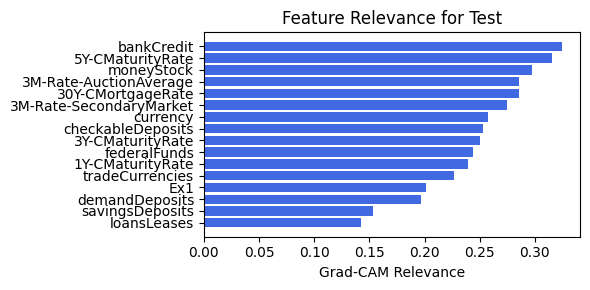

In [104]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.1.7. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.22e-02 | eval_loss: 1.79e-01 | reg: 1.56e+02 |: 100%|█| 40/40 [00:39<00:00,  1.01it/


saving model version 0.1
Best epoch 39
0.2132595330476761
M_KAN Relevance: 0.2200353443622589
CNN Relevance: 0.7799646854400635
[('moneyStock', 0.18662702), ('3Y-CMaturityRate', 0.15352643), ('3M-Rate-SecondaryMarket', 0.13979103), ('30Y-CMortgageRate', 0.13925102), ('loansLeases', 0.13182381), ('federalFunds', 0.11681697), ('5Y-CMaturityRate', 0.10739611), ('1Y-CMaturityRate', 0.08890025), ('demandDeposits', 0.08808618), ('currency', 0.084370635), ('checkableDeposits', 0.071588054), ('savingsDeposits', 0.069838166), ('bankCredit', 0.06226037), ('tradeCurrencies', 0.06147936), ('3M-Rate-AuctionAverage', 0.04734133)]


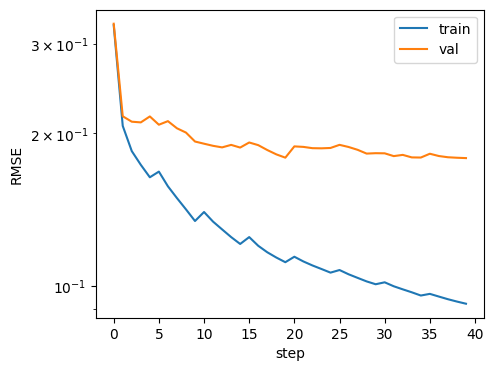

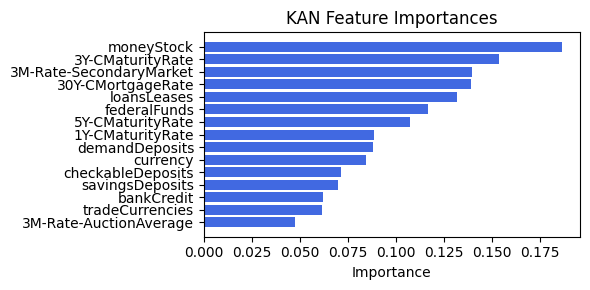

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.13it/s]


[('checkableDeposits', 0.21157692707188072), ('Ex1', 0.19226600771085248), ('tradeCurrencies', 0.1576136608031534), ('3M-Rate-SecondaryMarket', 0.14998137273692658), ('currency', 0.12073401333985939), ('3Y-CMaturityRate', 0.11409465532882937), ('loansLeases', 0.10194990929393541), ('bankCredit', 0.09869197708044555), ('5Y-CMaturityRate', 0.09546183096577547), ('demandDeposits', 0.0940005834796466), ('1Y-CMaturityRate', 0.08757312341726252), ('moneyStock', 0.07762546560594014), ('federalFunds', 0.07551981696770305), ('savingsDeposits', 0.0737661011540608), ('30Y-CMortgageRate', 0.06705906968120308), ('3M-Rate-AuctionAverage', 0.0646546478183674)]


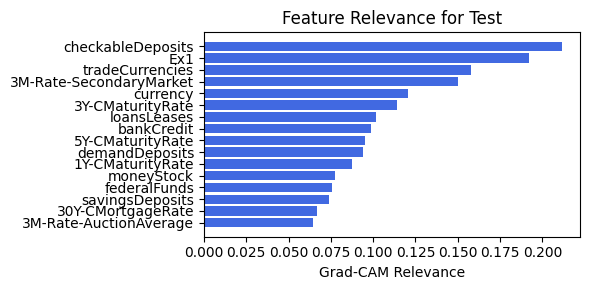

In [105]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.1.8. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.66e-02 | eval_loss: 1.69e-01 | reg: 1.53e+02 |: 100%|█| 40/40 [00:38<00:00,  1.03it/

saving model version 0.1
Best epoch 29
0.22888019680976868
M_KAN Relevance: 0.22991514205932617
CNN Relevance: 0.770084798336029
[('moneyStock', 0.18676037), ('30Y-CMortgageRate', 0.13907588), ('3Y-CMaturityRate', 0.13654566), ('3M-Rate-SecondaryMarket', 0.13493834), ('federalFunds', 0.12222704), ('5Y-CMaturityRate', 0.1183305), ('loansLeases', 0.110239625), ('currency', 0.0907483), ('demandDeposits', 0.08500829), ('1Y-CMaturityRate', 0.08027215), ('savingsDeposits', 0.07958745), ('checkableDeposits', 0.077976234), ('tradeCurrencies', 0.05943113), ('bankCredit', 0.044437476), ('3M-Rate-AuctionAverage', 0.044368267)]


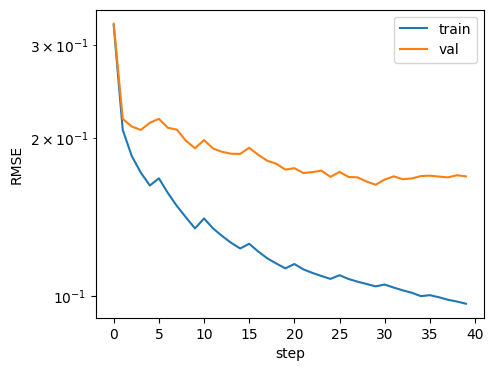

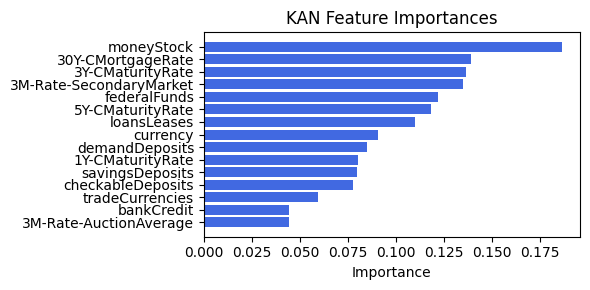

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  8.06it/s]


[('Ex1', 0.16593653863632685), ('1Y-CMaturityRate', 0.13290154656528363), ('3Y-CMaturityRate', 0.1004471615987963), ('currency', 0.09539066630393445), ('demandDeposits', 0.08887898434574405), ('moneyStock', 0.06901830708178576), ('5Y-CMaturityRate', 0.058038136017109665), ('bankCredit', 0.05803372749083099), ('checkableDeposits', 0.05564435957044008), ('loansLeases', 0.05554811884926277), ('3M-Rate-SecondaryMarket', 0.04933476048629797), ('federalFunds', 0.048782395815457374), ('30Y-CMortgageRate', 0.04874010378539208), ('tradeCurrencies', 0.04583013091192004), ('3M-Rate-AuctionAverage', 0.04554691269905085), ('savingsDeposits', 0.028965795697600005)]


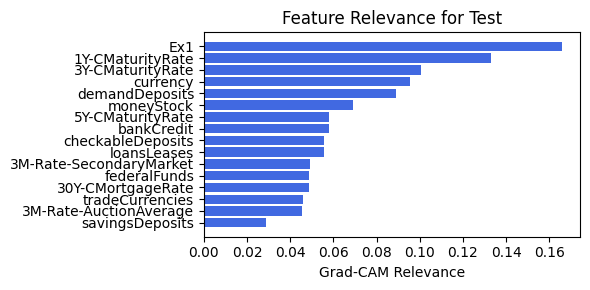

In [106]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.1.9. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.76e-02 | eval_loss: 1.82e-01 | reg: 2.01e+02 |: 100%|█| 40/40 [00:37<00:00,  1.05it/

saving model version 0.1
Best epoch 13
0.2002788484096527
M_KAN Relevance: 0.11876749992370605
CNN Relevance: 0.881232500076294
[('moneyStock', 0.27743632), ('3Y-CMaturityRate', 0.23395376), ('checkableDeposits', 0.22209601), ('currency', 0.21908718), ('3M-Rate-SecondaryMarket', 0.20584308), ('bankCredit', 0.19805011), ('federalFunds', 0.19494134), ('3M-Rate-AuctionAverage', 0.16829026), ('demandDeposits', 0.16067873), ('savingsDeposits', 0.15927733), ('loansLeases', 0.15502077), ('5Y-CMaturityRate', 0.15238708), ('30Y-CMortgageRate', 0.14568304), ('1Y-CMaturityRate', 0.12817453), ('tradeCurrencies', 0.10986765)]


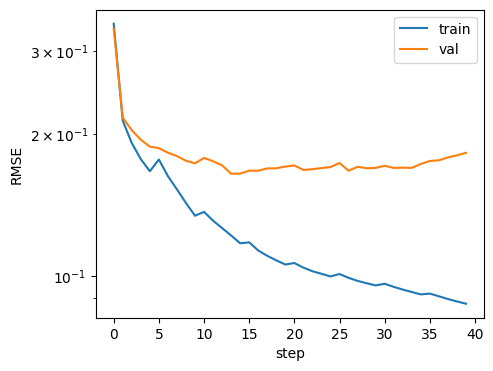

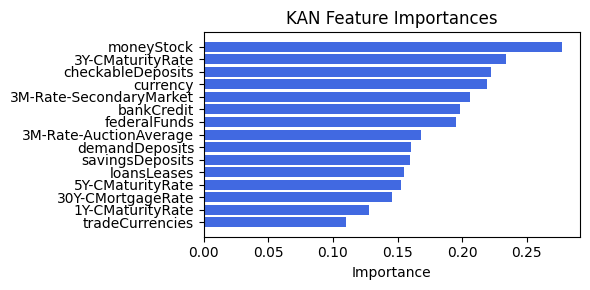

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.86it/s]


[('3M-Rate-SecondaryMarket', 0.32006546928924284), ('checkableDeposits', 0.2966338147102977), ('3M-Rate-AuctionAverage', 0.19044764989632226), ('30Y-CMortgageRate', 0.1861865426186428), ('currency', 0.15355542142365483), ('1Y-CMaturityRate', 0.14681630826754763), ('moneyStock', 0.10065281828865409), ('demandDeposits', 0.07301107932580635), ('federalFunds', 0.06922095274543001), ('loansLeases', 0.06833815947729385), ('tradeCurrencies', 0.06238437489872532), ('3Y-CMaturityRate', 0.060757564488830254), ('savingsDeposits', 0.05940269283945175), ('Ex1', 0.05759939338826198), ('bankCredit', 0.054210750702241926), ('5Y-CMaturityRate', 0.05205069726313619)]


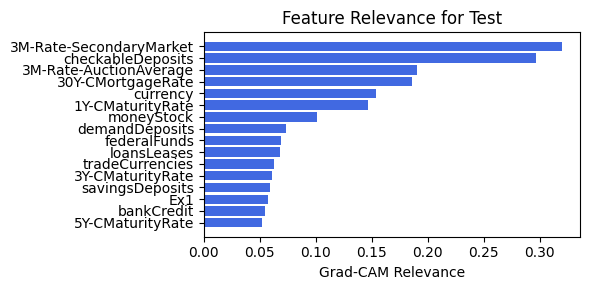

In [153]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.05)

### 2.1.10. width=[15, 6, 1], grid=5, lamb=1e-05 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.84e-02 | eval_loss: 1.91e-01 | reg: 2.04e+02 |: 100%|█| 40/40 [00:40<00:00,  1.00s/i

saving model version 0.1
Best epoch 12
0.21092773973941803
M_KAN Relevance: 0.12284816056489944
CNN Relevance: 0.8771519064903259
[('moneyStock', 0.25967547), ('3Y-CMaturityRate', 0.20823942), ('3M-Rate-SecondaryMarket', 0.20722763), ('currency', 0.20134231), ('checkableDeposits', 0.19841039), ('bankCredit', 0.18978658), ('loansLeases', 0.16462982), ('federalFunds', 0.16221538), ('3M-Rate-AuctionAverage', 0.15907641), ('savingsDeposits', 0.14873129), ('30Y-CMortgageRate', 0.14401981), ('demandDeposits', 0.14275497), ('5Y-CMaturityRate', 0.13857722), ('1Y-CMaturityRate', 0.113843225), ('tradeCurrencies', 0.106928125)]


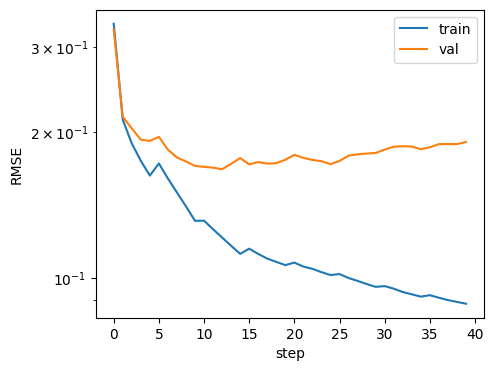

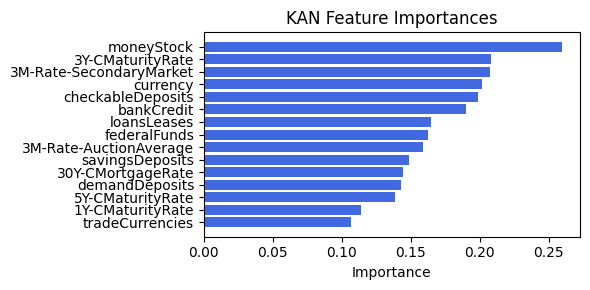

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.08it/s]


[('checkableDeposits', 0.15804516164408552), ('3M-Rate-SecondaryMarket', 0.14950498623906502), ('moneyStock', 0.1214085266127118), ('1Y-CMaturityRate', 0.11026659915888948), ('3M-Rate-AuctionAverage', 0.09483065217999476), ('loansLeases', 0.09419723528027091), ('30Y-CMortgageRate', 0.09121186170460922), ('currency', 0.08461238195866047), ('savingsDeposits', 0.077366770977997), ('Ex1', 0.07071560853981368), ('tradeCurrencies', 0.06965369085193657), ('federalFunds', 0.054379286648154015), ('demandDeposits', 0.05057095123754282), ('3Y-CMaturityRate', 0.023993594042951285), ('bankCredit', 0.01831182789866857), ('5Y-CMaturityRate', 0.017169209753739693)]


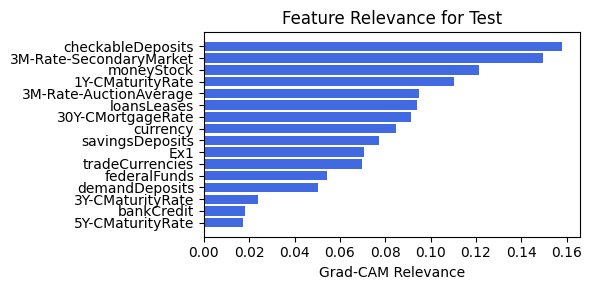

In [154]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.05)

## 2.2 width=[15, 1, 1], grid=5, lamb=1e-05

### 2.2.1. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.14e-01 | eval_loss: 1.96e-01 | reg: 1.29e+02 |: 100%|█| 40/40 [00:40<00:00,  1.02s/i

saving model version 0.1
Best epoch 22
0.2530091404914856
M_KAN Relevance: 0.0029450450092554092
CNN Relevance: 0.997054934501648
[('1Y-CMaturityRate', 0.24253617), ('tradeCurrencies', 0.22446148), ('30Y-CMortgageRate', 0.20912707), ('currency', 0.1761791), ('bankCredit', 0.15874535), ('moneyStock', 0.15517524), ('loansLeases', 0.15392973), ('federalFunds', 0.13932437), ('3Y-CMaturityRate', 0.11933164), ('3M-Rate-AuctionAverage', 0.10909692), ('savingsDeposits', 0.093700625), ('checkableDeposits', 0.07661869), ('3M-Rate-SecondaryMarket', 0.06828217), ('5Y-CMaturityRate', 0.060006652), ('demandDeposits', 0.026109284)]


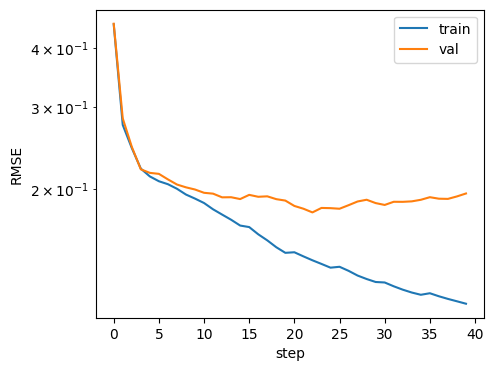

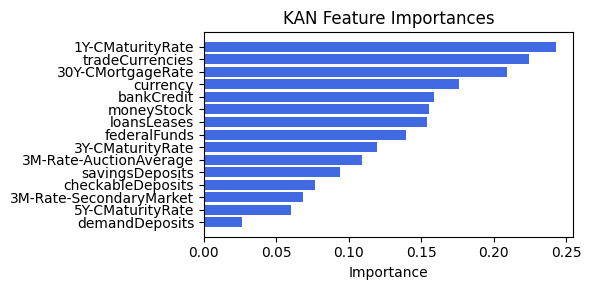

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.13it/s]


[('checkableDeposits', 0.3602627614468691), ('3M-Rate-SecondaryMarket', 0.29490755754412107), ('loansLeases', 0.15174629124729627), ('currency', 0.1297904456756355), ('tradeCurrencies', 0.09322101911585334), ('savingsDeposits', 0.03232797202903644), ('3Y-CMaturityRate', 0.012946924032959422), ('demandDeposits', 0.009385100964711802), ('federalFunds', 0.003123904602779519), ('moneyStock', 0.002582535573414394), ('1Y-CMaturityRate', 0.002083904588861125), ('3M-Rate-AuctionAverage', 0.0007764359315236409), ('Ex1', 0.0007343992657427277), ('30Y-CMortgageRate', 0.0006672433178339685), ('bankCredit', 0.00015977348112279462), ('5Y-CMaturityRate', 0.00015267332782968878)]


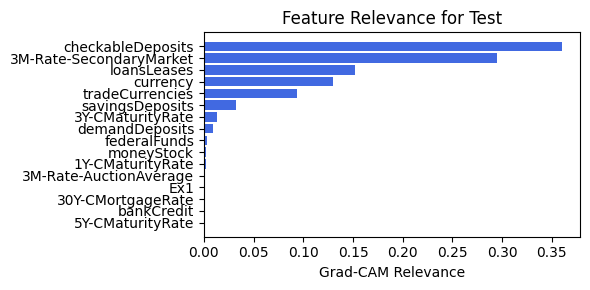

In [107]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.2.2. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.14e-01 | eval_loss: 1.96e-01 | reg: 1.29e+02 |: 100%|█| 40/40 [00:39<00:00,  1.02it/

saving model version 0.1
Best epoch 22
0.2530091404914856
M_KAN Relevance: 0.0029450450092554092
CNN Relevance: 0.997054934501648
[('1Y-CMaturityRate', 0.24253617), ('tradeCurrencies', 0.22446148), ('30Y-CMortgageRate', 0.20912707), ('currency', 0.1761791), ('bankCredit', 0.15874535), ('moneyStock', 0.15517524), ('loansLeases', 0.15392973), ('federalFunds', 0.13932437), ('3Y-CMaturityRate', 0.11933164), ('3M-Rate-AuctionAverage', 0.10909692), ('savingsDeposits', 0.093700625), ('checkableDeposits', 0.07661869), ('3M-Rate-SecondaryMarket', 0.06828217), ('5Y-CMaturityRate', 0.060006652), ('demandDeposits', 0.026109284)]


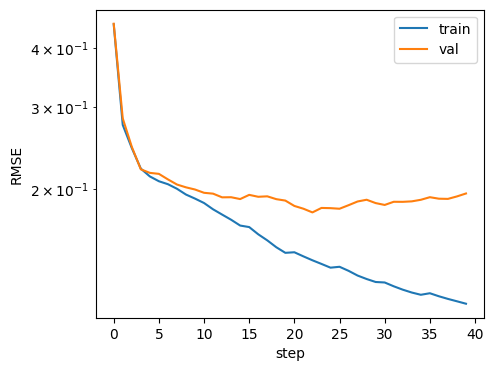

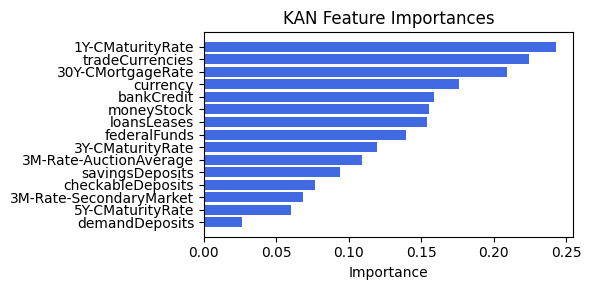

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.48it/s]

[('checkableDeposits', 0.3602627614468691), ('3M-Rate-SecondaryMarket', 0.29490755754412107), ('loansLeases', 0.15174629124729627), ('currency', 0.1297904456756355), ('tradeCurrencies', 0.09322101911585334), ('savingsDeposits', 0.03232797202903644), ('3Y-CMaturityRate', 0.012946924032959422), ('demandDeposits', 0.009385100964711802), ('federalFunds', 0.003123904602779519), ('moneyStock', 0.002582535573414394), ('1Y-CMaturityRate', 0.002083904588861125), ('3M-Rate-AuctionAverage', 0.0007764359315236409), ('Ex1', 0.0007343992657427277), ('30Y-CMortgageRate', 0.0006672433178339685), ('bankCredit', 0.00015977348112279462), ('5Y-CMaturityRate', 0.00015267332782968878)]


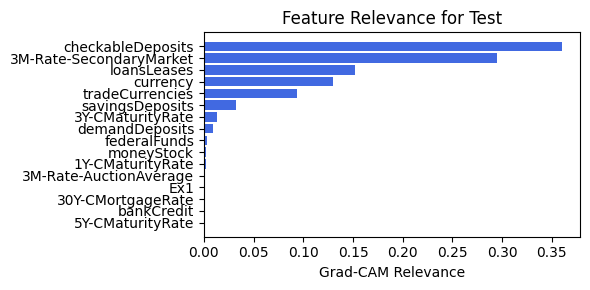

In [108]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.2.3. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.03e-01 | eval_loss: 1.79e-01 | reg: 1.30e+02 |: 100%|█| 40/40 [00:40<00:00,  1.01s/i


saving model version 0.1
Best epoch 34
0.18899737298488617
M_KAN Relevance: 0.016040347516536713
CNN Relevance: 0.9839596152305603
[('30Y-CMortgageRate', 0.6127525), ('federalFunds', 0.5078251), ('3Y-CMaturityRate', 0.3845496), ('5Y-CMaturityRate', 0.33076513), ('moneyStock', 0.2694278), ('bankCredit', 0.2486317), ('3M-Rate-SecondaryMarket', 0.20595473), ('tradeCurrencies', 0.1999444), ('1Y-CMaturityRate', 0.19732581), ('3M-Rate-AuctionAverage', 0.19661817), ('loansLeases', 0.1953848), ('currency', 0.13653895), ('demandDeposits', 0.10724361), ('savingsDeposits', 0.097277075), ('checkableDeposits', 0.053937238)]


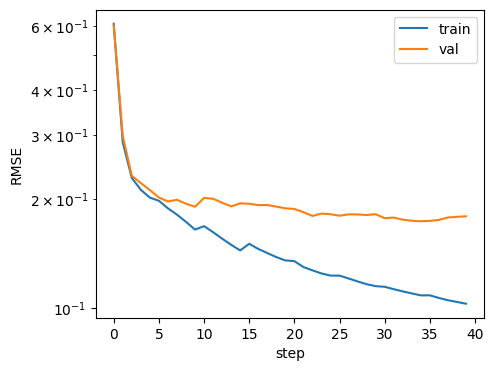

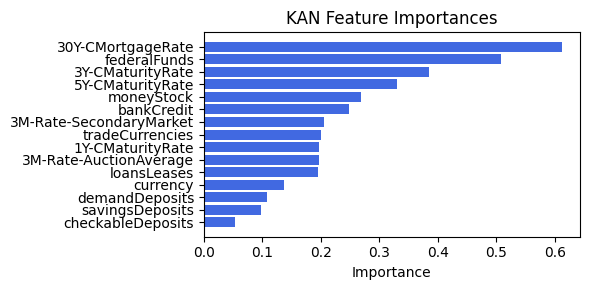

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.14it/s]


[('tradeCurrencies', 0.0965143912227913), ('3Y-CMaturityRate', 0.07627331900266221), ('loansLeases', 0.0686386676774072), ('bankCredit', 0.0503256534625377), ('3M-Rate-SecondaryMarket', 0.049781868407236675), ('5Y-CMaturityRate', 0.04930627457132297), ('demandDeposits', 0.047014626485872124), ('1Y-CMaturityRate', 0.040386416363929), ('30Y-CMortgageRate', 0.03650635669667584), ('3M-Rate-AuctionAverage', 0.03611799141924296), ('checkableDeposits', 0.034083215437740795), ('savingsDeposits', 0.03071659335484063), ('moneyStock', 0.030568395129271914), ('federalFunds', 0.030374079166601103), ('currency', 0.02815626919923705), ('Ex1', 0.006371983141538554)]


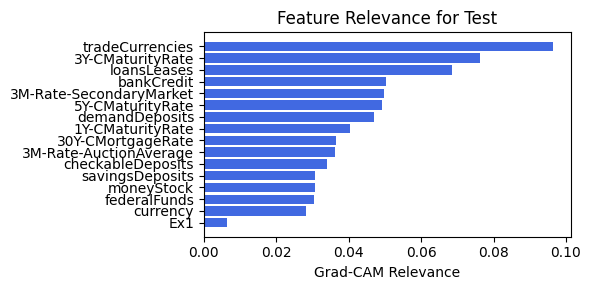

In [109]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.2.4. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.90e-02 | eval_loss: 1.83e-01 | reg: 1.33e+02 |: 100%|█| 40/40 [00:39<00:00,  1.01it/

saving model version 0.1
Best epoch 20
0.19795170426368713
M_KAN Relevance: 0.019141344353556633
CNN Relevance: 0.9808586239814758
[('30Y-CMortgageRate', 0.7982747), ('3Y-CMaturityRate', 0.47007012), ('federalFunds', 0.443266), ('bankCredit', 0.32920057), ('1Y-CMaturityRate', 0.2450753), ('5Y-CMaturityRate', 0.23029187), ('moneyStock', 0.22771837), ('3M-Rate-AuctionAverage', 0.21882316), ('tradeCurrencies', 0.21426758), ('3M-Rate-SecondaryMarket', 0.18293226), ('loansLeases', 0.17190494), ('currency', 0.15861548), ('savingsDeposits', 0.12285066), ('demandDeposits', 0.10580893), ('checkableDeposits', 0.08612026)]


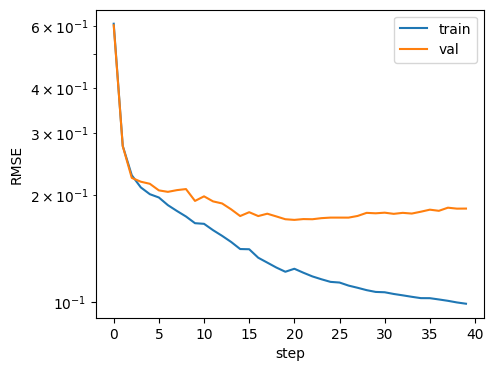

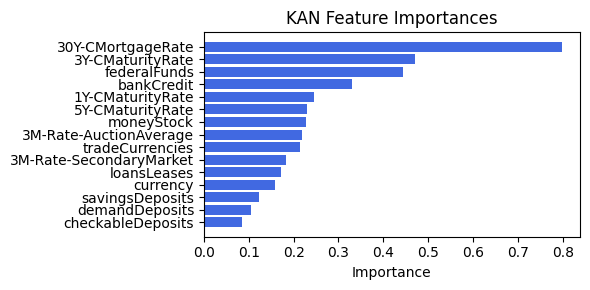

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.52it/s]


[('loansLeases', 0.10512352250405543), ('currency', 0.03336854242675361), ('3M-Rate-SecondaryMarket', 0.03145146025788216), ('savingsDeposits', 0.030684225281999846), ('checkableDeposits', 0.02316265290691739), ('Ex1', 0.02034574727572146), ('tradeCurrencies', 0.013683383827585549), ('moneyStock', 0.010209851915992442), ('demandDeposits', 0.009057677958515429), ('federalFunds', 0.008868980653850096), ('3Y-CMaturityRate', 0.008657743135422823), ('bankCredit', 0.008549828210934286), ('5Y-CMaturityRate', 0.008445017851911308), ('1Y-CMaturityRate', 0.008142217570206238), ('3M-Rate-AuctionAverage', 0.006117889422568537), ('30Y-CMortgageRate', 0.0054294509014913015)]


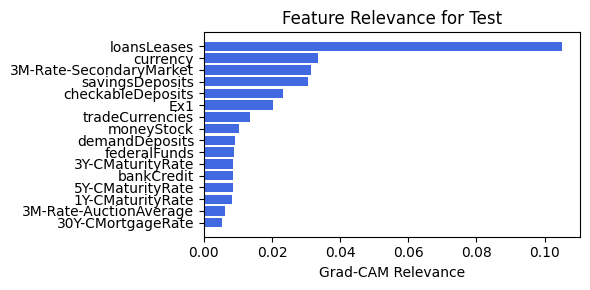

In [110]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.2.5. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.78e-02 | eval_loss: 1.86e-01 | reg: 1.69e+02 |: 100%|█| 40/40 [00:38<00:00,  1.03it/

saving model version 0.1
Best epoch 25
0.23815684020519257
M_KAN Relevance: 0.017060697078704834
CNN Relevance: 0.9829393029212952
[('federalFunds', 0.94711715), ('30Y-CMortgageRate', 0.61467016), ('moneyStock', 0.44651365), ('loansLeases', 0.25320843), ('3M-Rate-SecondaryMarket', 0.2479464), ('bankCredit', 0.23200107), ('tradeCurrencies', 0.1674745), ('3Y-CMaturityRate', 0.12507345), ('currency', 0.11283602), ('5Y-CMaturityRate', 0.09756476), ('savingsDeposits', 0.073411174), ('1Y-CMaturityRate', 0.060510032), ('3M-Rate-AuctionAverage', 0.042915437), ('checkableDeposits', 0.042815816), ('demandDeposits', 0.030927088)]


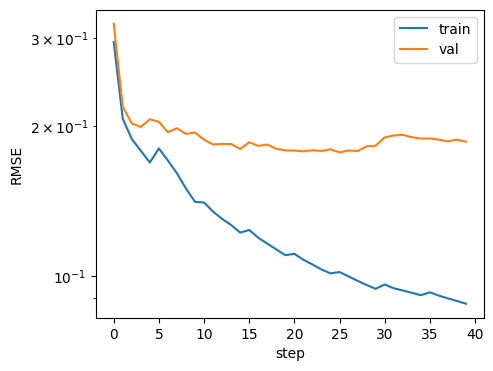

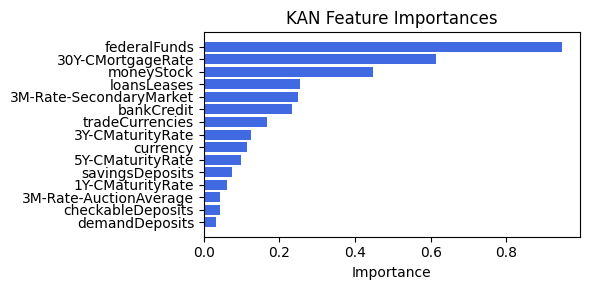

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.01it/s]


[('tradeCurrencies', 0.22596223270243387), ('moneyStock', 0.17865571290423674), ('Ex1', 0.1701104122003363), ('loansLeases', 0.16472551160092866), ('3M-Rate-AuctionAverage', 0.15495134894514367), ('30Y-CMortgageRate', 0.15462926585404646), ('1Y-CMaturityRate', 0.13900873667970742), ('savingsDeposits', 0.13823057816923773), ('federalFunds', 0.12803697654134816), ('currency', 0.1247522290602016), ('3Y-CMaturityRate', 0.12454816633059333), ('checkableDeposits', 0.12024239189146707), ('demandDeposits', 0.11251910887589302), ('3M-Rate-SecondaryMarket', 0.11236540508467616), ('5Y-CMaturityRate', 0.09889747934038973), ('bankCredit', 0.09731836524415052)]


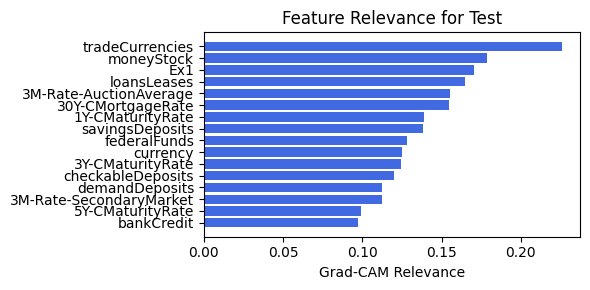

In [111]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.2.6. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.84e-02 | eval_loss: 1.92e-01 | reg: 1.87e+02 |: 100%|█| 40/40 [00:39<00:00,  1.02it/

saving model version 0.1
Best epoch 19
0.264757364988327
M_KAN Relevance: 0.023876266553997993
CNN Relevance: 0.9761236906051636
[('federalFunds', 0.7133179), ('30Y-CMortgageRate', 0.4964966), ('moneyStock', 0.35112783), ('loansLeases', 0.24292782), ('3M-Rate-SecondaryMarket', 0.20254393), ('bankCredit', 0.17320123), ('3Y-CMaturityRate', 0.13840654), ('tradeCurrencies', 0.11143597), ('currency', 0.09664686), ('checkableDeposits', 0.08026428), ('savingsDeposits', 0.078706786), ('3M-Rate-AuctionAverage', 0.05646565), ('1Y-CMaturityRate', 0.054863434), ('5Y-CMaturityRate', 0.040632427), ('demandDeposits', 0.03776099)]


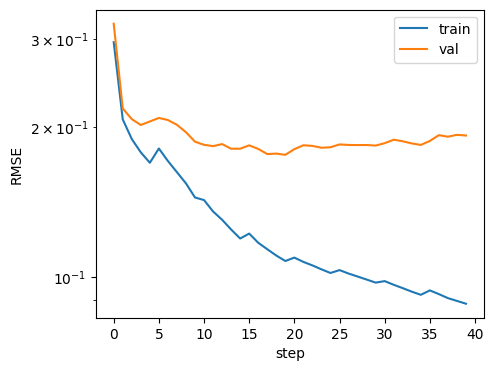

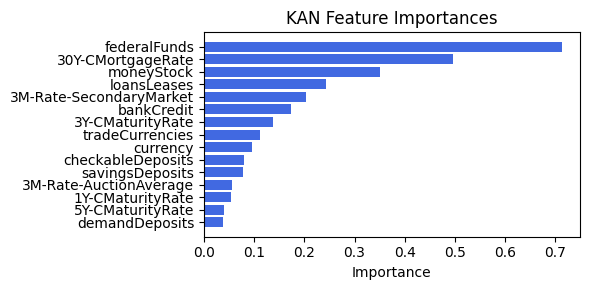

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.23it/s]


[('tradeCurrencies', 0.2939727820533638), ('loansLeases', 0.21232578667279864), ('Ex1', 0.19579131624278878), ('savingsDeposits', 0.1701046782415471), ('3Y-CMaturityRate', 0.1141040563261846), ('demandDeposits', 0.10651147677341387), ('federalFunds', 0.10048585720803765), ('5Y-CMaturityRate', 0.08327698931652343), ('moneyStock', 0.08173760111066734), ('bankCredit', 0.07902930608640114), ('checkableDeposits', 0.07353117624907532), ('3M-Rate-SecondaryMarket', 0.047201104117890025), ('1Y-CMaturityRate', 0.041832472579110234), ('currency', 0.03941431879176802), ('3M-Rate-AuctionAverage', 0.02930572541275372), ('30Y-CMortgageRate', 0.02824044180978533)]


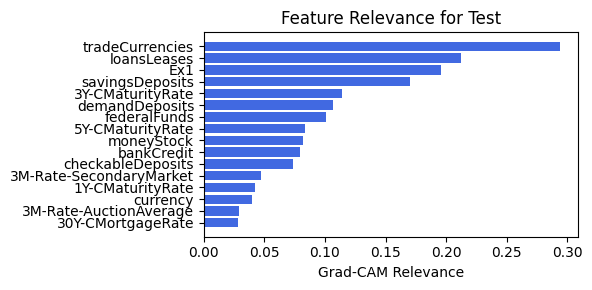

In [112]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.2.5.1 width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.95e-02 | eval_loss: 1.96e-01 | reg: 1.72e+02 |: 100%|█| 40/40 [00:39<00:00,  1.02it/

saving model version 0.1
Best epoch 14
0.28096115589141846
M_KAN Relevance: 0.026539012789726257
CNN Relevance: 0.9734609723091125
[('federalFunds', 0.5701787), ('30Y-CMortgageRate', 0.49099508), ('moneyStock', 0.33667573), ('loansLeases', 0.19810273), ('3M-Rate-SecondaryMarket', 0.14681838), ('bankCredit', 0.1321578), ('3Y-CMaturityRate', 0.11471339), ('1Y-CMaturityRate', 0.11299327), ('tradeCurrencies', 0.109371126), ('currency', 0.086110234), ('3M-Rate-AuctionAverage', 0.07981118), ('savingsDeposits', 0.05738358), ('checkableDeposits', 0.05058448), ('demandDeposits', 0.034234725), ('5Y-CMaturityRate', 0.02940262)]


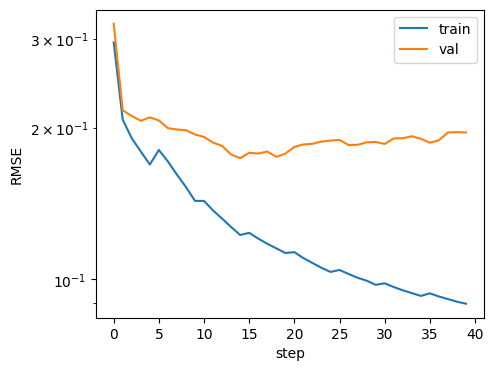

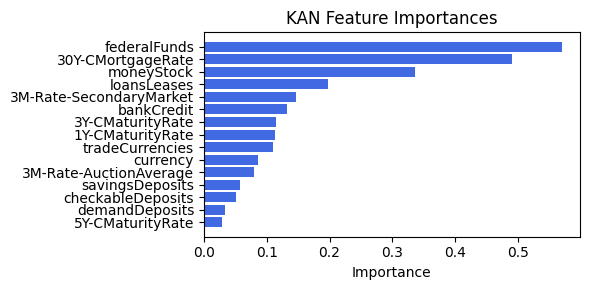

Computing Grad-CAM: 100%|██████████| 210/210 [00:18<00:00, 11.23it/s]

[('tradeCurrencies', 0.18208386049761127), ('Ex1', 0.16548449760441492), ('loansLeases', 0.12919000280678683), ('1Y-CMaturityRate', 0.09569291472033087), ('3Y-CMaturityRate', 0.08250825253780932), ('savingsDeposits', 0.0776924569805574), ('demandDeposits', 0.057109850804304835), ('federalFunds', 0.049095108594130056), ('5Y-CMaturityRate', 0.04844855151826605), ('bankCredit', 0.04427465333581148), ('moneyStock', 0.04332017754869802), ('currency', 0.034918269779466625), ('checkableDeposits', 0.033009125127379475), ('30Y-CMortgageRate', 0.03169781076721847), ('3M-Rate-AuctionAverage', 0.031575925781258514), ('3M-Rate-SecondaryMarket', 0.026552109639271206)]


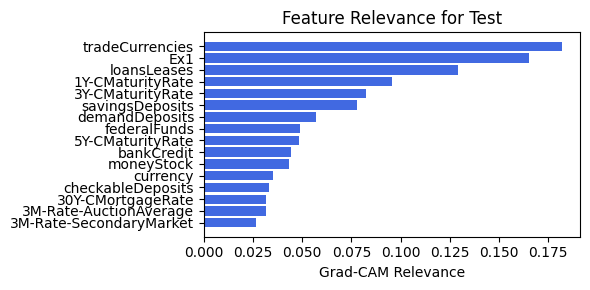

In [113]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.2.7. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.18e-02 | eval_loss: 1.85e-01 | reg: 2.19e+02 |: 100%|█| 40/40 [00:39<00:00,  1.00it/

saving model version 0.1
Best epoch 18
0.22132150828838348
M_KAN Relevance: 0.00014880488743074238
CNN Relevance: 0.9998511672019958
[('checkableDeposits', 0.18880174), ('5Y-CMaturityRate', 0.16926374), ('3M-Rate-AuctionAverage', 0.15398988), ('federalFunds', 0.124283016), ('30Y-CMortgageRate', 0.08505353), ('3Y-CMaturityRate', 0.07696504), ('3M-Rate-SecondaryMarket', 0.065098286), ('moneyStock', 0.05823048), ('demandDeposits', 0.047786362), ('loansLeases', 0.033792377), ('bankCredit', 0.01738186), ('savingsDeposits', 0.017122038), ('tradeCurrencies', 0.01278935), ('1Y-CMaturityRate', 0.0075379284), ('currency', 0.0070993304)]


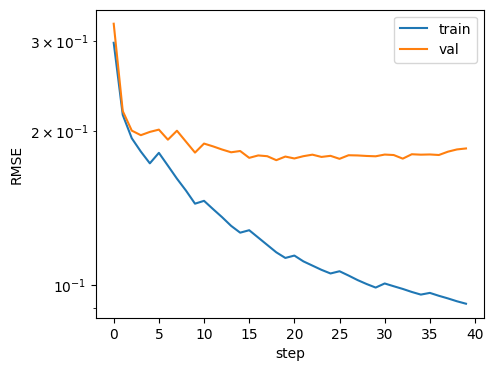

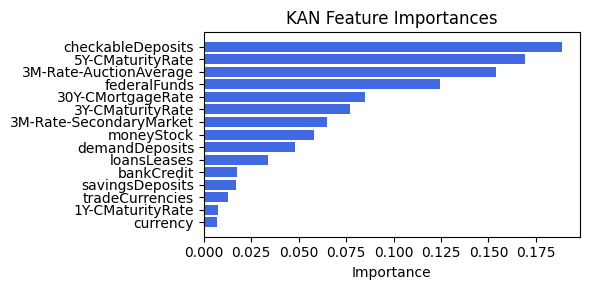

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 12.14it/s]

[('tradeCurrencies', 0.19566587871384053), ('loansLeases', 0.13597287695100974), ('3Y-CMaturityRate', 0.081425394412751), ('savingsDeposits', 0.07781133185185138), ('5Y-CMaturityRate', 0.056044498435152315), ('demandDeposits', 0.055833069128649576), ('bankCredit', 0.05404410161787555), ('Ex1', 0.04162073384061278), ('1Y-CMaturityRate', 0.040745084856947264), ('federalFunds', 0.028148990458742317), ('moneyStock', 0.02123859643359624), ('30Y-CMortgageRate', 0.015921107146866797), ('3M-Rate-AuctionAverage', 0.014168778971014987), ('currency', 0.010713898492672127), ('3M-Rate-SecondaryMarket', 0.006027416178646187), ('checkableDeposits', 0.0020480954427122403)]


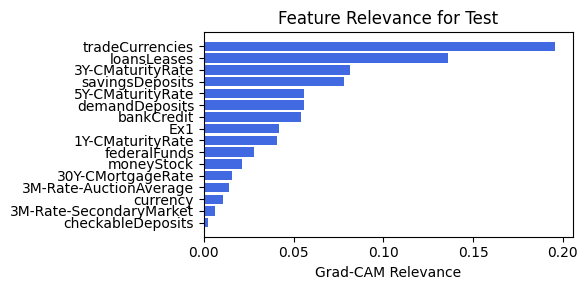

In [115]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.2.7. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.18e-02 | eval_loss: 1.85e-01 | reg: 2.19e+02 |: 100%|█| 40/40 [00:40<00:00,  1.01s/i

saving model version 0.1
Best epoch 18
0.22132150828838348
M_KAN Relevance: 0.00014880488743074238
CNN Relevance: 0.9998511672019958
[('checkableDeposits', 0.18880174), ('5Y-CMaturityRate', 0.16926374), ('3M-Rate-AuctionAverage', 0.15398988), ('federalFunds', 0.124283016), ('30Y-CMortgageRate', 0.08505353), ('3Y-CMaturityRate', 0.07696504), ('3M-Rate-SecondaryMarket', 0.065098286), ('moneyStock', 0.05823048), ('demandDeposits', 0.047786362), ('loansLeases', 0.033792377), ('bankCredit', 0.01738186), ('savingsDeposits', 0.017122038), ('tradeCurrencies', 0.01278935), ('1Y-CMaturityRate', 0.0075379284), ('currency', 0.0070993304)]


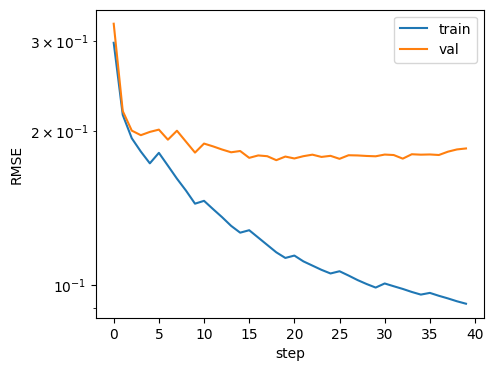

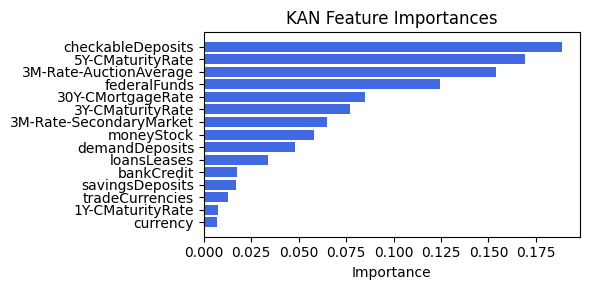

Computing Grad-CAM: 100%|██████████| 210/210 [00:17<00:00, 11.91it/s]

[('tradeCurrencies', 0.19566587871384053), ('loansLeases', 0.13597287695100974), ('3Y-CMaturityRate', 0.081425394412751), ('savingsDeposits', 0.07781133185185138), ('5Y-CMaturityRate', 0.056044498435152315), ('demandDeposits', 0.055833069128649576), ('bankCredit', 0.05404410161787555), ('Ex1', 0.04162073384061278), ('1Y-CMaturityRate', 0.040745084856947264), ('federalFunds', 0.028148990458742317), ('moneyStock', 0.02123859643359624), ('30Y-CMortgageRate', 0.015921107146866797), ('3M-Rate-AuctionAverage', 0.014168778971014987), ('currency', 0.010713898492672127), ('3M-Rate-SecondaryMarket', 0.006027416178646187), ('checkableDeposits', 0.0020480954427122403)]


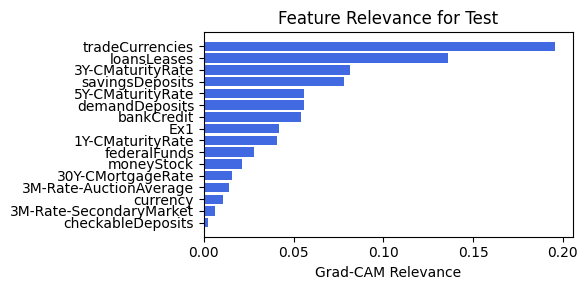

In [116]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.2.9. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.07e-01 | eval_loss: 1.81e-01 | reg: 2.80e+02 |: 100%|█| 40/40 [00:39<00:00,  1.02it/

saving model version 0.1
Best epoch 14
0.23399929702281952
M_KAN Relevance: 0.0011492777848616242
CNN Relevance: 0.9988507032394409
[('loansLeases', 0.451059), ('5Y-CMaturityRate', 0.41700202), ('currency', 0.4164713), ('3M-Rate-AuctionAverage', 0.3525341), ('tradeCurrencies', 0.31888735), ('savingsDeposits', 0.28940058), ('bankCredit', 0.16950749), ('demandDeposits', 0.14331767), ('1Y-CMaturityRate', 0.096804276), ('30Y-CMortgageRate', 0.08018249), ('3Y-CMaturityRate', 0.055676218), ('checkableDeposits', 0.03513523), ('federalFunds', 0.027444553), ('3M-Rate-SecondaryMarket', 0.016146302), ('moneyStock', 0.013117741)]


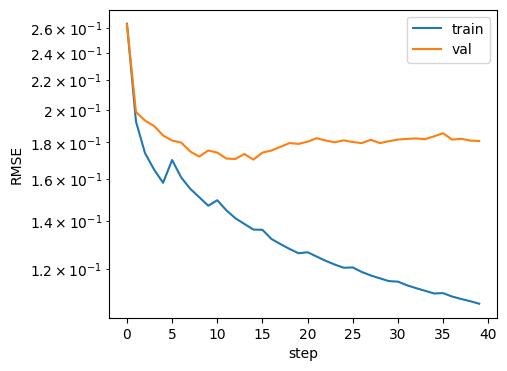

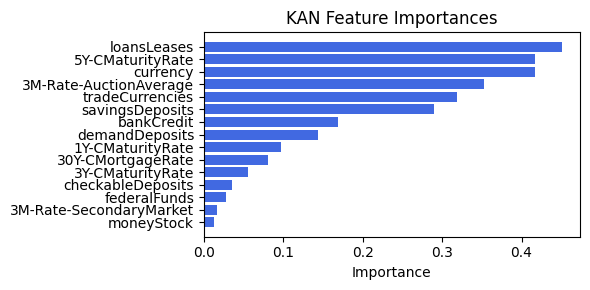

Computing Grad-CAM: 100%|██████████| 210/210 [00:16<00:00, 12.65it/s]


[('loansLeases', 0.13736501912408997), ('3Y-CMaturityRate', 0.0564174374432436), ('savingsDeposits', 0.055559517616239604), ('1Y-CMaturityRate', 0.05112888681746665), ('tradeCurrencies', 0.04965672232654123), ('demandDeposits', 0.03939551892912104), ('3M-Rate-SecondaryMarket', 0.01924592385614579), ('checkableDeposits', 0.01756088382431439), ('currency', 0.014792491805495783), ('Ex1', 0.014196752186953312), ('moneyStock', 0.005879326306638263), ('5Y-CMaturityRate', 0.003140504587264288), ('federalFunds', 0.002302905380964235), ('30Y-CMortgageRate', 0.002279622768539758), ('3M-Rate-AuctionAverage', 0.001885859705674063), ('bankCredit', 0.0015904688054607027)]


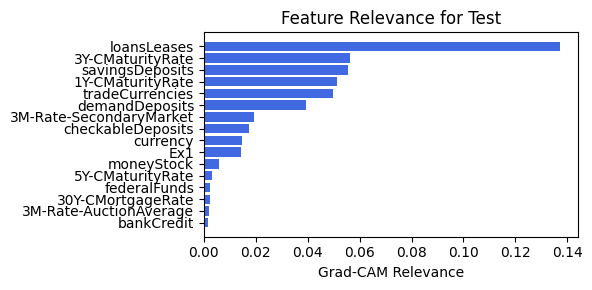

In [155]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.01)

### 2.2.10. width=[15, 1, 1], grid=5, lamb=1e-05 | alpha=0.01

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 1.13e-01 | eval_loss: 1.93e-01 | reg: 2.64e+02 |: 100%|█| 40/40 [00:41<00:00,  1.03s/i

saving model version 0.1
Best epoch 11
0.2526264488697052
M_KAN Relevance: 0.0012361126719042659
CNN Relevance: 0.998763918876648
[('loansLeases', 0.45067453), ('5Y-CMaturityRate', 0.416165), ('currency', 0.41586637), ('3M-Rate-AuctionAverage', 0.35192588), ('tradeCurrencies', 0.3186565), ('savingsDeposits', 0.28932047), ('bankCredit', 0.16778393), ('demandDeposits', 0.1438038), ('1Y-CMaturityRate', 0.09703732), ('30Y-CMortgageRate', 0.08038493), ('3Y-CMaturityRate', 0.056518823), ('checkableDeposits', 0.03486861), ('federalFunds', 0.029297076), ('3M-Rate-SecondaryMarket', 0.016966576), ('moneyStock', 0.013328229)]


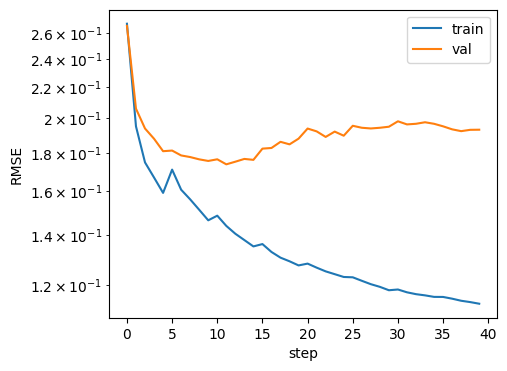

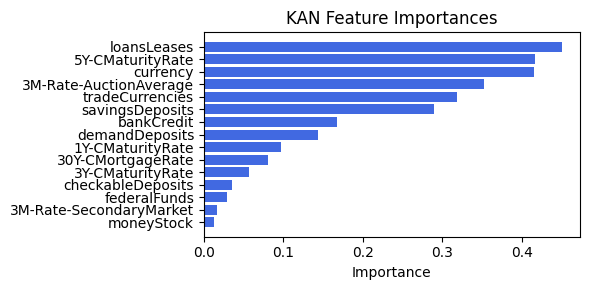

Computing Grad-CAM: 100%|██████████| 210/210 [00:15<00:00, 13.30it/s]


[('1Y-CMaturityRate', 0.10906908493710771), ('loansLeases', 0.08814486382152176), ('tradeCurrencies', 0.04013962435225646), ('savingsDeposits', 0.03309265720946271), ('3M-Rate-SecondaryMarket', 0.03165794926296387), ('30Y-CMortgageRate', 0.031574896527897744), ('3M-Rate-AuctionAverage', 0.029771517979956807), ('checkableDeposits', 0.018077833573555663), ('3Y-CMaturityRate', 0.015283327855147598), ('demandDeposits', 0.014973963251828709), ('Ex1', 0.011312704747320995), ('moneyStock', 0.009829994637415698), ('currency', 0.009232052965533165), ('federalFunds', 0.000583302779566674), ('5Y-CMaturityRate', 0.000141175106788675), ('bankCredit', 2.202006899529979e-06)]


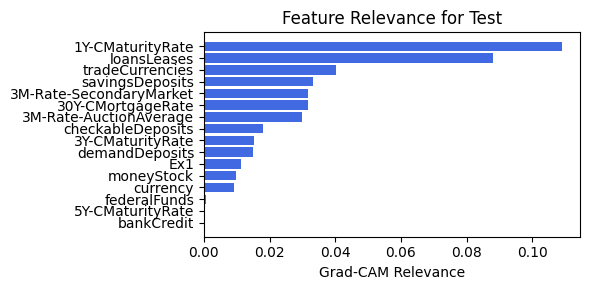

In [156]:
train_and_plot_relevance(Model3_2, kan_neurons=1, kan_grid=5, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.01)

## 2.3 width=[15, 6, 1], grid=7, lamb=1e-05

### 2.3.1. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 9.02e-02 | eval_loss: 1.82e-01 | reg: 1.13e+02 |: 100%|█| 40/40 [00:45<00:00,  1.13s/i

saving model version 0.1
Best epoch 39
0.217263326048851
M_KAN Relevance: 0.08358532190322876
CNN Relevance: 0.9164146780967712
[('federalFunds', 0.61796296), ('30Y-CMortgageRate', 0.3880013), ('tradeCurrencies', 0.37258098), ('3M-Rate-AuctionAverage', 0.37143755), ('checkableDeposits', 0.33642778), ('moneyStock', 0.3278408), ('3M-Rate-SecondaryMarket', 0.27754313), ('1Y-CMaturityRate', 0.25011998), ('currency', 0.24059032), ('bankCredit', 0.23435389), ('5Y-CMaturityRate', 0.22044563), ('loansLeases', 0.19332187), ('demandDeposits', 0.17931591), ('3Y-CMaturityRate', 0.17292571), ('savingsDeposits', 0.15329629)]


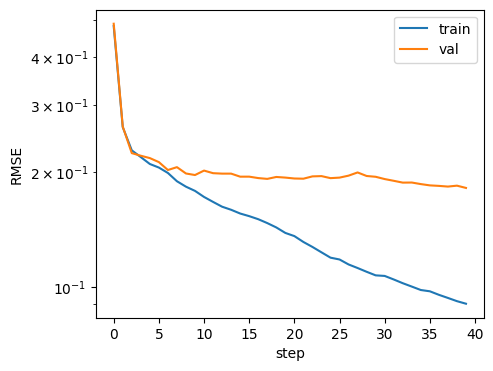

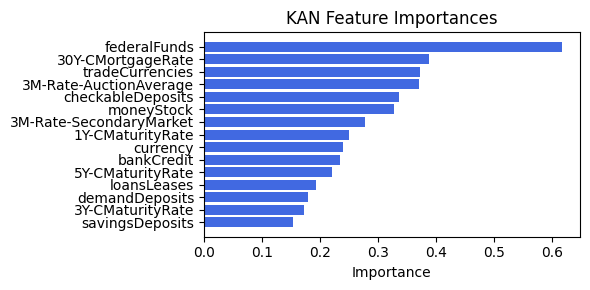

Computing Grad-CAM: 100%|██████████| 210/210 [00:27<00:00,  7.70it/s]


[('3M-Rate-SecondaryMarket', 0.14929624857114895), ('loansLeases', 0.09623773145708367), ('30Y-CMortgageRate', 0.08240020485592096), ('3M-Rate-AuctionAverage', 0.08039551492603052), ('checkableDeposits', 0.07422638798043842), ('tradeCurrencies', 0.06846528062707789), ('1Y-CMaturityRate', 0.06231938173018751), ('savingsDeposits', 0.06195128109871543), ('bankCredit', 0.05700456571011316), ('5Y-CMaturityRate', 0.05663955541815431), ('3Y-CMaturityRate', 0.0506308208663194), ('currency', 0.03995723537657232), ('demandDeposits', 0.03648969781185899), ('federalFunds', 0.03063901196721764), ('moneyStock', 0.02442874745909302), ('Ex1', 0.020796460576535277)]


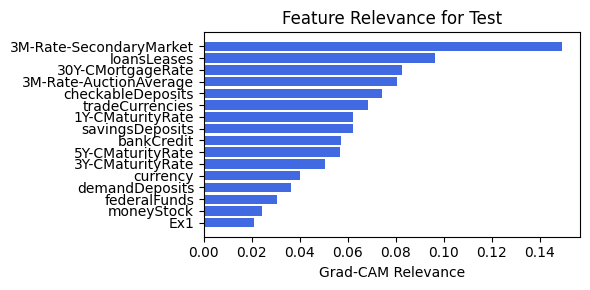

In [125]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.3.2. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.25e-02 | eval_loss: 1.97e-01 | reg: 1.17e+02 |: 100%|█| 40/40 [00:46<00:00,  1.17s/i

saving model version 0.1
Best epoch 26
0.24848739802837372
M_KAN Relevance: 0.080501027405262
CNN Relevance: 0.9194989800453186
[('federalFunds', 0.5123358), ('3M-Rate-AuctionAverage', 0.40994763), ('currency', 0.35669613), ('checkableDeposits', 0.33717573), ('tradeCurrencies', 0.33422202), ('30Y-CMortgageRate', 0.321271), ('moneyStock', 0.29531595), ('savingsDeposits', 0.24778357), ('1Y-CMaturityRate', 0.24678278), ('bankCredit', 0.21555702), ('3M-Rate-SecondaryMarket', 0.21341054), ('5Y-CMaturityRate', 0.20545487), ('loansLeases', 0.19728556), ('demandDeposits', 0.14438982), ('3Y-CMaturityRate', 0.14383021)]


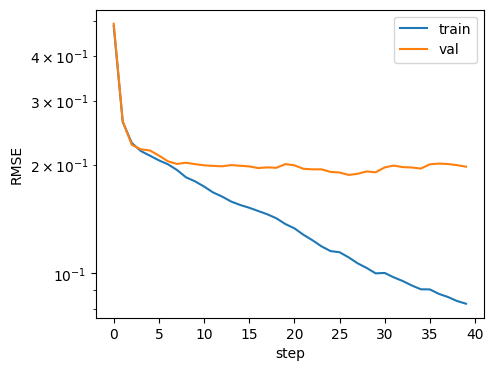

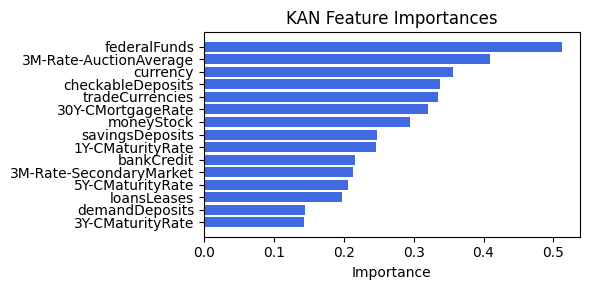

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.90it/s]


[('3M-Rate-SecondaryMarket', 0.2745637533565362), ('checkableDeposits', 0.16974036724173597), ('loansLeases', 0.11665237544323082), ('currency', 0.07306437083032159), ('3M-Rate-AuctionAverage', 0.06025541027386983), ('30Y-CMortgageRate', 0.060110839651454064), ('savingsDeposits', 0.054556202182235815), ('1Y-CMaturityRate', 0.054402863208781044), ('tradeCurrencies', 0.04845643794341456), ('demandDeposits', 0.04590316893764317), ('moneyStock', 0.03543589318703328), ('federalFunds', 0.0345891997633901), ('bankCredit', 0.03199441358003588), ('3Y-CMaturityRate', 0.029871810782545558), ('5Y-CMaturityRate', 0.029675793106712048), ('Ex1', 0.014334293674411518)]


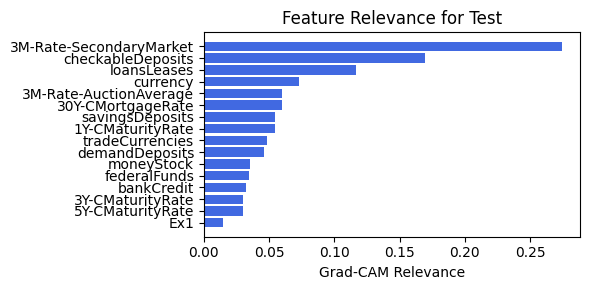

In [126]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.75)

### 2.3.3. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 7.39e-02 | eval_loss: 1.99e-01 | reg: 1.19e+02 |: 100%|█| 40/40 [00:45<00:00,  1.15s/i

saving model version 0.1
Best epoch 12
0.21724192798137665
M_KAN Relevance: 0.17264465987682343
CNN Relevance: 0.8273553252220154
[('tradeCurrencies', 0.36675557), ('30Y-CMortgageRate', 0.30964285), ('federalFunds', 0.28403506), ('moneyStock', 0.28337377), ('3Y-CMaturityRate', 0.27230832), ('3M-Rate-AuctionAverage', 0.26986992), ('checkableDeposits', 0.23768637), ('bankCredit', 0.23517403), ('3M-Rate-SecondaryMarket', 0.22886543), ('currency', 0.20728485), ('5Y-CMaturityRate', 0.19827126), ('savingsDeposits', 0.17482877), ('1Y-CMaturityRate', 0.16560365), ('loansLeases', 0.15987487), ('demandDeposits', 0.1448839)]


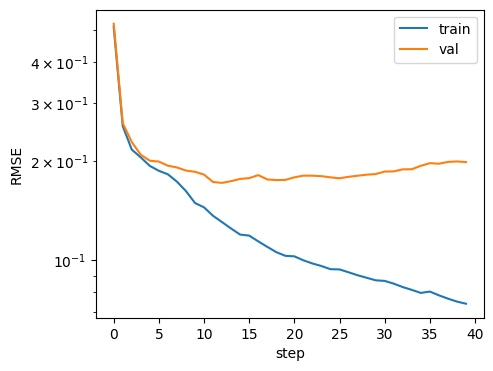

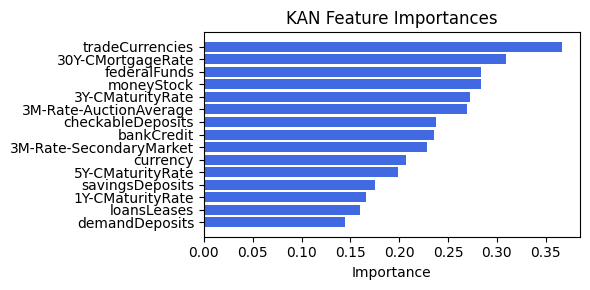

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.26it/s]

[('loansLeases', 0.27849858459750454), ('tradeCurrencies', 0.14260668778969418), ('3Y-CMaturityRate', 0.09686071790000868), ('savingsDeposits', 0.09552153609970229), ('bankCredit', 0.07125006752266061), ('5Y-CMaturityRate', 0.0686794260549851), ('demandDeposits', 0.06269922108525255), ('3M-Rate-SecondaryMarket', 0.05167455139869292), ('federalFunds', 0.047380089494843215), ('checkableDeposits', 0.03881269400784125), ('currency', 0.038797235633024854), ('moneyStock', 0.03742027643990393), ('3M-Rate-AuctionAverage', 0.03180028929907296), ('30Y-CMortgageRate', 0.0314446307394454), ('1Y-CMaturityRate', 0.029072217467667846), ('Ex1', 0.020306036491404354)]


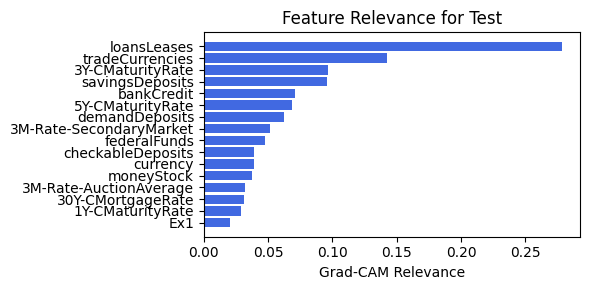

In [127]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.3.4. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 7.68e-02 | eval_loss: 2.52e-01 | reg: 1.08e+02 |: 100%|█| 40/40 [00:45<00:00,  1.13s/i

saving model version 0.1
Best epoch 14
0.2391827404499054
M_KAN Relevance: 0.14682239294052124
CNN Relevance: 0.8531776070594788
[('federalFunds', 0.38270006), ('30Y-CMortgageRate', 0.3465414), ('3M-Rate-AuctionAverage', 0.33283296), ('tradeCurrencies', 0.31839064), ('moneyStock', 0.3115391), ('checkableDeposits', 0.29676706), ('bankCredit', 0.2888326), ('3M-Rate-SecondaryMarket', 0.2739485), ('1Y-CMaturityRate', 0.2282305), ('3Y-CMaturityRate', 0.21860588), ('5Y-CMaturityRate', 0.20202929), ('currency', 0.19235371), ('loansLeases', 0.17254977), ('savingsDeposits', 0.14125775), ('demandDeposits', 0.13854821)]


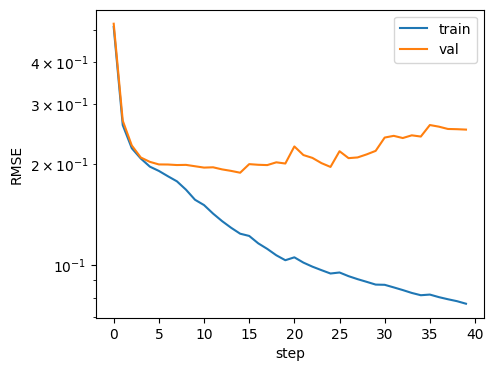

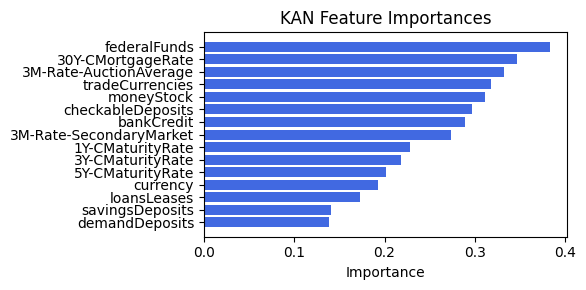

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.93it/s]

[('loansLeases', 0.20848217288869256), ('tradeCurrencies', 0.10735233555370498), ('3Y-CMaturityRate', 0.0812644057774118), ('savingsDeposits', 0.07458256004112107), ('bankCredit', 0.05511645651644184), ('5Y-CMaturityRate', 0.05508544559072886), ('moneyStock', 0.05338504642602943), ('1Y-CMaturityRate', 0.053118812142028696), ('3M-Rate-SecondaryMarket', 0.04831678343360268), ('checkableDeposits', 0.04204514289019807), ('demandDeposits', 0.0386136158524702), ('3M-Rate-AuctionAverage', 0.034100250857660455), ('30Y-CMortgageRate', 0.03372451434233448), ('federalFunds', 0.03222334146211367), ('Ex1', 0.03102768315473527), ('currency', 0.015029091125636893)]


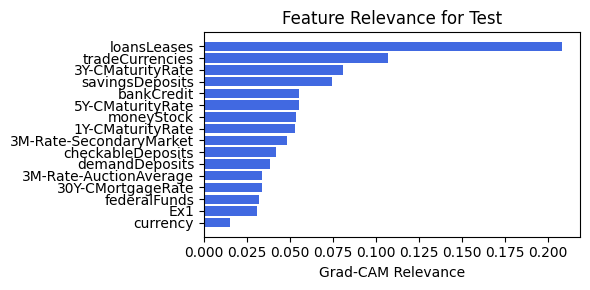

In [128]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.5)

### 2.3.5. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.04e-02 | eval_loss: 1.86e-01 | reg: 1.06e+02 |: 100%|█| 40/40 [00:44<00:00,  1.12s/i

saving model version 0.1
Best epoch 21
0.25663113594055176
M_KAN Relevance: 0.2496829628944397
CNN Relevance: 0.7503170967102051
[('moneyStock', 0.24963945), ('30Y-CMortgageRate', 0.21160197), ('3M-Rate-AuctionAverage', 0.156335), ('federalFunds', 0.14996101), ('3M-Rate-SecondaryMarket', 0.1439796), ('3Y-CMaturityRate', 0.1395966), ('tradeCurrencies', 0.13346829), ('checkableDeposits', 0.12826692), ('bankCredit', 0.113376066), ('currency', 0.10999158), ('loansLeases', 0.10524856), ('1Y-CMaturityRate', 0.10026766), ('5Y-CMaturityRate', 0.09645532), ('demandDeposits', 0.06527523), ('savingsDeposits', 0.049273938)]


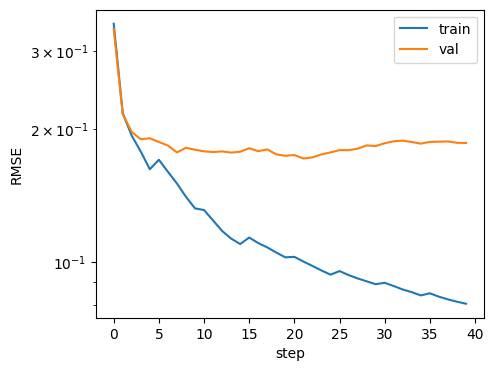

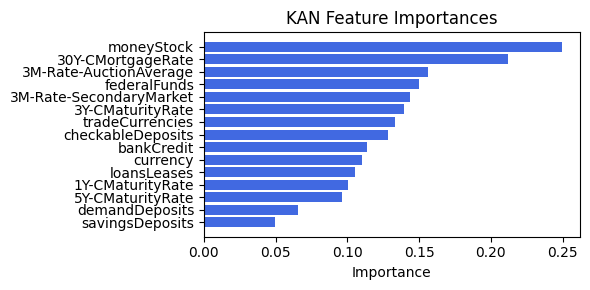

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.53it/s]


[('tradeCurrencies', 0.34491023704232204), ('bankCredit', 0.2689634454347903), ('5Y-CMaturityRate', 0.2667828083747909), ('3Y-CMaturityRate', 0.24532297736011624), ('loansLeases', 0.224052796005604), ('moneyStock', 0.20170843531488486), ('1Y-CMaturityRate', 0.18586999753357045), ('30Y-CMortgageRate', 0.1777591436258739), ('savingsDeposits', 0.17728082928917416), ('3M-Rate-AuctionAverage', 0.17723395022607985), ('federalFunds', 0.16867355736903847), ('demandDeposits', 0.13366693366087495), ('Ex1', 0.07268507405838352), ('currency', 0.07130144061513766), ('checkableDeposits', 0.0661601920992585), ('3M-Rate-SecondaryMarket', 0.050888481652130696)]


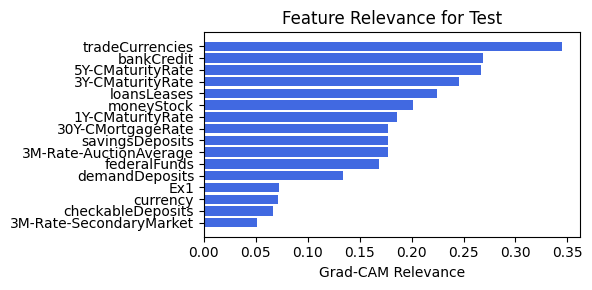

In [129]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.3.6. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 7.72e-02 | eval_loss: 1.64e-01 | reg: 1.05e+02 |: 100%|█| 40/40 [00:46<00:00,  1.17s/i

saving model version 0.1
Best epoch 39
0.2108450084924698
M_KAN Relevance: 0.30973929166793823
CNN Relevance: 0.6902607083320618
[('moneyStock', 0.23256293), ('30Y-CMortgageRate', 0.200349), ('3M-Rate-SecondaryMarket', 0.14870006), ('federalFunds', 0.14059241), ('3M-Rate-AuctionAverage', 0.13612768), ('3Y-CMaturityRate', 0.13272655), ('checkableDeposits', 0.12642986), ('loansLeases', 0.118015155), ('tradeCurrencies', 0.1144847), ('bankCredit', 0.10428559), ('5Y-CMaturityRate', 0.09693205), ('currency', 0.09587349), ('1Y-CMaturityRate', 0.063321486), ('demandDeposits', 0.046116203), ('savingsDeposits', 0.041263934)]


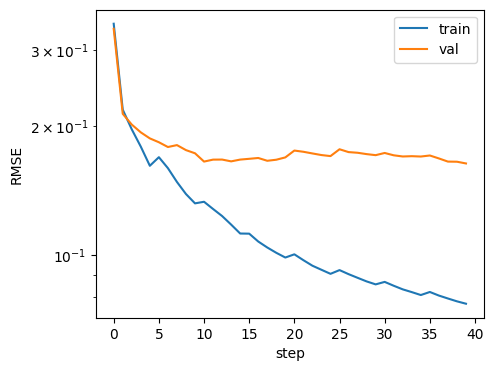

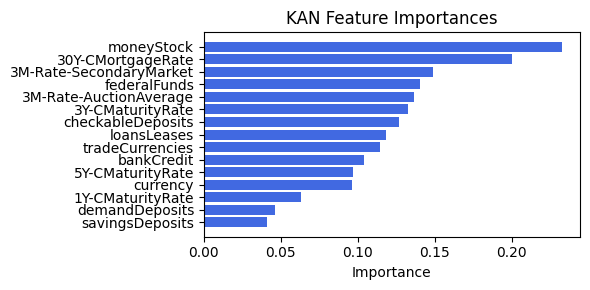

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.88it/s]

[('bankCredit', 0.31679114803250524), ('5Y-CMaturityRate', 0.31104864514754377), ('3M-Rate-AuctionAverage', 0.3075118337137004), ('30Y-CMortgageRate', 0.30532451164797836), ('1Y-CMaturityRate', 0.2941295366069036), ('3Y-CMaturityRate', 0.27722575546940786), ('tradeCurrencies', 0.24853165946468445), ('moneyStock', 0.2395098471296175), ('federalFunds', 0.18106647013586813), ('savingsDeposits', 0.14480437101197563), ('loansLeases', 0.1437694182558473), ('demandDeposits', 0.1305842469016733), ('checkableDeposits', 0.09497371631067446), ('currency', 0.07650225174758296), ('Ex1', 0.07422521219788385), ('3M-Rate-SecondaryMarket', 0.06942986680050603)]


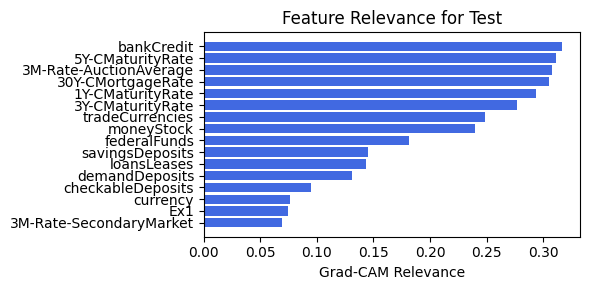

In [130]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.25)

### 2.3.7. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.14e-02 | eval_loss: 2.18e-01 | reg: 1.31e+02 |: 100%|█| 40/40 [00:46<00:00,  1.17s/i

saving model version 0.1
Best epoch 9
0.22881650924682617
M_KAN Relevance: 0.27187609672546387
CNN Relevance: 0.7281239032745361
[('moneyStock', 0.20419723), ('30Y-CMortgageRate', 0.19937949), ('3Y-CMaturityRate', 0.1852895), ('3M-Rate-SecondaryMarket', 0.15864035), ('checkableDeposits', 0.1418449), ('loansLeases', 0.12103199), ('tradeCurrencies', 0.10209324), ('5Y-CMaturityRate', 0.09383692), ('1Y-CMaturityRate', 0.07730367), ('currency', 0.076803684), ('bankCredit', 0.076438755), ('federalFunds', 0.07391439), ('demandDeposits', 0.06685305), ('3M-Rate-AuctionAverage', 0.06639852), ('savingsDeposits', 0.060492717)]


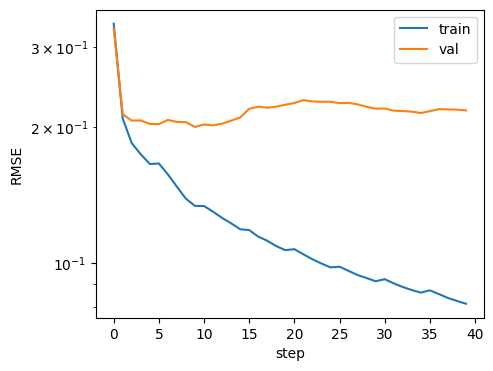

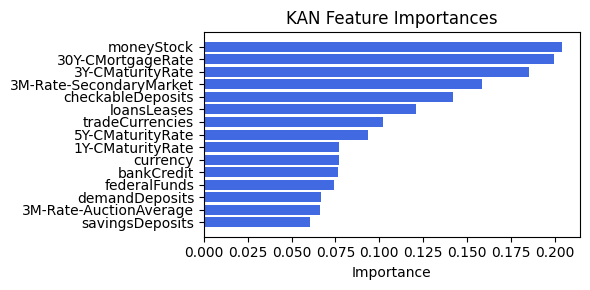

Computing Grad-CAM: 100%|██████████| 210/210 [00:25<00:00,  8.16it/s]


[('bankCredit', 0.2919809657082494), ('3M-Rate-AuctionAverage', 0.28760567276649884), ('30Y-CMortgageRate', 0.2846863968369906), ('5Y-CMaturityRate', 0.28031010064407297), ('1Y-CMaturityRate', 0.23314345522473257), ('moneyStock', 0.22099910005927087), ('tradeCurrencies', 0.20402930053394466), ('3Y-CMaturityRate', 0.1984545274593291), ('checkableDeposits', 0.19761923225014472), ('currency', 0.1778688534345877), ('federalFunds', 0.15695885886172098), ('3M-Rate-SecondaryMarket', 0.15557995069816355), ('savingsDeposits', 0.14734158293833302), ('loansLeases', 0.1398445980492397), ('Ex1', 0.12745293867109078), ('demandDeposits', 0.1042390409772495)]


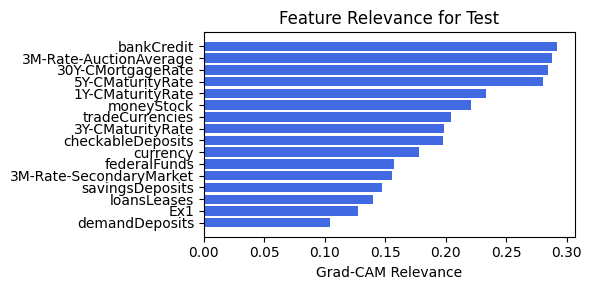

In [131]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.3.8. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 8.13e-02 | eval_loss: 1.78e-01 | reg: 1.35e+02 |: 100%|█| 40/40 [00:46<00:00,  1.17s/i

saving model version 0.1
Best epoch 39
0.21988017857074738
M_KAN Relevance: 0.2685305178165436
CNN Relevance: 0.731469452381134
[('moneyStock', 0.1978724), ('30Y-CMortgageRate', 0.19139218), ('3Y-CMaturityRate', 0.18125603), ('checkableDeposits', 0.16175732), ('3M-Rate-SecondaryMarket', 0.15654258), ('federalFunds', 0.11118947), ('loansLeases', 0.09604423), ('tradeCurrencies', 0.093912885), ('5Y-CMaturityRate', 0.08884476), ('currency', 0.07843798), ('bankCredit', 0.070336014), ('1Y-CMaturityRate', 0.069261104), ('savingsDeposits', 0.06692894), ('demandDeposits', 0.06399869), ('3M-Rate-AuctionAverage', 0.060111284)]


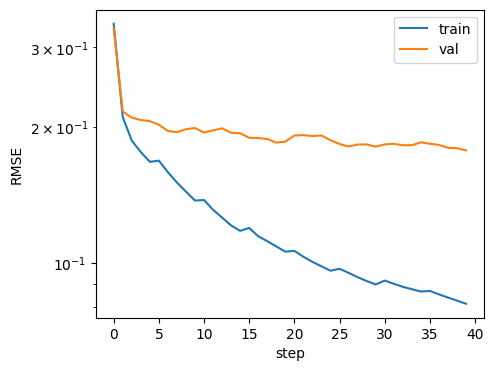

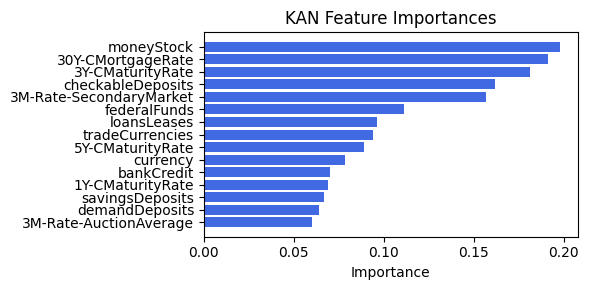

Computing Grad-CAM: 100%|██████████| 210/210 [00:26<00:00,  7.78it/s]


[('bankCredit', 0.2946291311965546), ('moneyStock', 0.2920105577596197), ('5Y-CMaturityRate', 0.28340449859055555), ('federalFunds', 0.24912525602835342), ('checkableDeposits', 0.2340768677053607), ('3M-Rate-AuctionAverage', 0.2242222972990324), ('3Y-CMaturityRate', 0.22347256178836689), ('30Y-CMortgageRate', 0.2198274862664264), ('tradeCurrencies', 0.21803085263375016), ('currency', 0.21196036164515786), ('1Y-CMaturityRate', 0.18742950364415134), ('demandDeposits', 0.184771920695147), ('loansLeases', 0.17066922358201173), ('Ex1', 0.16378628968064904), ('savingsDeposits', 0.1451929586744795), ('3M-Rate-SecondaryMarket', 0.13954805906839846)]


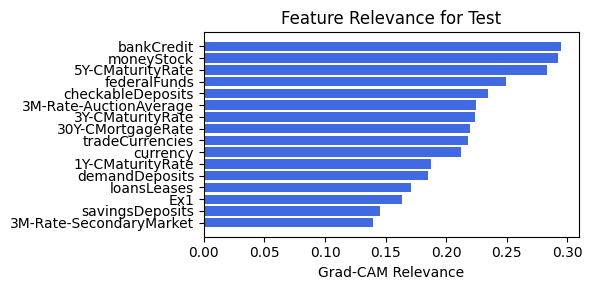

In [132]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.1)

### 2.3.9. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 5.94e-02 | eval_loss: 1.93e-01 | reg: 1.84e+02 |: 100%|█| 40/40 [00:45<00:00,  1.13s/i

saving model version 0.1
Best epoch 7
0.23731565475463867
M_KAN Relevance: 0.14107534289360046
CNN Relevance: 0.8589246273040771
[('moneyStock', 0.2146676), ('30Y-CMortgageRate', 0.18999688), ('checkableDeposits', 0.18544737), ('3M-Rate-AuctionAverage', 0.17636973), ('3M-Rate-SecondaryMarket', 0.1556651), ('3Y-CMaturityRate', 0.15354924), ('5Y-CMaturityRate', 0.14982933), ('currency', 0.14513527), ('1Y-CMaturityRate', 0.13712656), ('loansLeases', 0.13185118), ('bankCredit', 0.12966266), ('savingsDeposits', 0.12783638), ('federalFunds', 0.11219894), ('tradeCurrencies', 0.091273814), ('demandDeposits', 0.067479774)]


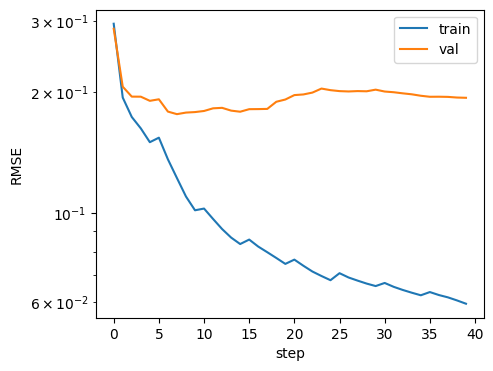

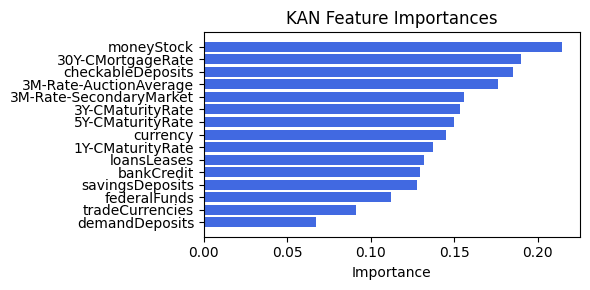

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.53it/s]

[('tradeCurrencies', 0.259869525185509), ('3M-Rate-SecondaryMarket', 0.25061254112903647), ('loansLeases', 0.2321807411316383), ('3Y-CMaturityRate', 0.19717737666796892), ('checkableDeposits', 0.1848704340845524), ('currency', 0.17735076975188263), ('bankCredit', 0.16935764756718916), ('5Y-CMaturityRate', 0.1668374928592346), ('1Y-CMaturityRate', 0.16628007377675247), ('savingsDeposits', 0.15743481907453055), ('demandDeposits', 0.15304928194742562), ('30Y-CMortgageRate', 0.1311026394356131), ('3M-Rate-AuctionAverage', 0.1227273783336083), ('federalFunds', 0.09362853766734978), ('Ex1', 0.0935166730307087), ('moneyStock', 0.05335174189032321)]


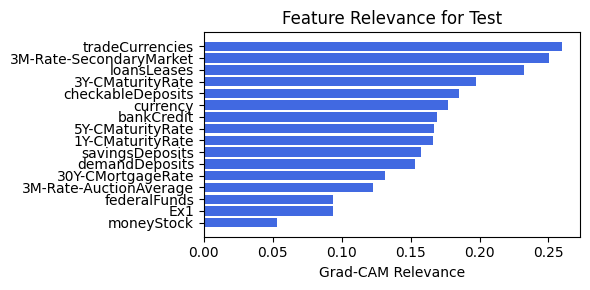

In [159]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.05)

### 2.3.10. width=[15, 6, 1], grid=7, lamb=1e-05 | alpha=0.05

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 5.94e-02 | eval_loss: 1.93e-01 | reg: 1.84e+02 |: 100%|█| 40/40 [00:45<00:00,  1.13s/i

saving model version 0.1
Best epoch 7
0.23731565475463867
M_KAN Relevance: 0.14107534289360046
CNN Relevance: 0.8589246273040771
[('moneyStock', 0.2146676), ('30Y-CMortgageRate', 0.18999688), ('checkableDeposits', 0.18544737), ('3M-Rate-AuctionAverage', 0.17636973), ('3M-Rate-SecondaryMarket', 0.1556651), ('3Y-CMaturityRate', 0.15354924), ('5Y-CMaturityRate', 0.14982933), ('currency', 0.14513527), ('1Y-CMaturityRate', 0.13712656), ('loansLeases', 0.13185118), ('bankCredit', 0.12966266), ('savingsDeposits', 0.12783638), ('federalFunds', 0.11219894), ('tradeCurrencies', 0.091273814), ('demandDeposits', 0.067479774)]


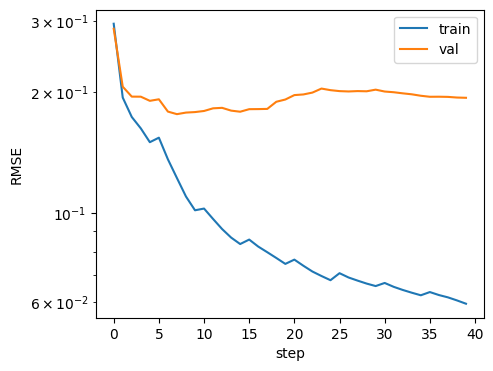

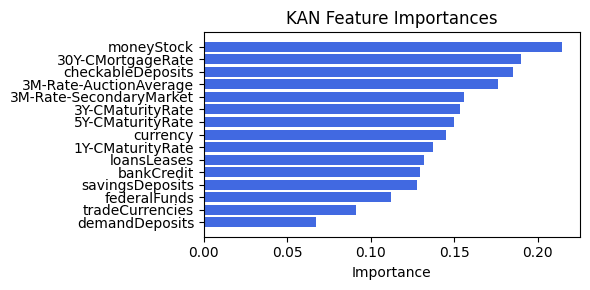

Computing Grad-CAM: 100%|██████████| 210/210 [00:24<00:00,  8.74it/s]

[('tradeCurrencies', 0.259869525185509), ('3M-Rate-SecondaryMarket', 0.25061254112903647), ('loansLeases', 0.2321807411316383), ('3Y-CMaturityRate', 0.19717737666796892), ('checkableDeposits', 0.1848704340845524), ('currency', 0.17735076975188263), ('bankCredit', 0.16935764756718916), ('5Y-CMaturityRate', 0.1668374928592346), ('1Y-CMaturityRate', 0.16628007377675247), ('savingsDeposits', 0.15743481907453055), ('demandDeposits', 0.15304928194742562), ('30Y-CMortgageRate', 0.1311026394356131), ('3M-Rate-AuctionAverage', 0.1227273783336083), ('federalFunds', 0.09362853766734978), ('Ex1', 0.0935166730307087), ('moneyStock', 0.05335174189032321)]


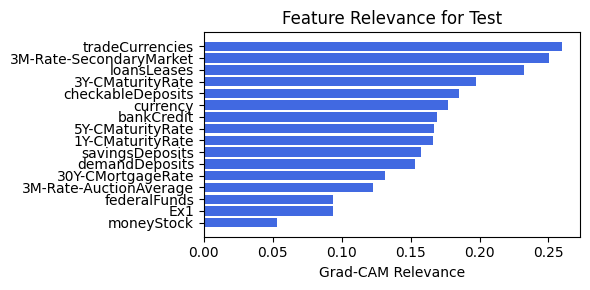

In [160]:
train_and_plot_relevance(Model3_2, kan_neurons=6, kan_grid=7, cnn_bottleneck_dim=-1, lamb=1e-05, steps=40, alpha=0.05)

## 2.4.0 width=[8, 3, 1], grid=5, lamb=0.01

### 2.3.1. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.12e+00 | eval_loss: 3.15e+00 | reg: 6.81e+01 |: 100%|█| 25/25 [10:49<00:00, 25.98s/i


saving model version 0.1
Best epoch 9
3.2689602375030518
M_KAN Relevance: 2.4848972316249274e-05
CNN Relevance: 0.9999751448631287
[('tau1', 0.5222289), ('thetad3', 0.43355966), ('thetad2', 0.2766376), ('thetad1', 0.23996186), ('theta1', 0.21155888), ('theta2', 0.17827885), ('tau2', 0.17498305), ('theta3', 0.12066728)]


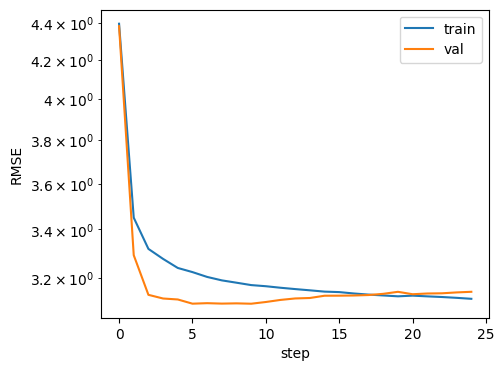

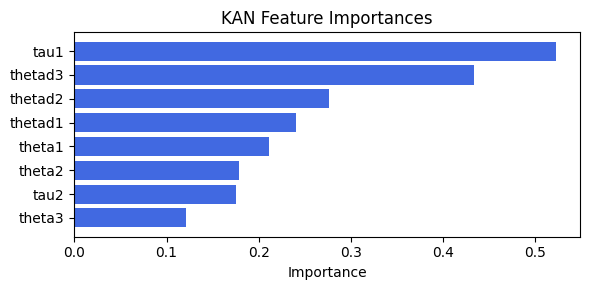

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:25<00:00, 11.28it/s]

[('theta1', 0.3704385616260571), ('tau1', 0.3625380506931969), ('thetad1', 0.3575101598938575), ('thetad2', 0.3334150721837242), ('tau2', 0.3120050060720046), ('theta2', 0.28162698317495305), ('theta3', 0.19804522605286623), ('Ex1', 0.15581451457960918), ('thetad3', 0.1470058641951176)]


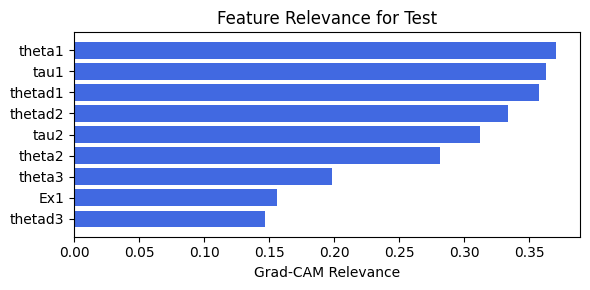

In [123]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.75)

### 2.3.2. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.75

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.10e+00 | eval_loss: 3.15e+00 | reg: 7.26e+01 |: 100%|█| 25/25 [10:44<00:00, 25.79s/i


saving model version 0.1
Best epoch 8
3.270750045776367
M_KAN Relevance: 1.2095920283172745e-05
CNN Relevance: 0.9999879002571106
[('thetad3', 0.5057123), ('tau1', 0.36844343), ('theta1', 0.35552925), ('theta2', 0.32808048), ('theta3', 0.20379561), ('thetad2', 0.15051897), ('thetad1', 0.11188307), ('tau2', 0.07965073)]


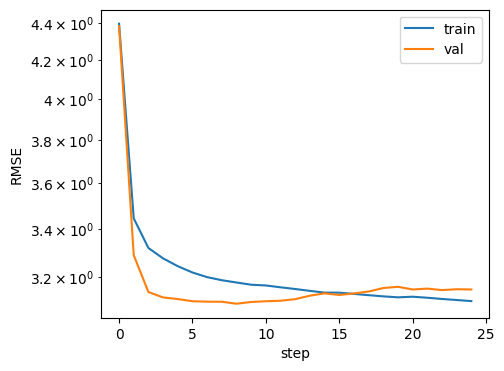

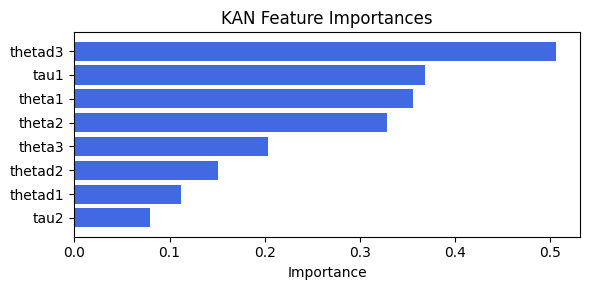

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:29<00:00, 10.95it/s]


[('theta1', 0.363468882524954), ('tau1', 0.3560771939308551), ('thetad1', 0.33391629584577764), ('thetad2', 0.2982945046973019), ('tau2', 0.28978658434625587), ('theta2', 0.2714962349500022), ('theta3', 0.20648397904747634), ('thetad3', 0.1470126060691337), ('Ex1', 0.14183661507161693)]


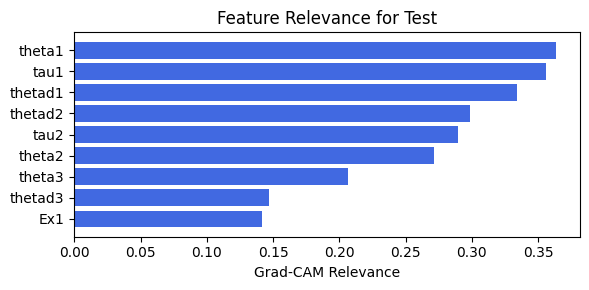

In [124]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.75)

### 2.3.3. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.12e+00 | eval_loss: 3.15e+00 | reg: 7.13e+01 |: 100%|█| 25/25 [12:30<00:00, 30.04s/i

saving model version 0.1
Best epoch 5
3.2923595905303955
M_KAN Relevance: 0.054484445601701736
CNN Relevance: 0.9455155730247498
[('tau2', 0.45155674), ('thetad2', 0.40111786), ('thetad3', 0.3184558), ('theta1', 0.29545903), ('theta3', 0.24653181), ('thetad1', 0.23861718), ('theta2', 0.2079018), ('tau1', 0.15343258)]


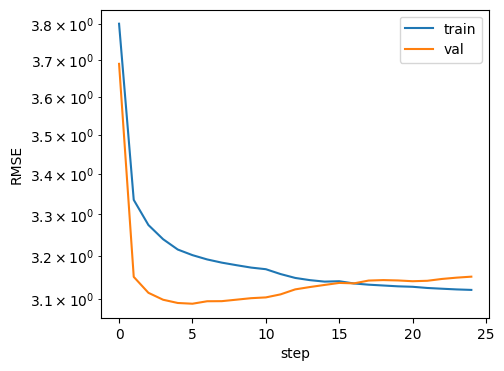

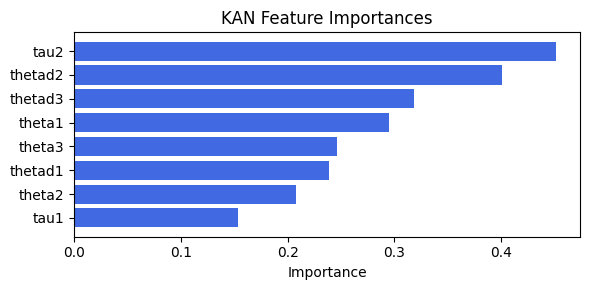

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:29<00:00, 10.94it/s]

[('tau1', 0.3689640404646514), ('theta1', 0.3617017426511132), ('thetad1', 0.3502974799922302), ('tau2', 0.3426163479672741), ('thetad2', 0.33178855813673824), ('theta2', 0.2838037160989903), ('Ex1', 0.21987006956700456), ('theta3', 0.204512848640367), ('thetad3', 0.11243998102578542)]


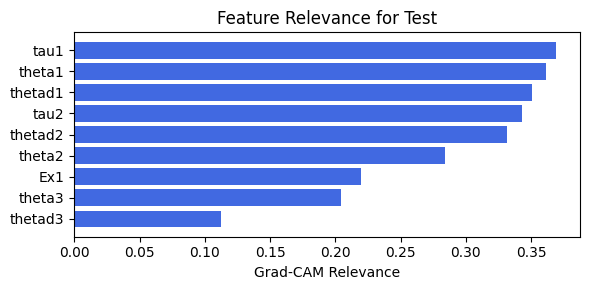

In [125]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.5)

### 2.3.4. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.5

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.13e+00 | eval_loss: 3.16e+00 | reg: 7.44e+01 |: 100%|█| 25/25 [12:03<00:00, 28.95s/i


saving model version 0.1
Best epoch 6
3.2757883071899414
M_KAN Relevance: 0.04675547033548355
CNN Relevance: 0.9532445073127747
[('thetad2', 0.5733236), ('thetad1', 0.40793848), ('theta1', 0.37450558), ('theta3', 0.31587455), ('thetad3', 0.282542), ('theta2', 0.1865305), ('tau1', 0.15222752), ('tau2', 0.14169012)]


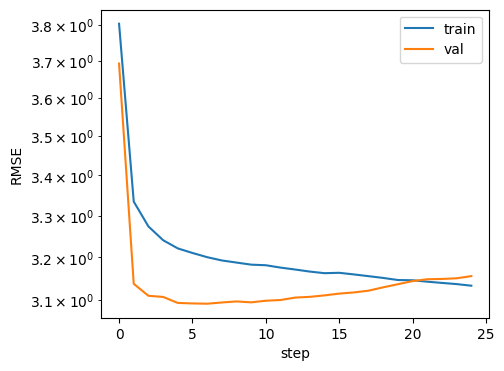

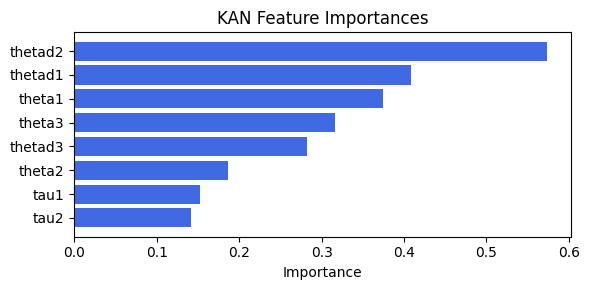

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:24<00:00, 11.37it/s]

[('theta1', 0.3623405890258727), ('thetad1', 0.34191622110124187), ('tau1', 0.33950338431715266), ('tau2', 0.3207320356731554), ('thetad2', 0.3066369890612933), ('theta2', 0.27274315611992667), ('Ex1', 0.2024801050158171), ('theta3', 0.19449370538874827), ('thetad3', 0.0930996319767607)]


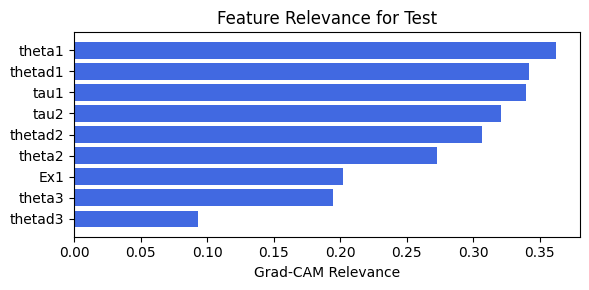

In [126]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.5)

### 2.3.5. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.12e+00 | eval_loss: 3.14e+00 | reg: 8.14e+01 |: 100%|█| 25/25 [11:21<00:00, 27.25s/i

saving model version 0.1
Best epoch 7
3.3052830696105957
M_KAN Relevance: 0.1587645560503006
CNN Relevance: 0.8412354588508606
[('theta2', 0.56118745), ('thetad3', 0.42072365), ('theta3', 0.24282494), ('tau2', 0.20192876), ('tau1', 0.18324104), ('theta1', 0.14726274), ('thetad1', 0.13583162), ('thetad2', 0.116666734)]


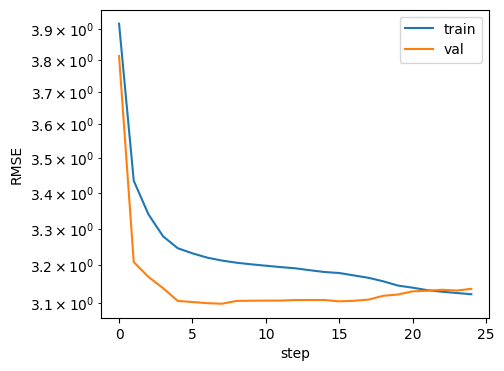

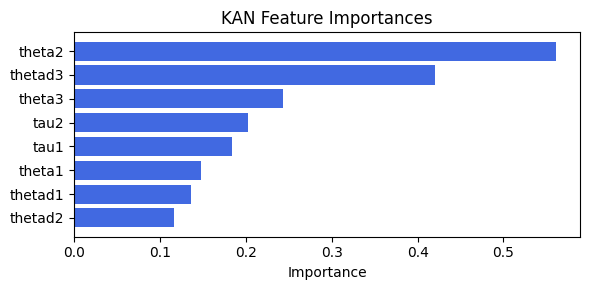

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:31<00:00, 10.84it/s]


[('tau1', 0.42036384442894165), ('tau2', 0.3854827540122773), ('theta1', 0.36593151530844703), ('thetad1', 0.361079092867402), ('thetad2', 0.2868393501120297), ('theta2', 0.2711278278623247), ('theta3', 0.23655530648580395), ('thetad3', 0.18809886836085501), ('Ex1', 0.18591433048714662)]


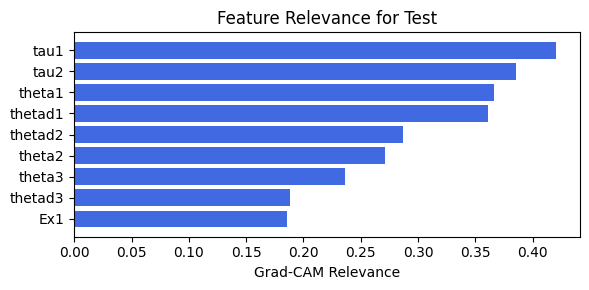

In [127]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.25)

### 2.3.6. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.25

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.12e+00 | eval_loss: 3.14e+00 | reg: 8.16e+01 |: 100%|█| 25/25 [12:05<00:00, 29.01s/i


saving model version 0.1
Best epoch 14
3.2779908180236816
M_KAN Relevance: 0.12468475103378296
CNN Relevance: 0.875315248966217
[('theta3', 0.4915696), ('thetad2', 0.39779577), ('theta2', 0.37599358), ('theta1', 0.31076506), ('thetad1', 0.23789033), ('tau1', 0.2375384), ('thetad3', 0.22937605), ('tau2', 0.19062792)]


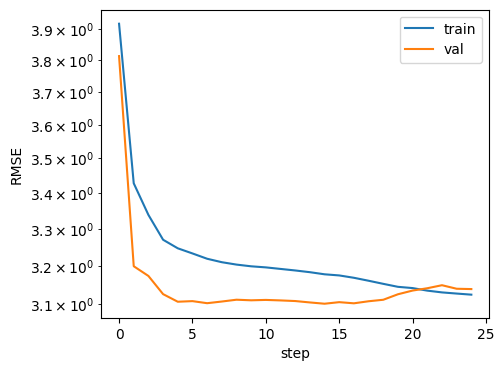

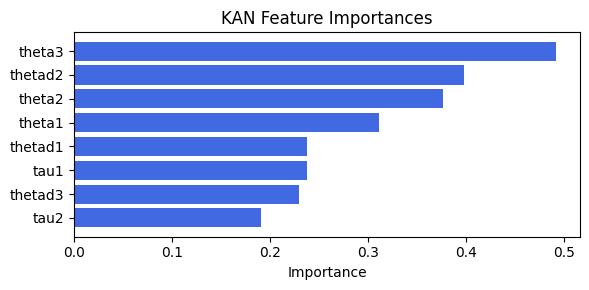

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:23<00:00, 11.43it/s]


[('tau2', 0.46480395094398747), ('tau1', 0.45968143132792144), ('theta1', 0.34658235241335805), ('thetad1', 0.34413108367637957), ('Ex1', 0.32257414509853677), ('thetad2', 0.2582816174550402), ('theta2', 0.24702541915835263), ('theta3', 0.23877453293753406), ('thetad3', 0.18157780801562298)]


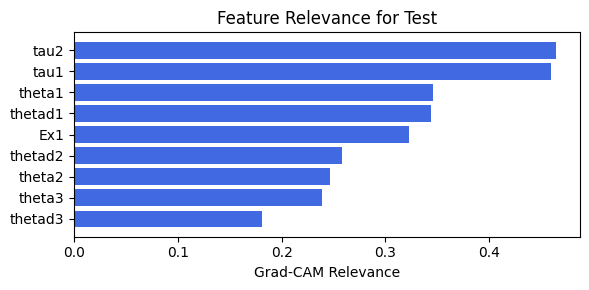

In [128]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.25)

### 2.3.7. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.11e+00 | eval_loss: 3.19e+00 | reg: 7.49e+01 |: 100%|█| 25/25 [15:32<00:00, 37.30s/i


saving model version 0.1
Best epoch 5
3.3225462436676025
M_KAN Relevance: 0.32605066895484924
CNN Relevance: 0.6739493608474731
[('theta2', 0.71053696), ('thetad3', 0.37163448), ('theta3', 0.23369005), ('thetad2', 0.20669858), ('theta1', 0.19948702), ('thetad1', 0.13402317), ('tau1', 0.114580154), ('tau2', 0.07349051)]


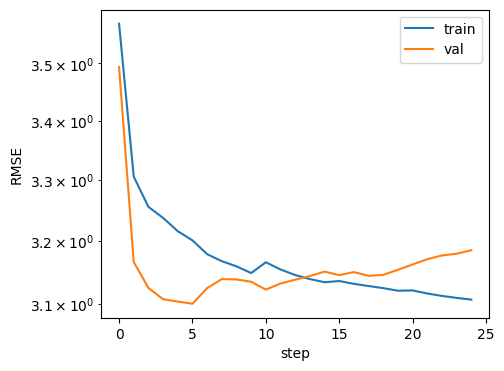

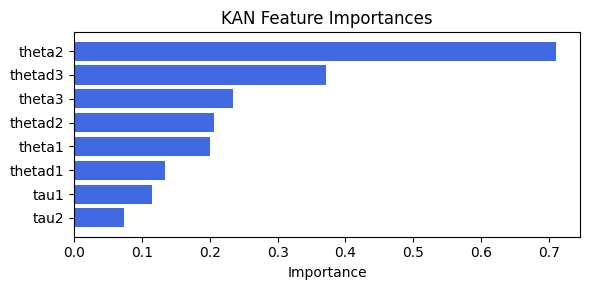

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:44<00:00,  9.95it/s]

[('tau2', 0.5070686510654253), ('tau1', 0.4781505281236578), ('thetad1', 0.3149351261991148), ('theta1', 0.28455269581025233), ('Ex1', 0.2788638525493721), ('theta3', 0.2416839757105313), ('thetad3', 0.2374397239464837), ('thetad2', 0.22355284619776866), ('theta2', 0.2150329524133942)]


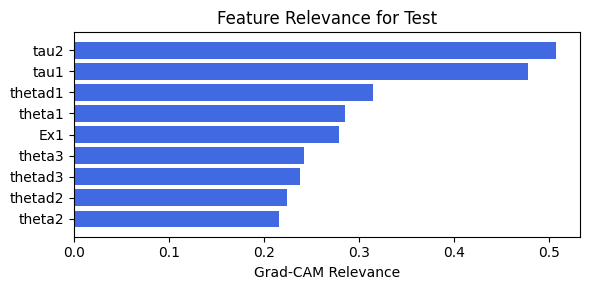

In [129]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.1)

### 2.3.8. width=[8, 3, 1], grid=5, lamb=0.01 | alpha=0.1

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_2


| train_loss: 3.10e+00 | eval_loss: 3.19e+00 | reg: 7.48e+01 |: 100%|█| 25/25 [18:08<00:00, 43.56s/i

saving model version 0.1
Best epoch 4
3.3283212184906006
M_KAN Relevance: 0.3208526074886322
CNN Relevance: 0.6791474223136902
[('theta2', 0.8185854), ('thetad2', 0.21410474), ('thetad3', 0.21292025), ('theta3', 0.20170824), ('thetad1', 0.17560379), ('tau1', 0.16250461), ('theta1', 0.16064851), ('tau2', 0.137392)]


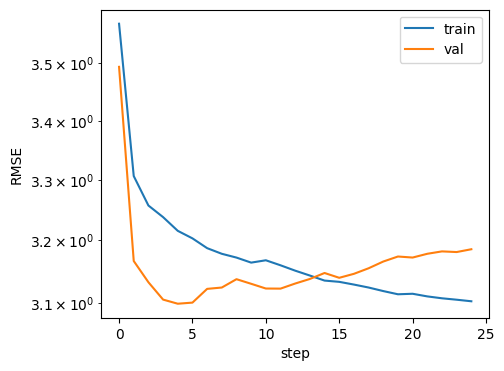

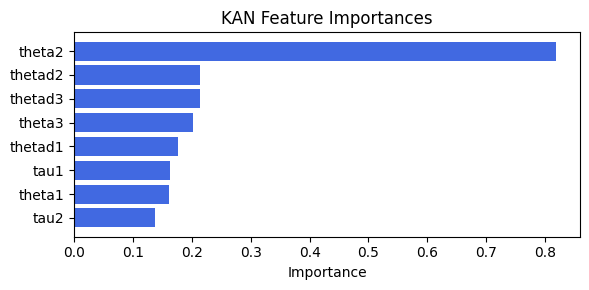

Computing Grad-CAM: 100%|██████████| 1639/1639 [02:48<00:00,  9.74it/s]


[('tau2', 0.5015377141756725), ('tau1', 0.47558203694292306), ('thetad1', 0.3067884577725616), ('Ex1', 0.2997669050011205), ('theta1', 0.2831243205997883), ('theta3', 0.25134473219378095), ('thetad3', 0.22863278572027182), ('thetad2', 0.22370363632574633), ('theta2', 0.21247809406589774)]


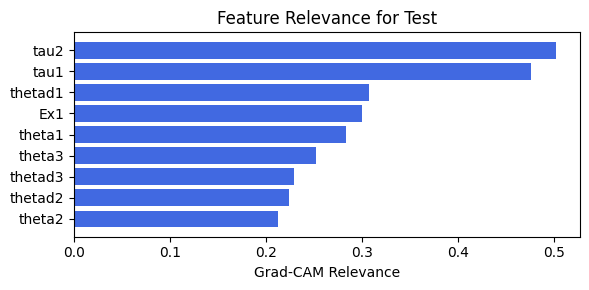

In [130]:
train_and_plot_relevance(Model3_2, kan_neurons=3, kan_grid=5, cnn_bottleneck_dim=-1, lamb=0.01, steps=25, alpha=0.1)

# Option 3: Dynamic factor

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3_3


| train_loss: 2.01e-01 | eval_loss: 1.86e-01 | reg: 5.20e+01 |: 100%|█| 20/20 [00:16<00:00,  1.21it/

saving model version 0.1
Best epoch 12
39.133548736572266
M_KAN Relevance: 0.1628304123878479
CNN Relevance: 0.8371696472167969
[('moneyStock', 0.35421583), ('30Y-CMortgageRate', 0.25258225), ('tradeCurrencies', 0.20849726), ('3Y-CMaturityRate', 0.1835565), ('savingsDeposits', 0.1462113), ('3M-Rate-SecondaryMarket', 0.11012405), ('currency', 0.09689588), ('5Y-CMaturityRate', 0.09034857), ('demandDeposits', 0.077078395), ('1Y-CMaturityRate', 0.07114831), ('federalFunds', 0.06151945), ('bankCredit', 0.04971485), ('3M-Rate-AuctionAverage', 0.040803336), ('checkableDeposits', 0.032527857), ('loansLeases', 0.020335943)]


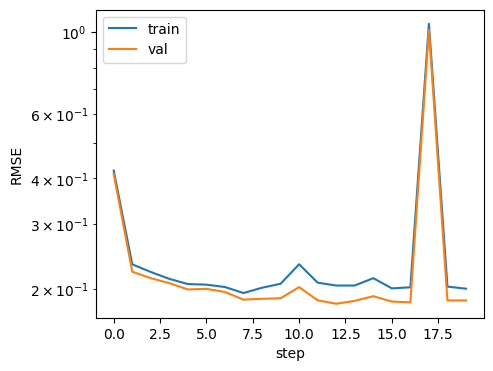

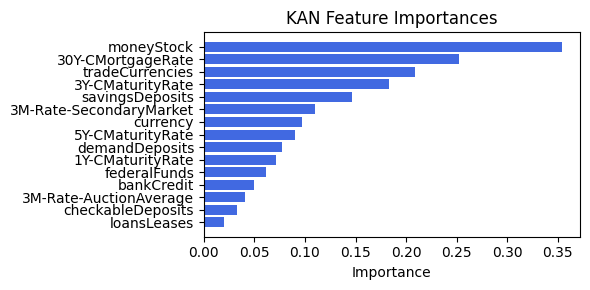

Computing Grad-CAM: 100%|██████████| 210/210 [00:23<00:00,  9.05it/s]


[('3M-Rate-SecondaryMarket', 0.21461180227703325), ('30Y-CMortgageRate', 0.1690047398032177), ('3M-Rate-AuctionAverage', 0.16547772000028219), ('checkableDeposits', 0.11046807039085599), ('1Y-CMaturityRate', 0.09094097793457054), ('3Y-CMaturityRate', 0.08937314466706343), ('loansLeases', 0.051748680728044186), ('demandDeposits', 0.03219348726360338), ('bankCredit', 0.017105897731103357), ('5Y-CMaturityRate', 0.016356063068711332), ('tradeCurrencies', 0.01395155248631324), ('federalFunds', 0.012574815907559935), ('currency', 0.011646193902786416), ('savingsDeposits', 0.004794020849259964), ('Ex1', 0.0013743130445142188), ('moneyStock', 0.0009003575669512862)]


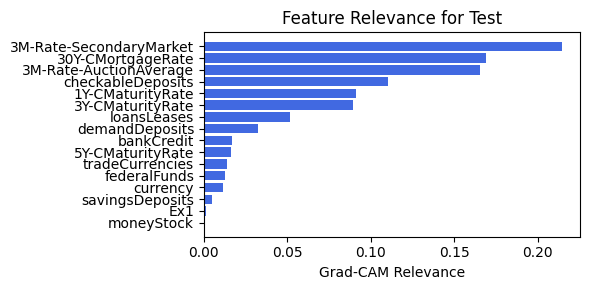

In [94]:
train_and_plot_relevance(Model3_3, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=-1, lamb=1e-5, steps=20, alpha=1.)

# Hibrid Model3 training ✅ Top 2 Configurations

### 1. width=[8, 4, 1], grid=3, lamb=0.01| best_epoch=10 | loss=3.21696

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.10e+00 | eval_loss: 3.14e+00 | reg: 4.28e+01 |: 100%|█| 40/40 [00:39<00:00,  1.02it/


saving model version 0.1
Best epoch 15
3.2704854011535645


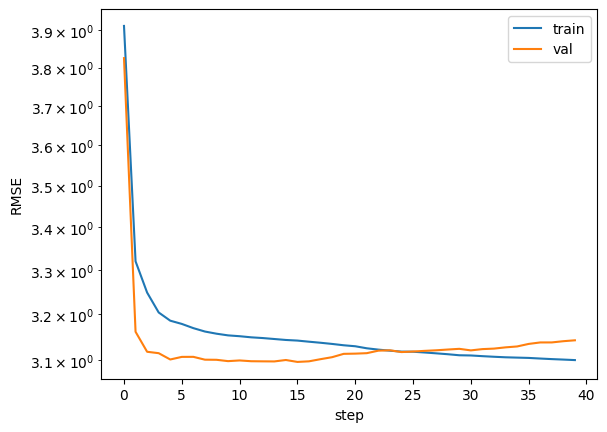

In [101]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=4, kan_grid=3, cnn_bottleneck_dim=1)
best_model_state, metrics3, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['eval_loss'])

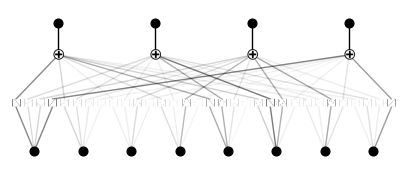

In [45]:
model.m_kan.plot()

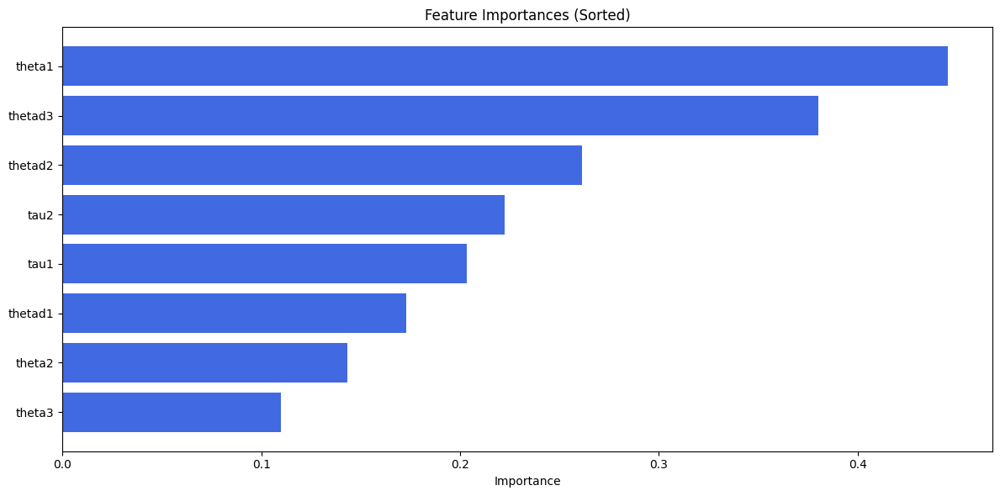

In [46]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

In [42]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

Computing Grad-CAM:   0%|          | 0/1639 [00:00<?, ?it/s]


AttributeError: 'Model3_0' object has no attribute 'cnn_branch'

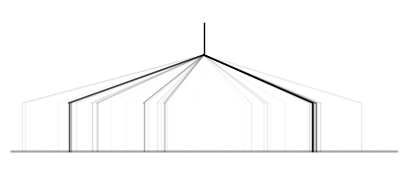

In [47]:
model.final_kan.plot()

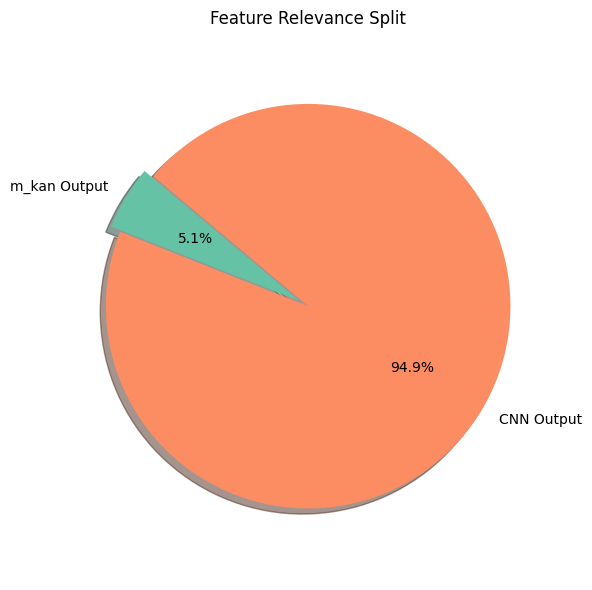

In [103]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=4)

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

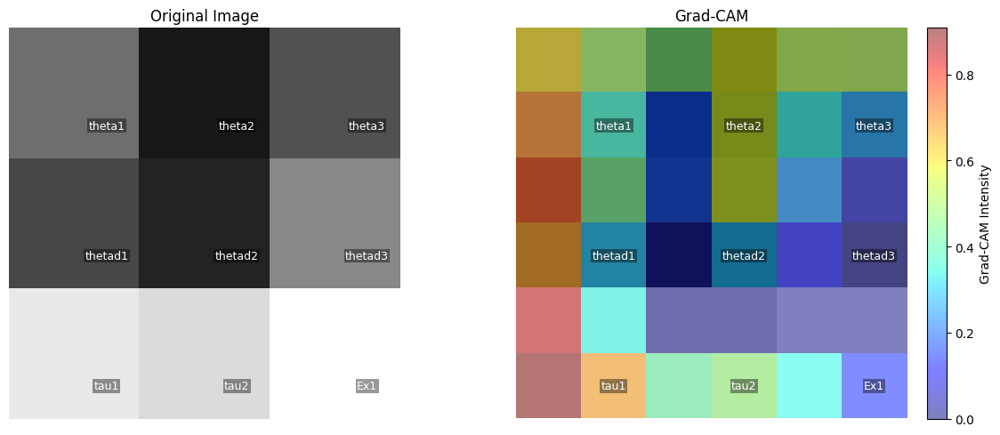

In [50]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:53<00:00,  2.76it/s] 


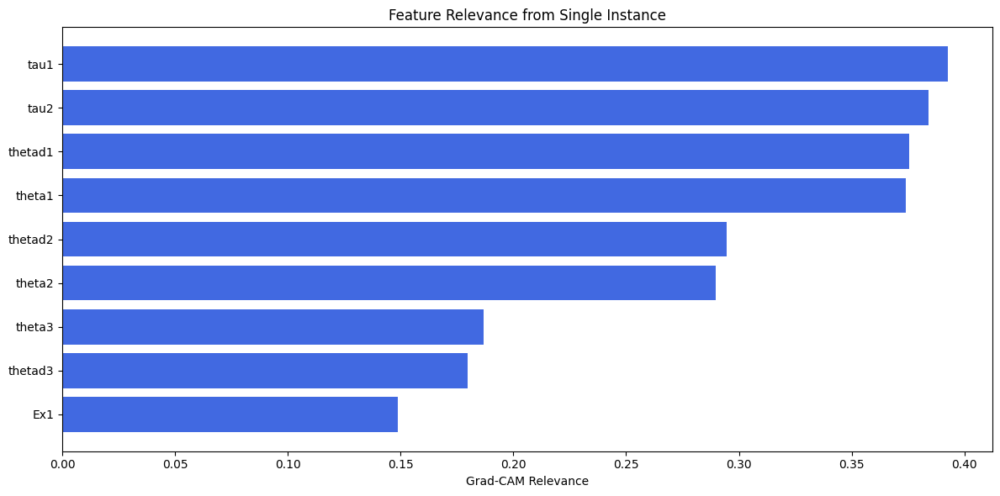

In [51]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[8, 3, 1], grid=5, lamb=0.01| best_epoch=12 | loss=3.21744

In [52]:
del model
torch.cuda.empty_cache()
gc.collect()

13172740

In [42]:
model = try_create_model(Model3, attributes, imgs_shape, kan_neurons=3, kan_grid=5)
best_model_state, metrics3,_ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics3['train_loss'], metrics3['val_loss'])

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model3


| train_loss: 3.40e+00 | eval_loss: 3.17e+00 | reg: 1.19e+02 |:   8%| | 3/40 [00:18<03:44,  6.06s/it


KeyboardInterrupt: 

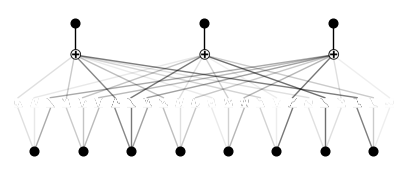

In [54]:
model.m_kan.plot()

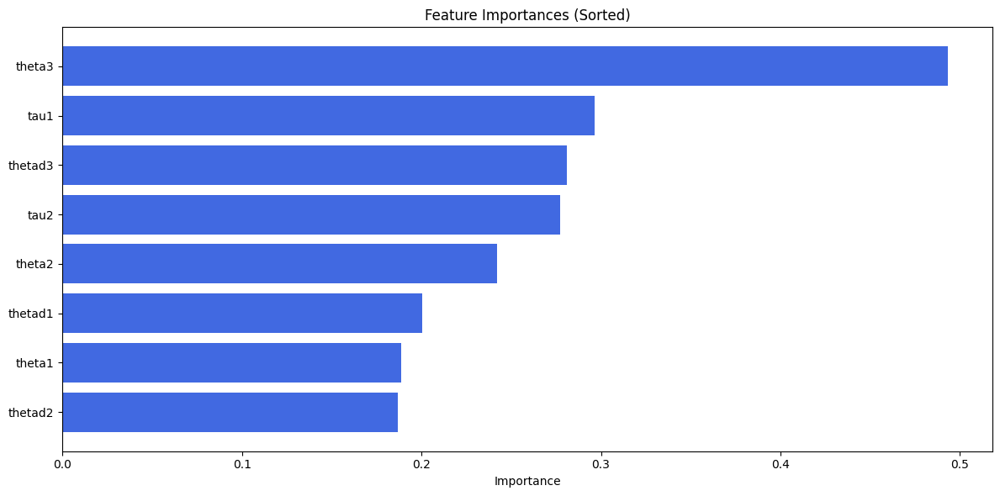

In [55]:
plot_sorted_feature_importance(x_col, model.m_kan.feature_score)

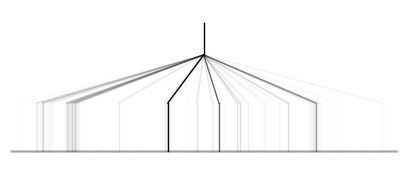

In [56]:
model.final_kan.plot()

In [57]:
feature_score = model.final_kan.feature_score

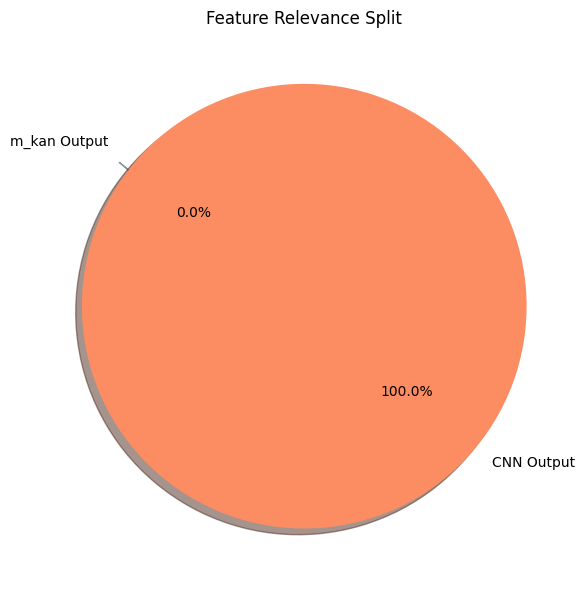

In [58]:
plot_mkan_vs_cnn_relevance(feature_score, mkan_len=3)

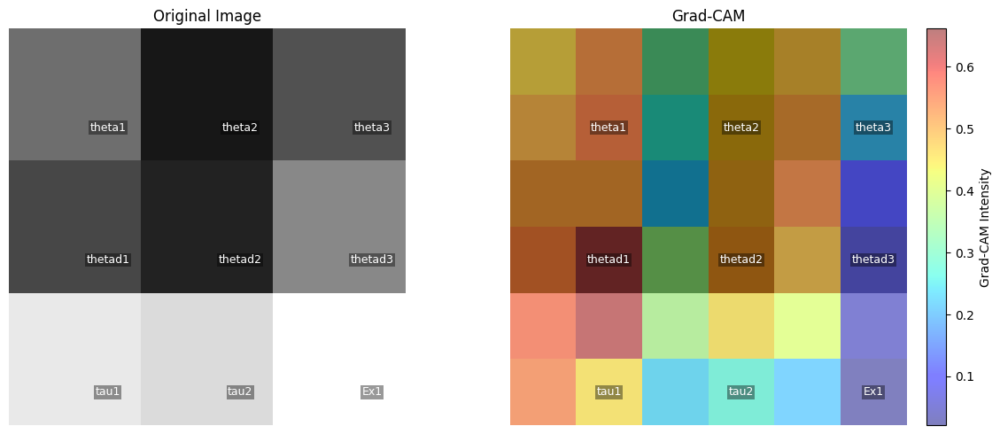

In [59]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [09:06<00:00,  3.00it/s]


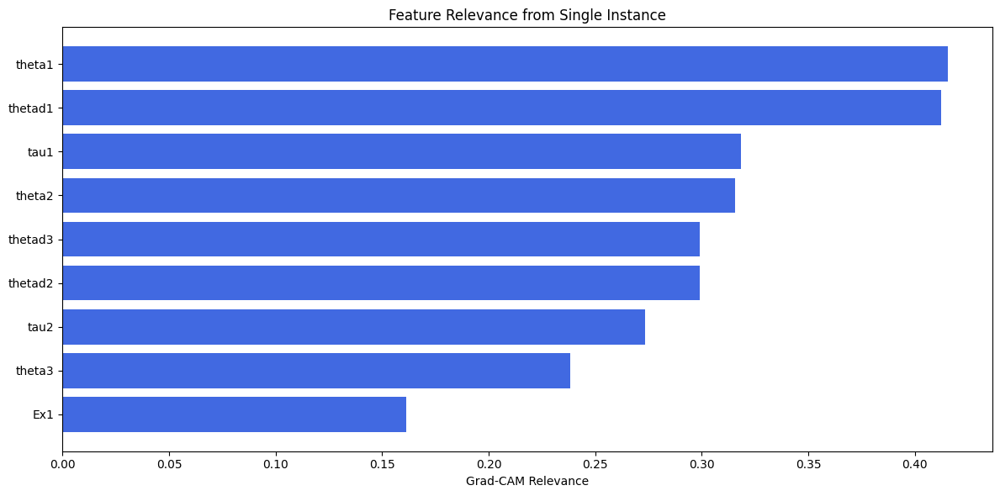

In [60]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Hybrid Model4 training ✅ Top 2 Configurations

### 1. width=[8, 1, 1], grid=4, lamb=0.01| best_epoch=7 | loss=3.23119

In [61]:
del model
torch.cuda.empty_cache()
gc.collect()

13370161

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 2.45e+00 | eval_loss: 3.71e+00 | reg: 9.67e+01 |: 100%|█| 40/40 [13:51<00:00, 20.80s/i


saving model version 0.1
Best epoch 8
3.7815768718719482


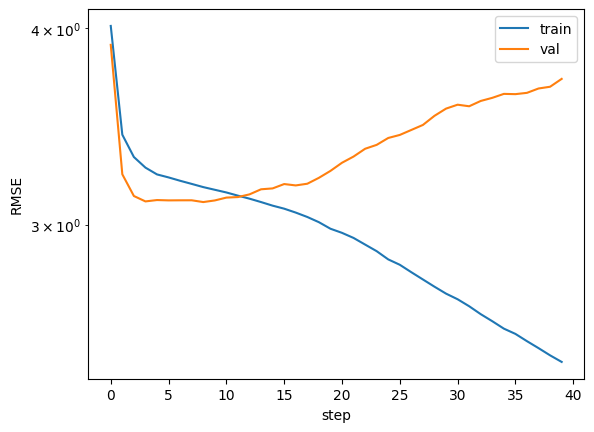

In [62]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=1, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.01)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

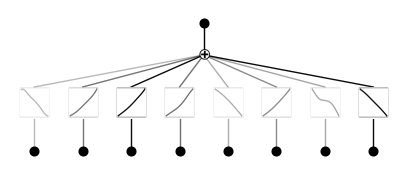

In [63]:
model.m_kan.plot()

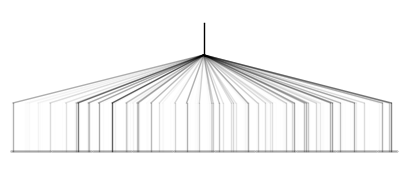

In [64]:
model.final_kan.plot()

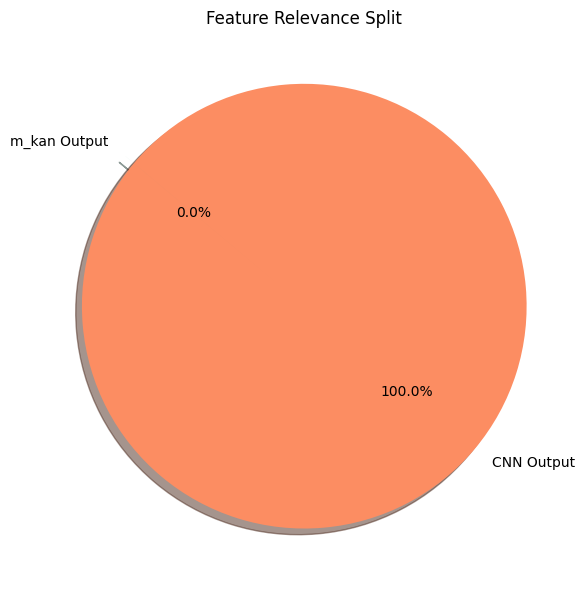

In [65]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=1)

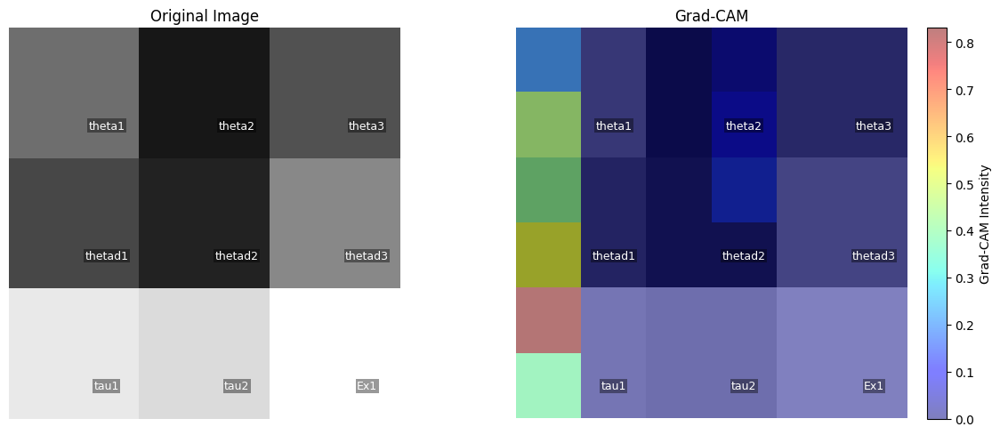

In [66]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [07:58<00:00,  3.43it/s] 


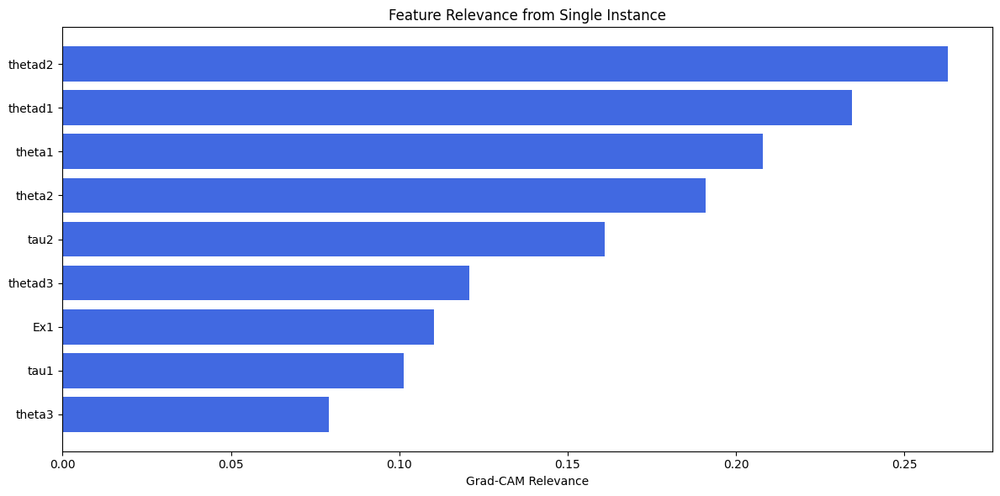

In [67]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

### 2. width=[8, 2, 1], grid=4, lamb=0.1| best_epoch=7 | loss=3.23543

In [70]:
del model
torch.cuda.empty_cache()
gc.collect()

481

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model4


| train_loss: 3.23e+00 | eval_loss: 3.22e+00 | reg: 2.22e+01 |: 100%|█| 40/40 [06:48<00:00, 10.22s/i


saving model version 0.1
Best epoch 11
3.356964588165283


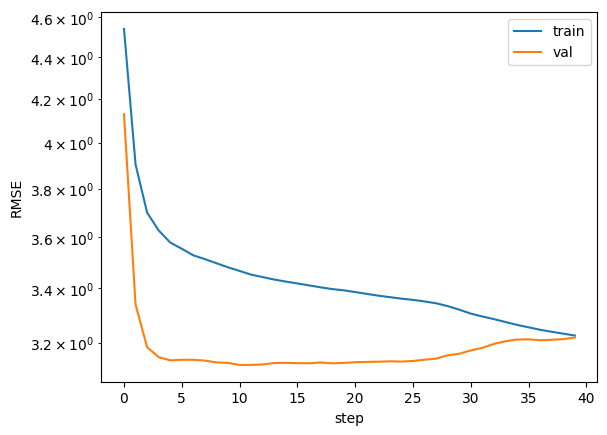

In [71]:
model = try_create_model(Model4, attributes, imgs_shape, kan_neurons=2, kan_grid=4)  # Attempt to create Model4
best_model_state, metrics4, _ = fit_hybrid_dataloaders(model, dataset, opt="LBFGS", steps=40, lamb=0.1)
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics4['train_loss'], metrics4['eval_loss'])

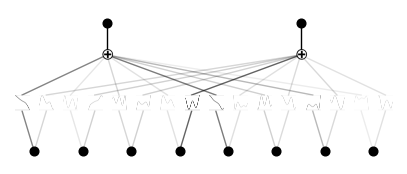

In [72]:
model.m_kan.plot()

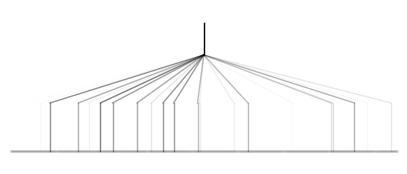

In [73]:
model.final_kan.plot()

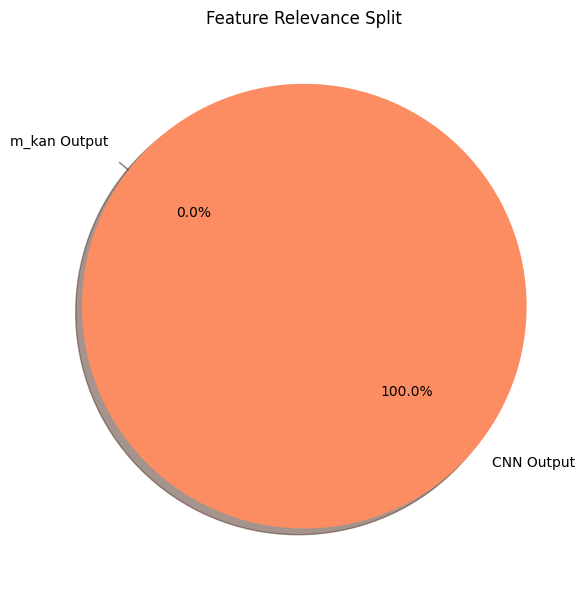

In [74]:
plot_mkan_vs_cnn_relevance(model.final_kan.feature_score, mkan_len=2)

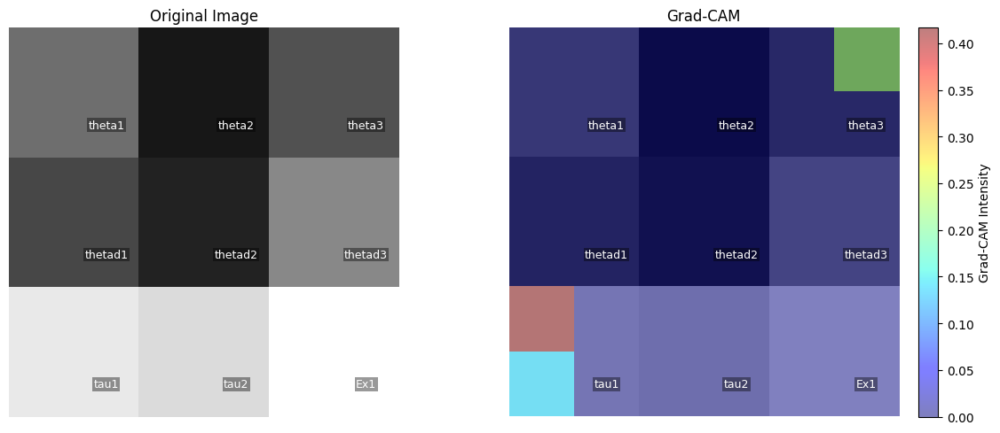

In [75]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM: 100%|██████████| 1639/1639 [08:03<00:00,  3.39it/s] 


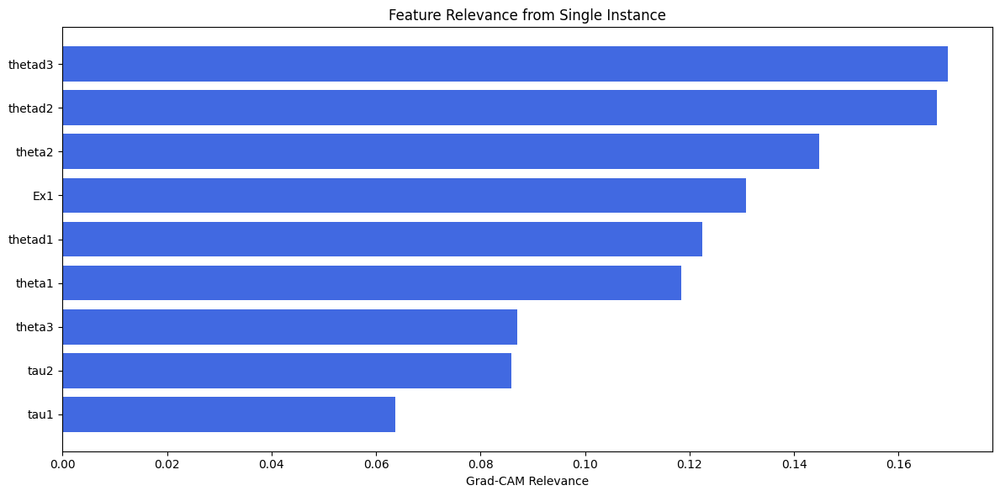

In [76]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)

# Bonus Hybrid

In [49]:
class Model5(nn.Module):
    def __init__(self, attributes, imgs_shape, kan_neurons, kan_grid, device=device):
        super(Model5, self).__init__()
        # CNN branch
        self.cnn_branch = nn.Sequential(
            nn.Conv2d(imgs_shape[0], 16, kernel_size=3, padding=2),     # out: 16 x 9 x 9
            nn.LayerNorm([16, 8, 8]),
            nn.Sigmoid(),
            nn.Flatten()
        ).to(device)

        # Calculate the size of the flattened output
        self.flat_size = self._get_flat_size(imgs_shape)

        self.final_kan = KAN(
            width=[self.flat_size, 1],
            grid=kan_grid,
            k=3,
            seed=SEED,
            device=device
        )

        self.device = device


    def _get_flat_size(self, imgs_shape):
        # Forward pass with dummy input to calculate flat size
        dummy_input = torch.zeros(4, *imgs_shape, device=device)
        x = self.cnn_branch(dummy_input)
        return x.size(1)

    def get_concat_output(self, mlp_input, cnn_input):
        # Ensure inputs are moved to the correct device
        cnn_input = cnn_input.to(self.device)
        
        return self.cnn_branch(cnn_input)  # Process image input

    
    def forward(self, mlp_input, cnn_input):
        concat_output = self.get_concat_output(mlp_input, cnn_input)
        return self.final_kan(concat_output)

In [59]:
def fit_hybrid_dataloaders2(model, 
                           dataset,
                           opt="AdamW", 
                           steps=100, 
                           log=1, 
                           lamb=0., 
                           lamb_l1=1., 
                           lamb_entropy=2., 
                           lamb_coef=0., 
                           lamb_coefdiff=0., 
                           update_grid=True, 
                           grid_update_num=10, 
                           loss_fn=None, 
                           lr=1., 
                           start_grid_update_step=-1, 
                           stop_grid_update_step=50, 
                           batch=-1,
                           metrics=None, 
                           save_fig=False, 
                           in_vars=None, 
                           out_vars=None, 
                           beta=3, 
                           save_fig_freq=1, 
                           img_folder='./video', 
                           singularity_avoiding=False, 
                           y_th=1000., 
                           reg_metric='edge_forward_spline_n', 
                           display_metrics=None,
                           sum_f_reg=True):
    """
    Trains the hybrid model (with a KAN branch and a CNN branch) using a steps-based loop
    adapted from KAN.fit(), with grid updates and regularization.
    
    Instead of a single dataset dict, this function accepts three DataLoaders:
        - train_loader: provides (mlp, img, target) for training
        - val_loader: provides (mlp, img, target) for evaluation during training
        - test_loader: provides (mlp, img, target) for validation

    Internally, the function combines each loader into a dataset dictionary.
    
    Returns:
        results: dictionary containing training loss, evaluation loss, regularization values,
                 and any additional metrics recorded during training.
    """
    #device = next(model.parameters()).device

    # Warn if regularization is requested but model's internal flag isn't enabled.
    if lamb > 0. and not getattr(model.final_kan, "save_act", False):
        print("setting lamb=0. If you want to set lamb > 0, set model.final_kan.save_act=True")
    
    # Disable symbolic processing for training if applicable (KAN internal logic)
    if hasattr(model.final_kan, "disable_symbolic_in_fit"):
        old_save_act, old_symbolic_enabled = model.final_kan.disable_symbolic_in_fit(lamb)
    else:
        old_save_act, old_symbolic_enabled = None, None

    pbar = tqdm(range(steps), desc='Training', ncols=100)

    # Default loss function (mean squared error) if not provided
    if loss_fn is None:
        loss_fn = lambda x, y: torch.mean((x - y) ** 2)

    # Determine grid update frequency
    grid_update_freq = int(stop_grid_update_step / grid_update_num) if grid_update_num > 0 else 1

    # Determine total number of training examples
    n_train = dataset["train_input"].shape[0]
    n_eval  = dataset["val_input"].shape[0]  # using val set for evaluation during training
    batch_size = n_train if batch == -1 or batch > n_train else batch

    # Set up optimizer: choose between Adam and LBFGS (removed tolerance_ys)
    if opt == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif opt == "LBFGS":        
        optimizer = LBFGS(model.parameters(), lr=lr, history_size=10, 
                          line_search_fn="strong_wolfe", 
                          tolerance_grad=1e-32, 
                          tolerance_change=1e-32, 
                          tolerance_ys=1e-32)
    else:
        raise ValueError("Optimizer not recognized. Use 'Adam' or 'LBFGS'.")

    # Prepare results dictionary.
    results = {'train_loss': [], 'eval_loss': [], 'reg': []}

    
    if metrics is not None:
        for metric in metrics:
            results[metric.__name__] = []

    best_model_state = None
    best_epoch = -1
    best_loss = float('inf')

    for step in pbar:
        # Randomly sample indices for a mini-batch from the training set.
        train_indices = np.random.choice(n_train, batch_size, replace=False)
        # Use full evaluation set for evaluation; you can also sample if desired.
        eval_indices = np.arange(n_eval)
        cached_loss = {}
        # Closure for LBFGS
        def closure():
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            # Compute regularization term if enabled.
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val_inner = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val_inner = torch.tensor(0., device=device)
            loss_val_inner = train_loss + lamb * reg_val_inner
            loss_val_inner.backward()

            cached_loss['loss'] = loss_val_inner.detach()
            cached_loss['reg'] = reg_val_inner.detach()
            return loss_val_inner

        # Perform grid update if applicable.
        if (step % grid_update_freq == 0 and step < stop_grid_update_step 
            and update_grid and step >= start_grid_update_step):
            
            mlp_batch = dataset['train_input'][train_indices]
            cnn_batch = dataset['train_img'][train_indices]
            #cnn_output = model.cnn_branch(cnn_batch)  # Process image input
            concatenated = model.get_concat_output(mlp_batch, cnn_batch)
            #concatenated = torch.cat((mlp_batch, cnn_output), dim=1)
            model.final_kan.update_grid(concatenated)

        # Perform an optimizer step.
        if opt == "LBFGS":
            optimizer.step(closure)
            loss_val = cached_loss['loss']
            reg_val = cached_loss['reg']
        else:  # AdamW branch
            optimizer.zero_grad()
            mlp_batch = dataset["train_input"][train_indices]
            img_batch = dataset["train_img"][train_indices]
            target_batch = dataset["train_label"][train_indices]
            outputs = model(mlp_batch, img_batch)
            train_loss = loss_fn(outputs, target_batch)
            if hasattr(model.final_kan, "save_act") and model.final_kan.save_act:
                if reg_metric == 'edge_backward':
                    model.final_kan.attribute()
                if reg_metric == 'node_backward':
                    model.final_kan.node_attribute()
                reg_val = model.final_kan.get_reg(reg_metric, lamb_l1, lamb_entropy, lamb_coef, lamb_coefdiff)
            else:
                reg_val = torch.tensor(0., device=device)
            loss_val = train_loss + lamb * reg_val
            loss_val.backward()
            optimizer.step()

        with torch.no_grad():
            mlp_eval = dataset["val_input"][eval_indices]
            img_eval = dataset["val_img"][eval_indices]
            target_eval = dataset["val_label"][eval_indices]
            eval_loss = loss_fn(model(mlp_eval, img_eval), target_eval)

        # Record results (using square-root of loss similar to KAN.fit)
        results['train_loss'].append(torch.sqrt(loss_val.detach()).item())
        results['eval_loss'].append(torch.sqrt(eval_loss.detach()).item())
        results['reg'].append(reg_val.detach().item())

        if metrics is not None:
            for metric in metrics:
                # Here, we assume each metric returns a tensor.
                results[metric.__name__].append(metric().item())

        if eval_loss < best_loss:
            best_epoch = step
            best_loss = eval_loss
            best_model_state = copy.deepcopy(model.state_dict())

        # Update progress bar.
        if display_metrics is None:
            pbar.set_description("| train_loss: %.2e | eval_loss: %.2e | reg: %.2e |" %
                                 (torch.sqrt(loss_val.detach()).item(),
                                  torch.sqrt(eval_loss.detach()).item(),
                                  reg_val.detach().item()))
        else:
            desc = ""
            data = []
            for metric in display_metrics:
                desc += f" {metric}: %.2e |"
                data.append(results[metric.__name__][-1])
            pbar.set_description(desc % tuple(data))

        # Optionally save a figure snapshot.
        if save_fig and step % save_fig_freq == 0:
            save_act_backup = getattr(model.final_kan, "save_act", False)
            model.final_kan.save_act = True
            model.plot(folder=img_folder, in_vars=in_vars, out_vars=out_vars, title=f"Step {step}", beta=beta)
            plt.savefig(os.path.join(img_folder, f"{step}.jpg"), bbox_inches='tight', dpi=200)
            plt.close()
            model.final_kan.save_act = save_act_backup

    # Restore original settings if applicable.
    if old_symbolic_enabled is not None:
        model.final_kan.symbolic_enabled = old_symbolic_enabled
    if hasattr(model.final_kan, "log_history"):
        model.final_kan.log_history('fit')
    print(f"Best epoch {best_epoch}")
    return best_model_state, results, best_epoch

In [78]:
del model
torch.cuda.empty_cache()
gc.collect()

215554

In [65]:
model = try_create_model(Model5, attributes, imgs_shape, kan_neurons=3, kan_grid=4)  # Attempt to create Model4

checkpoint directory created: ./model
saving model version 0.0
Successfully created and tested Model5


In [66]:
best_model_state, metrics5, _ = fit_hybrid_dataloaders2(model, dataset, opt="LBFGS", steps=10, lamb=0.01)

| train_loss: 3.19e+00 | eval_loss: 3.10e+00 | reg: 5.06e+01 |: 100%|█| 10/10 [00:39<00:00,  3.91s/i

saving model version 0.1
Best epoch 9


3.2302682399749756


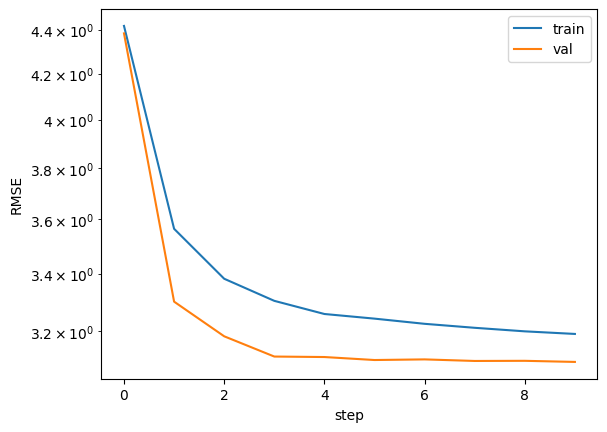

In [67]:
plot_training_RMSE(model, best_model_state, average_rmse(model(dataset['test_input'], dataset['test_img']), dataset['test_label']), metrics5['train_loss'], metrics5['eval_loss'])

C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:822: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  self.subnode_actscale.append(torch.std(x, dim=0).detach())
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:832: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\ReduceOps.cpp:1823.)
  input_range = torch.std(preacts, dim=0) + 0.1
C:\Users\vgiov\OneDrive\Documents\Master Data Science\Thesis\pykan\kan\MultKAN.py:833: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by o

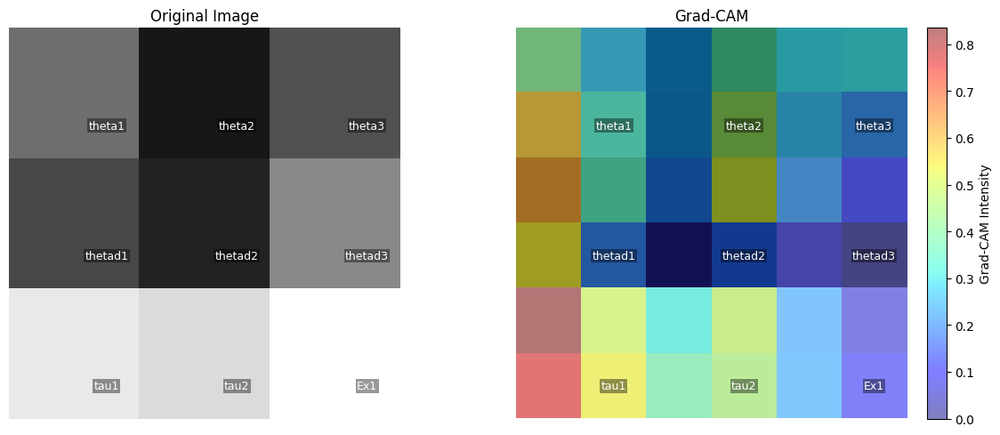

In [68]:
i = 4  # index of the image you want to explain
heatmap = grad_cam_side_by_side(
    model=model,
    model_state=best_model_state,
    num_input=dataset["test_input"][i],
    img_input=dataset["test_img"][i],
    x_col=completed_x_col,
    coordinate=completed_coordinate,
    zoom=2
)

Computing Grad-CAM:   2%|▏         | 26/1639 [00:24<25:31,  1.05it/s]


KeyboardInterrupt: 

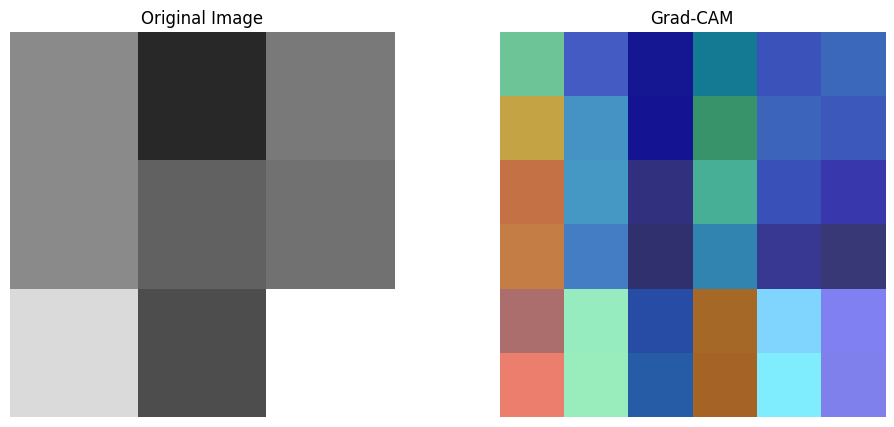

In [69]:
avg_scores = compute_avg_feature_relevance_from_val(
    model=model,
    model_state=best_model_state,
    val_inputs=dataset["test_input"],
    val_imgs=dataset["test_img"],
    coordinate=completed_coordinate,
    x_col=completed_x_col,
    zoom=2
)
plot_feature_relevance_bar(avg_scores)